In [ ]:
!pip install evaluate rouge_score langchain transformers huggingface_hub chromadb python-dotenv langchain-community torch ipywidgets sentence-transformers tf-keras nltk langchain_chroma langchain-anthropic

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.3/67.3 kB 5.5 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
INFO: pip is looking at multiple versions of tensorflow to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of opentelemetry-proto to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of opentelemetry-sdk to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.0/84.0 kB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 615.5/615.5 kB 43.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 76.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4

In [ ]:
import numpy as np
import pandas as pd
import os
import sys
from more_itertools import chunked
from transformers import AutoModelForSeq2SeqLM, AutoTokenizer, BlipProcessor, BlipForConditionalGeneration, pipeline, BartTokenizer, BartForConditionalGeneration
from langchain.embeddings import HuggingFaceEmbeddings
from langchain.vectorstores import Chroma as C_bart
from langchain.text_splitter import CharacterTextSplitter
from langchain.schema import Document
from langchain.llms import HuggingFacePipeline
from langchain_anthropic import ChatAnthropic
from langchain.chains import ConversationalRetrievalChain, RetrievalQA
from langchain_chroma import Chroma as C_anthropic
from langchain.prompts import PromptTemplate
from langchain.embeddings.base import Embeddings
from sentence_transformers import SentenceTransformer
import torch
from anthropic import Anthropic
from PIL import Image
import io
import nltk
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
import evaluate
from rouge_score import rouge_scorer
from tqdm import tqdm

In [ ]:
#Cloning dataset as requested
!git lfs install
!git clone https://huggingface.co/datasets/derek-thomas/ScienceQA

Git LFS initialized.
Cloning into 'ScienceQA'...
remote: Enumerating objects: 51, done.
remote: Total 51 (delta 0), reused 0 (delta 0), pack-reused 51 (from 1)
Unpacking objects: 100% (51/51), 114.94 KiB | 5.47 MiB/s, done.
Filtering content: 100% (3/3), 597.08 MiB | 35.81 MiB/s, done.


The embedding method below was tested with Anthropic

In [ ]:
embedding_model = SentenceTransformer('all-MiniLM-L6-v2')  #https://huggingface.co/sentence-transformers/all-MiniLM-L6-v2

# Define the embedding class
class SentenceTransformerEmbeddings(Embeddings):
    def __init__(self, model):
        self.model = model

    def embed_documents(self, texts):
        return self.model.encode(texts, convert_to_tensor=False).tolist()

    def embed_query(self, text):
        return self.model.encode([text], convert_to_tensor=False).tolist()[0]

# Initialize the embedding object
embedding_anthropic = SentenceTransformerEmbeddings(model=embedding_model)


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

This embedding method was tested with BART

In [ ]:
embedding_bart = HuggingFaceEmbeddings(model_name='sentence-transformers/all-MiniLM-L6-v2') #https://huggingface.co/sentence-transformers/all-MiniLM-L6-v2

<ipython-input-5-47d2fbf33ddc>:1: LangChainDeprecationWarning: The class `HuggingFaceEmbeddings` was deprecated in LangChain 0.2.2 and will be removed in 1.0. An updated version of the class exists in the :class:`~langchain-huggingface package and should be used instead. To use it run `pip install -U :class:`~langchain-huggingface` and import as `from :class:`~langchain_huggingface import HuggingFaceEmbeddings``.
  embedding_bart = HuggingFaceEmbeddings(model_name='sentence-transformers/all-MiniLM-L6-v2') #https://huggingface.co/sentence-transformers/all-MiniLM-L6-v2


In [ ]:
#Setting up the vector database using ChromaDB
persist_directory = 'chromadb/'
vectordb_anthropic = C_anthropic(persist_directory=persist_directory, embedding_function=embedding_anthropic)
vectordb_bart = C_bart(persist_directory=persist_directory, embedding_function=embedding_bart)

<ipython-input-6-f3409a882034>:4: LangChainDeprecationWarning: The class `Chroma` was deprecated in LangChain 0.2.9 and will be removed in 1.0. An updated version of the class exists in the :class:`~langchain-chroma package and should be used instead. To use it run `pip install -U :class:`~langchain-chroma` and import as `from :class:`~langchain_chroma import Chroma``.
  vectordb_bart = C_bart(persist_directory=persist_directory, embedding_function=embedding_bart)


In [ ]:
#Splitting up the dataset into Training, Validation, and Test sets
splits = {'train': 'data/train-00000-of-00001-1028f23e353fbe3e.parquet', 'validation': 'data/validation-00000-of-00001-6c7328ff6c84284c.parquet', 'test': 'data/test-00000-of-00001-f0e719df791966ff.parquet'}
df = pd.read_parquet("ScienceQA/" + splits["train"])
df_test = pd.read_parquet("ScienceQA/" + splits["test"])
df_validate = pd.read_parquet("ScienceQA/" + splits["validation"])
selected_cols = df[['question', 'choices', 'hint', 'task', 'grade','subject', 'topic', 'category', 'skill', 'lecture']]

In [ ]:
#Loading dataset into our vector database
documents = [Document(page_content=" ".join(row.dropna().astype(str))) for _, row in selected_cols.iterrows()]
text_splitter = CharacterTextSplitter(chunk_size=5000, chunk_overlap=100)
split_documents = text_splitter.split_documents(documents)

batch_size = 5000
for i in range(0, len(split_documents), batch_size):
    batch = split_documents[i:i + batch_size]
    vectordb_anthropic.add_documents(batch)
    vectordb_bart.add_documents(batch)

Next, we will define our two functions to run our selected models on our data.

First, we will define the function used by BART

In [ ]:
def ask_question_with_image_BART(rows, tokenizer, model, vectordb):
    q = rows['question']
    options = rows['choices']
    hint = rows['hint']
    task = rows['task']
    image = rows.get('image', None)

    #Process image to return caption as to allow Bart to gain context despite being pure text generation
    if image:
        processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base") #https://huggingface.co/Salesforce/blip-image-captioning-base
        model_blip = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base")
        image = Image.open(io.BytesIO(rows['image']['bytes']))
        inputs = processor(image, return_tensors="pt")
        out = model_blip.generate(**inputs)
        caption = processor.decode(out[0], skip_special_tokens=True)
        image_part = f"Image Context: {caption}"
    else:
        image_part = ""

    # Template must be kept small as Bart has a small context window
    template = f"""
    Context: {{context}}
    Question: {q}
    Choices: {options}
    Hint: {hint if hint else 'No hint provided'}

    Please choose the correct answer and provide a brief explanation.
    """
    input_variables = ["context", "question", "choices", "hint", "task"] + (["image_part"] if image_part else [])
    QA_CHAIN_PROMPT = PromptTemplate(input_variables=input_variables, template=template, verbose=True)

    # Retrieve relevant documents from ChromaDB
    retrieved_docs = vectordb.as_retriever().get_relevant_documents(q)
    context = " ".join([doc.page_content for doc in retrieved_docs])

    # Prepare input text for BART
    input_text = template.format(context=context)
    inputs = tokenizer(input_text, return_tensors="pt", max_length=1024, truncation=True)

    # Generate output from BART model
    summary_ids = model.generate(inputs["input_ids"], max_length=150, num_beams=2, early_stopping=True)
    answer = tokenizer.decode(summary_ids[0], skip_special_tokens=True)
    return answer

Next, we will define the function used by Anthropic

In [ ]:
anthropic_api_key = 'ENTER YOUR API KEY HERE'

In [ ]:
if anthropic_api_key is None:
    raise ValueError("Please set your ANTHROPIC_API_KEY in the environment variables.")

def ask_question_with_image_Anthropic(rows, llm, vectordb):
    q = rows['question']
    options = rows['choices']
    hint = rows['hint']
    task = rows['task']
    print('Question:', q)
    image = rows.get('image', None)
    print("Options:", options)

    if image:
        processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
        model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base")

        image = Image.open(io.BytesIO(rows['image']['bytes']))
        inputs = processor(image, return_tensors="pt")

        out = model.generate(**inputs)
        caption = processor.decode(out[0], skip_special_tokens=True)
        print("Caption:", caption)

        image_part = f"Image Context: {caption}"
    else:
        image_part = ""

    template = f"""Use the following context retrieved from similar training data to answer the question. Base your answer solely on this context.
Provide your answer:
Explain how you arrived at the answer based on the context.

Please keep your reasoning concise.

**Information Provided:**
Context: {{context}}
Question: {q}
Choices: {options}
{image_part}
Hint: {hint}
Task: {task}
Helpful Answer: [Your answer here]
"""

    input_variables = ["context", "question", "choices", "hint", "task"] + (["image_part"] if image_part else [])
    from langchain.prompts import PromptTemplate
    QA_CHAIN_PROMPT = PromptTemplate(input_variables=input_variables, template=template, verbose=True)
    llm.temperature = 0.1

    retriever = vectordb.as_retriever()
    retrieved_docs = retriever.get_relevant_documents(q)

    from langchain.chains import RetrievalQA
    qa_chain = RetrievalQA.from_chain_type(
        llm,
        retriever=retriever,
        return_source_documents=True,
        chain_type_kwargs={"prompt": QA_CHAIN_PROMPT}
    )

    result = qa_chain({"query": q, "context": retrieved_docs, "question": q, "choices": options, "hint": hint, "task": task})
    print(result)

    return result["result"]

The structure of both functions is very similar. However, Anthropic is able to handle a much larger context window and therefore can have a more specialised prompt

Next, we will initialise both models

In [ ]:
#BART
model_name = "facebook/bart-large" #https://huggingface.co/facebook/bart-large
tokenizer = BartTokenizer.from_pretrained(model_name)
model = BartForConditionalGeneration.from_pretrained(model_name)

#Anthropic
llm = ChatAnthropic(model="claude-3-5-haiku-20241022", anthropic_api_key=anthropic_api_key)

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.63k [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


pytorch_model.bin:   0%|          | 0.00/1.02G [00:00<?, ?B/s]

Before run, we will load the metrics needed to calculate our BLEU and Rouge scores

In [ ]:
nltk.download('punkt')
rouge = evaluate.load('rouge')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


For testing purposes, we use a subset of 500 questions.

In [ ]:
df_validate_subset = df_validate.iloc[:500]
df_test_subset = df_test.iloc[:500]
validate_df_sample_500 = df_validate.iloc[:500]
test_df_sample_500 = df_test.iloc[:500]

We will now evaluate Anthropics performance and store it in a df_sample_500 Dataframe

First we will calculate the BLEU score for the validate subset

In [ ]:
# Initialize a list to store generated answers
generated_answers = []

# Loop through the samples and generate answers
for idx, row in tqdm(validate_df_sample_500.iterrows(), total=validate_df_sample_500.shape[0]):
    try:
        # Call the ask_question_with_image function
        answer = ask_question_with_image_Anthropic(row, llm, vectordb_anthropic)
        # Append the generated answer to the list
        generated_answers.append(answer)
    except Exception as e:
        print(f"Error processing row {idx}: {e}")
        generated_answers.append(None)  # Handle errors gracefully

# Add the generated answers to the DataFrame
validate_df_sample_500['generated_answer'] = generated_answers

# Ensure that the 'answer' column exists in your validation DataFrame
if 'answer' not in validate_df_sample_500.columns:
    raise ValueError("The 'answer' column is missing from the validation DataFrame.")

# Calculate BLEU scores
smoothie = SmoothingFunction().method4
bleu_scores = []

for idx, row in validate_df_sample_500.iterrows():
    reference = [nltk.word_tokenize(str(row['solution']))]
    candidate = nltk.word_tokenize(str(row['generated_answer']))
    score = sentence_bleu(reference, candidate, smoothing_function=smoothie)
    bleu_scores.append(score)

# Add BLEU scores to the DataFrame
validate_df_sample_500['bleu_score'] = bleu_scores

  0%|          | 0/500 [00:00<?, ?it/s]<ipython-input-11-104bafcaddf7>:50: LangChainDeprecationWarning: The method `BaseRetriever.get_relevant_documents` was deprecated in langchain-core 0.1.46 and will be removed in 1.0. Use :meth:`~invoke` instead.
  retrieved_docs = retriever.get_relevant_documents(q)
<ipython-input-11-104bafcaddf7>:60: LangChainDeprecationWarning: The method `Chain.__call__` was deprecated in langchain 0.1.0 and will be removed in 1.0. Use :meth:`~invoke` instead.
  result = qa_chain({"query": q, "context": retrieved_docs, "question": q, "choices": options, "hint": hint, "task": task})


Question: What does the verbal irony in this text suggest?
According to Mr. Herrera's kids, his snoring is as quiet as a jackhammer.
Options: ['The snoring is loud.' 'The snoring occurs in bursts.']


  0%|          | 1/500 [00:03<29:27,  3.54s/it]

{'query': "What does the verbal irony in this text suggest?\nAccording to Mr. Herrera's kids, his snoring is as quiet as a jackhammer.", 'context': [Document(metadata={}, page_content="What does the verbal irony in this text suggest?\nAccording to Mr. Brock's kids, his snoring is as quiet as a jackhammer. ['The snoring is subtle.' 'The snoring is loud.']  closed choice grade10 language science figurative-language Literary devices Interpret figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nVerbal irony involves saying one thing but implying something very different. People often use verbal irony when they are being sarcastic.\nOlivia seems thrilled that her car keeps breaking down.\nEach breakdown is as enjoyable as a punch to the face."), Document(metadata={}, page_content="What does the verbal irony in this text suggest?\nAccording to Mr. Brock's kids, his snoring is as quiet as a jackhamm

preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a fish with a long nose


  0%|          | 2/500 [00:18<1:27:25, 10.53s/it]

{'query': "Which animal's mouth is also adapted for bottom feeding?", 'context': [Document(metadata={}, page_content="Which animal's mouth is also adapted for bottom feeding? ['emperor angelfish' 'spotted eagle ray'] Leopard sharks eat organisms such as crabs, shrimp, and fish. They are bottom feeders. Bottom feeders find their food at the bottom of rivers, lakes, and the ocean.\nThe 's mouth is located on the underside of its head and points downward. Its mouth is adapted for bottom feeding.\nFigure: leopard shark. closed choice grade5 natural science biology Adaptations Animal adaptations: beaks, mouths, and necks An adaptation is an inherited trait that helps an organism survive or reproduce. Adaptations can include both body parts and behaviors.\nThe shape of an animal's mouth is one example of an adaptation. Animals' mouths can be adapted in different ways. For example, a large mouth with sharp teeth might help an animal tear through meat. A long, thin mouth might help an animal c

  1%|          | 3/500 [00:21<57:16,  6.92s/it]  

{'query': 'Is this a sentence fragment?\nDuring the construction of Mount Rushmore, approximately eight hundred million pounds of rock from the mountain to create the monument.', 'context': [Document(metadata={}, page_content="Which figure of speech is used in this text?\nThe archaeologists believe that the bones they found are about fourteen thousand years old, but we won't have an exact estimate until the laboratory tests are complete. ['euphemism' 'oxymoron']  closed choice grade12 language science figurative-language Literary devices Classify the figure of speech: euphemism, hyperbole, oxymoron, paradox Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nA euphemism is a polite or indirect expression that is used to de-emphasize an unpleasant topic.\nThe head of Human Resources would never refer to firing people, only to laying them off.\nHyperbole is an obvious exaggeration that is not meant to be taken l

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a person in a lab


  1%|          | 4/500 [00:28<55:39,  6.73s/it]

{'query': "Which of the following could Wendy's test show?", 'context': [Document(metadata={}, page_content='What can Liz and Pedro trade to each get what they want? ["Pedro can trade his broccoli for Liz\'s oranges."\n "Liz can trade her tomatoes for Pedro\'s carrots."\n "Pedro can trade his almonds for Liz\'s tomatoes."\n "Liz can trade her tomatoes for Pedro\'s broccoli."] Trade happens when people agree to exchange goods and services. People give up something to get something else. Sometimes people barter, or directly exchange one good or service for another.\nLiz and Pedro open their lunch boxes in the school cafeteria. Neither Liz nor Pedro got everything that they wanted. The table below shows which items they each wanted:\n\nLook at the images of their lunches. Then answer the question below.\nLiz\'s lunch Pedro\'s lunch closed choice grade8 social science economics Basic economic principles Trade and specialization'), Document(metadata={}, page_content="What is the name of the

  1%|          | 5/500 [00:32<49:53,  6.05s/it]

{'query': 'Which correctly shows the title of a play?', 'context': [Document(metadata={}, page_content='Which correctly shows the title of a play? [\'"The Robbers Break In"\' \'***The Robbers Break In***\']  closed choice grade3 language science punctuation Formatting Formatting titles The title of a book, movie, play, TV show, magazine, or newspaper should be in italics. If you write it by hand, it can be underlined instead.\nA Midsummer Night\'s Dream\nThe title of a poem, song, or article should be in quotation marks.\n"You Are My Sunshine"'), Document(metadata={}, page_content='Which correctly shows the title of a play? [\'"The Robbers Break In"\' \'***The Robbers Break In***\']  closed choice grade3 language science punctuation Formatting Formatting titles The title of a book, movie, play, TV show, magazine, or newspaper should be in italics. If you write it by hand, it can be underlined instead.\nA Midsummer Night\'s Dream\nThe title of a poem, song, or article should be in quota

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a city is a large city in the middle of the united states


  1%|          | 6/500 [00:40<54:40,  6.64s/it]

{'query': 'Does this passage describe the weather or the climate?', 'context': [Document(metadata={}, page_content="Does this passage describe the weather or the climate? ['climate' 'weather'] Figure: Blue Nile Falls.\nBlue Nile Falls is in Ethiopia. West winds carried mist from the falls across the forest this morning.\nHint: Weather is what the atmosphere is like at a certain place and time. Climate is the pattern of weather in a certain place. closed choice grade4 natural science earth-science Weather and climate Weather and climate around the world The atmosphere is the layer of air that surrounds Earth. Both weather and climate tell you about the atmosphere.\nWeather is what the atmosphere is like at a certain place and time. Weather can change quickly. For example, the temperature outside your house might get higher throughout the day.\nClimate is the pattern of weather in a certain place. For example, summer temperatures in New York are usually higher than winter temperatures.")

  1%|▏         | 7/500 [00:43<45:28,  5.54s/it]

{'query': "Based on this information, what is Daffodil's phenotype for the horns trait?", 'context': [Document(metadata={}, page_content="Based on this information, what is Major's phenotype for the horns trait? ['not having horns' 'having horns'] In a group of cows, some individuals have horns and others do not. In this group, the gene for the horns trait has two alleles. The allele for not having horns (H) is dominant over the allele for having horns (h).\nMajor is a cow from this group. Major has the homozygous genotype HH for the horns gene. closed choice grade8 natural science biology Genes to traits Genetics vocabulary: dominant and recessive All organisms have pieces of hereditary material called genes, which are passed from parents to offspring. Genes contain instructions for building the parts of an organism. An organism's genes affect its observable traits, including its appearance, its behavior, and which diseases it may have. Genes may have different alleles, or forms, that

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a bald eagle with a fish in its talon


  2%|▏         | 8/500 [00:50<48:35,  5.93s/it]

{'query': "Which animal's feet are also adapted for grabbing prey?", 'context': [Document(metadata={}, page_content="Which animal's feet are also adapted for grabbing prey? ['common buzzard' 'white rhinoceros'] Ospreys eat fish, mammals, and other birds. The 's feet are adapted to grab prey.\nFigure: osprey. closed choice grade4 natural science biology Adaptations Animal adaptations: feet and limbs An adaptation is an inherited trait that helps an organism survive or reproduce. Adaptations can include both body parts and behaviors.\nThe shape of an animal's feet is one example of an adaptation. Animals' feet can be adapted in different ways. For example, webbed feet might help an animal swim. Feet with thick fur might help an animal walk on cold, snowy ground."), Document(metadata={}, page_content="Which animal's feet are also adapted for grabbing prey? ['common buzzard' 'white rhinoceros'] Ospreys eat fish, mammals, and other birds. The 's feet are adapted to grab prey.\nFigure: ospre

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the ph ph chart for ph ph ph ph ph ph ph ph ph ph ph ph ph ph


  2%|▏         | 9/500 [00:57<50:29,  6.17s/it]

{'query': "Is the following statement about our solar system true or false?\nJupiter's volume is more than 10,000 times as large as the volume of Mars.", 'context': [Document(metadata={}, page_content="Is the following statement about our solar system true or false?\nJupiter's volume is more than 1,000 times as great as Earth's volume. ['true' 'false'] Use the data to answer the question below. true-or false grade6 natural science earth-science Astronomy Analyze data to compare properties of planets A planet's volume tells you the size of the planet.\nThe primary composition of a planet is what the planet is made mainly of. In our solar system, planets are made mainly of rock, gas, or ice."), Document(metadata={}, page_content="Is the following statement about our solar system true or false?\nJupiter's volume is more than 1,000 times as great as Earth's volume. ['true' 'false'] Use the data to answer the question below. true-or false grade6 natural science earth-science Astronomy Analy

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


  2%|▏         | 10/500 [01:05<54:53,  6.72s/it]

{'query': 'What is the capital of Massachusetts?', 'context': [Document(metadata={}, page_content="What is the capital of Massachusetts? ['Concord' 'Cambridge' 'Boston' 'Missoula']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Massachusetts? ['Concord' 'Cambridge' 'Boston' 'Missoula']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Massachusetts? ['Boston' 'Augusta' 'Cambridge' 'Plymouth']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Massachusetts? ['Boston' 'Augusta' 'Cambridge' 'Plymouth']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast")], 'question': 'What is the capital of Mass

  2%|▏         | 11/500 [01:08<46:15,  5.68s/it]

{'query': "Complete the sentence so that it uses personification.\nA light spattering of raindrops fell upon the stadium, () the fans' cheeks.", 'context': [Document(metadata={}, page_content="Complete the sentence so that it uses personification.\nThe broken-down car () oil onto the concrete driveway. ['bled' 'leaked']  closed choice grade10 language science writing-strategies Creative techniques Use personification Personification is giving human characteristics to nonhuman things. It is a figure of speech that can be used to make writing more interesting or to emphasize a point.\nThe trees danced in the wind.\nThe word danced describes the trees as if they were people. Unlike people, however, trees can't actually dance. Instead, the personification suggests that the trees are moving."), Document(metadata={}, page_content="Complete the sentence so that it uses personification.\nThe broken-down car () oil onto the concrete driveway. ['bled' 'leaked']  closed choice grade10 language sc

  2%|▏         | 12/500 [01:11<38:50,  4.78s/it]

{'query': "Complete the sentences.\nEarthquakes start () Earth's surface. During an earthquake, ().", 'context': [Document(metadata={}, page_content="Which change best matches the sentence?\nA large amount of soil and rock quickly rolls down a hillside. ['meteorite crash' 'landslide' 'deposition']  closed choice grade3 natural science earth-science Earth events Classify changes to Earth's surface II"), Document(metadata={}, page_content="Which is a run-on sentence? ['Tracy is from Dover now she lives in Ashland.'\n 'The explorers nervously entered the dark cave.']  closed choice grade3 language science writing-strategies Sentences, fragments, and run-ons Is it a complete sentence or a run-on? A sentence is a group of words that forms a complete thought. It has both a subject and a verb.\nMy friends walk along the path.\nA run-on sentence is made up of two sentences that are joined without end punctuation or with just a comma.\nI knocked on the door it opened.\nIt started raining, we ra

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a group of mushrooms


  3%|▎         | 13/500 [01:16<40:34,  5.00s/it]

{'query': 'Is Lithops bromfieldii made up of many cells?', 'context': [Document(metadata={}, page_content="Which of the following statements is true? ['Each bryum moss cell is so small that it can be seen only with the help of a microscope.'\n 'The organism shown in the micrograph is made up of cells, but the organism in the photograph is not.'\n 'Each bryum moss cell is over 0.37 millimeters long.'] Look at the images and read the text. Then, answer the question.\n\nFigure 1: a photograph of bryum moss.\nThis image is a photograph of a plant called bryum moss. The photograph was taken with an ordinary camera. It shows what you would see if you looked at bryum moss closely.\n\nFigure 2: a micrograph of bryum moss.\nThis image also shows bryum moss. The image is a micrograph, which is a magnified picture taken with the aid of a microscope. The magnified image shows a section of the plant that is only 0.37 millimeters long!\nThe micrograph shows that the plant is made up of small, simila

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a bird with a very long beak


  3%|▎         | 14/500 [01:23<45:00,  5.56s/it]

{'query': "Which bird's beak is also adapted to tear through meat?", 'context': [Document(metadata={}, page_content="Which bird's beak is also adapted to tear through meat? ['cassowary' 'California condor'] s are scavengers. They find and eat the bodies of dead animals. The shape of the 's beak is adapted to tear through meat.\nFigure: Cape vulture. closed choice grade4 natural science biology Adaptations Animal adaptations: beaks, mouths, and necks An adaptation is an inherited trait that helps an organism survive or reproduce. Adaptations can include both body parts and behaviors.\nThe shape of a bird's beak is one example of an adaptation. Birds' beaks can be adapted in different ways. For example, a sharp hooked beak might help a bird tear through meat easily. A short, thick beak might help a bird break through a seed's hard shell. Birds that eat similar food often have similar beaks."), Document(metadata={}, page_content="Which bird's beak is also adapted to tear through meat? ['c

  3%|▎         | 15/500 [01:27<40:07,  4.96s/it]

{'query': 'Which figure of speech is used in this text?\nAriel gazed at the ancient pug that seemed to sleep all day and noted, "You\'re an energetic puppy!"', 'context': [Document(metadata={}, page_content='Which figure of speech is used in this text?\nMaya gazed at the ancient pug that seemed to sleep all day and noted, "You\'re an energetic puppy!" [\'verbal irony\' \'pun\']  closed choice grade7 language science figurative-language Literary devices Classify figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nAlliteration is the repetition of sounds at the beginning of nearby words.\nWhat a lucky little lady you are!\nAn allusion is a brief reference to something or someone well known, often from history or literature.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.\nAn idiom is an expression that cannot be understood literally. Its meaning must be learned.\nThe assign

  3%|▎         | 16/500 [01:29<34:30,  4.28s/it]

{'query': 'What is the source of the allusion in the sentence below?\nMichael dropped out of college to travel the world, but a year later, the prodigal son returned home and re-enrolled.', 'context': [Document(metadata={}, page_content='What is the source of the allusion in the sentence below?\nWalter dropped out of college to travel the world, but a year later, the prodigal son returned home and re-enrolled. [\'the Bible\' \'British history\']  closed choice grade8 language science figurative-language Literary devices Recall the source of an allusion An allusion is a brief mention of something or someone well known, often from mythology, history, or literature. An allusion lets you reference ideas from an entire story in just a few words.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.\nHere, Lila alludes to the fairy tale "Cinderella," in which Cinderella must leave the ball before the coach that brought her transforms into a pumpkin. The allusion shows that Lil

  3%|▎         | 17/500 [01:33<32:04,  3.98s/it]

{'query': "What is the volume of a car's gas tank?", 'context': [Document(metadata={}, page_content="What is the volume of a car's gas tank? ['37 liters' '37 milliliters'] Select the better estimate. closed choice grade4 natural science units-and-measurement Units and measurement Choose metric units of volume Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nVolume is a measurement of how much space something takes up.\nThere are many different units of volume. When you are using metric units, volume may be written in units of milliliters or liters.\nThere are 1,000 milliliters in 1 liter. So, 1 milliliter is much less than 1 liter.\nA raindrop has a volume of about 20 milliliters, while a large soda bottle has a volume of 2 liters. The flask shown here measures volumes up to 500 milliliters."), Document(metadata={}, page_content="What is the volume of a car's gas tank? ['37 liters' '37 milliliters'] Select t

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


  4%|▎         | 18/500 [01:39<37:41,  4.69s/it]

{'query': 'Which of these states is farthest north?', 'context': [Document(metadata={}, page_content="Which of these states is farthest north? ['Arkansas' 'Nevada' 'New Mexico' 'Georgia']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal directions. A compass rose usually shows only the first letter of each cardinal direction.\nThe north arrow points to the North Pole. On most maps, north is at the top of the map."), Document(metadata={}, page_content="Which of these states is farthest north? ['Arkansas' 'Nevada' 'New Mexico' 'Georgia']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal d

  4%|▍         | 19/500 [01:43<35:24,  4.42s/it]

{'query': 'What information supports the conclusion that Austen acquired this trait?', 'context': [Document(metadata={}, page_content="What information supports the conclusion that Jamie acquired this trait? ['Jamie can cook food over a fire.'\n 'Jamie learned how to build a fire at summer camp.'] Read the description of a trait.\nJamie knows how to build a fire. closed choice grade5 natural science biology Traits and heredity Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person's life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment."), Document(metadata={}, page_conten

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a set of four different types of shorts


  4%|▍         | 20/500 [01:50<41:14,  5.16s/it]

{'query': 'Which property do these three objects have in common?', 'context': [Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how an object will behave when something happens to it.\nDifferent objects can have properties in common. You can use these properties to put objects into groups."), Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how a

  4%|▍         | 21/500 [01:53<36:30,  4.57s/it]

{'query': 'Which of the following is true about seeds?', 'context': [Document(metadata={}, page_content="Is the following statement true or false?\nPlant cells do not have chloroplasts. ['false' 'true']  true-or false grade4 natural science biology Cells Cell part functions: true or false"), Document(metadata={}, page_content="Is the following statement true or false?\nPlant cells do not have chloroplasts. ['false' 'true']  true-or false grade4 natural science biology Cells Cell part functions: true or false"), Document(metadata={}, page_content="Is the following statement true or false?\nThe cytoplasm of a plant cell is made mostly of water. ['true' 'false']  true-or false grade4 natural science biology Cells Cell part functions: true or false"), Document(metadata={}, page_content="Is the following statement true or false?\nThe cytoplasm of a plant cell is made mostly of water. ['true' 'false']  true-or false grade4 natural science biology Cells Cell part functions: true or false")], 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a wooden toy with a wooden handle


  4%|▍         | 22/500 [02:00<41:46,  5.24s/it]

{'query': "Identify the question that Tyrone and Quincy's experiment can best answer.", 'context': [Document(metadata={}, page_content="Identify the question that Sasha's experiment can best answer. ['Does the amount of water in a glass affect whether eggs sink or float in the water?'\n 'Are eggs more likely to float in fresh water or salty water?'] The passage below describes an experiment. Read the passage and then follow the instructions below.\n\nSasha poured four ounces of water into each of six glasses. Sasha dissolved one tablespoon of salt in each of three glasses, and did not add salt to the other three. Then, Sasha placed an egg in one glass and observed if the egg floated. She removed the egg and dried it. She repeated the process with the other five glasses, recording each time if the egg floated. Sasha repeated this test with two more eggs and counted the number of times the eggs floated in fresh water compared to salty water.\nFigure: an egg floating in a glass of salty w

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a fish with its mouth open


  5%|▍         | 23/500 [02:06<43:50,  5.52s/it]

{'query': "Which animal's mouth is also adapted for bottom feeding?", 'context': [Document(metadata={}, page_content="Which animal's mouth is also adapted for bottom feeding? ['emperor angelfish' 'spotted eagle ray'] Leopard sharks eat organisms such as crabs, shrimp, and fish. They are bottom feeders. Bottom feeders find their food at the bottom of rivers, lakes, and the ocean.\nThe 's mouth is located on the underside of its head and points downward. Its mouth is adapted for bottom feeding.\nFigure: leopard shark. closed choice grade5 natural science biology Adaptations Animal adaptations: beaks, mouths, and necks An adaptation is an inherited trait that helps an organism survive or reproduce. Adaptations can include both body parts and behaviors.\nThe shape of an animal's mouth is one example of an adaptation. Animals' mouths can be adapted in different ways. For example, a large mouth with sharp teeth might help an animal tear through meat. A long, thin mouth might help an animal c

  5%|▍         | 24/500 [02:09<38:30,  4.85s/it]

{'query': 'What is the temperature of the air on a cold, rainy day?', 'context': [Document(metadata={}, page_content="What is the temperature of the air on a cold, rainy day? ['40°F' '40°C'] Select the better estimate. closed choice grade6 natural science units-and-measurement Units and measurement Estimate temperatures Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nTemperature can be written with units of degrees Fahrenheit (°F) or Celsius (°C). Use the list below to compare the two units.\n212°F | Water boils | 100°C\n98.6°F | Body temperature | 37°C\n68°F | Room temperature | 20°C\n32°F | Water freezes | 0°C"), Document(metadata={}, page_content="What is the temperature of the air on a cold, rainy day? ['40°F' '40°C'] Select the better estimate. closed choice grade6 natural science units-and-measurement Units and measurement Estimate temperatures Measurements are written with both a number and a unit. T

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: lime and limes


  5%|▌         | 25/500 [02:15<40:53,  5.17s/it]

{'query': 'Which property do these two objects have in common?', 'context': [Document(metadata={}, page_content="Which property do these two objects have in common? ['bouncy' 'yellow'] Select the better answer. closed choice grade2 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells.\nDifferent objects can have the same properties. You can use these properties to put objects into groups."), Document(metadata={}, page_content="Which property do these two objects have in common? ['bouncy' 'yellow'] Select the better answer. closed choice grade2 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells.\nDifferent objects can have the same properties. You can use these properties to put objects into groups."), Document(metadata={}, page_content="Which

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a diagram of the life cycle of a bear, bear, and ant ant


  5%|▌         | 26/500 [02:23<47:41,  6.04s/it]

{'query': 'Based on the arrows, which of the following organisms is a consumer?', 'context': [Document(metadata={}, page_content="Based on the arrows, which of the following organisms is a consumer? ['bilberry' 'earthworm'] Below is a food web from a tundra ecosystem in Nunavut, a territory in Northern Canada.\nA food web models how the matter eaten by organisms moves through an ecosystem. The arrows in a food web represent how matter moves between organisms in an ecosystem. closed choice grade4 natural science biology Ecosystems Interpret food webs A food web is a model.\nA food web shows where organisms in an ecosystem get their food. Models can make things in nature easier to understand because models can represent complex things in a simpler way. If a food web showed every organism in an ecosystem, the food web would be hard to understand. So, each food web shows how some organisms in an ecosystem can get their food.\nArrows show how matter moves.\nA food web has arrows that point 

  5%|▌         | 27/500 [02:27<42:02,  5.33s/it]

{'query': 'Compare the motion of three ships. Which ship was moving at the lowest speed?', 'context': [Document(metadata={}, page_content="Compare the motion of three ships. Which ship was moving at the lowest speed? ['a ship that moved 310miles east in 10hours'\n 'a ship that moved 265miles east in 10hours'\n 'a ship that moved 145miles north in 10hours']  closed choice grade3 natural science physics Force and motion Compare the speeds of moving objects An object's speed tells you how fast the object is moving. Speed depends on both distance and time.\nDistance tells you how far the object has moved. One unit used to measure distance is the mile.\nTime tells you how long the object has spent moving. One unit used to measure time is the hour.\nThink about objects moving for the same amount of time. The object that is moving the slowest will go the shortest distance in that time. It is moving at the lowest speed."), Document(metadata={}, page_content="Compare the motion of three ships. 

  6%|▌         | 28/500 [02:31<38:15,  4.86s/it]

{'query': "Based on this information, what is Sasha's phenotype for the fur length trait?", 'context': [Document(metadata={}, page_content="Based on this information, what is Rascal's phenotype for the fur length trait? ['short fur' 'long fur'] In a group of cats, some individuals have short fur and others have long fur. In this group, the gene for the fur length trait has two alleles. The allele for short fur (F) is dominant over the allele for long fur (f).\nRascal is a cat from this group. Rascal has the homozygous genotype ff for the fur length gene. closed choice grade6 natural science biology Genes to traits Genetics vocabulary: dominant and recessive All organisms have pieces of hereditary material called genes, which are passed from parents to offspring. Genes contain instructions for building the parts of an organism. An organism's genes affect its observable traits, including its appearance, its behavior, and which diseases it may have. Genes may have different alleles, or fo

  6%|▌         | 29/500 [02:35<37:12,  4.74s/it]

{'query': 'Which is a compound sentence?', 'context': [Document(metadata={}, page_content="Which is a compound sentence? ['After dinner I brush my teeth very carefully.'\n 'The train conductor will take your tickets, or his helper will.']  closed choice grade3 language science grammar Sentences, fragments, and run-ons Is the sentence simple or compound? A simple sentence is a sentence with only one subject and predicate.\nThe pitcher threw the ball to first base.\nA compound sentence is two simple sentences joined by a comma and a conjunction such as and, but, or, or so.\nThe pitcher threw the ball, and the batter hit it.\nSome simple sentences have a compound subject or a compound predicate, but they are not compound sentences.\nAnna and James will watch the fireworks tonight.\nThis simple sentence has a compound subject, Anna and James.\nThe singers bowed and walked off the stage.\nThis simple sentence has a compound predicate, bowed and walked off the stage.\nSome simple sentences h

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the four squares are arranged in a grid


  6%|▌         | 30/500 [02:41<40:09,  5.13s/it]

{'query': 'What is the expected ratio of offspring with black eyes to offspring with red eyes? Choose the most likely ratio.', 'context': [Document(metadata={}, page_content="What is the expected ratio of offspring with brown eyes to offspring with red eyes? Choose the most likely ratio. ['3:1' '1:3' '2:2' '4:0' '0:4'] In a group of guinea pigs, some individuals have brown eyes and others have red eyes. In this group, the gene for the eye color trait has two alleles. The allele for brown eyes (E) is dominant over the allele for red eyes (e).\nThis Punnett square shows a cross between two guinea pigs. closed choice grade8 natural science biology Genes to traits Use Punnett squares to calculate ratios of offspring types Offspring phenotypes: dominant or recessive?\nHow do you determine an organism's phenotype for a trait? Look at the combination of alleles in the organism's genotype for the gene that affects that trait. Some alleles have types called dominant and recessive. These two typ

  6%|▌         | 31/500 [02:45<35:54,  4.59s/it]

{'query': 'The shopper lifts each bag at the same speed. Which bag is lifted with a larger force?', 'context': [Document(metadata={}, page_content="The shopper lifts each bag at the same speed. Which bag is lifted with a larger force? ['a bag holding 6 pounds of food' 'a bag holding 3 pounds of food'] A shopper is buying food at the store. He fills two shopping bags. The shopping bags are the same size and shape. closed choice grade2 natural science physics Force and motion How do mass and force affect motion? A force is a push or a pull.\nA force can make an object start moving or stop an object that is moving. A force can also make an object speed up, slow down, or change direction.\nForces can be different sizes.\nThink about trying to move a heavy object and a light object. Imagine you want to move them at the same speed. You will need to use a larger force to move the heavy object."), Document(metadata={}, page_content="The shopper lifts each bag at the same speed. Which bag is li

  6%|▋         | 32/500 [02:48<33:35,  4.31s/it]

{'query': 'What information supports the conclusion that Rosa inherited this trait?', 'context': [Document(metadata={}, page_content='What information supports the conclusion that Rosanne inherited this trait? [\'Rosanne and her father both have dark hair.\'\n "Rosanne\'s parents have dark skin. They passed down this trait to Rosanne."] Read the description of a trait.\nRosanne has dark skin. closed choice grade5 natural science biology Traits and heredity Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person\'s life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment.'), Do

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a person skiing down a snowy hill


  7%|▋         | 33/500 [02:54<37:03,  4.76s/it]

{'query': "Identify the question that Reba and Donald's experiment can best answer.", 'context': [Document(metadata={}, page_content="Identify the question that Abby's experiment can best answer. ['Does fabric turn darker when soaked in a mixture of black dye and water for 15 minutes compared to 30 minutes?'\n 'Does linen fabric turn darker than cotton fabric when soaked in a mixture of black dye and water?'] The passage below describes an experiment. Read the passage and then follow the instructions below.\n\nAbby prepared ten buckets, each with one gallon of boiling water and three tablespoons of black fabric dye. Abby soaked white linen fabric squares in five of the buckets, and white cotton fabric squares in the other five buckets. All of the fabric squares were soaked for 15 minutes. After the fabric dried, Abby scored the darkness of the squares on a scale from light to dark. She compared the darkness of the linen fabric to the darkness of the cotton fabric.\nFigure: fabric that 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a skeleton with the bones highlighted


  7%|▋         | 34/500 [03:00<40:25,  5.20s/it]

{'query': 'Which term matches the picture?', 'context': [Document(metadata={}, page_content="Which term matches the picture? ['bilateral symmetry' 'radial symmetry'] Read the text.\nIf something has bilateral symmetry, you can draw a line from top to bottom and both sides of the line will match. For example, if you drew a line down the center of someone's face, both sides would have one eye, half a nose, and half a mouth. If you drew a line in the middle from left to right, however, the two sides would not match.\nRadial symmetry describes something that is symmetrical, or matching, all the way around. A daisy, and many other flowers, have radial symmetry. You could cut a daisy in half from top to bottom in many directions—down the middle or left to right—and the halves would match. closed choice grade6 language science vocabulary Context clues Determine the meaning of domain-specific words with pictures"), Document(metadata={}, page_content="Which term matches the picture? ['bilateral

  7%|▋         | 35/500 [03:03<35:09,  4.54s/it]

{'query': "Which logical fallacy is used in the text?\nDid you really vote for Richard as class treasurer? Didn't you hear that his uncle was imprisoned for embezzling $1.5 million?", 'context': [Document(metadata={}, page_content="Which logical fallacy is used in the text?\nMitch's definitely voting for the Conservative Party in the next election because he said there was no way he was voting for the Labour Party. ['appeal to nature: the assumption that natural things are always good'\n 'false dichotomy: an argument that presents only two choices when more options exist'\n 'false causation: the assumption that because two things happened together, one caused the other']  closed choice grade12 language science writing-strategies Developing and supporting arguments Classify logical fallacies A strong argument uses valid reasoning and logic in support of a claim. When an argument or claim introduces irrelevant information or misrepresents the issues at hand, it may be committing a logica

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a picture of a storm coming over a field


  7%|▋         | 36/500 [03:11<43:07,  5.58s/it]

{'query': 'Does this passage describe the weather or the climate?', 'context': [Document(metadata={}, page_content="Does this passage describe the weather or the climate? ['climate' 'weather'] Figure: Blue Nile Falls.\nBlue Nile Falls is in Ethiopia. West winds carried mist from the falls across the forest this morning.\nHint: Weather is what the atmosphere is like at a certain place and time. Climate is the pattern of weather in a certain place. closed choice grade4 natural science earth-science Weather and climate Weather and climate around the world The atmosphere is the layer of air that surrounds Earth. Both weather and climate tell you about the atmosphere.\nWeather is what the atmosphere is like at a certain place and time. Weather can change quickly. For example, the temperature outside your house might get higher throughout the day.\nClimate is the pattern of weather in a certain place. For example, summer temperatures in New York are usually higher than winter temperatures.")

  7%|▋         | 37/500 [03:15<38:12,  4.95s/it]

{'query': 'Complete the sentence.\nSalt and vinegar removing tarnish from a penny is a ().', 'context': [Document(metadata={}, page_content="Complete the sentence.\nA penny tarnishing is a (). ['chemical change' 'physical change']  closed choice grade3 natural science chemistry Physical and chemical change Identify physical and chemical changes Chemical changes and physical changes are two common ways matter can change.\nIn a chemical change, the type of matter changes. The types of matter before and after a chemical change are always different.\nBurning a piece of paper is a chemical change. When paper gets hot enough, it reacts with oxygen in the air and burns. The paper and oxygen change into ash and smoke.\nIn a physical change, the type of matter stays the same. The types of matter before and after a physical change are always the same.\nCutting a piece of paper is a physical change. The cut pieces are still made of paper.\nA change of state is a type of physical change. For examp

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the potar monastery in tibet


  8%|▊         | 38/500 [03:21<40:38,  5.28s/it]

{'query': 'Does this passage describe the weather or the climate?', 'context': [Document(metadata={}, page_content="Does this passage describe the weather or the climate? ['climate' 'weather'] Figure: Blue Nile Falls.\nBlue Nile Falls is in Ethiopia. West winds carried mist from the falls across the forest this morning.\nHint: Weather is what the atmosphere is like at a certain place and time. Climate is the pattern of weather in a certain place. closed choice grade4 natural science earth-science Weather and climate Weather and climate around the world The atmosphere is the layer of air that surrounds Earth. Both weather and climate tell you about the atmosphere.\nWeather is what the atmosphere is like at a certain place and time. Weather can change quickly. For example, the temperature outside your house might get higher throughout the day.\nClimate is the pattern of weather in a certain place. For example, summer temperatures in New York are usually higher than winter temperatures.")

  8%|▊         | 39/500 [03:24<35:12,  4.58s/it]

{'query': 'Would you find the word import on a dictionary page with the following guide words?\nill - industry', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nalready - anchor ['amuse' 'artist']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on."), Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nalready - anchor ['amuse' 'artist']  closed choice grade2 language science reference-skills Reference skills Use g

  8%|▊         | 40/500 [03:27<31:27,  4.10s/it]

{'query': 'What does the allusion in this text suggest?\nTyler seems to have the Midas touch. Without any special experience or training, he launched a thriving business and then established a well-respected charity.', 'context': [Document(metadata={}, page_content='What does the allusion in this text suggest?\nTrevor seems to have the Midas touch. Without any special experience or training, he launched a thriving business and then established a well-respected charity. [\'Trevor has a hands-on approach to his work.\'\n \'Trevor is successful at all that he does.\']  closed choice grade7 language science figurative-language Literary devices Interpret figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nAn allusion is a brief reference to something or someone well known, often from history or literature.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.'), Document(metadata={}

  8%|▊         | 41/500 [03:30<28:51,  3.77s/it]

{'query': 'Which is a complex sentence?', 'context': [Document(metadata={}, page_content='Which is a complex sentence? ["Mr. Long\'s afternoon lecture was about art and culture in Germany before World War II."\n \'Bobby prepared a receipt for the customer while Eddie packaged her items for her.\']  closed choice grade5 language science grammar Sentences, fragments, and run-ons Is the sentence simple, compound, or complex? A clause is a group of words that contains both a subject and a predicate.\nAn independent clause is a complete thought. It can stand alone as a sentence. A dependent clause is not a complete thought. It cannot stand alone as a sentence.\nthe oranges on our tree are ripe\nThe clause can stand alone. It is independent.\nafter we pick up Kevin from work\nThe clause cannot stand alone. It is dependent.\nA simple sentence is made up of a single independent clause.\nBen and I spent all day relaxing by the pool.\nSome simple sentences have introductory phrases, but the intr

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a table with the names of different types of rock


  8%|▊         | 42/500 [03:38<38:08,  5.00s/it]

{'query': "Is the following statement about our solar system true or false?\nThe volume of Mars is more than three times as large as Mercury's.", 'context': [Document(metadata={}, page_content="Is the following statement about our solar system true or false?\nThe volume of Mars is more than three times as large as Mercury's. ['true' 'false'] Use the data to answer the question below. true-or false grade6 natural science earth-science Astronomy Analyze data to compare properties of planets A planet's volume tells you the size of the planet.\nThe primary composition of a planet is what the planet is made mainly of. In our solar system, planets are made mainly of rock, gas, or ice."), Document(metadata={}, page_content="Is the following statement about our solar system true or false?\nThe volume of Mars is more than three times as large as Mercury's. ['true' 'false'] Use the data to answer the question below. true-or false grade6 natural science earth-science Astronomy Analyze data to com

  9%|▊         | 43/500 [03:41<34:38,  4.55s/it]

{'query': 'Which word does not rhyme?', 'context': [Document(metadata={}, page_content="Which word does not rhyme? ['haze' 'spot' 'maze']  closed choice grade1 language science phonological-awareness Rhyming Which word does not rhyme? Rhyming words are words that end with the same sound.\nThe words tip and slip rhyme. They both end with the ip sound.\nThe words lake and make rhyme. They both end with the ake sound.\nThe words tip and lake don't rhyme. They end with different sounds."), Document(metadata={}, page_content="Which word does not rhyme? ['haze' 'spot' 'maze']  closed choice grade1 language science phonological-awareness Rhyming Which word does not rhyme? Rhyming words are words that end with the same sound.\nThe words tip and slip rhyme. They both end with the ip sound.\nThe words lake and make rhyme. They both end with the ake sound.\nThe words tip and lake don't rhyme. They end with different sounds."), Document(metadata={}, page_content="Which word does not rhyme? ['case'

  9%|▉         | 44/500 [03:44<31:22,  4.13s/it]

{'query': 'Which greeting is correct for a letter?', 'context': [Document(metadata={}, page_content="Which greeting is correct for a letter? ['Dear Steven,' 'dear Steven,']  closed choice grade2 language science capitalization Capitalization Greetings and closings of letters A letter starts with a greeting and ends with a closing. For each one, capitalize the first word and end with a comma. You should also capitalize proper nouns, such as Aunt Sue.\nDear Aunt Sue,\nI'm glad you could come to my party, and\nthank you for the birthday gift. I could not have\nasked for a better one! Every time I see it, I think\nof you.\nWith love,\nRory"), Document(metadata={}, page_content="Which greeting is correct for a letter? ['Dear Steven,' 'dear Steven,']  closed choice grade2 language science capitalization Capitalization Greetings and closings of letters A letter starts with a greeting and ends with a closing. For each one, capitalize the first word and end with a comma. You should also capital

  9%|▉         | 45/500 [03:48<29:35,  3.90s/it]

{'query': 'What information supports the conclusion that Alec acquired this trait?', 'context': [Document(metadata={}, page_content="What information supports the conclusion that Alec acquired this trait? ['Alec learned biology by reading, observing, and experimenting.'\n 'Alec is most interested in human biology.'] Read the description of a trait.\nAlec knows a lot about biology. closed choice grade4 natural science biology Traits and heredity Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person's life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment."), Document(metada

  9%|▉         | 46/500 [03:52<31:32,  4.17s/it]

{'query': 'What does the verbal irony in this text suggest?\n"It was my good luck to have to study for a test while all my friends went to the water park," Noah remarked.', 'context': [Document(metadata={}, page_content='What does the verbal irony in this text suggest?\n"It was my good luck to have to study for a test while all my friends went to the water park," Leroy remarked. [\'Leroy was upset about staying home.\'\n \'Leroy wanted time to catch up on his responsibilities.\']  closed choice grade6 language science figurative-language Literary devices Interpret figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nVerbal irony involves saying one thing but implying something very different. People often use verbal irony when they are being sarcastic.\nOlivia seems thrilled that her car keeps breaking down.\nEach breakdown is as enjoyable as a punch to the face.'), Document(metadata={}, page_

  9%|▉         | 47/500 [03:55<28:00,  3.71s/it]

{'query': 'What do these two changes have in common?\ncooking a pancake\nrust forming on a bicycle frame', 'context': [Document(metadata={}, page_content="Based on this information, what is Franklin's phenotype for the coat pattern trait? ['solid coloring' 'Aa'] In a group of cows, some individuals have solid coloring and others have white spots. In this group, the gene for the coat pattern trait has two alleles. The allele A is for solid coloring, and the allele a is for white spots.\nFranklin, a cow from this group, has solid coloring. Franklin has one allele for solid coloring and one allele for white spots. closed choice grade7 natural science biology Genes to traits Genetics vocabulary: genotype and phenotype All organisms have pieces of hereditary material called genes, which are passed from parents to offspring. Genes contain instructions for building the parts of an organism. An organism's genes affect its observable traits, including its appearance, its behavior, and which dis

 10%|▉         | 48/500 [03:58<26:23,  3.50s/it]

{'query': 'Select the one animal that has all of the bird traits listed above.', 'context': [Document(metadata={}, page_content="Select the bird. ['woodpecker' 'green tree frog' 'African bullfrog' 'sea turtle']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['woodpecker' 'green tree frog' 'African bullfrog' 'sea turtle']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['manta ray' 'emerald hummingbird' 'grass frog' 'green iguana']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['manta r

 10%|▉         | 49/500 [04:01<25:49,  3.44s/it]

{'query': 'Does this passage describe the weather or the climate?\nIt got down to 3°C in Athens, Greece, last night!', 'context': [Document(metadata={}, page_content="Does this passage describe the weather or the climate? ['climate' 'weather'] Figure: Marseille.\nMarseille is a town on the southern coast of France. Cold winds from the north, called mistral winds, were blowing here last night.\nHint: Weather is what the atmosphere is like at a certain place and time. Climate is the pattern of weather in a certain place. closed choice grade5 natural science earth-science Weather and climate Weather and climate around the world The atmosphere is the layer of air that surrounds Earth. Both weather and climate tell you about the atmosphere.\nWeather is what the atmosphere is like at a certain place and time. Weather can change quickly. For example, the temperature outside your house might get higher throughout the day.\nClimate is the pattern of weather in a certain place. For example, summ

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a bird with a red head


 10%|█         | 50/500 [04:07<31:02,  4.14s/it]

{'query': 'Select the bird below.', 'context': [Document(metadata={}, page_content="Select the bird. ['manta ray' 'emerald hummingbird' 'grass frog' 'green iguana']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['manta ray' 'emerald hummingbird' 'grass frog' 'green iguana']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['woodpecker' 'green tree frog' 'African bullfrog' 'sea turtle']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['woodpecker' 'green tree frog' 'African bullfrog' 'sea

 10%|█         | 51/500 [04:10<28:39,  3.83s/it]

{'query': 'Which organizational structure does this text primarily use?', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nangle - assign ['architect' 'afford']  closed choice grade6 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on.\nIf one word is shorter, and there are no more letters to compare, then the shorter word comes first in alphabetical order. For example, be comes before bed."), Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide w

 10%|█         | 52/500 [04:14<28:00,  3.75s/it]

{'query': "Which logical fallacy is used in the text?\nDon't ever get a ride from Mariana. Her brother has been driving for only six months, and he's already gotten three speeding tickets.", 'context': [Document(metadata={}, page_content="Which logical fallacy is used in the text?\nDon't ever get a ride from Ava. Her brother has been driving for only six months, and he's already gotten three speeding tickets. ['guilt by association: a negative association intended to discredit someone or something'\n 'appeal to nature: the assumption that natural things are always good']  closed choice grade7 language science writing-strategies Developing and supporting arguments Classify logical fallacies A strong argument uses valid reasoning and logic in support of a claim. When an argument or claim introduces irrelevant information or misrepresents the issues at hand, it may be committing a logical fallacy. Logical fallacies can hurt a writer's credibility and can lead readers to draw false conclus

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a red and white parrot


 11%|█         | 53/500 [04:20<34:08,  4.58s/it]

{'query': "Which bird's beak is also adapted to crack large, hard nuts?", 'context': [Document(metadata={}, page_content="Which bird's beak is also adapted to crack large, hard nuts? ['northern mockingbird' 'hyacinth macaw'] Palm cockatoos eat large seeds and nuts. The shape of the 's beak is adapted to crack open large, hard nuts.\nFigure: palm cockatoo. closed choice grade4 natural science biology Adaptations Animal adaptations: beaks, mouths, and necks An adaptation is an inherited trait that helps an organism survive or reproduce. Adaptations can include both body parts and behaviors.\nThe shape of a bird's beak is one example of an adaptation. Birds' beaks can be adapted in different ways. For example, a sharp hooked beak might help a bird tear through meat easily. A short, thick beak might help a bird break through a seed's hard shell. Birds that eat similar food often have similar beaks."), Document(metadata={}, page_content="Which bird's beak is also adapted to crack large, har

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a branch with pine cones and pine cones


 11%|█         | 54/500 [04:27<39:47,  5.35s/it]

{'query': 'Complete the sentence.\n is what happens when pollen lands on a female cone.', 'context': [Document(metadata={}, page_content="Complete the sentence.\n is what happens when pollen lands on a female cone. ['Pollination' 'Fertilization' 'Photosynthesis'] Male cones make pollen. Wind can blow pollen from a male cone to a female cone. closed choice grade4 natural science biology Plants Describe and construct conifer life cycles Conifers are plants that grow cones. Conifers use their cones to reproduce, or make new plants like themselves. How do conifers use their cones to reproduce?\nConifers can grow male and female cones. Male cones make pollen, and female cones make eggs. Pollination is what happens when wind blows pollen from male cones onto female cones. After pollination, sperm from the pollen can combine with eggs. This is called fertilization. The fertilized eggs grow into seeds.\nThe seeds can fall out of the cones and land on the ground. When a seed lands on the ground

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the four types of the human body


 11%|█         | 55/500 [04:33<40:50,  5.51s/it]

{'query': 'Which property do these three objects have in common?', 'context': [Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how an object will behave when something happens to it.\nDifferent objects can have properties in common. You can use these properties to put objects into groups."), Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how a

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: ice cubes on a black background


 11%|█         | 56/500 [04:39<42:05,  5.69s/it]

{'query': 'Which term matches the picture?', 'context': [Document(metadata={}, page_content="Which term matches the picture? ['bilateral symmetry' 'radial symmetry'] Read the text.\nIf something has bilateral symmetry, you can draw a line from top to bottom and both sides of the line will match. For example, if you drew a line down the center of someone's face, both sides would have one eye, half a nose, and half a mouth. If you drew a line in the middle from left to right, however, the two sides would not match.\nRadial symmetry describes something that is symmetrical, or matching, all the way around. A daisy, and many other flowers, have radial symmetry. You could cut a daisy in half from top to bottom in many directions—down the middle or left to right—and the halves would match. closed choice grade6 language science vocabulary Context clues Determine the meaning of domain-specific words with pictures"), Document(metadata={}, page_content="Which term matches the picture? ['bilateral

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a tor is eating grass


 11%|█▏        | 57/500 [04:45<42:34,  5.77s/it]

{'query': 'Is Chelonoidis nigra made up of many cells?', 'context': [Document(metadata={}, page_content="Select the part whose main job is to control which substances enter and leave an animal cell. ['mitochondria' 'cell membrane' 'vacuoles']  closed choice grade4 natural science biology Cells Identify functions of animal cell parts The cell membrane controls which substances enter and leave the cell. The cell membrane also protects the cell from the outside environment.\nThe cytoplasm is made up of a thick liquid that fills the space inside the cell membrane. The cytoplasm supports the other cell parts and holds them in place. Many important chemical reactions happen in the cytoplasm.\nThe mitochondria break down sugar to release energy that the cell can use.\nThe vacuoles store nutrients, such as sugar, in the cell. Vacuoles also store water and waste.\nThe nucleus directs cell activities. It does this by sending instructions to different parts of the cell.\nThe chromosomes contain t

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the world map showing the location of the countries


 12%|█▏        | 58/500 [04:51<42:23,  5.75s/it]

{'query': 'Which of these continents does the equator intersect?', 'context': [Document(metadata={}, page_content="Which of these continents does the equator intersect? ['Africa' 'North America' 'Antarctica']  closed choice grade5 social science geography Maps Use lines of latitude and longitude Lines of latitude and lines of longitude are imaginary lines drawn on some globes and maps. They can help you find places on globes and maps.\nLines of latitude show how far north or south a place is. We use units called degrees to describe how far a place is from the equator. The equator is the line located at 0° latitude. We start counting degrees from there.\nLines north of the equator are labeled N for north. Lines south of the equator are labeled S for south. Lines of latitude are also called parallels because each line is parallel to the equator.\nLines of longitude are also called meridians. They show how far east or west a place is. We use degrees to help describe how far a place is fro

 12%|█▏        | 59/500 [04:56<39:28,  5.37s/it]

{'query': 'Which greeting is correct for a letter?', 'context': [Document(metadata={}, page_content="Which greeting is correct for a letter? ['Dear Steven,' 'dear Steven,']  closed choice grade2 language science capitalization Capitalization Greetings and closings of letters A letter starts with a greeting and ends with a closing. For each one, capitalize the first word and end with a comma. You should also capitalize proper nouns, such as Aunt Sue.\nDear Aunt Sue,\nI'm glad you could come to my party, and\nthank you for the birthday gift. I could not have\nasked for a better one! Every time I see it, I think\nof you.\nWith love,\nRory"), Document(metadata={}, page_content="Which greeting is correct for a letter? ['Dear Steven,' 'dear Steven,']  closed choice grade2 language science capitalization Capitalization Greetings and closings of letters A letter starts with a greeting and ends with a closing. For each one, capitalize the first word and end with a comma. You should also capital

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the map of the state of new york


 12%|█▏        | 60/500 [05:02<42:10,  5.75s/it]

{'query': 'What is the name of the colony shown?', 'context': [Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies")], 'quest

 12%|█▏        | 61/500 [05:07<39:22,  5.38s/it]

{'query': "Based on this information, what is Chanel's phenotype for the fur length trait?", 'context': [Document(metadata={}, page_content="Based on this information, what is Pacha's phenotype for the fur length trait? ['long fur' 'short fur'] In a group of cats, some individuals have short fur and others have long fur. In this group, the gene for the fur length trait has two alleles. The allele for short fur (F) is dominant over the allele for long fur (f).\nPacha is a cat from this group. Pacha has the homozygous genotype ff for the fur length gene. closed choice grade7 natural science biology Genes to traits Genetics vocabulary: dominant and recessive All organisms have pieces of hereditary material called genes, which are passed from parents to offspring. Genes contain instructions for building the parts of an organism. An organism's genes affect its observable traits, including its appearance, its behavior, and which diseases it may have. Genes may have different alleles, or form

 12%|█▏        | 62/500 [05:11<36:55,  5.06s/it]

{'query': 'What information supports the conclusion that Lee acquired this trait?', 'context': [Document(metadata={}, page_content="What information supports the conclusion that Luther acquired this trait? ['Luther learned history by reading.'\n 'Luther is most interested in American history.'] Read the description of a trait.\nLuther knows a lot about history. closed choice grade4 natural science biology Traits and heredity Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person's life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment."), Document(metadata={}, page_content=

 13%|█▎        | 63/500 [05:14<31:43,  4.35s/it]

{'query': 'Which organ coordinates muscle movement?', 'context': [Document(metadata={}, page_content="Which organ works in groups to move the body's bones? ['heart' 'stomach' 'brain' 'muscles']  closed choice grade5 natural science biology Animals Human organs and their functions"), Document(metadata={}, page_content="Which organ works in groups to move the body's bones? ['heart' 'stomach' 'brain' 'muscles']  closed choice grade5 natural science biology Animals Human organs and their functions"), Document(metadata={}, page_content="Which body part works with muscles to move the body? ['lungs' 'stomach' 'skeleton']  closed choice grade2 natural science biology Animals Body parts and their functions"), Document(metadata={}, page_content="Which body part works with muscles to move the body? ['lungs' 'stomach' 'skeleton']  closed choice grade2 natural science biology Animals Body parts and their functions")], 'question': 'Which organ coordinates muscle movement?', 'choices': array(['lungs'

 13%|█▎        | 64/500 [05:17<29:04,  4.00s/it]

{'query': 'Select the vertebrate.', 'context': [Document(metadata={}, page_content="Select the vertebrate. ['Tasmanian devil' 'bull ant'] Hint: Mammals, birds, fish, reptiles, and amphibians are vertebrates. closed choice grade3 natural science biology Classification Identify vertebrates and invertebrates Vertebrates and invertebrates are both groups of animals.\nA vertebrate has a backbone. The backbone is made of many bones in an animal's back. A vertebrate's backbone helps connect the different parts of its body. In the drawings below, each vertebrate's backbone is colored orange.\nAn invertebrate does not have a backbone. In fact, invertebrates do not have any bones! Some invertebrates have a hard outer cover on their body. Other invertebrates have a soft body."), Document(metadata={}, page_content="Select the vertebrate. ['Tasmanian devil' 'bull ant'] Hint: Mammals, birds, fish, reptiles, and amphibians are vertebrates. closed choice grade3 natural science biology Classification I

 13%|█▎        | 65/500 [05:20<28:00,  3.86s/it]

{'query': 'Which object has the least thermal energy?', 'context': [Document(metadata={}, page_content="Which object has the least thermal energy? ['an orange at a temperature of 17°C' 'an orange at a temperature of 12°C'\n 'an orange at a temperature of 19°C'] The objects are identical except for their temperatures. closed choice grade4 natural science physics Heat and thermal energy How is temperature related to thermal energy? All solids, liquids, and gases are made of matter. Matter is made up of tiny particles that are always moving. The energy from the motion of these particles is called thermal energy.\nTemperature measures how hot or cold matter is. If the particles in matter slow down, the temperature goes down. The matter now has both less thermal energy and a lower temperature."), Document(metadata={}, page_content="Which object has the least thermal energy? ['an orange at a temperature of 17°C' 'an orange at a temperature of 12°C'\n 'an orange at a temperature of 19°C'] The

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: two jars with green dots on them


 13%|█▎        | 66/500 [05:27<33:33,  4.64s/it]

{'query': 'Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature?', 'context': [Document(metadata={}, page_content="Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature? ['neither; the samples have the same temperature' 'sample A' 'sample B'] The diagrams below show two pure samples of gas in identical closed, rigid containers. Each colored ball represents one gas particle. Both samples have the same number of particles. closed choice grade6 natural science physics Particle motion and energy Identify how particle motion affects temperature and pressure The temperature of a substance depends on the average kinetic energy of the particles in the substance. The higher the average kinetic energy of the particles, the higher the temperature of the substance.\nThe kinetic energy of a particle is determined by its mass and speed. For a pure substance, the greater the mass of each p

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a large cloud in the sky


 13%|█▎        | 67/500 [05:35<40:17,  5.58s/it]

{'query': 'Does this passage describe the weather or the climate?', 'context': [Document(metadata={}, page_content="Does this passage describe the weather or the climate? ['climate' 'weather'] Figure: Blue Nile Falls.\nBlue Nile Falls is in Ethiopia. West winds carried mist from the falls across the forest this morning.\nHint: Weather is what the atmosphere is like at a certain place and time. Climate is the pattern of weather in a certain place. closed choice grade4 natural science earth-science Weather and climate Weather and climate around the world The atmosphere is the layer of air that surrounds Earth. Both weather and climate tell you about the atmosphere.\nWeather is what the atmosphere is like at a certain place and time. Weather can change quickly. For example, the temperature outside your house might get higher throughout the day.\nClimate is the pattern of weather in a certain place. For example, summer temperatures in New York are usually higher than winter temperatures.")

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a pile of wood chips


 14%|█▎        | 68/500 [05:42<44:06,  6.13s/it]

{'query': "Identify the question that Rob's experiment can best answer.", 'context': [Document(metadata={}, page_content='Identify the question that Victoria and Nick\'s experiment can best answer. ["Does Victoria\'s snowboard slide down a hill in less time when it has a layer of wax or when it does not have a layer of wax?"\n "Does Victoria\'s snowboard slide down a hill in less time when it has a thin layer of wax or a thick layer of wax?"] The passage below describes an experiment. Read the passage and then follow the instructions below.\n\nVictoria applied a thin layer of wax to the underside of her snowboard and rode the board straight down a hill. Then, she removed the wax and rode the snowboard straight down the hill again. She repeated the rides four more times, alternating whether she rode with a thin layer of wax on the board or not. Her friend Nick timed each ride. Victoria and Nick calculated the average time it took to slide straight down the hill on the snowboard with wax

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a diagram showing the different types of pride and prejudice


 14%|█▍        | 69/500 [05:48<44:36,  6.21s/it]

{'query': 'Based on the bubble map, what does the quotation "Vanity, not love, has been my folly" show?', 'context': [Document(metadata={}, page_content='Which figure of speech is used in this text?\nCeline\'s Boutique claims to have "something for everyone," but it is generally understood that their target market is women of a certain age. [\'paradox\' \'euphemism\']  closed choice grade9 language science figurative-language Literary devices Classify figures of speech: euphemism, hyperbole, oxymoron, paradox Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nA euphemism is a polite or indirect expression that is used to de-emphasize an unpleasant topic.\nThe head of Human Resources would never refer to firing people, only to laying them off.\nHyperbole is an obvious exaggeration that is not meant to be taken literally.\nI ate so much that I think I might explode!\nAn oxymoron is a joining of two seemingly co

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the world map showing the location of the countries


 14%|█▍        | 70/500 [05:55<45:32,  6.36s/it]

{'query': 'Which of these oceans does the prime meridian intersect?', 'context': [Document(metadata={}, page_content="Which of these oceans does the prime meridian intersect? ['the Arctic Ocean' 'the Pacific Ocean' 'the Indian Ocean']  closed choice grade4 social science geography Maps Use lines of latitude and longitude Lines of latitude and lines of longitude are imaginary lines drawn on some globes and maps. They can help you find places on globes and maps.\nLines of latitude show how far north or south a place is. We use units called degrees to describe how far a place is from the equator. The equator is the line located at 0° latitude. We start counting degrees from there.\nLines north of the equator are labeled N for north. Lines south of the equator are labeled S for south. Lines of latitude are also called parallels because each line is parallel to the equator.\nLines of longitude are also called meridians. They show how far east or west a place is. We use degrees to help descr

 14%|█▍        | 71/500 [05:59<39:54,  5.58s/it]

{'query': 'What is the mass of a can of soup?', 'context': [Document(metadata={}, page_content="What is the mass of a can of soup? ['13 tons' '13 pounds' '13 ounces'] Select the best estimate. closed choice grade4 natural science units-and-measurement Units and measurement Choose customary units of mass Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nMass is a measurement of how much matter something contains.\nThere are many different units of mass. When you are using customary units, mass may be written with units of ounces, pounds, or tons.\nThere are 16 ounces in 1 pound and 2,000 pounds in 1 ton.\nSo, 1 ounce is less than 1 pound and much less than 1 ton.\nA slice of bread has a mass of about 1 ounce, while a can of beans has a mass of about 1 pound. A small car has a mass of about 1 ton."), Document(metadata={}, page_content="What is the mass of a can of soup? ['13 tons' '13 pounds' '13 ounces'] Selec

 14%|█▍        | 72/500 [06:03<36:00,  5.05s/it]

{'query': 'Which figure of speech is used in this text?\nThe grave\'s a fine and private place,\nBut none, I think, do there embrace.\n—Andrew Marvell, "To His Coy Mistress"', 'context': [Document(metadata={}, page_content='What does the allusion in this text suggest?\nWith the gutters clogged and water rising in the streets, Julie, who was watching the storm from her window, commented, "We\'re going to need an ark to get out of here." [\'Julie wants to protect her possessions.\'\n \'Julie thinks the storm will cause major flooding.\']  closed choice grade9 language science figurative-language Literary devices Interpret figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nAn allusion is a brief reference to something or someone well known, often from history or literature.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.'), Document(metadata={}, page_content='What does the 

 15%|█▍        | 73/500 [06:06<32:01,  4.50s/it]

{'query': 'Which is the most flexible?', 'context': [Document(metadata={}, page_content="Which is the most flexible? ['paper crane' 'bone' 'rock wall']  closed choice grade4 natural science physics Materials Compare properties of materials Every object is made of one or more materials. A material is a type of matter. Wood, glass, metal, and plastic are common materials.\nA material has different properties. A material's properties tell you how it looks, feels, tastes, or smells. Some examples of properties are shiny, hard, fragile, and stretchy.\nFor example, a shiny material reflects a lot of light. A fragile material breaks when you drop it."), Document(metadata={}, page_content="Which is the most flexible? ['paper crane' 'bone' 'rock wall']  closed choice grade4 natural science physics Materials Compare properties of materials Every object is made of one or more materials. A material is a type of matter. Wood, glass, metal, and plastic are common materials.\nA material has different

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a table with two different words and one is a picture of the same word


 15%|█▍        | 74/500 [06:14<39:33,  5.57s/it]

{'query': 'What can Rebecca and Damon trade to each get what they want?', 'context': [Document(metadata={}, page_content='What can Liz and Pedro trade to each get what they want? ["Pedro can trade his broccoli for Liz\'s oranges."\n "Liz can trade her tomatoes for Pedro\'s carrots."\n "Pedro can trade his almonds for Liz\'s tomatoes."\n "Liz can trade her tomatoes for Pedro\'s broccoli."] Trade happens when people agree to exchange goods and services. People give up something to get something else. Sometimes people barter, or directly exchange one good or service for another.\nLiz and Pedro open their lunch boxes in the school cafeteria. Neither Liz nor Pedro got everything that they wanted. The table below shows which items they each wanted:\n\nLook at the images of their lunches. Then answer the question below.\nLiz\'s lunch Pedro\'s lunch closed choice grade8 social science economics Basic economic principles Trade and specialization'), Document(metadata={}, page_content="What is th

 15%|█▌        | 75/500 [06:16<32:06,  4.53s/it]

{'query': 'Easter is an important holiday in which religion?', 'context': [Document(metadata={}, page_content="When is Thanksgiving celebrated in the United States? ['on January 12' 'on the second Sunday of September'\n 'on the fourth Thursday of November' 'on December 5']  closed choice grade2 social science civics Cultural celebrations Thanksgiving"), Document(metadata={}, page_content="When is Thanksgiving celebrated in the United States? ['on January 12' 'on the second Sunday of September'\n 'on the fourth Thursday of November' 'on December 5']  closed choice grade2 social science civics Cultural celebrations Thanksgiving"), Document(metadata={}, page_content='What does Día de los Muertos mean? [\'Labor Day\' "Mother\'s Day" \'Day of the Dead\' \'Festival of Lights\']  closed choice grade3 social science culture Cultural celebrations Día de los Muertos'), Document(metadata={}, page_content='What does Día de los Muertos mean? [\'Labor Day\' "Mother\'s Day" \'Day of the Dead\' \'Fest

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 15%|█▌        | 76/500 [06:23<36:29,  5.16s/it]

{'query': 'What is the capital of North Carolina?', 'context': [Document(metadata={}, page_content="What is the capital of North Carolina? ['Jackson' 'Montgomery' 'Charlotte' 'Raleigh']  closed choice grade5 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of North Carolina? ['Jackson' 'Montgomery' 'Charlotte' 'Raleigh']  closed choice grade5 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of North Carolina? ['Charlotte' 'Bismarck' 'Pierre' 'Raleigh']  closed choice grade4 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of North Carolina? ['Charlotte' 'Bismarck' 'Pierre' 'Raleigh']  closed choice grade4 social science geography State capitals Identify state capitals of the Southeast")], 'question': 'What is the capi

 15%|█▌        | 77/500 [06:26<32:04,  4.55s/it]

{'query': 'What kind of sentence is this?\nWhy is your position on sales tax so different from your stance toward related issues?', 'context': [Document(metadata={}, page_content="Read the following text from a student essay. How can the writer best improve his or her ideas and development?\nWhy is smoking cigarettes bad for your health? Cigarettes contain poisonous substances like carbon monoxide and tar, which can harm every part of your body. Smoking causes heart disease and damages your blood vessels. Eating a diet high in fat, sugar, and salt can also lead to heart disease. A lack of exercise contributes to heart disease, too. Smoking damages your lungs and can cause breathing problems or lung cancer. In fact, it can cause cancer in any organ in your body. ['by focusing on one main idea' 'by stating the main idea clearly']  closed choice grade6 language science writing-strategies Editing and revising Suggest appropriate revisions When you review a fellow student's writing, try to 

 16%|█▌        | 78/500 [06:30<30:17,  4.31s/it]

{'query': 'Which text uses the word can in its traditional sense?', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nonly - over ['own' 'orchard']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on."), Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nonly - over ['own' 'orchard']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionar

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a fish with a long tail


 16%|█▌        | 79/500 [06:36<34:39,  4.94s/it]

{'query': "Which animal's body is better adapted for protection against a predator with sharp teeth?", 'context': [Document(metadata={}, page_content="Which animal's body is better adapted for protection against a predator with sharp teeth? ['European robin' 'queen conch'] s are adapted to protect themselves from a predator with sharp teeth. They have hard outer shells covering their bodies. An  can pull its head and legs into its shell when attacked.\nFigure: African spurred tortoise. closed choice grade5 natural science biology Adaptations Animal adaptations: skins and body coverings An adaptation is an inherited trait that helps an organism survive or reproduce. Adaptations can include both body parts and behaviors.\nThe color, texture, and covering of an animal's skin are examples of adaptations. Animals' skins can be adapted in different ways. For example, skin with thick fur might help an animal stay warm. Skin with sharp spines might help an animal defend itself against predator

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 16%|█▌        | 80/500 [06:42<36:57,  5.28s/it]

{'query': 'What is the capital of Wyoming?', 'context': [Document(metadata={}, page_content="What is the capital of Wyoming? ['Madison' 'Cheyenne' 'Chicago' 'Laramie']  closed choice grade5 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Wyoming? ['Madison' 'Cheyenne' 'Chicago' 'Laramie']  closed choice grade5 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Wyoming? ['Portland' 'Cheyenne' 'Santa Fe' 'Salem']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Wyoming? ['Portland' 'Cheyenne' 'Santa Fe' 'Salem']  closed choice grade4 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of Wyoming?', 'choices': array(['Salem', 'Anchorage', 'Laramie', 'Cheyenne'], dty

 16%|█▌        | 81/500 [06:45<32:30,  4.66s/it]

{'query': 'Complete the sentence so that it uses personification.\nThe stars () as we gazed up in wonder.', 'context': [Document(metadata={}, page_content="Complete the sentence so that it uses personification.\nThe stars () in the midnight sky. ['glistened' 'danced']  closed choice grade10 language science writing-strategies Creative techniques Use personification Personification is giving human characteristics to nonhuman things. It is a figure of speech that can be used to make writing more interesting or to emphasize a point.\nThe trees danced in the wind.\nThe word danced describes the trees as if they were people. Unlike people, however, trees can't actually dance. Instead, the personification suggests that the trees are moving."), Document(metadata={}, page_content="Complete the sentence so that it uses personification.\nThe stars () in the midnight sky. ['glistened' 'danced']  closed choice grade10 language science writing-strategies Creative techniques Use personification Pers

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a person pointing at a button on a wall


 16%|█▋        | 82/500 [06:51<35:29,  5.10s/it]

{'query': 'What is the direction of this push?', 'context': [Document(metadata={}, page_content='What is the direction of this push? ["away from the man\'s hands" "toward the man\'s hands"] A man pushes his team\'s soapbox car with his hands. The car begins to roll forward. closed choice grade2 natural science physics Force and motion Identify pushes and pulls One object can make another object move with a push or a pull.\nThe direction of a push is away from the object that is pushing.\nThe direction of a pull is toward the object that is pulling.'), Document(metadata={}, page_content='What is the direction of this push? ["away from the man\'s hands" "toward the man\'s hands"] A man pushes his team\'s soapbox car with his hands. The car begins to roll forward. closed choice grade2 natural science physics Force and motion Identify pushes and pulls One object can make another object move with a push or a pull.\nThe direction of a push is away from the object that is pushing.\nThe direct

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a picture of a snowy landscape with a mountain in the background


 17%|█▋        | 83/500 [06:58<39:16,  5.65s/it]

{'query': 'Which statement describes the Gobi Desert ecosystem?', 'context': [Document(metadata={}, page_content="Which statement describes the Gobi Desert ecosystem? ['It has warm summers and mild winters.' 'It has year-round snow.'\n 'It has a small amount of rain or snow.'] Figure: Gobi Desert.\nThe Gobi Desert is a cold desert ecosystem located in northern China and southern Mongolia. This desert is next to the Himalayan Mountains and used to be part of the Mongol Empire. closed choice grade6 natural science biology Ecosystems Describe ecosystems An environment includes all of the biotic, or living, and abiotic, or nonliving, things in an area. An ecosystem is created by the relationships that form among the biotic and abiotic parts of an environment.\nThere are many different types of terrestrial, or land-based, ecosystems. Here are some ways in which terrestrial ecosystems can differ from each other:\nthe pattern of weather, or climate\nthe type of soil\nthe organisms that live t

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 17%|█▋        | 84/500 [07:04<39:54,  5.75s/it]

{'query': 'What is the capital of Wisconsin?', 'context': [Document(metadata={}, page_content="What is the capital of Wisconsin? ['Bismarck' 'Milwaukee' 'Green Bay' 'Madison']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Wisconsin? ['Bismarck' 'Milwaukee' 'Green Bay' 'Madison']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Wisconsin? ['Pierre' 'Milwaukee' 'Green Bay' 'Madison']  closed choice grade4 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Wisconsin? ['Pierre' 'Milwaukee' 'Green Bay' 'Madison']  closed choice grade4 social science geography State capitals Identify state capitals of the Midwest")], 'question': 'What is the capital of Wisconsin?', 'choices': 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a large white balloon


 17%|█▋        | 85/500 [07:11<41:08,  5.95s/it]

{'query': "Which of the following could Kenneth's test show?", 'context': [Document(metadata={}, page_content='Which correctly shows the title of a TV show? ["You Can\'t Make This Stuff Up!" "you Can\'t Make This Stuff Up!"]  closed choice grade4 language science capitalization Formatting Capitalizing titles In a title, capitalize the first word, the last word, and every important word in between.\nThe Wind in the Willows James and the Giant Peach\nThese words are not important in titles:\nArticles, a, an, the\nShort prepositions, such as at, by, for, in, of, on, to, up\nCoordinating conjunctions, such as and, but, or'), Document(metadata={}, page_content='Which correctly shows the title of a TV show? ["You Can\'t Make This Stuff Up!" "you Can\'t Make This Stuff Up!"]  closed choice grade4 language science capitalization Formatting Capitalizing titles In a title, capitalize the first word, the last word, and every important word in between.\nThe Wind in the Willows James and the Giant 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the four squares are arranged in a grid


 17%|█▋        | 86/500 [07:17<41:03,  5.95s/it]

{'query': 'What is the expected ratio of offspring with fuzzy leaves to offspring with smooth leaves? Choose the most likely ratio.', 'context': [Document(metadata={}, page_content="What is the expected ratio of offspring with smooth fruit to offspring with fuzzy fruit? Choose the most likely ratio. ['2:2' '1:3' '4:0' '0:4' '3:1'] In a group of tomato plants, some individuals have smooth fruit and others have fuzzy fruit. In this group, the gene for the fruit texture trait has two alleles. The allele for fuzzy fruit (f) is recessive to the allele for smooth fruit (F).\nThis Punnett square shows a cross between two tomato plants. closed choice grade8 natural science biology Genes to traits Use Punnett squares to calculate ratios of offspring types Offspring phenotypes: dominant or recessive?\nHow do you determine an organism's phenotype for a trait? Look at the combination of alleles in the organism's genotype for the gene that affects that trait. Some alleles have types called dominant

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a man in a pink shirt


 17%|█▋        | 87/500 [07:22<39:48,  5.78s/it]

{'query': "Which of the following could Emilio's test show?", 'context': [Document(metadata={}, page_content="Which of the following could Abdul's test show? ['how well the weather station would work when it was windy'\n 'if the weather station would work when the temperature was 50°C'] People can use the engineering-design process to develop solutions to problems. One step in the process is testing if a potential solution meets the requirements of the design.\nThe passage below describes how the engineering-design process was used to test a solution to a problem. Read the passage. Then answer the question below.\n\nAbdul was a mechanical engineer who was designing  to record temperature, precipitation, and wind speed. The weather station would be used in a town where the highest recorded temperature was 40°C. Abdul wanted to make sure the weather station would work even in unusually warm weather.\nSo, he set an indoor test chamber to 50°C with low moisture and no wind. He left the wea

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a copper coin with a face on it


 18%|█▊        | 88/500 [07:29<41:40,  6.07s/it]

{'query': "Identify the question that Tim's experiment can best answer.", 'context': [Document(metadata={}, page_content="Identify the question that Elena's experiment can best answer. ['Does linen fabric turn darker than cotton fabric when soaked in a mixture of black dye and water?'\n 'Does fabric turn darker when soaked in a mixture of black dye and water for 15 minutes compared to 30 minutes?'] The passage below describes an experiment. Read the passage and then follow the instructions below.\n\nElena prepared ten buckets, each with one gallon of boiling water and three tablespoons of black fabric dye. Elena soaked white linen fabric squares in five of the buckets, and white cotton fabric squares in the other five buckets. All of the fabric squares were soaked for 15 minutes. After the fabric dried, Elena scored the darkness of the squares on a scale from light to dark. She compared the darkness of the linen fabric to the darkness of the cotton fabric.\nFigure: fabric that has been

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the three different types of the two - dimensional model


 18%|█▊        | 89/500 [07:36<43:46,  6.39s/it]

{'query': 'Think about the magnetic force between the magnets in each pair. Which of the following statements is true?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnitude of the magnetic force is the same in both pairs.'\n 'The magnitude of the magnetic force is greater in Pair 1.'\n 'The magnitude of the magnetic force is greater in Pair 2.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material, but some of them are different shapes. closed choice grade6 natural science physics Velocity, acceleration, and forces Compare magnitudes of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart. These pulls and pushes between magnets are called magnetic forces.\nThe strength of a

 18%|█▊        | 90/500 [07:39<37:33,  5.50s/it]

{'query': 'Which word would you find on a dictionary page with the following guide words?\npile - push', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\ndessert - drift ['dip' 'dug']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on."), Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\ndessert - drift ['dip' 'dug']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide wor

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 18%|█▊        | 91/500 [07:46<40:40,  5.97s/it]

{'query': 'Which of these states is farthest west?', 'context': [Document(metadata={}, page_content="Which of these states is farthest west? ['Wyoming' 'Iowa' 'Georgia' 'Kansas']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal directions. A compass rose usually shows only the first letter of each cardinal direction.\nThe north arrow points to the North Pole. On most maps, north is at the top of the map."), Document(metadata={}, page_content="Which of these states is farthest west? ['Wyoming' 'Iowa' 'Georgia' 'Kansas']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal directions. A comp

 18%|█▊        | 92/500 [07:50<35:10,  5.17s/it]

{'query': 'Which change best matches the sentence?\nAn area becomes less wet and less green after years with no rain.', 'context': [Document(metadata={}, page_content="Which change better matches the sentence?\nAn area becomes less wet and less green after years with no rain. ['volcanic eruption' 'drought']  closed choice grade2 natural science earth-science Earth events Classify changes to Earth's surface"), Document(metadata={}, page_content="Which change better matches the sentence?\nAn area becomes less wet and less green after years with no rain. ['volcanic eruption' 'drought']  closed choice grade2 natural science earth-science Earth events Classify changes to Earth's surface"), Document(metadata={}, page_content="Which change best matches the sentence?\nAn area becomes drier than usual after a year without rain. ['landslide' 'drought' 'erosion']  closed choice grade3 natural science earth-science Earth events Classify changes to Earth's surface II"), Document(metadata={}, page_c

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with a green state highlighted


 19%|█▊        | 93/500 [07:55<35:56,  5.30s/it]

{'query': 'What is the capital of Colorado?', 'context': [Document(metadata={}, page_content="What is the capital of Colorado? ['Denver' 'Nampa' 'Frankfort' 'Helena']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Colorado? ['Denver' 'Nampa' 'Frankfort' 'Helena']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Colorado? ['Denver' 'Salem' 'Olympia' 'Charleston']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Colorado? ['Denver' 'Salem' 'Olympia' 'Charleston']  closed choice grade4 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of Colorado?', 'choices': array(['Nashville', 'Laramie', 'Denver', 'Boulder'], dtype

 19%|█▉        | 94/500 [07:58<29:37,  4.38s/it]

{'query': 'Which text uses the word disinterested in its traditional sense?', 'context': [Document(metadata={}, page_content="Which word is not like the others? ['under' 'behind' 'over' 'thing']  closed choice grade1 language science vocabulary Categories Which word is not like the others? Some words are alike. They go together in a group.\nRed, blue, and green go together. They are colors.\nMom, dad, grandma, and grandpa go together. They are people in a family."), Document(metadata={}, page_content="Which word is not like the others? ['under' 'behind' 'over' 'thing']  closed choice grade1 language science vocabulary Categories Which word is not like the others? Some words are alike. They go together in a group.\nRed, blue, and green go together. They are colors.\nMom, dad, grandma, and grandpa go together. They are people in a family."), Document(metadata={}, page_content="Which word is not like the others? ['dinner' 'breakfast' 'lunch' 'drink']  closed choice grade2 language science

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a bird with a skeleton in its beak


 19%|█▉        | 95/500 [08:04<34:34,  5.12s/it]

{'query': 'Which trait did Ichthyornis have? Select the trait you can observe in the drawing.', 'context': [Document(metadata={}, page_content="Which trait did Ichthyornis have? Select the trait you can observe in the drawing. ['fur' 'teeth'] This drawing shows the skeleton of an ancient animal called Ichthyornis. This drawing was made by looking at the animal's fossils. closed choice grade6 natural science earth-science Fossils Compare fossils to modern organisms The way an organism looks or acts is called a trait. Scientists use fossils to learn more about the traits of ancient organisms.\nFossils can preserve the remains of body parts and activities. A fossil of a body part, such as a tail or a wing, can tell you what an organism looked like. A fossil of an organism's activities, such as a burrow or a footprint, can tell you about the organism's behavior.\nHere are three examples of fossils and the traits that you can observe from them:\nThis is a fossil of an animal. This fossil te

 19%|█▉        | 96/500 [08:07<29:28,  4.38s/it]

{'query': 'Which change better matches the sentence?\nWater builds up in a city after heavy rain.', 'context': [Document(metadata={}, page_content="Which change best matches the sentence?\nWater builds up in a city after heavy rain. ['flood' 'wildfire' 'earthquake']  closed choice grade3 natural science earth-science Earth events Classify changes to Earth's surface I"), Document(metadata={}, page_content="Which change best matches the sentence?\nWater builds up in a city after heavy rain. ['flood' 'wildfire' 'earthquake']  closed choice grade3 natural science earth-science Earth events Classify changes to Earth's surface I"), Document(metadata={}, page_content="Which change best matches the sentence?\nThe farms in an area get covered by water after heavy rain. ['erosion' 'earthquake' 'flood']  closed choice grade3 natural science earth-science Earth events Classify changes to Earth's surface I"), Document(metadata={}, page_content="Which change best matches the sentence?\nThe farms in 

 19%|█▉        | 97/500 [08:10<27:22,  4.08s/it]

{'query': "Which logical fallacy is used in the text?\nI don't trust Professor Chang's findings. Another researcher at her university was caught falsifying data. So, it's likely Professor Chang has, too.", 'context': [Document(metadata={}, page_content="Which logical fallacy is used in the text?\nDon't try to tell me that you only watch educational programming, Christina! I know for a fact that your sister only watches reality television. ['circular reasoning: an argument that supports a claim with the claim itself'\n 'guilt by association: a negative association intended to discredit someone or something']  closed choice grade7 language science writing-strategies Developing and supporting arguments Classify logical fallacies A strong argument uses valid reasoning and logic in support of a claim. When an argument or claim introduces irrelevant information or misrepresents the issues at hand, it may be committing a logical fallacy. Logical fallacies can hurt a writer's credibility and c

 20%|█▉        | 98/500 [08:13<24:42,  3.69s/it]

{'query': 'What is the source of the allusion in the sentence below?\nSappy love songs are Kryptonite to my otherwise stoic father.', 'context': [Document(metadata={}, page_content='What is the source of the allusion in the sentence below?\nFrom the look on her face, Celine is carrying an albatross around her neck. [\'a poem\' \'Egyptian history\']  closed choice grade8 language science figurative-language Literary devices Recall the source of an allusion An allusion is a brief mention of something or someone well known, often from mythology, history, or literature. An allusion lets you reference ideas from an entire story in just a few words.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.\nHere, Lila alludes to the fairy tale "Cinderella," in which Cinderella must leave the ball before the coach that brought her transforms into a pumpkin. The allusion shows that Lila must depart immediately.'), Document(metadata={}, page_content='What is the source of the allusio

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the perfume bottle is shown in a white background


 20%|█▉        | 99/500 [08:20<30:39,  4.59s/it]

{'query': 'Is perfume a mineral?', 'context': [Document(metadata={}, page_content="Is soap a mineral? ['no' 'yes'] Soap has the following properties:\nnot a pure substance\nno fixed crystal structure\nmade in a factory\nsolid yes or no grade6 natural science earth-science Rocks and minerals Identify rocks and minerals Properties are used to identify different substances. Minerals have the following properties:\nIt is a solid.\nIt is formed in nature.\nIt is not made by organisms.\nIt is a pure substance.\nIt has a fixed crystal structure.\nIf a substance has all five of these properties, then it is a mineral.\nLook closely at the last three properties:\nA mineral is not made by organisms.\nOrganisms make their own body parts. For example, snails and clams make their shells. Because they are made by organisms, body parts cannot be minerals.\nHumans are organisms too. So, substances that humans make by hand or in factories cannot be minerals.\nA mineral is a pure substance.\nA pure subst

 20%|██        | 100/500 [08:23<27:18,  4.10s/it]

{'query': 'Select the temperature shown by this thermometer.', 'context': [Document(metadata={}, page_content="Select the temperature shown by this thermometer. ['45°F' '65°F' '95°F']  closed choice grade3 natural science units-and-measurement Weather and climate Read a thermometer A thermometer is a tool that measures temperature. Temperature can be measured in degrees. The symbol for degrees is °.\nSome thermometers measure temperature in degrees Fahrenheit (°F). Fahrenheit is one scale used to measure temperature.\nThis is a tube thermometer. It has a tube filled with a red liquid.\nThere is a Fahrenheit scale along the right side of the tube. The top of the red liquid lines up with the number 80 on the scale. So, the temperature shown by this thermometer is 80°F."), Document(metadata={}, page_content="Select the temperature shown by this thermometer. ['45°F' '65°F' '95°F']  closed choice grade3 natural science units-and-measurement Weather and climate Read a thermometer A thermomet

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the four squares are arranged in a square


 20%|██        | 101/500 [08:30<32:15,  4.85s/it]

{'query': 'What is the probability that a rabbit produced by this cross will have black fur?', 'context': [Document(metadata={}, page_content="Which animal is also adapted to be camouflaged in the snow? ['polar bear' 'hedgehog'] s live in the Canadian Arctic and Greenland. The  is adapted to be camouflaged in the snow.\nFigure: Arctic hare. closed choice grade5 natural science biology Adaptations Animal adaptations: skins and body coverings An adaptation is an inherited trait that helps an organism survive or reproduce. Adaptations can include both body parts and behaviors.\nThe color, texture, and covering of an animal's skin are examples of adaptations. Animals' skins can be adapted in different ways. For example, skin with thick fur might help an animal stay warm. Skin with sharp spines might help an animal defend itself against predators."), Document(metadata={}, page_content="Which animal is also adapted to be camouflaged in the snow? ['polar bear' 'hedgehog'] s live in the Canadi

 20%|██        | 102/500 [08:33<30:08,  4.54s/it]

{'query': 'Which is a complex sentence?', 'context': [Document(metadata={}, page_content='Which is a complex sentence? ["Mr. Long\'s afternoon lecture was about art and culture in Germany before World War II."\n \'Bobby prepared a receipt for the customer while Eddie packaged her items for her.\']  closed choice grade5 language science grammar Sentences, fragments, and run-ons Is the sentence simple, compound, or complex? A clause is a group of words that contains both a subject and a predicate.\nAn independent clause is a complete thought. It can stand alone as a sentence. A dependent clause is not a complete thought. It cannot stand alone as a sentence.\nthe oranges on our tree are ripe\nThe clause can stand alone. It is independent.\nafter we pick up Kevin from work\nThe clause cannot stand alone. It is dependent.\nA simple sentence is made up of a single independent clause.\nBen and I spent all day relaxing by the pool.\nSome simple sentences have introductory phrases, but the intr

 21%|██        | 103/500 [08:36<26:10,  3.96s/it]

{'query': 'Which tense does the sentence use?\nWe will miss you very much!', 'context': [Document(metadata={}, page_content="Which tense does the sentence use?\nWe will wait outside for Maya. ['future tense' 'present tense' 'past tense']  closed choice grade2 language science verbs Verb tense Is the sentence in the past, present, or future tense? Present tense verbs tell you about something that is happening now.\nMost present-tense verbs are regular. They have no ending, or they end in -s or -es.\nTwo verbs are irregular in the present tense, to be and to have. You must remember their forms.\nPast tense verbs tell you about something that has already happened.\nMost past-tense verbs are regular. They end in -ed.\nSome verbs are irregular in the past tense. You must remember their past-tense forms.\nFuture tense verbs tell you about something that is going to happen.\nAll future-tense verbs use the word will.\nPresent | Past | Future\nwalk, walks | walked | will walk\ngo, goes | went |

 21%|██        | 104/500 [08:39<23:31,  3.57s/it]

{'query': 'Select the vertebrate.', 'context': [Document(metadata={}, page_content="Select the vertebrate. ['Tasmanian devil' 'bull ant'] Hint: Mammals, birds, fish, reptiles, and amphibians are vertebrates. closed choice grade3 natural science biology Classification Identify vertebrates and invertebrates Vertebrates and invertebrates are both groups of animals.\nA vertebrate has a backbone. The backbone is made of many bones in an animal's back. A vertebrate's backbone helps connect the different parts of its body. In the drawings below, each vertebrate's backbone is colored orange.\nAn invertebrate does not have a backbone. In fact, invertebrates do not have any bones! Some invertebrates have a hard outer cover on their body. Other invertebrates have a soft body."), Document(metadata={}, page_content="Select the vertebrate. ['Tasmanian devil' 'bull ant'] Hint: Mammals, birds, fish, reptiles, and amphibians are vertebrates. closed choice grade3 natural science biology Classification I

 21%|██        | 105/500 [08:41<21:31,  3.27s/it]

{'query': "Based on this information, what is Jinx's genotype for the agouti fur gene?", 'context': [Document(metadata={}, page_content="Based on this information, what is Jinx's phenotype for the fur type trait? ['straight fur' 'curly fur'] In a group of cats, some individuals have straight fur and others have curly fur. In this group, the gene for the fur type trait has two alleles. The allele for straight fur (F) is dominant over the allele for curly fur (f).\nJinx is a cat from this group. Jinx has the heterozygous genotype Ff for the fur type gene. closed choice grade8 natural science biology Genes to traits Genetics vocabulary: dominant and recessive All organisms have pieces of hereditary material called genes, which are passed from parents to offspring. Genes contain instructions for building the parts of an organism. An organism's genes affect its observable traits, including its appearance, its behavior, and which diseases it may have. Genes may have different alleles, or for

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 21%|██        | 106/500 [08:47<27:10,  4.14s/it]

{'query': 'Which of these states is farthest west?', 'context': [Document(metadata={}, page_content="Which of these states is farthest west? ['Wyoming' 'Iowa' 'Georgia' 'Kansas']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal directions. A compass rose usually shows only the first letter of each cardinal direction.\nThe north arrow points to the North Pole. On most maps, north is at the top of the map."), Document(metadata={}, page_content="Which of these states is farthest west? ['Wyoming' 'Iowa' 'Georgia' 'Kansas']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal directions. A comp

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the table shows the number of protons in each atom


 21%|██▏       | 107/500 [08:54<31:45,  4.85s/it]

{'query': 'During this time, thermal energy was transferred from () to ().', 'context': [Document(metadata={}, page_content="During this time, thermal energy was transferred from () to (). ['each refrigerator . . . the surroundings'\n 'the surroundings . . . each refrigerator'] Two identical refrigerators in a restaurant kitchen lost power. The door of one fridge was slightly open, and the door of the other fridge was closed. This table shows how the temperature of each refrigerator changed over 10minutes. closed choice grade7 natural science physics Thermal energy Compare thermal energy transfers A change in an object's temperature indicates a change in the object's thermal energy:\nAn increase in temperature shows that the object's thermal energy increased. So, thermal energy was transferred into the object from its surroundings.\nA decrease in temperature shows that the object's thermal energy decreased. So, thermal energy was transferred out of the object to its surroundings."), Do

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the world map with the countries highlighted in green


 22%|██▏       | 108/500 [09:00<34:16,  5.25s/it]

{'query': 'Which ocean is highlighted?', 'context': [Document(metadata={}, page_content="Which ocean is highlighted? ['the Arctic Ocean' 'the Southern Ocean' 'the Indian Ocean'\n 'the Pacific Ocean']  closed choice grade6 social science geography Physical Geography Oceans and continents Oceans are huge bodies of salt water. The world has five oceans. All of the oceans are connected, making one world ocean."), Document(metadata={}, page_content="Which ocean is highlighted? ['the Arctic Ocean' 'the Southern Ocean' 'the Indian Ocean'\n 'the Pacific Ocean']  closed choice grade6 social science geography Physical Geography Oceans and continents Oceans are huge bodies of salt water. The world has five oceans. All of the oceans are connected, making one world ocean."), Document(metadata={}, page_content="Which ocean is highlighted? ['the Arctic Ocean' 'the Southern Ocean' 'the Indian Ocean'\n 'the Pacific Ocean']  closed choice grade6 social science geography Physical Geography Oceans and con

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a forest with trees and fog


 22%|██▏       | 109/500 [09:07<37:51,  5.81s/it]

{'query': 'Which better describes the Monongahela National Forest ecosystem?', 'context': [Document(metadata={}, page_content="Which better describes the Monongahela National Forest ecosystem? ['It has cold, wet winters. It also has soil that is rich in nutrients.'\n 'It has soil that is poor in nutrients. It also has only a few types of trees.'] Figure: Monongahela National Forest.\nThe Monongahela National Forest is a temperate deciduous forest ecosystem in eastern West Virginia. closed choice grade3 natural science biology Ecosystems Describe ecosystems An ecosystem is formed when living and nonliving things interact in an environment. There are many types of ecosystems. Here are some ways in which ecosystems can differ from each other:\nthe pattern of weather, or climate\nthe type of soil or water\nthe organisms that live there"), Document(metadata={}, page_content="Which better describes the Monongahela National Forest ecosystem? ['It has cold, wet winters. It also has soil that i

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a tor is sitting on the ground


 22%|██▏       | 110/500 [09:13<38:34,  5.93s/it]

{'query': 'Select the reptile below.', 'context': [Document(metadata={}, page_content="Select the reptile. ['Amazon tree boa' 'red-eyed tree frog' 'poison dart frog' 'salmon']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Reptiles have scaly, waterproof skin. Most reptiles live on land."), Document(metadata={}, page_content="Select the reptile. ['Amazon tree boa' 'red-eyed tree frog' 'poison dart frog' 'salmon']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Reptiles have scaly, waterproof skin. Most reptiles live on land."), Document(metadata={}, page_content="Select the reptile. ['mandarinfish' 'bull shark' 'leaf-tailed gecko' 'eastern newt']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Reptiles have scaly, waterproof skin. Most reptiles live on land."), Document(metadata={}

 22%|██▏       | 111/500 [09:17<34:03,  5.25s/it]

{'query': 'What is the mass of an elephant?', 'context': [Document(metadata={}, page_content="What is the mass of an elephant? ['4,115 kilograms' '4,115 grams'] Select the better estimate. closed choice grade5 natural science units-and-measurement Units and measurement Choose metric units of mass Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nMass is a measurement of how much matter something contains.\nThere are many different units of mass. When you are using metric units, mass may be written with units of grams or kilograms.\nThere are 1,000 grams in 1 kilogram. So, 1 gram is much less than 1 kilogram.\nA paper clip has a mass of about 1 gram, while a textbook has a mass of about 1 kilogram."), Document(metadata={}, page_content="What is the mass of an elephant? ['4,115 kilograms' '4,115 grams'] Select the better estimate. closed choice grade5 natural science units-and-measurement Units and measurement 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a frog sitting on a rock


 22%|██▏       | 112/500 [09:23<35:33,  5.50s/it]

{'query': 'Select the amphibian below.', 'context': [Document(metadata={}, page_content="Select the amphibian below. ['Galapagos giant tortoise' 'American toad'] Amphibians have moist skin and begin their lives in water. A Japanese tree frog is an example of an amphibian. closed choice grade2 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds, mammals, fish, reptiles, and amphibians are groups of animals. The animals in each group have traits in common.\nScientists sort animals into groups based on traits they have in common. This process is called classification."), Document(metadata={}, page_content="Select the amphibian below. ['Galapagos giant tortoise' 'American toad'] Amphibians have moist skin and begin their lives in water. A Japanese tree frog is an example of an amphibian. closed choice grade2 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds, mammals, fish, reptiles, and amph

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the three different types of the two - dimensional model


 23%|██▎       | 113/500 [09:29<37:08,  5.76s/it]

{'query': 'Think about the magnetic force between the magnets in each pair. Which of the following statements is true?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnitude of the magnetic force is the same in both pairs.'\n 'The magnitude of the magnetic force is greater in Pair 1.'\n 'The magnitude of the magnetic force is greater in Pair 2.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material, but some of them are different shapes. closed choice grade6 natural science physics Velocity, acceleration, and forces Compare magnitudes of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart. These pulls and pushes between magnets are called magnetic forces.\nThe strength of a

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the world map with the countries highlighted in green


 23%|██▎       | 114/500 [09:36<38:24,  5.97s/it]

{'query': 'Which continent is highlighted?', 'context': [Document(metadata={}, page_content="Which continent is highlighted? ['Australia' 'Europe' 'Africa' 'Antarctica']  closed choice grade7 social science geography Physical Geography Oceans and continents A continent is one of the major land masses on the earth. Most people say there are seven continents."), Document(metadata={}, page_content="Which continent is highlighted? ['Australia' 'Europe' 'Africa' 'Antarctica']  closed choice grade7 social science geography Physical Geography Oceans and continents A continent is one of the major land masses on the earth. Most people say there are seven continents."), Document(metadata={}, page_content="Which continent is highlighted? ['Antarctica' 'Asia' 'Australia' 'Europe']  closed choice grade8 social science geography Physical Geography Oceans and continents A continent is one of the major land masses on the earth. Most people say there are seven continents."), Document(metadata={}, page_

 23%|██▎       | 115/500 [09:40<35:02,  5.46s/it]

{'query': 'What is the volume of a kiddie pool?', 'context': [Document(metadata={}, page_content="What is the volume of a kiddie pool? ['1,170 milliliters' '1,170 liters'] Select the better estimate. closed choice grade5 natural science units-and-measurement Units and measurement Choose metric units of volume Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nVolume is a measurement of how much space something takes up.\nThere are many different units of volume. When you are using metric units, volume may be written in units of milliliters or liters.\nThere are 1,000 milliliters in 1 liter. So, 1 milliliter is much less than 1 liter.\nA raindrop has a volume of about 20 milliliters, while a large soda bottle has a volume of 2 liters. The flask shown here measures volumes up to 500 milliliters."), Document(metadata={}, page_content="What is the volume of a kiddie pool? ['1,170 milliliters' '1,170 liters'] Selec

 23%|██▎       | 116/500 [09:43<29:27,  4.60s/it]

{'query': 'Look at the word. Does it have a closed syllable or an open syllable?\nmen', 'context': [Document(metadata={}, page_content="Look at the word. Does it have a closed syllable or an open syllable?\nfrost ['open' 'closed']  closed choice grade2 language science word-study Short and long vowels Is the syllable open or closed? Words are made up of syllables. Two kinds of syllables are closed and open.\nA closed syllable has one vowel and ends with a consonant. It usually has a short vowel sound.\ndesk: short e\nkit / ten: short i / short e\nAn open syllable ends with one vowel. It usually has a long vowel sound.\ngo: long o\nhe / ro: long e / long o\nSome open syllables end with y. The y makes a long e sound or a long i sound.\nsky: long i\nba / by: long a / long e"), Document(metadata={}, page_content="Look at the word. Does it have a closed syllable or an open syllable?\nfrost ['open' 'closed']  closed choice grade2 language science word-study Short and long vowels Is the sylla

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 23%|██▎       | 117/500 [09:48<31:22,  4.92s/it]

{'query': 'What is the capital of Idaho?', 'context': [Document(metadata={}, page_content="What is the capital of Idaho? ['Nampa' 'Salem' 'Denver' 'Boise']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Idaho? ['Nampa' 'Salem' 'Denver' 'Boise']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Idaho? ['Salem' 'Santa Fe' 'Nampa' 'Boise']  closed choice grade5 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Idaho? ['Salem' 'Santa Fe' 'Nampa' 'Boise']  closed choice grade5 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of Idaho?', 'choices': array(['Salt Lake City', 'Topeka', 'Boise', 'Denver'], dtype=object), 'hint': '', 'task': 'close

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a rock with a white background


 24%|██▎       | 118/500 [09:55<34:18,  5.39s/it]

{'query': 'Is gneiss a mineral or a rock?', 'context': [Document(metadata={}, page_content='What type of rock is gneiss? [\'sedimentary\' \'metamorphic\'] Gneiss (sounds like "nice") is a type of rock. It can form when a rock is changed by heating and squeezing. This piece of gneiss has dark and light bands. closed choice grade3 natural science earth-science Rocks and minerals Classify rocks as igneous, sedimentary, or metamorphic Igneous rock is formed when melted rock cools and hardens into solid rock. This type of change can occur at Earth\'s surface or below it.\nSedimentary rock is formed when layers of sediment are pressed together to make rock. This type of change occurs below Earth\'s surface.\nMetamorphic rock is formed when a rock is changed by heating and squeezing. This type of change often occurs deep below Earth\'s surface. Over time, the old rock becomes a new rock with different properties.'), Document(metadata={}, page_content='What type of rock is gneiss? [\'sedimenta

 24%|██▍       | 119/500 [09:57<28:41,  4.52s/it]

{'query': "Based on this information, what is Oliver's genotype for the agouti fur gene?", 'context': [Document(metadata={}, page_content="Based on this information, what is Oliver's phenotype for the body hair trait? ['a hairless body' 'a hairy body'] In a group of cats, some individuals have a hairy body and others have a hairless body. In this group, the gene for the body hair trait has two alleles. The allele for a hairless body (b) is recessive to the allele for a hairy body (B).\nOliver is a cat from this group. Oliver has the homozygous genotype bb for the body hair gene. closed choice grade7 natural science biology Genes to traits Genetics vocabulary: dominant and recessive All organisms have pieces of hereditary material called genes, which are passed from parents to offspring. Genes contain instructions for building the parts of an organism. An organism's genes affect its observable traits, including its appearance, its behavior, and which diseases it may have. Genes may have

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a table with the names of the different types of plants


 24%|██▍       | 120/500 [10:04<32:06,  5.07s/it]

{'query': 'Is the following statement about our solar system true or false?\n75% of the planets are made mainly of rock.', 'context': [Document(metadata={}, page_content="Is the following statement about our solar system true or false?\nEarth is the largest planet that is made mainly of rock. ['false' 'true'] Use the data to answer the question below. true-or false grade7 natural science earth-science Astronomy Analyze data to compare properties of planets A planet's volume tells you the size of the planet.\nThe primary composition of a planet is what the planet is made mainly of. In our solar system, planets are made mainly of rock, gas, or ice."), Document(metadata={}, page_content="Is the following statement about our solar system true or false?\nEarth is the largest planet that is made mainly of rock. ['false' 'true'] Use the data to answer the question below. true-or false grade7 natural science earth-science Astronomy Analyze data to compare properties of planets A planet's volum

 24%|██▍       | 121/500 [10:07<28:28,  4.51s/it]

{'query': "What is the source of the allusion in the sentence below?\nYesterday's tennis match was a classic David and Goliath story, with Stanley playing against his former team captain, Richard.", 'context': [Document(metadata={}, page_content='What is the source of the allusion in the sentence below?\nYesterday\'s tennis match was a classic David and Goliath story, with Carter playing against his former team captain, Oscar. [\'Greek mythology\' \'the Bible\']  closed choice grade10 language science figurative-language Literary devices Recall the source of an allusion An allusion is a brief mention of something or someone well known, often from mythology, history, or literature. An allusion lets you reference ideas from an entire story in just a few words.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.\nHere, Lila alludes to the fairy tale "Cinderella," in which Cinderella must leave the ball before the coach that brought her transforms into a pumpkin. The allus

 24%|██▍       | 122/500 [10:11<27:35,  4.38s/it]

{'query': 'What do these two changes have in common?\na piece of apple turning brown\nbleaching clothes', 'context': [Document(metadata={}, page_content="Complete the sentence.\nA piece of pear turning brown is a (). ['chemical change' 'physical change']  closed choice grade5 natural science chemistry Physical and chemical change Compare physical and chemical changes Matter is made of very small particles called atoms. Atoms can be linked together by chemical bonds. When two or more atoms link together, they form a molecule.\nIn a chemical change, the chemical bonds in the molecules break. The atoms then link together to form new molecules. The types of molecules in matter before and after a chemical change are always different.\nBurning a piece of paper is a chemical change. As paper burns, paper molecules react with oxygen molecules in the air. This reaction breaks the chemical bonds in the molecules. The atoms then relink and form different molecules. For example, carbon dioxide mol

 25%|██▍       | 123/500 [10:15<25:52,  4.12s/it]

{'query': 'Suppose Jayden decides to take a trip to Nevada. Which result would be a cost?', 'context': [Document(metadata={}, page_content="What is the capital of Nevada? ['Denver' 'Detroit' 'Laramie' 'Carson City']  closed choice grade5 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Nevada? ['Denver' 'Detroit' 'Laramie' 'Carson City']  closed choice grade5 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Nevada? ['Detroit' 'Olympia' 'Reno' 'Carson City']  closed choice grade4 social science geography State capitals Identify state capitals of the West"), Document(metadata={}, page_content="What is the capital of Nevada? ['Detroit' 'Olympia' 'Reno' 'Carson City']  closed choice grade4 social science geography State capitals Identify state capitals of the West")], 'question': 'Suppose Jayden decides to take a trip to Nev

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a gorilla in the jungle


 25%|██▍       | 124/500 [10:21<30:18,  4.84s/it]

{'query': 'Which better describes the Kibale National Forest ecosystem?', 'context': [Document(metadata={}, page_content="Which better describes the Kibale National Forest ecosystem? ['It has cold winters. It also has soil that is rich in nutrients.'\n 'It has year-round rain. It also has soil that is poor in nutrients.'] Figure: Kibale National Forest.\nKibale National Forest is a tropical rain forest ecosystem in Uganda, a country in eastern Africa. closed choice grade4 natural science biology Ecosystems Describe ecosystems An environment includes all of the biotic, or living, and abiotic, or nonliving, things in an area. An ecosystem is created by the relationships that form among the biotic and abiotic parts of an environment.\nThere are many different types of terrestrial, or land-based, ecosystems. Here are some ways in which terrestrial ecosystems can differ from each other:\nthe pattern of weather, or climate\nthe type of soil\nthe organisms that live there"), Document(metadata

 25%|██▌       | 125/500 [10:25<28:52,  4.62s/it]

{'query': 'How long is a hammer?', 'context': [Document(metadata={}, page_content="How long is a hammer? ['10 feet' '10 miles' '10 inches' '10 yards'] Select the best estimate. closed choice grade7 natural science units-and-measurement Units and measurement Choose customary units of distance, mass, and volume Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nWhen you are using customary units, length may be written with units of inches, feet, yards, or miles.\nThere are 12 inches in 1 foot, and 3 feet in 1 yard. There are 5,280 feet in 1 mile.\nA football is about 1 foot long. A football field is 100 yards long."), Document(metadata={}, page_content="How long is a hammer? ['10 feet' '10 miles' '10 inches' '10 yards'] Select the best estimate. closed choice grade7 natural science units-and-measurement Units and measurement Choose customary units of distance, mass, and volume Measurements are written with both 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a green frog with orange eyes sitting on a leaf


 25%|██▌       | 126/500 [10:32<32:03,  5.14s/it]

{'query': 'Select the amphibian below.', 'context': [Document(metadata={}, page_content="Select the amphibian below. ['Galapagos giant tortoise' 'American toad'] Amphibians have moist skin and begin their lives in water. A Japanese tree frog is an example of an amphibian. closed choice grade2 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds, mammals, fish, reptiles, and amphibians are groups of animals. The animals in each group have traits in common.\nScientists sort animals into groups based on traits they have in common. This process is called classification."), Document(metadata={}, page_content="Select the amphibian below. ['Galapagos giant tortoise' 'American toad'] Amphibians have moist skin and begin their lives in water. A Japanese tree frog is an example of an amphibian. closed choice grade2 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds, mammals, fish, reptiles, and amph

 25%|██▌       | 127/500 [10:36<30:43,  4.94s/it]

{'query': 'Assume all other forces on Kylie are balanced. Which statement describes the forces on Kylie?', 'context': [Document(metadata={}, page_content="Assume all other forces on Tamir are balanced. Which statement describes the forces on Tamir? ['The forces are balanced, so there is no net force on Tamir.'\n 'The forces are unbalanced, so there is a net force on Tamir.'] Tamir is standing on a diving board at the pool. Earth's gravity is pulling down on Tamir with a force of 400N. The diving board is pushing up on Tamir with a force of 400N. closed choice grade7 natural science physics Velocity, acceleration, and forces Balanced and unbalanced forces A force is a push or a pull that acts on an object. Every force has a direction and a magnitude, or strength. If two forces act on an object in opposite directions, the forces are called opposing forces.\nWhen opposing forces have the same magnitude, they are balanced. If all the forces on an object are balanced, there is no net force 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the three different modes of the two different modes


 26%|██▌       | 128/500 [10:43<34:19,  5.54s/it]

{'query': 'Think about the magnetic force between the magnets in each pair. Which of the following statements is true?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnitude of the magnetic force is the same in both pairs.'\n 'The magnitude of the magnetic force is greater in Pair 1.'\n 'The magnitude of the magnetic force is greater in Pair 2.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material, but some of them are different shapes. closed choice grade6 natural science physics Velocity, acceleration, and forces Compare magnitudes of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart. These pulls and pushes between magnets are called magnetic forces.\nThe strength of a

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the three different types of the two different types of the two different types of the two different types


 26%|██▌       | 129/500 [10:50<37:48,  6.12s/it]

{'query': 'Think about the magnetic force between the magnets in each pair. Which of the following statements is true?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnitude of the magnetic force is the same in both pairs.'\n 'The magnitude of the magnetic force is greater in Pair 1.'\n 'The magnitude of the magnetic force is greater in Pair 2.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material, but some of them are different shapes. closed choice grade6 natural science physics Velocity, acceleration, and forces Compare magnitudes of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart. These pulls and pushes between magnets are called magnetic forces.\nThe strength of a

 26%|██▌       | 130/500 [10:55<33:58,  5.51s/it]

{'query': 'Select the one substance that is not a mineral.', 'context': [Document(metadata={}, page_content="Select the one substance that is not a mineral. ['Potassium feldspar is a pure substance. It is a solid.'\n 'Magnetite is formed in nature. It is not made by living things.'\n 'Bronze is made by humans. It is a solid.']  closed choice grade4 natural science earth-science Rocks and minerals Identify minerals using properties Minerals are the building blocks of rocks. A rock can be made of one or more minerals.\nMinerals and rocks have the following properties:\nProperty | Mineral | Rock\nIt is a solid. | Yes | Yes\nIt is formed in nature. | Yes | Yes\nIt is not made by organisms. | Yes | Yes\nIt is a pure substance. | Yes | No\nIt has a fixed crystal structure. | Yes | No\nYou can use these properties to tell whether a substance is a mineral, a rock, or neither.\nLook closely at the last three properties:\nMinerals and rocks are not made by organisms.\nOrganisms make their own bo

 26%|██▌       | 131/500 [10:59<32:01,  5.21s/it]

{'query': 'How long is a bike path?', 'context': [Document(metadata={}, page_content="How long is a bike path? ['3 feet' '3 inches' '3 yards' '3 miles'] Select the best estimate. closed choice grade7 natural science units-and-measurement Units and measurement Choose customary units of distance, mass, and volume Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nWhen you are using customary units, length may be written with units of inches, feet, yards, or miles.\nThere are 12 inches in 1 foot, and 3 feet in 1 yard. There are 5,280 feet in 1 mile.\nA football is about 1 foot long. A football field is 100 yards long."), Document(metadata={}, page_content="How long is a bike path? ['3 feet' '3 inches' '3 yards' '3 miles'] Select the best estimate. closed choice grade7 natural science units-and-measurement Units and measurement Choose customary units of distance, mass, and volume Measurements are written with both

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 26%|██▋       | 132/500 [11:05<33:41,  5.49s/it]

{'query': 'What is the capital of Alaska?', 'context': [Document(metadata={}, page_content="What is the capital of Alaska? ['Salem' 'Boise' 'Little Rock' 'Juneau']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Alaska? ['Salem' 'Boise' 'Little Rock' 'Juneau']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Alaska? ['Juneau' 'Honolulu' 'Salem' 'Jefferson City']  closed choice grade5 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Alaska? ['Juneau' 'Honolulu' 'Salem' 'Jefferson City']  closed choice grade5 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of Alaska?', 'choices': array(['Tallahassee', 'Fairbanks', 'Anchorage', 'Juneau'],

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 27%|██▋       | 133/500 [11:11<34:28,  5.64s/it]

{'query': 'What is the capital of Arizona?', 'context': [Document(metadata={}, page_content="What is the capital of Arizona? ['Cheyenne' 'Santa Fe' 'Phoenix' 'Portland']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Arizona? ['Cheyenne' 'Santa Fe' 'Phoenix' 'Portland']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Arizona? ['Tucson' 'Fairbanks' 'Phoenix' 'Boise']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Arizona? ['Tucson' 'Fairbanks' 'Phoenix' 'Boise']  closed choice grade4 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of Arizona?', 'choices': array(['Juneau', 'Phoenix', 'Reno', 'Tucson'], dtype=obj

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with a green state highlighted


 27%|██▋       | 134/500 [11:18<36:19,  5.95s/it]

{'query': 'What is the capital of Colorado?', 'context': [Document(metadata={}, page_content="What is the capital of Colorado? ['Denver' 'Nampa' 'Frankfort' 'Helena']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Colorado? ['Denver' 'Nampa' 'Frankfort' 'Helena']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Colorado? ['Denver' 'Salem' 'Olympia' 'Charleston']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Colorado? ['Denver' 'Salem' 'Olympia' 'Charleston']  closed choice grade4 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of Colorado?', 'choices': array(['Boulder', 'Denver', 'Cheyenne', 'Boise'], dtype=ob

 27%|██▋       | 135/500 [11:22<32:20,  5.32s/it]

{'query': 'Compare the motion of three speedboats. Which speedboat was moving at the lowest speed?', 'context': [Document(metadata={}, page_content="Compare the motion of two speedboats. Which speedboat was moving at a lower speed? ['a speedboat that moved 640miles in 10hours'\n 'a speedboat that moved 435miles in 10hours']  closed choice grade2 natural science physics Force and motion Compare the speeds of moving objects An object's speed tells you how fast the object is moving. Speed depends on both distance and time.\nDistance tells you how far the object has moved. One unit used to measure distance is the mile.\nTime tells you how long the object has spent moving. One unit used to measure time is the hour.\nThink about two objects moving for the same amount of time. The object that is moving slower will go a shorter distance in that time. It is moving at a lower speed."), Document(metadata={}, page_content="Compare the motion of two speedboats. Which speedboat was moving at a lower

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: four different types of chocolate


 27%|██▋       | 136/500 [11:28<34:27,  5.68s/it]

{'query': 'Which property do these three objects have in common?', 'context': [Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how an object will behave when something happens to it.\nDifferent objects can have properties in common. You can use these properties to put objects into groups."), Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how a

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a piece of green moss


 27%|██▋       | 137/500 [11:35<35:43,  5.91s/it]

{'query': 'Is malachite a mineral?', 'context': [Document(metadata={}, page_content="Is hornblende a mineral? ['yes' 'no'] Hornblende has the following properties:\nnot made by living things\nnaturally occurring\nfixed crystal structure\npure substance\nsolid yes or no grade5 natural science earth-science Rocks and minerals Identify rocks and minerals Properties are used to identify different substances. Minerals have the following properties:\nIt is a solid.\nIt is formed in nature.\nIt is not made by organisms.\nIt is a pure substance.\nIt has a fixed crystal structure.\nIf a substance has all five of these properties, then it is a mineral.\nLook closely at the last three properties:\nA mineral is not made by organisms.\nOrganisms make their own body parts. For example, snails and clams make their shells. Because they are made by organisms, body parts cannot be minerals.\nHumans are organisms too. So, substances that humans make by hand or in factories cannot be minerals.\nA mineral 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a table with the names of different types of rock


 28%|██▊       | 138/500 [11:41<37:02,  6.14s/it]

{'query': 'Is the following statement about our solar system true or false?\n75% of the planets are made mainly of rock.', 'context': [Document(metadata={}, page_content="Is the following statement about our solar system true or false?\nEarth is the largest planet that is made mainly of rock. ['false' 'true'] Use the data to answer the question below. true-or false grade7 natural science earth-science Astronomy Analyze data to compare properties of planets A planet's volume tells you the size of the planet.\nThe primary composition of a planet is what the planet is made mainly of. In our solar system, planets are made mainly of rock, gas, or ice."), Document(metadata={}, page_content="Is the following statement about our solar system true or false?\nEarth is the largest planet that is made mainly of rock. ['false' 'true'] Use the data to answer the question below. true-or false grade7 natural science earth-science Astronomy Analyze data to compare properties of planets A planet's volum

 28%|██▊       | 139/500 [11:44<31:25,  5.22s/it]

{'query': 'Is the following trait inherited or acquired?\nRegan has naturally dark skin.', 'context': [Document(metadata={}, page_content="Is the following trait inherited or acquired?\nColton has naturally dark skin. ['acquired' 'inherited'] Hint: Humans are born with their skin color. closed choice grade3 natural science biology Heredity Identify inherited and acquired traits Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person's life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment. Children do not inherit their parents' acquired traits."), Document(metadata={}, page_content="Is the following trait inherited or acquired?\nColton has 

 28%|██▊       | 140/500 [11:48<27:51,  4.64s/it]

{'query': 'How long is a leather belt?', 'context': [Document(metadata={}, page_content="How long is a leather belt? ['26 feet' '26 yards' '26 inches' '26 miles'] Select the best estimate. closed choice grade8 natural science units-and-measurement Units and measurement Choose customary units of distance, mass, and volume Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nWhen you are using customary units, length may be written with units of inches, feet, yards, or miles.\nThere are 12 inches in 1 foot, and 3 feet in 1 yard. There are 5,280 feet in 1 mile.\nA football is about 1 foot long. A football field is 100 yards long."), Document(metadata={}, page_content="How long is a leather belt? ['26 feet' '26 yards' '26 inches' '26 miles'] Select the best estimate. closed choice grade8 natural science units-and-measurement Units and measurement Choose customary units of distance, mass, and volume Measurements are 

 28%|██▊       | 141/500 [11:51<24:42,  4.13s/it]

{'query': 'What do these two changes have in common?\nmelting glass\ncooking an egg', 'context': [Document(metadata={}, page_content="What do these two changes have in common?\ncooking an egg\nan iceberg melting slowly ['Both are chemical changes.' 'Both are only physical changes.'\n 'Both are caused by cooling.' 'Both are caused by heating.']  closed choice grade3 natural science chemistry Physical and chemical change Compare physical and chemical changes Chemical changes and physical changes are two common ways matter can change.\nIn a chemical change, the type of matter changes. The types of matter before and after a chemical change are always different.\nSome chemical changes are caused by heating or cooling. For example, burning a piece of paper is a chemical change caused by heating. When paper gets hot enough, it re\xadacts with oxygen in the air and burns. The paper and oxygen change into ash and smoke.\nIn a physical change, the type of matter stays the same. The types of matt

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a picture of a towel, a towel, and a towel


 28%|██▊       | 142/500 [11:57<28:29,  4.78s/it]

{'query': 'Which property do these three objects have in common?', 'context': [Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how an object will behave when something happens to it.\nDifferent objects can have properties in common. You can use these properties to put objects into groups."), Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how a

 29%|██▊       | 143/500 [12:00<26:14,  4.41s/it]

{'query': 'How long is a leather belt?', 'context': [Document(metadata={}, page_content="How long is a leather belt? ['26 feet' '26 yards' '26 inches' '26 miles'] Select the best estimate. closed choice grade8 natural science units-and-measurement Units and measurement Choose customary units of distance, mass, and volume Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nWhen you are using customary units, length may be written with units of inches, feet, yards, or miles.\nThere are 12 inches in 1 foot, and 3 feet in 1 yard. There are 5,280 feet in 1 mile.\nA football is about 1 foot long. A football field is 100 yards long."), Document(metadata={}, page_content="How long is a leather belt? ['26 feet' '26 yards' '26 inches' '26 miles'] Select the best estimate. closed choice grade8 natural science units-and-measurement Units and measurement Choose customary units of distance, mass, and volume Measurements are 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the mountains are covered with clouds


 29%|██▉       | 144/500 [12:08<31:08,  5.25s/it]

{'query': 'Does this passage describe the weather or the climate?', 'context': [Document(metadata={}, page_content="Does this passage describe the weather or the climate? ['climate' 'weather'] Figure: Blue Nile Falls.\nBlue Nile Falls is in Ethiopia. West winds carried mist from the falls across the forest this morning.\nHint: Weather is what the atmosphere is like at a certain place and time. Climate is the pattern of weather in a certain place. closed choice grade4 natural science earth-science Weather and climate Weather and climate around the world The atmosphere is the layer of air that surrounds Earth. Both weather and climate tell you about the atmosphere.\nWeather is what the atmosphere is like at a certain place and time. Weather can change quickly. For example, the temperature outside your house might get higher throughout the day.\nClimate is the pattern of weather in a certain place. For example, summer temperatures in New York are usually higher than winter temperatures.")

 29%|██▉       | 145/500 [12:12<29:04,  4.91s/it]

{'query': 'What is the mass of a goat?', 'context': [Document(metadata={}, page_content="What is the mass of a goat? ['35 grams' '35 kilograms'] Select the better estimate. closed choice grade4 natural science units-and-measurement Units and measurement Choose metric units of mass Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nMass is a measurement of how much matter something contains.\nThere are many different units of mass. When you are using metric units, mass may be written with units of grams or kilograms.\nThere are 1,000 grams in 1 kilogram. So, 1 gram is much less than 1 kilogram.\nA paper clip has a mass of about 1 gram, while a textbook has a mass of about 1 kilogram."), Document(metadata={}, page_content="What is the mass of a goat? ['35 grams' '35 kilograms'] Select the better estimate. closed choice grade4 natural science units-and-measurement Units and measurement Choose metric units of mass

 29%|██▉       | 146/500 [12:16<27:55,  4.73s/it]

{'query': 'Which text uses the word unique in its traditional sense?', 'context': [Document(metadata={}, page_content="Which text uses the word unique in its traditional sense? ['Dean bought his unique coffee table from a factory outlet store in Georgetown.'\n 'Dean custom ordered his unique coffee table from a master craftsman in Georgetown.']  closed choice grade12 language science writing-strategies Word usage and nuance Explore words with new or contested usages Words change in meaning when speakers begin using them in new ways. For example, the word peruse once only meant to examine in detail, but it's now also commonly used to mean to look through in a casual manner.\nWhen a word changes in meaning, its correct usage is often debated. Although a newer sense of the word may be more commonly used, many people consider a word's traditional definition to be the correct usage. Being able to distinguish the different uses of a word can help you use it appropriately for different audien

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: three beaks with yellow liquid and two blue beaks with yellow liquid


 29%|██▉       | 147/500 [12:23<31:46,  5.40s/it]

{'query': 'Which solution has a higher concentration of yellow particles?', 'context': [Document(metadata={}, page_content="Which property do these two objects have in common? ['stretchy' 'yellow'] Select the better answer. closed choice grade2 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells.\nDifferent objects can have the same properties. You can use these properties to put objects into groups."), Document(metadata={}, page_content="Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature? ['sample A' 'sample B' 'neither; the samples have the same temperature'] The diagrams below show two pure samples of gas in identical closed, rigid containers. Each colored ball represents one gas particle. Both samples have the same number of particles. closed choice grade8 natural science physics Particle motion and en

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 30%|██▉       | 148/500 [12:30<34:24,  5.86s/it]

{'query': 'Which of these states is farthest west?', 'context': [Document(metadata={}, page_content="Which of these states is farthest west? ['Wyoming' 'Iowa' 'Georgia' 'Kansas']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal directions. A compass rose usually shows only the first letter of each cardinal direction.\nThe north arrow points to the North Pole. On most maps, north is at the top of the map."), Document(metadata={}, page_content="Which of these states is farthest west? ['Wyoming' 'Iowa' 'Georgia' 'Kansas']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal directions. A comp

 30%|██▉       | 149/500 [12:34<30:40,  5.24s/it]

{'query': 'Complete the sentence so that it uses personification.\nThe midday sun () the hikers.', 'context': [Document(metadata={}, page_content="Complete the sentence so that it uses personification.\nThe stars () in the midnight sky. ['glistened' 'danced']  closed choice grade10 language science writing-strategies Creative techniques Use personification Personification is giving human characteristics to nonhuman things. It is a figure of speech that can be used to make writing more interesting or to emphasize a point.\nThe trees danced in the wind.\nThe word danced describes the trees as if they were people. Unlike people, however, trees can't actually dance. Instead, the personification suggests that the trees are moving."), Document(metadata={}, page_content="Complete the sentence so that it uses personification.\nThe stars () in the midnight sky. ['glistened' 'danced']  closed choice grade10 language science writing-strategies Creative techniques Use personification Personificati

 30%|███       | 150/500 [12:38<27:51,  4.78s/it]

{'query': 'Which of the following contains a vague pronoun reference?', 'context': [Document(metadata={}, page_content="Which of the following contains a vague pronoun reference? ['Does the university directory list contact information for the head of the English department?'\n 'Does it list contact information for the head of the English department?']  closed choice grade7 language science writing-strategies Pronouns and antecedents Identify vague pronoun references When writing, make sure to avoid vague pronoun references. A vague pronoun reference occurs when a pronoun could refer to more than one possible antecedent.\nWhen Lisa and Kim finally landed, she breathed a sigh of relief.\nThe pronoun she could refer to either Lisa or Kim, so the meaning of the sentence is unclear.\nVague pronoun references can be corrected in one of two ways:\n1. Replace the pronoun with its correct antecedent:\nWhen Lisa and Kim finally landed, Lisa breathed a sigh of relief.\n2. Rewrite the sentence:\n

 30%|███       | 151/500 [12:42<26:56,  4.63s/it]

{'query': "Which tense does the sentence use?\nEllie practices the drums in her family's garage.", 'context': [Document(metadata={}, page_content="Which tense does the sentence use?\nShannon practices the drums in her family's garage. ['future tense' 'past tense' 'present tense']  closed choice grade3 language science verbs Verb tense Is the sentence in the past, present, or future tense? Present tense verbs tell you about something that is happening now.\nMost present-tense verbs are regular. They have no ending, or they end in -s or -es.\nTwo verbs are irregular in the present tense, to be and to have. You must remember their forms.\nPast tense verbs tell you about something that has already happened.\nMost past-tense verbs are regular. They end in -ed.\nSome verbs are irregular in the past tense. You must remember their past-tense forms.\nFuture tense verbs tell you about something that is going to happen.\nAll future-tense verbs use the word will.\nPresent | Past | Future\nwalk, wa

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the three beaks are shown in the same beak beak


 30%|███       | 152/500 [12:48<30:08,  5.20s/it]

{'query': 'Which solution has a higher concentration of yellow particles?', 'context': [Document(metadata={}, page_content="Which property do these two objects have in common? ['stretchy' 'yellow'] Select the better answer. closed choice grade2 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells.\nDifferent objects can have the same properties. You can use these properties to put objects into groups."), Document(metadata={}, page_content="Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature? ['sample A' 'sample B' 'neither; the samples have the same temperature'] The diagrams below show two pure samples of gas in identical closed, rigid containers. Each colored ball represents one gas particle. Both samples have the same number of particles. closed choice grade8 natural science physics Particle motion and en

 31%|███       | 153/500 [12:52<26:41,  4.62s/it]

{'query': 'Suppose Nancy decides to watch the comedy. Which result would be a cost?', 'context': [Document(metadata={}, page_content="Suppose Janice decides to watch the comedy. Which result would be a cost? ['Janice will get to watch the movie that she is more excited about.'\n 'Janice will give up the chance to watch a movie with her sister.'] Janice is deciding whether to watch a comedy or an action movie. She would prefer to watch a comedy. But she also wants to watch a movie with her sister. Janice's sister will only watch an action movie. closed choice grade4 social science economics Basic economic principles Costs and benefits Before you decide to do something, it is often helpful to list costs and benefits.\nCosts are what you give up or spend when you decide to do something. Costs involve giving up things that you want or need.\nBenefits are what you gain or save when you decide to do something. Benefits involve gaining something that you want or need."), Document(metadata={},

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 31%|███       | 154/500 [12:58<30:03,  5.21s/it]

{'query': 'What is the capital of Oregon?', 'context': [Document(metadata={}, page_content="What is the capital of Oregon? ['Boise' 'Portland' 'Nampa' 'Salem']  closed choice grade3 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Oregon? ['Boise' 'Portland' 'Nampa' 'Salem']  closed choice grade3 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Oregon? ['Portland' 'Salem' 'Tulsa' 'Honolulu']  closed choice grade5 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Oregon? ['Portland' 'Salem' 'Tulsa' 'Honolulu']  closed choice grade5 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of Oregon?', 'choices': array(['Phoenix', 'Sacramento', 'Salem', 'Frankfort'], dtype=object), 'hint': ''

 31%|███       | 155/500 [13:01<25:14,  4.39s/it]

{'query': 'Is the following trait inherited or acquired?\nCamilla plays basketball.', 'context': [Document(metadata={}, page_content="Is the following trait inherited or acquired?\nEmma plays basketball. ['acquired' 'inherited'] Hint: Playing basketball takes practice. closed choice grade4 natural science biology Traits and heredity Identify inherited and acquired traits Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person's life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment. Children do not inherit their parents' acquired traits."), Document(metadata={}, page_content="Is the following trait inherited or acquired?\nEmma plays basketb

 31%|███       | 156/500 [13:03<22:07,  3.86s/it]

{'query': 'Using only these supplies, which question can Haley investigate with an experiment?', 'context': [Document(metadata={}, page_content="Using only these supplies, which question can Carter investigate with an experiment? ['Does white or whole wheat sandwich bread grow visible mold in fewer days?'\n 'Does white sandwich bread grow visible mold in fewer days if the bread is stored in a paper bag or in a plastic bag?'\n 'Does white sandwich bread grow visible mold in fewer days if the bread is stored inside or outside the refrigerator?'] Carter starts to make a sandwich, but he sees mold on the bread! He wonders what factors affect how mold grows on bread. So, he decides to design an experiment. He has the following supplies available:\ntwo loaves of white sandwich bread\na small plastic bag\na large plastic bag\na refrigerator closed choice grade8 natural science science-and-engineering-practices Designing experiments Identify questions that can be investigated with a set of mat

 31%|███▏      | 157/500 [13:06<20:43,  3.63s/it]

{'query': 'What is the source of the allusion in the sentence below?\nClara told her friends that Farid was a typical Peter Pan type.', 'context': [Document(metadata={}, page_content='What is the source of the allusion in the sentence below?\nMaria told her friends that Antonio was a typical Peter Pan type. [\'literature\' \'a song\']  closed choice grade7 language science figurative-language Literary devices Recall the source of an allusion An allusion is a brief mention of something or someone well known, often from mythology, history, or literature. An allusion lets you reference ideas from an entire story in just a few words.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.\nHere, Lila alludes to the fairy tale "Cinderella," in which Cinderella must leave the ball before the coach that brought her transforms into a pumpkin. The allusion shows that Lila must depart immediately.'), Document(metadata={}, page_content='What is the source of the allusion in the sente

 32%|███▏      | 158/500 [13:09<19:12,  3.37s/it]

{'query': 'Which is harder?', 'context': [Document(metadata={}, page_content="Which is harder? ['rope' 'ice cube']  closed choice grade2 natural science physics Materials Compare properties of materials Every object is made of one or more materials. A material is a type of matter. Wood, glass, metal, and plastic are common materials.\nA material has different properties. A material's properties tell you how it looks, feels, tastes, or smells."), Document(metadata={}, page_content="Which is harder? ['rope' 'ice cube']  closed choice grade2 natural science physics Materials Compare properties of materials Every object is made of one or more materials. A material is a type of matter. Wood, glass, metal, and plastic are common materials.\nA material has different properties. A material's properties tell you how it looks, feels, tastes, or smells."), Document(metadata={}, page_content="Which is harder? ['ice rink' 'clay ball']  closed choice grade2 natural science physics Materials Compare 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 32%|███▏      | 159/500 [13:16<24:19,  4.28s/it]

{'query': 'What is the capital of Oregon?', 'context': [Document(metadata={}, page_content="What is the capital of Oregon? ['Boise' 'Portland' 'Nampa' 'Salem']  closed choice grade3 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Oregon? ['Boise' 'Portland' 'Nampa' 'Salem']  closed choice grade3 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Oregon? ['Portland' 'Salem' 'Tulsa' 'Honolulu']  closed choice grade5 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Oregon? ['Portland' 'Salem' 'Tulsa' 'Honolulu']  closed choice grade5 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of Oregon?', 'choices': array(['Portland', 'Boston', 'Salem', 'Minneapolis'], dtype=object), 'hint': '',

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 32%|███▏      | 160/500 [13:22<28:00,  4.94s/it]

{'query': 'Which of these states is farthest north?', 'context': [Document(metadata={}, page_content="Which of these states is farthest north? ['Arkansas' 'Nevada' 'New Mexico' 'Georgia']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal directions. A compass rose usually shows only the first letter of each cardinal direction.\nThe north arrow points to the North Pole. On most maps, north is at the top of the map."), Document(metadata={}, page_content="Which of these states is farthest north? ['Arkansas' 'Nevada' 'New Mexico' 'Georgia']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal d

 32%|███▏      | 161/500 [13:26<26:08,  4.63s/it]

{'query': 'What is the volume of a water balloon?', 'context': [Document(metadata={}, page_content="What is the volume of a water balloon? ['600 milliliters' '600 liters'] Select the better estimate. closed choice grade4 natural science units-and-measurement Units and measurement Choose metric units of volume Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nVolume is a measurement of how much space something takes up.\nThere are many different units of volume. When you are using metric units, volume may be written in units of milliliters or liters.\nThere are 1,000 milliliters in 1 liter. So, 1 milliliter is much less than 1 liter.\nA raindrop has a volume of about 20 milliliters, while a large soda bottle has a volume of 2 liters. The flask shown here measures volumes up to 500 milliliters."), Document(metadata={}, page_content="What is the volume of a water balloon? ['600 milliliters' '600 liters'] Select 

 32%|███▏      | 162/500 [13:30<24:18,  4.32s/it]

{'query': 'Which correctly shows the title of a magazine?', 'context': [Document(metadata={}, page_content="Which correctly shows the title of a magazine? ['art in America' 'Art in America']  closed choice grade4 language science capitalization Formatting Capitalizing titles In a title, capitalize the first word, the last word, and every important word in between.\nThe Wind in the Willows James and the Giant Peach\nThese words are not important in titles:\nArticles, a, an, the\nShort prepositions, such as at, by, for, in, of, on, to, up\nCoordinating conjunctions, such as and, but, or"), Document(metadata={}, page_content="Which correctly shows the title of a magazine? ['art in America' 'Art in America']  closed choice grade4 language science capitalization Formatting Capitalizing titles In a title, capitalize the first word, the last word, and every important word in between.\nThe Wind in the Willows James and the Giant Peach\nThese words are not important in titles:\nArticles, a, an,

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a tree with a very thick trunk


 33%|███▎      | 163/500 [13:36<27:51,  4.96s/it]

{'query': 'Which better describes the Kaeng Krachan National Park ecosystem?', 'context': [Document(metadata={}, page_content="Which better describes the Kaeng Krachan National Park ecosystem? ['It has year-round rain. It also has soil that is poor in nutrients.'\n 'It has cold winters. It also has soil that is rich in nutrients.'] Figure: Kaeng Krachan National Park.\nKaeng Krachan National Park is a tropical rain forest ecosystem in western Thailand. closed choice grade4 natural science biology Ecosystems Describe ecosystems An environment includes all of the biotic, or living, and abiotic, or nonliving, things in an area. An ecosystem is created by the relationships that form among the biotic and abiotic parts of an environment.\nThere are many different types of terrestrial, or land-based, ecosystems. Here are some ways in which terrestrial ecosystems can differ from each other:\nthe pattern of weather, or climate\nthe type of soil\nthe organisms that live there"), Document(metadat

 33%|███▎      | 164/500 [13:40<26:45,  4.78s/it]

{'query': 'Which correctly shows the title of a TV show?', 'context': [Document(metadata={}, page_content="Which correctly shows the title of a TV show? ['Legends of Chima' 'legends of chima']  closed choice grade3 language science capitalization Formatting Capitalizing titles In a title, capitalize the first word, the last word, and every important word in between.\nThe Wind in the Willows James and the Giant Peach\nThese words are not important in titles:\nArticles, a, an, the\nShort prepositions, such as at, by, for, in, of, on, to, up\nCoordinating conjunctions, such as and, but, or"), Document(metadata={}, page_content="Which correctly shows the title of a TV show? ['Legends of Chima' 'legends of chima']  closed choice grade3 language science capitalization Formatting Capitalizing titles In a title, capitalize the first word, the last word, and every important word in between.\nThe Wind in the Willows James and the Giant Peach\nThese words are not important in titles:\nArticles, a

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a pink bird standing on a log in the water


 33%|███▎      | 165/500 [13:47<29:45,  5.33s/it]

{'query': "Which animal's feet are also adapted for swimming?", 'context': [Document(metadata={}, page_content="Which animal's feet are also adapted for swimming? ['European river otter' 'short-beaked echidna'] The  is found in rivers and streams in South America. It eats small fish, worms, and crustaceans, which it often finds underwater. Its feet are adapted for swimming.\nFigure: Suriname toad. closed choice grade4 natural science biology Adaptations Animal adaptations: feet and limbs An adaptation is an inherited trait that helps an organism survive or reproduce. Adaptations can include both body parts and behaviors.\nThe shape of an animal's feet is one example of an adaptation. Animals' feet can be adapted in different ways. For example, webbed feet might help an animal swim. Feet with thick fur might help an animal walk on cold, snowy ground."), Document(metadata={}, page_content="Which animal's feet are also adapted for swimming? ['European river otter' 'short-beaked echidna'] 

 33%|███▎      | 166/500 [13:50<26:20,  4.73s/it]

{'query': 'Select the animal that does not have a backbone.', 'context': [Document(metadata={}, page_content="Select the animal that does not have a backbone. ['shoebill' 'bull ant'] Hint: Insects, spiders, and worms do not have backbones. closed choice grade2 natural science biology Classification Identify animals with and without backbones Some animals have a backbone. The backbone is made of many bones in an animal's back. An animal's backbone helps connect the different parts of its body. In the drawings below, each animal's backbone is colored orange.\nOther animals do not have a backbone. In fact, these animals don't have any bones! Some animals without backbones have a hard outer cover. Other animals have a soft body."), Document(metadata={}, page_content="Select the animal that does not have a backbone. ['shoebill' 'bull ant'] Hint: Insects, spiders, and worms do not have backbones. closed choice grade2 natural science biology Classification Identify animals with and without ba

 33%|███▎      | 167/500 [13:54<24:14,  4.37s/it]

{'query': 'Select the one animal that has all of the bird traits listed above.', 'context': [Document(metadata={}, page_content="Select the bird. ['woodpecker' 'green tree frog' 'African bullfrog' 'sea turtle']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['woodpecker' 'green tree frog' 'African bullfrog' 'sea turtle']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['manta ray' 'emerald hummingbird' 'grass frog' 'green iguana']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['manta r

 34%|███▎      | 168/500 [13:57<22:55,  4.14s/it]

{'query': 'What information supports the conclusion that Pablo acquired this trait?', 'context': [Document(metadata={}, page_content="What information supports the conclusion that Ernesto acquired this trait? ['Ernesto is most interested in American history.'\n 'Ernesto learned history by reading.'] Read the description of a trait.\nErnesto knows a lot about history. closed choice grade5 natural science biology Traits and heredity Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person's life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment."), Document(metadata={}, page_co

 34%|███▍      | 169/500 [14:01<21:54,  3.97s/it]

{'query': 'Choose the poem that uses repetition.', 'context': [Document(metadata={}, page_content='Choose the poem that uses repetition. [\'The lonely bridge cuts dark across the marsh\\nWhose long pools glow with the light\\nOf a flaming summer sunset.\\nAt this end limp bushes overhang,\\nPalely reflected in the amber-colored water.\'\n \'I see the tracks of the railroads of the earth;\\nI see them welding State to State, city to city, through North America;\\nI see them in Great Britain, I see them in Europe;\\nI see them in Asia and in Africa.\'] From Walt Whitman, "Salut au Monde!" and adapted from J. R. Dos Passos, "The Bridge" closed choice grade4 language science reading-comprehension Poetry elements Identify elements of poetry Poetry is a special kind of writing. It has many elements that make it different from ordinary writing. Knowing these elements can help you talk about poetry, understand it better, and enjoy it more.\nA poem rhymes when it has a pattern of words that end

 34%|███▍      | 170/500 [14:05<21:07,  3.84s/it]

{'query': "Complete the statement. Assume that the water balloon's mass did not change.\nThe gravitational potential energy stored between the water balloon and Earth () as the water balloon fell toward Paul.", 'context': [Document(metadata={}, page_content="Complete the statement. Assume that the water balloon's mass did not change.\nThe gravitational potential energy stored between the water balloon and Earth () as the water balloon fell toward Jordan. ['increased' 'stayed the same' 'decreased'] Read the text about an object in motion.\nTracy dropped a water balloon off a balcony. The water balloon fell toward her friend Jordan, who was standing below the balcony. closed choice grade7 natural science physics Kinetic and potential energy Identify changes in gravitational potential energy Gravitational potential energy is stored between any two objects. So, for every object on or near Earth, there is gravitational potential energy stored between the object and Earth.\nThe amount of gra

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a field of burnt land


 34%|███▍      | 171/500 [14:11<24:45,  4.52s/it]

{'query': 'What evidence of a wildfire does this picture show?', 'context': [Document(metadata={}, page_content="What evidence of a wildfire does this picture show? ['The trees have straight trunks.' 'The forest floor is on fire.'] This picture was taken during a wildfire. A wildfire happens when a natural area catches fire and burns. closed choice grade2 natural science earth-science Earth events Find evidence of changes to Earth's surface Evidence is information that tells you something happened.\nHow do you look for evidence of a change to Earth's surface?\nThere are many ways to find evidence of a change to Earth's surface. One way is to look at a picture that was taken after the change.\nHere are some examples of what the evidence for different changes might be:\nCause of the change | Evidence of the change\nearthquake | cracks in the ground; houses with broken walls and roofs\nvolcanic eruption | melted rock on Earth's surface; smoke coming out of a hole in the ground\nerosion | 

 34%|███▍      | 172/500 [14:14<22:45,  4.16s/it]

{'query': 'Does this passage describe the weather or the climate?\nManuel noticed that the sky was filled with cumulus clouds every day last week.', 'context': [Document(metadata={}, page_content="Does this passage describe the weather or the climate?\nRoger noticed that the sky was filled with cumulus clouds every day last week. ['weather' 'climate'] Hint: Weather is what the atmosphere is like at a certain place and time. Climate is the pattern of weather in a certain place. closed choice grade3 natural science earth-science Weather and climate What's the difference between weather and climate? The atmosphere is the layer of air that surrounds Earth. Both weather and climate tell you about the atmosphere.\nWeather is what the atmosphere is like at a certain place and time. Weather can change quickly. For example, the temperature outside your house might get higher throughout the day.\nClimate is the pattern of weather in a certain place. For example, summer temperatures in New York a

 35%|███▍      | 173/500 [14:17<20:11,  3.71s/it]

{'query': 'Which job does the circulatory system do?', 'context': [Document(metadata={}, page_content="Which organ is a muscular tube that moves food from the mouth to the stomach? ['small intestine' 'large intestine' 'heart' 'esophagus']  closed choice grade4 natural science biology Animals Human organs and their functions"), Document(metadata={}, page_content="Which type of force from the woman's hand unplugs the power cord? ['push' 'pull'] A woman unplugs a power cord. Her hand applies a force to the cord, and the plug comes out of the socket. closed choice grade3 natural science physics Force and motion Identify pushes and pulls A force is a push or a pull that one object applies to a second object.\nThe direction of a push is away from the object that is pushing.\nThe direction of a pull is toward the object that is pulling."), Document(metadata={}, page_content="Which type of force from the woman's hand unplugs the power cord? ['push' 'pull'] A woman unplugs a power cord. Her han

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a rock with black and white spec specs


 35%|███▍      | 174/500 [14:24<25:57,  4.78s/it]

{'query': 'Is granodiorite a mineral?', 'context': [Document(metadata={}, page_content="Is andesite a mineral? ['no' 'yes'] Andesite has the following properties:\nnot made by organisms\nnot a pure substance\nfound in nature\nno fixed crystal structure\nsolid yes or no grade6 natural science earth-science Rocks and minerals Identify rocks and minerals Properties are used to identify different substances. Minerals have the following properties:\nIt is a solid.\nIt is formed in nature.\nIt is not made by organisms.\nIt is a pure substance.\nIt has a fixed crystal structure.\nIf a substance has all five of these properties, then it is a mineral.\nLook closely at the last three properties:\nA mineral is not made by organisms.\nOrganisms make their own body parts. For example, snails and clams make their shells. Because they are made by organisms, body parts cannot be minerals.\nHumans are organisms too. So, substances that humans make by hand or in factories cannot be minerals.\nA mineral 

 35%|███▌      | 175/500 [14:27<23:05,  4.26s/it]

{'query': 'Would you find the word wild on a dictionary page with the following guide words?\nwell - word', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nfact - flood ['fiery' 'fox']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on."), Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nfact - flood ['fiery' 'fox']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide wo

 35%|███▌      | 176/500 [14:31<22:03,  4.09s/it]

{'query': 'Is the following trait inherited or acquired?\nReggie has a scar on his left hand.', 'context': [Document(metadata={}, page_content="Is the following trait inherited or acquired?\nJackson has a scar on his left elbow. ['inherited' 'acquired'] Hint: Most scars are caused by accidents during a person's life. closed choice grade3 natural science biology Heredity Identify inherited and acquired traits Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person's life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment. Children do not inherit their parents' acquired traits."), Document(metadata={}, page_content="Is the following trait inhe

 35%|███▌      | 177/500 [14:35<23:16,  4.32s/it]

{'query': 'Would you find the word mumble on a dictionary page with the following guide words?\nmedicine - mid', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\npatient - private ['pit' 'public']  closed choice grade3 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on.\nIf one word is shorter, and there are no more letters to compare, then the shorter word comes first in alphabetical order. For example, be comes before bed."), Document(metadata={}, page_content="Which word would you find on a dictio

 36%|███▌      | 178/500 [14:39<22:03,  4.11s/it]

{'query': 'Select the one animal that has all of the amphibian traits listed above.', 'context': [Document(metadata={}, page_content="Select the amphibian below. ['coral snake' 'red-eyed tree frog'] Amphibians have moist skin and begin their lives in water. An olive toad is an example of an amphibian. closed choice grade3 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds, mammals, fish, reptiles, and amphibians are groups of animals. The animals in each group have traits in common.\nScientists sort animals into groups based on traits they have in common. This process is called classification."), Document(metadata={}, page_content="Select the amphibian below. ['coral snake' 'red-eyed tree frog'] Amphibians have moist skin and begin their lives in water. An olive toad is an example of an amphibian. closed choice grade3 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds, mammals, fish, rep

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a bird flying over the ocean


 36%|███▌      | 179/500 [14:45<24:54,  4.66s/it]

{'query': 'Select the organism in the same species as the black-headed gull.', 'context': [Document(metadata={}, page_content="Select the bird. ['woodpecker' 'green tree frog' 'African bullfrog' 'sea turtle']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['woodpecker' 'green tree frog' 'African bullfrog' 'sea turtle']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['gray tree frog' 'Surinam horned frog' 'turkey vulture' 'green moray eel']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird.

 36%|███▌      | 180/500 [14:49<23:15,  4.36s/it]

{'query': "Based on this information, what is Roxie's phenotype for the fur color trait?", 'context': [Document(metadata={}, page_content="Based on this information, what is Abby's phenotype for the fur texture trait? ['soft fur' 'rough fur'] In a group of dachshund dogs, some individuals have rough fur and others have soft fur. In this group, the gene for the fur texture trait has two alleles. The allele for rough fur (F) is dominant over the allele for soft fur (f).\nAbby is a dachshund dog from this group. Abby has the homozygous genotype ff for the fur texture gene. closed choice grade7 natural science biology Genes to traits Genetics vocabulary: dominant and recessive All organisms have pieces of hereditary material called genes, which are passed from parents to offspring. Genes contain instructions for building the parts of an organism. An organism's genes affect its observable traits, including its appearance, its behavior, and which diseases it may have. Genes may have differen

 36%|███▌      | 181/500 [14:52<21:36,  4.06s/it]

{'query': 'Select the invertebrate.', 'context': [Document(metadata={}, page_content="Select the invertebrate. ['comet moth' 'European green toad' 'sparrow' 'panda'] Hint: Insects, spiders, and worms are invertebrates. closed choice grade5 natural science biology Classification Identify vertebrates and invertebrates Vertebrates and invertebrates are both groups of animals.\nA vertebrate has a backbone. The backbone is made of many bones in an animal's back. A vertebrate's backbone helps connect the different parts of its body. In the drawings below, each vertebrate's backbone is colored orange.\nAn invertebrate does not have a backbone. In fact, invertebrates do not have any bones! Some invertebrates have an outer cover on their body called an exoskeleton. Other invertebrates have a soft body."), Document(metadata={}, page_content="Select the invertebrate. ['comet moth' 'European green toad' 'sparrow' 'panda'] Hint: Insects, spiders, and worms are invertebrates. closed choice grade5 na

 36%|███▋      | 182/500 [14:56<20:35,  3.89s/it]

{'query': 'Which basketball has a higher temperature?', 'context': [Document(metadata={}, page_content="Which ping pong ball has more thermal energy? ['the colder ping pong ball' 'the hotter ping pong ball'] Two ping pong balls are identical except for their temperatures. closed choice grade5 natural science physics Heat and thermal energy How are temperature and mass related to thermal energy?"), Document(metadata={}, page_content="Which ping pong ball has more thermal energy? ['the colder ping pong ball' 'the hotter ping pong ball'] Two ping pong balls are identical except for their temperatures. closed choice grade5 natural science physics Heat and thermal energy How are temperature and mass related to thermal energy?"), Document(metadata={}, page_content="Which soccer ball has a lower temperature? ['the soccer ball with more thermal energy'\n 'the soccer ball with less thermal energy'] Two soccer balls are identical except for their thermal energies. closed choice grade5 natural sc

 37%|███▋      | 183/500 [14:59<20:35,  3.90s/it]

{'query': 'Which is a compound sentence?', 'context': [Document(metadata={}, page_content="Which is a compound sentence? ['After dinner I brush my teeth very carefully.'\n 'The train conductor will take your tickets, or his helper will.']  closed choice grade3 language science grammar Sentences, fragments, and run-ons Is the sentence simple or compound? A simple sentence is a sentence with only one subject and predicate.\nThe pitcher threw the ball to first base.\nA compound sentence is two simple sentences joined by a comma and a conjunction such as and, but, or, or so.\nThe pitcher threw the ball, and the batter hit it.\nSome simple sentences have a compound subject or a compound predicate, but they are not compound sentences.\nAnna and James will watch the fireworks tonight.\nThis simple sentence has a compound subject, Anna and James.\nThe singers bowed and walked off the stage.\nThis simple sentence has a compound predicate, bowed and walked off the stage.\nSome simple sentences h

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a copper coin with a face on it


 37%|███▋      | 184/500 [15:06<24:26,  4.64s/it]

{'query': "Identify the question that Cooper's experiment can best answer.", 'context': [Document(metadata={}, page_content="Identify the question that Greta's experiment can best answer. ['Do circuits that include iron produce dimmer light than circuits that include copper?'\n 'Can light bulbs stay lit longer when circuits include copper or when circuits include iron?'] The passage below describes an experiment. Read the passage and then follow the instructions below.\n\nGreta built an electric circuit: she used wires to connect a battery to a light bulb, the light bulb to a small piece of copper, and the copper back to the battery. When the circuit was complete, the light turned on. Greta observed the brightness of the light for five seconds. She then replaced the copper with a piece of iron of equal size and noted whether the light became brighter or dimmer. Greta built three more of the same type of circuit. She repeated the tests with each circuit. Greta recorded whether the circu

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: two jars with different colors and shapes


 37%|███▋      | 185/500 [15:12<27:21,  5.21s/it]

{'query': 'Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature?', 'context': [Document(metadata={}, page_content="Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature? ['neither; the samples have the same temperature' 'sample A' 'sample B'] The diagrams below show two pure samples of gas in identical closed, rigid containers. Each colored ball represents one gas particle. Both samples have the same number of particles. closed choice grade6 natural science physics Particle motion and energy Identify how particle motion affects temperature and pressure The temperature of a substance depends on the average kinetic energy of the particles in the substance. The higher the average kinetic energy of the particles, the higher the temperature of the substance.\nThe kinetic energy of a particle is determined by its mass and speed. For a pure substance, the greater the mass of each p

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the city of prague


 37%|███▋      | 186/500 [15:20<30:23,  5.81s/it]

{'query': 'Does this passage describe the weather or the climate?', 'context': [Document(metadata={}, page_content="Does this passage describe the weather or the climate? ['climate' 'weather'] Figure: Blue Nile Falls.\nBlue Nile Falls is in Ethiopia. West winds carried mist from the falls across the forest this morning.\nHint: Weather is what the atmosphere is like at a certain place and time. Climate is the pattern of weather in a certain place. closed choice grade4 natural science earth-science Weather and climate Weather and climate around the world The atmosphere is the layer of air that surrounds Earth. Both weather and climate tell you about the atmosphere.\nWeather is what the atmosphere is like at a certain place and time. Weather can change quickly. For example, the temperature outside your house might get higher throughout the day.\nClimate is the pattern of weather in a certain place. For example, summer temperatures in New York are usually higher than winter temperatures.")

 37%|███▋      | 187/500 [15:24<28:27,  5.45s/it]

{'query': 'What information supports the conclusion that Joy inherited this trait?', 'context': [Document(metadata={}, page_content='What information supports the conclusion that Joy acquired this trait? ["Joy\'s scar was caused by an accident. She cut her leg when she was climbing a tree."\n \'Some scars fade more quickly than others.\'] Read the description of a trait.\nJoy has a scar on her left leg. closed choice grade3 natural science biology Heredity Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person\'s life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment.'), Do

 38%|███▊      | 188/500 [15:27<24:12,  4.66s/it]

{'query': "Which logical fallacy is used in the text?\nA rainbow appeared in the sky the day before basketball tryouts, and I made the team! If there's a rainbow when I try out in the spring, I'm sure I'll make the team again.", 'context': [Document(metadata={}, page_content="Which logical fallacy is used in the text?\nMitch's definitely voting for the Conservative Party in the next election because he said there was no way he was voting for the Labour Party. ['appeal to nature: the assumption that natural things are always good'\n 'false dichotomy: an argument that presents only two choices when more options exist'\n 'false causation: the assumption that because two things happened together, one caused the other']  closed choice grade12 language science writing-strategies Developing and supporting arguments Classify logical fallacies A strong argument uses valid reasoning and logic in support of a claim. When an argument or claim introduces irrelevant information or misrepresents the 

 38%|███▊      | 189/500 [15:31<23:34,  4.55s/it]

{'query': 'Which is a run-on sentence?', 'context': [Document(metadata={}, page_content="Which is a run-on sentence? ['The conductor took tickets from everyone on the train.'\n 'Mabel is from Greenpoint now she lives in Springdale.']  closed choice grade3 language science writing-strategies Sentences, fragments, and run-ons Is it a complete sentence or a run-on? A sentence is a group of words that forms a complete thought. It has both a subject and a verb.\nMy friends walk along the path.\nA run-on sentence is made up of two sentences that are joined without end punctuation or with just a comma.\nI knocked on the door it opened.\nIt started raining, we ran inside.\nTo fix a run-on sentence, separate it into two sentences. Add end punctuation after the first sentence, and capitalize the second sentence.\nI knocked on the door. It opened.\nIt started raining. We ran inside.\nYou can also fix a run-on sentence by rewriting it as a compound sentence. A compound sentence is two sentences jo

 38%|███▊      | 190/500 [15:35<21:35,  4.18s/it]

{'query': 'Which phrase has a more positive connotation?', 'context': [Document(metadata={}, page_content='What does the metaphor in this text suggest?\nWhen Jaden lost his job, he was devastated. The only light in the sea of darkness was the prospect of pursuing a new career. ["There was a benefit to Jaden\'s job loss."\n \'Jaden felt in the dark about what to do after losing his job.\']  closed choice grade6 language science figurative-language Literary devices Interpret figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nA metaphor compares two things that are not actually alike without using like or as.\nThe snow formed a blanket over the town.'), Document(metadata={}, page_content='What does the metaphor in this text suggest?\nWhen Jaden lost his job, he was devastated. The only light in the sea of darkness was the prospect of pursuing a new career. ["There was a benefit to Jaden\'s job 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a lizard on a log


 38%|███▊      | 191/500 [15:40<23:47,  4.62s/it]

{'query': 'Select the organism in the same species as the marbled salamander.', 'context': [Document(metadata={}, page_content="Select the amphibian. ['piranha' 'emerald tree boa' 'ostrich' 'red salamander']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Amphibians have moist skin and begin their lives in water."), Document(metadata={}, page_content="Select the amphibian. ['piranha' 'emerald tree boa' 'ostrich' 'red salamander']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Amphibians have moist skin and begin their lives in water."), Document(metadata={}, page_content="Select the amphibian. ['fire salamander' 'gharial' 'green moray eel' 'whale shark']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Amphibians have moist skin and begin their lives in water."), Document(metadata={

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a bird made of feathers


 38%|███▊      | 192/500 [15:47<27:40,  5.39s/it]

{'query': "Which animal's skin is better adapted as a warning sign to ward off predators?", 'context': [Document(metadata={}, page_content="Which animal's skin is better adapted as a warning sign to ward off predators? ['Spanish shawl nudibranch' 'lichen katydid'] Lionfish can release venom from the spines on their brightly colored bodies. The bright colors serve as a warning sign that the animal is venomous. The 's skin is adapted to ward off predators.\nFigure: lionfish. closed choice grade4 natural science biology Adaptations Animal adaptations: skins and body coverings An adaptation is an inherited trait that helps an organism survive or reproduce. Adaptations can include both body parts and behaviors.\nThe color, texture, and covering of an animal's skin are examples of adaptations. Animals' skins can be adapted in different ways. For example, skin with thick fur might help an animal stay warm. Skin with sharp spines might help an animal defend itself against predators."), Documen

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a table with a number of different numbers


 39%|███▊      | 193/500 [15:54<29:16,  5.72s/it]

{'query': 'During this time, thermal energy was transferred from () to ().', 'context': [Document(metadata={}, page_content="During this time, thermal energy was transferred from () to (). ['each refrigerator . . . the surroundings'\n 'the surroundings . . . each refrigerator'] Two identical refrigerators in a restaurant kitchen lost power. The door of one fridge was slightly open, and the door of the other fridge was closed. This table shows how the temperature of each refrigerator changed over 10minutes. closed choice grade7 natural science physics Thermal energy Compare thermal energy transfers A change in an object's temperature indicates a change in the object's thermal energy:\nAn increase in temperature shows that the object's thermal energy increased. So, thermal energy was transferred into the object from its surroundings.\nA decrease in temperature shows that the object's thermal energy decreased. So, thermal energy was transferred out of the object to its surroundings."), Do

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: tent clipart clipart clipart clipart clipart clipart clipart clipart clipart


 39%|███▉      | 194/500 [16:01<30:43,  6.02s/it]

{'query': 'Which property matches this object?', 'context': [Document(metadata={}, page_content="Which property matches this object? ['hard' 'yellow'] Select the better answer. closed choice grade3 natural science physics Materials Identify properties of an object An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how an object will behave when something happens to it."), Document(metadata={}, page_content="Which property matches this object? ['hard' 'yellow'] Select the better answer. closed choice grade3 natural science physics Materials Identify properties of an object An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how an object will behave when something happens to it."), Document(metadata={}, page_content="Which property matches this object? ['yellow' 'flexible'] Select the better answer. closed ch

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the map of the state of new york


 39%|███▉      | 195/500 [16:07<30:36,  6.02s/it]

{'query': 'What is the name of the colony shown?', 'context': [Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies")], 'quest

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a blue and orange striped background


 39%|███▉      | 196/500 [16:13<30:32,  6.03s/it]

{'query': 'Will these magnets attract or repel each other?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnetic force is weaker in Pair 2.'\n 'The strength of the magnetic force is the same in both pairs.'\n 'The magnetic force is weaker in Pair 1.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material. closed choice grade4 natural science physics Magnets Compare strengths of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart.\nThese pulls and pushes between magnets are called magnetic forces. The stronger the magnetic force between two magnets, the more strongly the magnets attract or repel each other.\nYou can change the strength of a magnetic force between two magnets 

 39%|███▉      | 197/500 [16:16<26:10,  5.18s/it]

{'query': 'How long is a basketball court?', 'context': [Document(metadata={}, page_content="How long is a basketball court? ['31 feet' '31 yards' '31 inches'] Select the best estimate. closed choice grade4 natural science units-and-measurement Units and measurement Choose customary units of distance Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nWhen you are using customary units, length may be written with units of inches, feet, yards, or miles.\nThere are 12 inches in 1 foot, and 3 feet in 1 yard. There are 5,280 feet in 1 mile.\nA football is about 1 foot long. A football field is 100 yards long."), Document(metadata={}, page_content="How long is a basketball court? ['31 feet' '31 yards' '31 inches'] Select the best estimate. closed choice grade4 natural science units-and-measurement Units and measurement Choose customary units of distance Measurements are written with both a number and a unit. The uni

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a red radish growing in the soil


 40%|███▉      | 198/500 [16:24<30:17,  6.02s/it]

{'query': "Identify the question that Jen's experiment can best answer.", 'context': [Document(metadata={}, page_content="Identify the question that Jen's experiment can best answer. ['Does fabric turn darker when soaked in a mixture of black dye and water for 15 minutes compared to 30 minutes?'\n 'Does linen fabric turn darker than cotton fabric when soaked in a mixture of black dye and water?'] The passage below describes an experiment. Read the passage and then follow the instructions below.\n\nJen prepared ten buckets, each with one gallon of boiling water and three tablespoons of black fabric dye. Jen soaked white linen fabric squares in five of the buckets, and white cotton fabric squares in the other five buckets. All of the fabric squares were soaked for 15 minutes. After the fabric dried, Jen scored the darkness of the squares on a scale from light to dark. She compared the darkness of the linen fabric to the darkness of the cotton fabric.\nFigure: fabric that has been dyed bl

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the route of the great britain


 40%|███▉      | 199/500 [16:31<31:44,  6.33s/it]

{'query': 'What location was involved in the triangular trade?', 'context': [Document(metadata={}, page_content='Based on the definition of the "Columbian Exchange" above, which arrow could show a part of the Columbian Exchange? [\'1\' \'4\' \'3\'] In the following questions, you will learn about the Columbian Exchange. Historians use the term "Columbian Exchange" to describe the movement of diseases, animals, plants, people, and resources between the Americas and the rest of the world.\nThe map below shows different routes around the world. Look at the map. Then answer the question below. closed choice grade8 social science world-history Age of Exploration The Columbian Exchange'), Document(metadata={}, page_content='Based on the definition of the "Columbian Exchange" above, which arrow could show a part of the Columbian Exchange? [\'1\' \'4\' \'3\'] In the following questions, you will learn about the Columbian Exchange. Historians use the term "Columbian Exchange" to describe the mo

 40%|████      | 200/500 [16:35<28:22,  5.68s/it]

{'query': 'What is the volume of a kitchen sink?', 'context': [Document(metadata={}, page_content="What is the volume of a kitchen sink? ['30 liters' '30 milliliters'] Select the better estimate. closed choice grade4 natural science units-and-measurement Units and measurement Choose metric units of volume Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nVolume is a measurement of how much space something takes up.\nThere are many different units of volume. When you are using metric units, volume may be written in units of milliliters or liters.\nThere are 1,000 milliliters in 1 liter. So, 1 milliliter is much less than 1 liter.\nA raindrop has a volume of about 20 milliliters, while a large soda bottle has a volume of 2 liters. The flask shown here measures volumes up to 500 milliliters."), Document(metadata={}, page_content="What is the volume of a kitchen sink? ['30 liters' '30 milliliters'] Select the bet

 40%|████      | 201/500 [16:39<25:45,  5.17s/it]

{'query': 'Which sentence is more formal?', 'context': [Document(metadata={}, page_content="Which sentence is more formal? ['The president and prime minister discussed new trade regulations and announced that they were in agreement.'\n 'The president and prime minister discussed new trade regulations and announced that they were on the same page.']  closed choice grade5 language science writing-strategies Author's purpose and tone Which sentence is more formal? Formal writing is used for essays, business letters, and reports. The following types of informal language should be avoided in formal writing:\nType | Examples\nslang | cool, awesome\nidioms | knock your socks off\nconversational language | gonna, kinda, yeah\nabbreviated language | ASAP, FYI\noverly simple or imprecise language | he got some stuff at the store\ncontractions | can't, won't\nContractions are not as informal as the other types, but they should be used sparingly in formal writing.\nCompare the following sentences.

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the map of the state of new york


 40%|████      | 202/500 [16:45<27:02,  5.44s/it]

{'query': 'What is the name of the colony shown?', 'context': [Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies")], 'quest

 41%|████      | 203/500 [16:49<24:20,  4.92s/it]

{'query': "Based on this information, what is Kumal's phenotype for the coat pattern trait?", 'context': [Document(metadata={}, page_content="Based on this information, what is Kimba's phenotype for the coat pattern trait? ['a black coat' 'a spotted coat'] In a group of jaguars, some individuals have a black coat and others have a spotted coat. In this group, the gene for the coat pattern trait has two alleles. The allele for a spotted coat (a) is recessive to the allele for a black coat (A).\nKimba is a jaguar from this group. Kimba has the homozygous genotype aa for the coat pattern gene. closed choice grade8 natural science biology Genes to traits Genetics vocabulary: dominant and recessive All organisms have pieces of hereditary material called genes, which are passed from parents to offspring. Genes contain instructions for building the parts of an organism. An organism's genes affect its observable traits, including its appearance, its behavior, and which diseases it may have. Ge

 41%|████      | 204/500 [16:54<24:40,  5.00s/it]

{'query': "Based on this information, what is Mer's phenotype for the tail spots trait?", 'context': [Document(metadata={}, page_content="Based on this information, what is Moby's phenotype for the tail spots trait? ['an unspotted tail' 'ii'] In a group of guppies, some individuals have a spotted tail and others have an unspotted tail. In this group, the gene for the tail spots trait has two alleles. The allele I is for a spotted tail, and the allele i is for an unspotted tail.\nMoby, a guppy from this group, has an unspotted tail. Moby has two alleles for an unspotted tail. closed choice grade6 natural science biology Genes to traits Genetics vocabulary: genotype and phenotype All organisms have pieces of hereditary material called genes, which are passed from parents to offspring. Genes contain instructions for building the parts of an organism. An organism's genes affect its observable traits, including its appearance, its behavior, and which diseases it may have. Genes may have dif

 41%|████      | 205/500 [16:56<20:43,  4.22s/it]

{'query': 'Complete the sentence.\nCracking open a peanut is a ().', 'context': [Document(metadata={}, page_content="Which is a run-on sentence? ['The child chews her food carefully.'\n 'Mom drank coffee and milk, I had tea.']  closed choice grade3 language science writing-strategies Sentences, fragments, and run-ons Is it a complete sentence or a run-on? A sentence is a group of words that forms a complete thought. It has both a subject and a verb.\nMy friends walk along the path.\nA run-on sentence is made up of two sentences that are joined without end punctuation or with just a comma.\nI knocked on the door it opened.\nIt started raining, we ran inside.\nTo fix a run-on sentence, separate it into two sentences. Add end punctuation after the first sentence, and capitalize the second sentence.\nI knocked on the door. It opened.\nIt started raining. We ran inside.\nYou can also fix a run-on sentence by rewriting it as a compound sentence. A compound sentence is two sentences joined by

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: quartz point point - white


 41%|████      | 206/500 [17:03<24:31,  5.00s/it]

{'query': 'Is gypsum a mineral?', 'context': [Document(metadata={}, page_content="Is a horseshoe crab shell a mineral? ['yes' 'no'] A horseshoe crab shell has the following properties:\nno fixed crystal structure\nsolid\nnaturally occurring\nmixture of proteins and other substances\nbody part of a marine organism yes or no grade6 natural science earth-science Rocks and minerals Identify rocks and minerals Properties are used to identify different substances. Minerals have the following properties:\nIt is a solid.\nIt is formed in nature.\nIt is not made by organisms.\nIt is a pure substance.\nIt has a fixed crystal structure.\nIf a substance has all five of these properties, then it is a mineral.\nLook closely at the last three properties:\nA mineral is not made by organisms.\nOrganisms make their own body parts. For example, snails and clams make their shells. Because they are made by organisms, body parts cannot be minerals.\nHumans are organisms too. So, substances that humans make 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a fish and a fish in the water


 41%|████▏     | 207/500 [17:10<26:24,  5.41s/it]

{'query': 'Which of the following fossils is younger? Select the more likely answer.', 'context': [Document(metadata={}, page_content="Select the mammal. ['human' 'American toad' 'alpine newt' 'green frog']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Mammals have hair or fur and feed their young milk."), Document(metadata={}, page_content="Select the mammal. ['human' 'American toad' 'alpine newt' 'green frog']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Mammals have hair or fur and feed their young milk."), Document(metadata={}, page_content="Select the mammal. ['western toad' 'coral snake' 'gray wolf' 'grass frog']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Mammals have hair or fur and feed their young milk."), Document(metadata={}, page_content="Select the mammal. ['w

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the four squares are arranged in a grid


 42%|████▏     | 208/500 [17:16<27:58,  5.75s/it]

{'query': 'What is the probability that a cow produced by this cross will be homozygous dominant for the coat pattern gene?', 'context': [Document(metadata={}, page_content="What is the probability that a cow produced by this cross will have a black coat? ['0/4' '1/4' '3/4' '4/4' '2/4'] In a group of cows, some individuals have a black coat and others have a red coat. In this group, the gene for the coat color trait has two alleles. The allele for a black coat (L) is dominant over the allele for a red coat (l).\nThis Punnett square shows a cross between two cows. closed choice grade8 natural science biology Genes to traits Use Punnett squares to calculate probabilities of offspring types Offspring phenotypes: dominant or recessive?\nHow do you determine an organism's phenotype for a trait? Look at the combination of alleles in the organism's genotype for the gene that affects that trait. Some alleles have types called dominant and recessive. These two types can cause different versions

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 42%|████▏     | 209/500 [17:22<27:55,  5.76s/it]

{'query': 'What is the capital of Wisconsin?', 'context': [Document(metadata={}, page_content="What is the capital of Wisconsin? ['Bismarck' 'Milwaukee' 'Green Bay' 'Madison']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Wisconsin? ['Bismarck' 'Milwaukee' 'Green Bay' 'Madison']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Wisconsin? ['Pierre' 'Milwaukee' 'Green Bay' 'Madison']  closed choice grade4 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Wisconsin? ['Pierre' 'Milwaukee' 'Green Bay' 'Madison']  closed choice grade4 social science geography State capitals Identify state capitals of the Midwest")], 'question': 'What is the capital of Wisconsin?', 'choices': 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 42%|████▏     | 210/500 [17:28<28:02,  5.80s/it]

{'query': 'What is the capital of Georgia?', 'context': [Document(metadata={}, page_content="What is the capital of Georgia? ['Athens' 'Atlanta' 'Raleigh' 'Louisville']  closed choice grade4 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of Georgia? ['Athens' 'Atlanta' 'Raleigh' 'Louisville']  closed choice grade4 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of Georgia? ['Savannah' 'Athens' 'Atlanta' 'Raleigh']  closed choice grade5 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of Georgia? ['Savannah' 'Athens' 'Atlanta' 'Raleigh']  closed choice grade5 social science geography State capitals Identify state capitals of the Southeast")], 'question': 'What is the capital of Georgia?', 'choices': array(['Savannah

 42%|████▏     | 211/500 [17:31<24:08,  5.01s/it]

{'query': 'Which logical fallacy is used in the text?\nPresident Ballard is an effective communicator, because he has a natural talent for speaking with people.', 'context': [Document(metadata={}, page_content="Which logical fallacy is used in the text?\nPresident Stewart is an effective communicator, because he has a natural talent for speaking with people. ['hasty generalization: a very broad claim based on very little evidence'\n 'circular reasoning: an argument that supports a claim with the claim itself']  closed choice grade7 language science writing-strategies Developing and supporting arguments Classify logical fallacies A strong argument uses valid reasoning and logic in support of a claim. When an argument or claim introduces irrelevant information or misrepresents the issues at hand, it may be committing a logical fallacy. Logical fallacies can hurt a writer's credibility and can lead readers to draw false conclusions.\nA logical fallacy may present irrelevant information:\n

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a lizard in a tank


 42%|████▏     | 212/500 [17:39<28:17,  5.90s/it]

{'query': 'Select the organism in the same species as the axolotl.', 'context': [Document(metadata={}, page_content="Select the organism in the same species as the silver gull. ['Larus michahellis' 'Chroicocephalus novaehollandiae' 'Strix nebulosa'] This organism is a silver gull. Its scientific name is Chroicocephalus novaehollandiae. closed choice grade7 natural science biology Classification and scientific names Use scientific names to classify organisms Scientists use scientific names to identify organisms. Scientific names are made of two words.\nThe first word in an organism's scientific name tells you the organism's genus. A genus is a group of organisms that share many traits.\nA genus is made up of one or more species. A species is a group of very similar organisms. The second word in an organism's scientific name tells you its species within its genus.\nTogether, the two parts of an organism's scientific name identify its species. For example Ursus maritimus and Ursus america

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a group of three bottles of liquid


 43%|████▎     | 213/500 [17:46<30:01,  6.28s/it]

{'query': "Identify the question that Tamir's experiment can best answer.", 'context': [Document(metadata={}, page_content="Identify the question that Cara's experiment can best answer. ['Does the amount of water in a glass affect whether eggs sink or float in the water?'\n 'Are eggs more likely to float in fresh water or salty water?'] The passage below describes an experiment. Read the passage and then follow the instructions below.\n\nCara poured four ounces of water into each of six glasses. Cara dissolved one tablespoon of salt in each of three glasses, and did not add salt to the other three. Then, Cara placed an egg in one glass and observed if the egg floated. She removed the egg and dried it. She repeated the process with the other five glasses, recording each time if the egg floated. Cara repeated this test with two more eggs and counted the number of times the eggs floated in fresh water compared to salty water.\nFigure: an egg floating in a glass of salty water. closed choi

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a person skiing down a snowy hill


 43%|████▎     | 214/500 [17:52<29:32,  6.20s/it]

{'query': "Identify the question that Maria and Desmond's experiment can best answer.", 'context': [Document(metadata={}, page_content="Identify the question that Gabby's experiment can best answer. ['Does linen fabric turn darker than cotton fabric when soaked in a mixture of black dye and water?'\n 'Does fabric turn darker when soaked in a mixture of black dye and water for 15 minutes compared to 30 minutes?'] The passage below describes an experiment. Read the passage and then follow the instructions below.\n\nGabby prepared ten buckets, each with one gallon of boiling water and three tablespoons of black fabric dye. Gabby soaked white linen fabric squares in five of the buckets, and white cotton fabric squares in the other five buckets. All of the fabric squares were soaked for 15 minutes. After the fabric dried, Gabby scored the darkness of the squares on a scale from light to dark. She compared the darkness of the linen fabric to the darkness of the cotton fabric.\nFigure: fabric

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map showing the temperature of the earth


 43%|████▎     | 215/500 [17:59<30:09,  6.35s/it]

{'query': 'Which air temperature was measured within the outlined area shown?', 'context': [Document(metadata={}, page_content="Which air temperature was measured within the outlined area shown? ['8°C' '-10°C' '5°C'] The map below shows air temperatures in the lower atmosphere on November 12, 2015. The outlined area shows an air mass that influenced weather in Europe on that day.\nLook at the map. Then, answer the question below.\nData source: United States National Oceanic and Atmospheric Administration/Earth System Research Laboratory, Physical Sciences Division closed choice grade6 natural science earth-science Weather and climate Identify and compare air masses To study air masses, scientists can use maps that show conditions within Earth's atmosphere. For example, the map below uses color to show air temperatures.\nThe map's legend tells you the temperature that each color represents. Colors on the left in the legend represent lower temperatures than colors on the right. For examp

 43%|████▎     | 216/500 [18:03<26:19,  5.56s/it]

{'query': 'Which word would you find on a dictionary page with the following guide words?\ngiraffe - grade', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\ngeese - gun ['grateful' 'gave']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on."), Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\ngeese - gun ['grateful' 'gave']  closed choice grade2 language science reference-skills Reference skills Use guide words G

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the three blue diamonds are shown in the same image


 43%|████▎     | 217/500 [18:09<27:38,  5.86s/it]

{'query': 'Will these magnets attract or repel each other?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnetic force is weaker in Pair 2.'\n 'The strength of the magnetic force is the same in both pairs.'\n 'The magnetic force is weaker in Pair 1.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material. closed choice grade4 natural science physics Magnets Compare strengths of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart.\nThese pulls and pushes between magnets are called magnetic forces. The stronger the magnetic force between two magnets, the more strongly the magnets attract or repel each other.\nYou can change the strength of a magnetic force between two magnets 

 44%|████▎     | 218/500 [18:13<25:22,  5.40s/it]

{'query': 'What do these two changes have in common?\nrust forming on a bicycle frame\ngrilling a hamburger', 'context': [Document(metadata={}, page_content="What do these two changes have in common?\nrust forming on a metal gate\na piece of pear turning brown ['Both are caused by heating.' 'Both are only physical changes.'\n 'Both are chemical changes.' 'Both are caused by cooling.']  closed choice grade4 natural science chemistry Physical and chemical change Compare physical and chemical changes Chemical changes and physical changes are two common ways matter can change.\nIn a chemical change, the type of matter changes. The types of matter before and after a chemical change are always different.\nSome chemical changes are caused by heating or cooling. For example, burning a piece of paper is a chemical change caused by heating. When paper gets hot enough, it re\xadacts with oxygen in the air and burns. The paper and oxygen change into ash and smoke.\nIn a physical change, the type o

 44%|████▍     | 219/500 [18:17<22:13,  4.75s/it]

{'query': 'What do these two changes have in common?\nusing a large magnet to remove pieces of iron from a junkyard\nsewing an apron', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnitude of the magnetic force is the same in both pairs.'\n 'The magnitude of the magnetic force is smaller in Pair 1.'\n 'The magnitude of the magnetic force is smaller in Pair 2.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material, but some of them are different sizes. closed choice grade6 natural science physics Velocity, acceleration, and forces Compare magnitudes of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart. These pulls and pushes between magnets are called magnetic forces.\nThe 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a red balloon with a white background


 44%|████▍     | 220/500 [18:23<23:46,  5.09s/it]

{'query': 'Is the air inside a balloon a solid, a liquid, or a gas?', 'context': [Document(metadata={}, page_content="Is a stuffed tiger a solid, a liquid, or a gas? ['a gas' 'a solid' 'a liquid']  closed choice grade2 natural science physics States of matter Classify matter as solid, liquid, or gas Solid, liquid, and gas are states of matter. Matter is anything that takes up space. Matter can come in different states, or forms.\nWhen matter is a solid, it has a shape of its own.\nSome solids can be bent or broken easily. Others are hard to bend or break.\nA glass cup is a solid. A sock is also a solid.\nWhen matter is a liquid, it takes the shape of its container.\nThink about pouring a liquid from a cup into a bottle. The shape of the liquid is different in the cup than in the bottle. But the liquid still takes up the same amount of space.\nJuice is a liquid. Honey is also a liquid.\nWhen matter is a gas, it spreads out to fill a space.\nMany gases are invisible. So, you can’t see th

 44%|████▍     | 221/500 [18:27<22:53,  4.92s/it]

{'query': 'What is the volume of a test tube?', 'context': [Document(metadata={}, page_content="Identify the question that Darell's experiment can best answer. ['Do steel nails rust in fewer days when submerged in a large volume of liquid compared to a small volume?'\n 'Do steel nails take fewer days to rust in water compared to vinegar?'] The passage below describes an experiment. Read the passage and then follow the instructions below.\n\nDarell put one two-inch steel nail into each of six test tubes. He added water to three of the test tubes and vinegar to the other three. In each test tube, he completely covered the nail with the same volume of liquid. Darell checked the nails for rust at the same time every day. He recorded how many days it took each nail to become completely covered in rust. Then, he compared the number of days it took nails to rust in water to the number of days it took nails to rust in vinegar.\nFigure: a new steel nail on a pile of rusty nails. closed choice g

 44%|████▍     | 222/500 [18:31<20:42,  4.47s/it]

{'query': 'Which text uses the word unique in its traditional sense?', 'context': [Document(metadata={}, page_content="Which text uses the word unique in its traditional sense? ['Dean bought his unique coffee table from a factory outlet store in Georgetown.'\n 'Dean custom ordered his unique coffee table from a master craftsman in Georgetown.']  closed choice grade12 language science writing-strategies Word usage and nuance Explore words with new or contested usages Words change in meaning when speakers begin using them in new ways. For example, the word peruse once only meant to examine in detail, but it's now also commonly used to mean to look through in a casual manner.\nWhen a word changes in meaning, its correct usage is often debated. Although a newer sense of the word may be more commonly used, many people consider a word's traditional definition to be the correct usage. Being able to distinguish the different uses of a word can help you use it appropriately for different audien

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the two different types of the same cell


 45%|████▍     | 223/500 [18:37<23:11,  5.02s/it]

{'query': 'Think about the magnetic force between the magnets in each pair. Which of the following statements is true?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnitude of the magnetic force is the same in both pairs.'\n 'The magnitude of the magnetic force is greater in Pair 1.'\n 'The magnitude of the magnetic force is greater in Pair 2.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material, but some of them are different shapes. closed choice grade6 natural science physics Velocity, acceleration, and forces Compare magnitudes of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart. These pulls and pushes between magnets are called magnetic forces.\nThe strength of a

 45%|████▍     | 224/500 [18:41<21:15,  4.62s/it]

{'query': 'Which is a compound sentence?', 'context': [Document(metadata={}, page_content="Which is a compound sentence? ['After dinner I brush my teeth very carefully.'\n 'The train conductor will take your tickets, or his helper will.']  closed choice grade3 language science grammar Sentences, fragments, and run-ons Is the sentence simple or compound? A simple sentence is a sentence with only one subject and predicate.\nThe pitcher threw the ball to first base.\nA compound sentence is two simple sentences joined by a comma and a conjunction such as and, but, or, or so.\nThe pitcher threw the ball, and the batter hit it.\nSome simple sentences have a compound subject or a compound predicate, but they are not compound sentences.\nAnna and James will watch the fireworks tonight.\nThis simple sentence has a compound subject, Anna and James.\nThe singers bowed and walked off the stage.\nThis simple sentence has a compound predicate, bowed and walked off the stage.\nSome simple sentences h

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 45%|████▌     | 225/500 [18:46<22:57,  5.01s/it]

{'query': 'What is the capital of Pennsylvania?', 'context': [Document(metadata={}, page_content="What is the capital of Pennsylvania? ['Topeka' 'Harrisburg' 'Montpelier' 'Pittsburgh']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Pennsylvania? ['Topeka' 'Harrisburg' 'Montpelier' 'Pittsburgh']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Pennsylvania? ['Pittsburgh' 'Harrisburg' 'Philadelphia' 'Plymouth']  closed choice grade4 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Pennsylvania? ['Pittsburgh' 'Harrisburg' 'Philadelphia' 'Plymouth']  closed choice grade4 social science geography State capitals Identify state capitals of the Northeast")], 'question': '

 45%|████▌     | 226/500 [18:50<20:45,  4.55s/it]

{'query': "Based on this information, what is Thor's genotype for the coat pattern gene?", 'context': [Document(metadata={}, page_content="Based on this information, what is Thor's genotype for the fur color gene? ['orange fur' 'FF'] In a group of Bengal tigers, some individuals have orange fur and others have white fur. In this group, the gene for the fur color trait has two alleles. The allele F is for orange fur, and the allele f is for white fur.\nThor, a Bengal tiger from this group, has orange fur. Thor has two alleles for orange fur. closed choice grade6 natural science biology Genes to traits Genetics vocabulary: genotype and phenotype All organisms have pieces of hereditary material called genes, which are passed from parents to offspring. Genes contain instructions for building the parts of an organism. An organism's genes affect its observable traits, including its appearance, its behavior, and which diseases it may have. Genes may have different alleles, or forms, that can 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 45%|████▌     | 227/500 [18:56<23:26,  5.15s/it]

{'query': 'Which of these states is farthest east?', 'context': [Document(metadata={}, page_content="Which of these states is farthest east? ['Washington' 'Oklahoma' 'Nevada' 'Montana']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal directions. A compass rose usually shows only the first letter of each cardinal direction.\nThe north arrow points to the North Pole. On most maps, north is at the top of the map."), Document(metadata={}, page_content="Which of these states is farthest east? ['Washington' 'Oklahoma' 'Nevada' 'Montana']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal dire

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a large rock formation


 46%|████▌     | 228/500 [19:03<25:27,  5.62s/it]

{'query': 'What evidence of erosion does this picture show?', 'context': [Document(metadata={}, page_content="What evidence of erosion does this picture show? ['There is a deep, narrow canyon.'\n 'The rocks in the canyon have a reddish color.'] Erosion is what happens when loose pieces of rock are carried away by water, wind, or ice.\nThis is a picture of the Grand Canyon. The Grand Canyon was formed as a result of erosion over millions of years. closed choice grade2 natural science earth-science Earth events Find evidence of changes to Earth's surface Evidence is information that tells you something happened.\nHow do you look for evidence of a change to Earth's surface?\nThere are many ways to find evidence of a change to Earth's surface. One way is to look at a picture that was taken after the change.\nHere are some examples of what the evidence for different changes might be:\nCause of the change | Evidence of the change\nearthquake | cracks in the ground; houses with broken walls a

 46%|████▌     | 229/500 [19:06<22:10,  4.91s/it]

{'query': 'Would you find the word direction on a dictionary page with the following guide words?\ndo - duty', 'context': [Document(metadata={}, page_content="Would you find the word going on a dictionary page with the following guide words?\nglove - guitar ['no' 'yes']  yes or no grade2 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on."), Document(metadata={}, page_content="Would you find the word going on a dictionary page with the following guide words?\nglove - guitar ['no' 'yes']  yes or no grade2 language science reference-skills Reference skills Use guide words Guide w

 46%|████▌     | 230/500 [19:09<19:32,  4.34s/it]

{'query': 'Which is a compound sentence?', 'context': [Document(metadata={}, page_content="Which is a compound sentence? ['After dinner I brush my teeth very carefully.'\n 'The train conductor will take your tickets, or his helper will.']  closed choice grade3 language science grammar Sentences, fragments, and run-ons Is the sentence simple or compound? A simple sentence is a sentence with only one subject and predicate.\nThe pitcher threw the ball to first base.\nA compound sentence is two simple sentences joined by a comma and a conjunction such as and, but, or, or so.\nThe pitcher threw the ball, and the batter hit it.\nSome simple sentences have a compound subject or a compound predicate, but they are not compound sentences.\nAnna and James will watch the fireworks tonight.\nThis simple sentence has a compound subject, Anna and James.\nThe singers bowed and walked off the stage.\nThis simple sentence has a compound predicate, bowed and walked off the stage.\nSome simple sentences h

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the same number of the two different groups of the same number of the same groups


 46%|████▌     | 231/500 [19:16<22:52,  5.10s/it]

{'query': 'Think about the magnetic force between the magnets in each pair. Which of the following statements is true?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnitude of the magnetic force is the same in both pairs.'\n 'The magnitude of the magnetic force is greater in Pair 1.'\n 'The magnitude of the magnetic force is greater in Pair 2.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material, but some of them are different shapes. closed choice grade6 natural science physics Velocity, acceleration, and forces Compare magnitudes of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart. These pulls and pushes between magnets are called magnetic forces.\nThe strength of a

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a starfish on a rock


 46%|████▋     | 232/500 [19:23<24:53,  5.57s/it]

{'query': "Which is this organism's common name?", 'context': [Document(metadata={}, page_content="Which is this organism's common name? ['Aequorea victoria' 'crystal jellyfish'] This organism is Aequorea victoria. It is also called a crystal jellyfish. closed choice grade8 natural science biology Classification and scientific names Identify common and scientific names An organism's common name is the name that people normally call the organism. Common names often contain words you know.\nAn organism's scientific name is the name scientists use to identify the organism. Scientific names often contain words that are not used in everyday English.\nScientific names are written in italics, but common names are usually not. The first word of the scientific name is capitalized, and the second word is not. For example, the common name of the animal below is giant panda. Its scientific name is Ailuropoda melanoleuca."), Document(metadata={}, page_content="Which is this organism's common name? 

 47%|████▋     | 233/500 [19:27<22:56,  5.16s/it]

{'query': 'Select the one substance that is not a mineral.', 'context': [Document(metadata={}, page_content="Select the one substance that is not a mineral. ['Potassium feldspar is a pure substance. It is a solid.'\n 'Magnetite is formed in nature. It is not made by living things.'\n 'Bronze is made by humans. It is a solid.']  closed choice grade4 natural science earth-science Rocks and minerals Identify minerals using properties Minerals are the building blocks of rocks. A rock can be made of one or more minerals.\nMinerals and rocks have the following properties:\nProperty | Mineral | Rock\nIt is a solid. | Yes | Yes\nIt is formed in nature. | Yes | Yes\nIt is not made by organisms. | Yes | Yes\nIt is a pure substance. | Yes | No\nIt has a fixed crystal structure. | Yes | No\nYou can use these properties to tell whether a substance is a mineral, a rock, or neither.\nLook closely at the last three properties:\nMinerals and rocks are not made by organisms.\nOrganisms make their own bo

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: average length of london


 47%|████▋     | 234/500 [19:34<24:48,  5.60s/it]

{'query': 'Which month has the lowest average precipitation in London?', 'context': [Document(metadata={}, page_content="Which two months have the lowest average precipitation in Salt Lake City? ['November and December' 'July and August' 'February and March'] Use the graph to answer the question below. closed choice grade3 natural science earth-science Weather and climate Use climate data to make predictions Scientists record climate data from places around the world. Precipitation, or rain and snow, is one type of climate data.\nA bar graph can be used to show the average amount of precipitation each month. Months with taller bars have more precipitation on average."), Document(metadata={}, page_content="Which two months have the lowest average precipitation in Salt Lake City? ['November and December' 'July and August' 'February and March'] Use the graph to answer the question below. closed choice grade3 natural science earth-science Weather and climate Use climate data to make predic

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: two jars with different colors and shapes


 47%|████▋     | 235/500 [19:40<25:40,  5.81s/it]

{'query': 'Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature?', 'context': [Document(metadata={}, page_content="Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature? ['neither; the samples have the same temperature' 'sample A' 'sample B'] The diagrams below show two pure samples of gas in identical closed, rigid containers. Each colored ball represents one gas particle. Both samples have the same number of particles. closed choice grade6 natural science physics Particle motion and energy Identify how particle motion affects temperature and pressure The temperature of a substance depends on the average kinetic energy of the particles in the substance. The higher the average kinetic energy of the particles, the higher the temperature of the substance.\nThe kinetic energy of a particle is determined by its mass and speed. For a pure substance, the greater the mass of each p

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 47%|████▋     | 236/500 [19:47<26:36,  6.05s/it]

{'query': 'Which of these states is farthest east?', 'context': [Document(metadata={}, page_content="Which of these states is farthest east? ['Washington' 'Oklahoma' 'Nevada' 'Montana']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal directions. A compass rose usually shows only the first letter of each cardinal direction.\nThe north arrow points to the North Pole. On most maps, north is at the top of the map."), Document(metadata={}, page_content="Which of these states is farthest east? ['Washington' 'Oklahoma' 'Nevada' 'Montana']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal dire

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a bird perched on a branch


 47%|████▋     | 237/500 [19:53<26:52,  6.13s/it]

{'query': 'Select the organism in the same species as the European nightjar.', 'context': [Document(metadata={}, page_content="Select the bird. ['woodpecker' 'green tree frog' 'African bullfrog' 'sea turtle']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['woodpecker' 'green tree frog' 'African bullfrog' 'sea turtle']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['gray tree frog' 'Surinam horned frog' 'turkey vulture' 'green moray eel']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird.

 48%|████▊     | 238/500 [19:57<24:17,  5.56s/it]

{'query': 'Which text message is more formal?', 'context': [Document(metadata={}, page_content='Which text message is more formal? ["Ms. Norton is already here. She\'s waiting in the lobby."\n \'Heads up! Norton is here. In the lobby.\']  closed choice grade11 language science writing-strategies Audience, purpose, and tone Which text is most formal? Informal writing is typically used in casual situations or when communicating with someone you know well. Informal language often expresses familiarity and tends to sound more like speech. It uses more conversational language, such as slang, idioms, abbreviations, imprecise language, and contractions.\nFormal writing is typically used in academic and business writing or when writing directly to an authority figure. It tends to be more courteous and impersonal, avoiding overly familiar or conversational language.\nCompare the following sentences.\nInformal: Yeah, ostriches can\'t fly, but I think they\'re awesome.\nMore formal: Ostriches may

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a small lizard on a red dirt surface


 48%|████▊     | 239/500 [20:04<26:08,  6.01s/it]

{'query': "Which animal's skin is better adapted to hurt an attacking predator?", 'context': [Document(metadata={}, page_content="Which animal's skin is better adapted to hurt an attacking predator? ['scrub hare' 'blowfish'] Thorny devils have sharp spines covering much of their skin. The skin of the  is adapted to hurt an attacking predator.\nFigure: thorny devil. closed choice grade5 natural science biology Adaptations Animal adaptations: skins and body coverings An adaptation is an inherited trait that helps an organism survive or reproduce. Adaptations can include both body parts and behaviors.\nThe color, texture, and covering of an animal's skin are examples of adaptations. Animals' skins can be adapted in different ways. For example, skin with thick fur might help an animal stay warm. Skin with sharp spines might help an animal defend itself against predators."), Document(metadata={}, page_content="Which animal's skin is better adapted to hurt an attacking predator? ['scrub hare

 48%|████▊     | 240/500 [20:08<22:23,  5.17s/it]

{'query': "Which figure of speech is used in this text?\nI've heard that Christine & Co. is downsizing, so I'm happy to see that their store in downtown Greenville will remain open for now.", 'context': [Document(metadata={}, page_content='What does the allusion in this text suggest?\nWith the gutters clogged and water rising in the streets, Christina, who was watching the storm from her window, commented, "We\'re going to need an ark to get out of here." [\'Christina thinks the storm will cause major flooding.\'\n \'Christina plans to build a boat.\']  closed choice grade12 language science figurative-language Literary devices Interpret the figure of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nAn allusion is a brief reference to something or someone well known, often from history or literature.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.'), Document(metadata={}, page_co

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a deer with horns


 48%|████▊     | 241/500 [20:14<24:22,  5.64s/it]

{'query': "Which animal's neck is also adapted for reaching high branches?", 'context': [Document(metadata={}, page_content="Which animal's neck is also adapted for reaching high branches? ['chital' 'bison'] Giraffes eat leaves and twigs. The 's neck is adapted for reaching branches that are high above the ground.\nFigure: giraffe. closed choice grade5 natural science biology Adaptations Animal adaptations: beaks, mouths, and necks An adaptation is an inherited trait that helps an organism survive or reproduce. Adaptations can include both body parts and behaviors.\nThe shape of an animal's neck is one example of an adaptation. Animals' necks can be adapted in different ways. For example, a large frilled neck might help an animal appear dangerous to its predators. A long neck might help an animal get food from tall trees."), Document(metadata={}, page_content="Which animal's neck is also adapted for reaching high branches? ['chital' 'bison'] Giraffes eat leaves and twigs. The 's neck i

 48%|████▊     | 242/500 [20:17<20:59,  4.88s/it]

{'query': 'Compare the motion of two birds. Which bird was moving at a higher speed?', 'context': [Document(metadata={}, page_content="Compare the motion of two birds. Which bird was moving at a higher speed? ['a bird that moved 5miles in 10hours'\n 'a bird that moved 40miles in 10hours']  closed choice grade2 natural science physics Force and motion Compare the speeds of moving objects An object's speed tells you how fast the object is moving. Speed depends on both distance and time.\nDistance tells you how far the object has moved. One unit used to measure distance is the mile.\nTime tells you how long the object has spent moving. One unit used to measure time is the hour.\nThink about two objects moving for the same amount of time. The object that is moving faster will go a farther distance in that time. It is moving at a higher speed."), Document(metadata={}, page_content="Compare the motion of two birds. Which bird was moving at a higher speed? ['a bird that moved 5miles in 10hour

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the world map with the countries highlighted in green


 49%|████▊     | 243/500 [20:23<22:21,  5.22s/it]

{'query': 'Which ocean is highlighted?', 'context': [Document(metadata={}, page_content="Which ocean is highlighted? ['the Arctic Ocean' 'the Southern Ocean' 'the Indian Ocean'\n 'the Pacific Ocean']  closed choice grade6 social science geography Physical Geography Oceans and continents Oceans are huge bodies of salt water. The world has five oceans. All of the oceans are connected, making one world ocean."), Document(metadata={}, page_content="Which ocean is highlighted? ['the Arctic Ocean' 'the Southern Ocean' 'the Indian Ocean'\n 'the Pacific Ocean']  closed choice grade6 social science geography Physical Geography Oceans and continents Oceans are huge bodies of salt water. The world has five oceans. All of the oceans are connected, making one world ocean."), Document(metadata={}, page_content="Which ocean is highlighted? ['the Arctic Ocean' 'the Southern Ocean' 'the Indian Ocean'\n 'the Pacific Ocean']  closed choice grade6 social science geography Physical Geography Oceans and con

 49%|████▉     | 244/500 [20:27<19:40,  4.61s/it]

{'query': 'Which word would you find on a dictionary page with the following guide words?\npage - pie', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\ndessert - drift ['dip' 'dug']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on."), Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\ndessert - drift ['dip' 'dug']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide word

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the two different types of the same wave


 49%|████▉     | 245/500 [20:33<21:54,  5.15s/it]

{'query': 'Think about the magnetic force between the magnets in each pair. Which of the following statements is true?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnitude of the magnetic force is the same in both pairs.'\n 'The magnitude of the magnetic force is greater in Pair 1.'\n 'The magnitude of the magnetic force is greater in Pair 2.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material, but some of them are different shapes. closed choice grade6 natural science physics Velocity, acceleration, and forces Compare magnitudes of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart. These pulls and pushes between magnets are called magnetic forces.\nThe strength of a

 49%|████▉     | 246/500 [20:37<19:55,  4.71s/it]

{'query': 'What is the volume of a blender?', 'context': [Document(metadata={}, page_content="What is the volume of a blender? ['2 milliliters' '2 liters'] Select the better estimate. closed choice grade5 natural science units-and-measurement Units and measurement Choose metric units of volume Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nVolume is a measurement of how much space something takes up.\nThere are many different units of volume. When you are using metric units, volume may be written in units of milliliters or liters.\nThere are 1,000 milliliters in 1 liter. So, 1 milliliter is much less than 1 liter.\nA raindrop has a volume of about 20 milliliters, while a large soda bottle has a volume of 2 liters. The flask shown here measures volumes up to 500 milliliters."), Document(metadata={}, page_content="What is the volume of a blender? ['2 milliliters' '2 liters'] Select the better estimate. close

 49%|████▉     | 247/500 [20:41<19:56,  4.73s/it]

{'query': 'What do these two changes have in common?\nmilk going sour\nroasting a marshmallow over a campfire', 'context': [Document(metadata={}, page_content="Complete the sentence.\nMilk going sour is a (). ['chemical change' 'physical change']  closed choice grade3 natural science chemistry Physical and chemical change Identify physical and chemical changes Chemical changes and physical changes are two common ways matter can change.\nIn a chemical change, the type of matter changes. The types of matter before and after a chemical change are always different.\nBurning a piece of paper is a chemical change. When paper gets hot enough, it reacts with oxygen in the air and burns. The paper and oxygen change into ash and smoke.\nIn a physical change, the type of matter stays the same. The types of matter before and after a physical change are always the same.\nCutting a piece of paper is a physical change. The cut pieces are still made of paper.\nA change of state is a type of physical c

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 50%|████▉     | 248/500 [20:47<20:49,  4.96s/it]

{'query': 'What is the capital of Oregon?', 'context': [Document(metadata={}, page_content="What is the capital of Oregon? ['Boise' 'Portland' 'Nampa' 'Salem']  closed choice grade3 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Oregon? ['Boise' 'Portland' 'Nampa' 'Salem']  closed choice grade3 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Oregon? ['Portland' 'Salem' 'Tulsa' 'Honolulu']  closed choice grade5 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Oregon? ['Portland' 'Salem' 'Tulsa' 'Honolulu']  closed choice grade5 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of Oregon?', 'choices': array(['Santa Fe', 'Salem', 'Portland', 'Denver'], dtype=object), 'hint': '', 't

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a picture of a bowl with a mixer in it


 50%|████▉     | 249/500 [20:54<22:51,  5.46s/it]

{'query': 'Which property matches this object?', 'context': [Document(metadata={}, page_content="Which property matches this object? ['hard' 'yellow'] Select the better answer. closed choice grade3 natural science physics Materials Identify properties of an object An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how an object will behave when something happens to it."), Document(metadata={}, page_content="Which property matches this object? ['hard' 'yellow'] Select the better answer. closed choice grade3 natural science physics Materials Identify properties of an object An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how an object will behave when something happens to it."), Document(metadata={}, page_content="Which property matches this object? ['yellow' 'flexible'] Select the better answer. closed ch

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 50%|█████     | 250/500 [21:00<23:22,  5.61s/it]

{'query': 'Which of these states is farthest west?', 'context': [Document(metadata={}, page_content="Which of these states is farthest west? ['Wyoming' 'Iowa' 'Georgia' 'Kansas']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal directions. A compass rose usually shows only the first letter of each cardinal direction.\nThe north arrow points to the North Pole. On most maps, north is at the top of the map."), Document(metadata={}, page_content="Which of these states is farthest west? ['Wyoming' 'Iowa' 'Georgia' 'Kansas']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal directions. A comp

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the bahamas islands


 50%|█████     | 251/500 [21:07<24:57,  6.01s/it]

{'query': 'Which country is highlighted?', 'context': [Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science g

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a monkey sitting on the ground


 50%|█████     | 252/500 [21:13<25:11,  6.09s/it]

{'query': "Which animal's limbs are also adapted for climbing trees?", 'context': [Document(metadata={}, page_content="Which animal's limbs are also adapted for climbing trees? ['Sumatran orangutan' 'gerenuk'] Lar gibbons live in the forests of Southeast Asia. Their limbs are adapted for climbing trees.\nFigure: lar gibbon. closed choice grade3 natural science biology Adaptations Animal adaptations: feet and limbs An adaptation is an inherited trait that helps an organism survive or reproduce. Adaptations can include both body parts and behaviors.\nArms, legs, flippers, and wings are different types of limbs. The type of limbs an animal has is an example of an adaptation. Animals' limbs can be adapted in different ways. For example, long legs might help an animal run fast. Flippers might help an animal swim. Wings might help an animal fly."), Document(metadata={}, page_content="Which animal's limbs are also adapted for climbing trees? ['Sumatran orangutan' 'gerenuk'] Lar gibbons live i

 51%|█████     | 253/500 [21:16<21:41,  5.27s/it]

{'query': 'What kind of sentence is this?\nScarlett considers Paris the most romantic city in the world.', 'context': [Document(metadata={}, page_content='What does the verbal irony in this text suggest?\nAfter a jog around the block, Jasmine collapsed on the couch and declared with a wheeze, "Well, I\'m ready to run a marathon." [\'Jasmine was out of shape.\' \'Jasmine plans to run more.\']  closed choice grade6 language science figurative-language Literary devices Interpret figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nVerbal irony involves saying one thing but implying something very different. People often use verbal irony when they are being sarcastic.\nOlivia seems thrilled that her car keeps breaking down.\nEach breakdown is as enjoyable as a punch to the face.'), Document(metadata={}, page_content='What does the verbal irony in this text suggest?\nAfter a jog around the block, J

 51%|█████     | 254/500 [21:20<19:34,  4.78s/it]

{'query': 'Would you find the word survey on a dictionary page with the following guide words?\nshampoo - silly', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nberry - bucket ['brass' 'bath']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on."), Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nberry - bucket ['brass' 'bath']  closed choice grade2 language science reference-skills Reference skills Use guide wo

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 51%|█████     | 255/500 [21:26<21:18,  5.22s/it]

{'query': 'What is the capital of Montana?', 'context': [Document(metadata={}, page_content="What is the capital of Montana? ['Helena' 'Missoula' 'Billings' 'Olympia']  closed choice grade3 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Montana? ['Helena' 'Missoula' 'Billings' 'Olympia']  closed choice grade3 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Montana? ['Phoenix' 'Missoula' 'Helena' 'Cheyenne']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Montana? ['Phoenix' 'Missoula' 'Helena' 'Cheyenne']  closed choice grade4 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of Montana?', 'choices': array(['Carson City', 'Missoula', 'New Haven', 'Helena']

 51%|█████     | 256/500 [21:29<18:48,  4.62s/it]

{'query': 'How long is a soccer field?', 'context': [Document(metadata={}, page_content="How long is a soccer field? ['375 feet' '375 inches' '375 yards'] Select the best estimate. closed choice grade4 natural science units-and-measurement Units and measurement Choose customary units of distance Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nWhen you are using customary units, length may be written with units of inches, feet, yards, or miles.\nThere are 12 inches in 1 foot, and 3 feet in 1 yard. There are 5,280 feet in 1 mile.\nA football is about 1 foot long. A football field is 100 yards long."), Document(metadata={}, page_content="How long is a soccer field? ['375 feet' '375 inches' '375 yards'] Select the best estimate. closed choice grade4 natural science units-and-measurement Units and measurement Choose customary units of distance Measurements are written with both a number and a unit. The unit come

 51%|█████▏    | 257/500 [21:33<17:32,  4.33s/it]

{'query': 'What does the euphemism in this text suggest?\nMr. Chen is enjoying his golden years in a luxurious beachside community just down the street from his grandchildren.', 'context': [Document(metadata={}, page_content="What does the euphemism in this text suggest?\nMr. Stevenson is enjoying his golden years in a luxurious beachside community just down the street from his grandchildren. ['Mr. Stevenson lives near his family.' 'Mr. Stevenson is old.']  closed choice grade10 language science figurative-language Literary devices Interpret figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nA euphemism is a polite or indirect expression that is used to de-emphasize an unpleasant topic.\nThe head of Human Resources would never refer to firing people, only to laying them off."), Document(metadata={}, page_content="What does the euphemism in this text suggest?\nMr. Stevenson is enjoying his go

 52%|█████▏    | 258/500 [21:37<17:07,  4.24s/it]

{'query': 'Which correctly shows the title of a book?', 'context': [Document(metadata={}, page_content="Which correctly shows the title of a book? ['Black on White' 'black on white']  closed choice grade4 language science capitalization Formatting Capitalizing titles In a title, capitalize the first word, the last word, and every important word in between.\nThe Wind in the Willows James and the Giant Peach\nThese words are not important in titles:\nArticles, a, an, the\nShort prepositions, such as at, by, for, in, of, on, to, up\nCoordinating conjunctions, such as and, but, or"), Document(metadata={}, page_content="Which correctly shows the title of a book? ['Black on White' 'black on white']  closed choice grade4 language science capitalization Formatting Capitalizing titles In a title, capitalize the first word, the last word, and every important word in between.\nThe Wind in the Willows James and the Giant Peach\nThese words are not important in titles:\nArticles, a, an, the\nShort 

 52%|█████▏    | 259/500 [21:41<16:16,  4.05s/it]

{'query': 'Which object has less thermal energy?', 'context': [Document(metadata={}, page_content="Which object has less thermal energy? ['a 3-kilogram block of iron at a temperature of 275°F'\n 'a 3-kilogram block of iron at a temperature of 270°F'] The objects are identical except for their temperatures. closed choice grade3 natural science physics Heat and thermal energy How is temperature related to thermal energy? All solids, liquids, and gases are made of matter. Matter is made up of tiny particles that are always moving. The energy from the motion of these particles is called thermal energy.\nTemperature measures how hot or cold matter is. If the particles in matter slow down, the temperature goes down. The matter now has both less thermal energy and a lower temperature."), Document(metadata={}, page_content="Which object has less thermal energy? ['a 3-kilogram block of iron at a temperature of 275°F'\n 'a 3-kilogram block of iron at a temperature of 270°F'] The objects are iden

 52%|█████▏    | 260/500 [21:45<16:05,  4.02s/it]

{'query': 'Which greeting is correct for a letter?', 'context': [Document(metadata={}, page_content="Which greeting is correct for a letter? ['Dear Steven,' 'dear Steven,']  closed choice grade2 language science capitalization Capitalization Greetings and closings of letters A letter starts with a greeting and ends with a closing. For each one, capitalize the first word and end with a comma. You should also capitalize proper nouns, such as Aunt Sue.\nDear Aunt Sue,\nI'm glad you could come to my party, and\nthank you for the birthday gift. I could not have\nasked for a better one! Every time I see it, I think\nof you.\nWith love,\nRory"), Document(metadata={}, page_content="Which greeting is correct for a letter? ['Dear Steven,' 'dear Steven,']  closed choice grade2 language science capitalization Capitalization Greetings and closings of letters A letter starts with a greeting and ends with a closing. For each one, capitalize the first word and end with a comma. You should also capital

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the two different types of the two different types of the two different types of the two different types


 52%|█████▏    | 261/500 [21:52<19:46,  4.96s/it]

{'query': 'Think about the magnetic force between the magnets in each pair. Which of the following statements is true?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnitude of the magnetic force is the same in both pairs.'\n 'The magnitude of the magnetic force is greater in Pair 1.'\n 'The magnitude of the magnetic force is greater in Pair 2.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material, but some of them are different shapes. closed choice grade6 natural science physics Velocity, acceleration, and forces Compare magnitudes of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart. These pulls and pushes between magnets are called magnetic forces.\nThe strength of a

 52%|█████▏    | 262/500 [21:55<18:20,  4.62s/it]

{'query': 'Which figure of speech is used in this text?\nPeter is a real Benedict Arnold. After promising to work on my campaign for class president, he decided to support my opponent.', 'context': [Document(metadata={}, page_content='What does the allusion in this text suggest?\nTrevor seems to have the Midas touch. Without any special experience or training, he launched a thriving business and then established a well-respected charity. [\'Trevor has a hands-on approach to his work.\'\n \'Trevor is successful at all that he does.\']  closed choice grade7 language science figurative-language Literary devices Interpret figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nAn allusion is a brief reference to something or someone well known, often from history or literature.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.'), Document(metadata={}, page_content='What does the al

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a picture of a city with a clock tower


 53%|█████▎    | 263/500 [22:03<21:25,  5.42s/it]

{'query': 'Does this passage describe the weather or the climate?', 'context': [Document(metadata={}, page_content="Does this passage describe the weather or the climate? ['climate' 'weather'] Figure: Blue Nile Falls.\nBlue Nile Falls is in Ethiopia. West winds carried mist from the falls across the forest this morning.\nHint: Weather is what the atmosphere is like at a certain place and time. Climate is the pattern of weather in a certain place. closed choice grade4 natural science earth-science Weather and climate Weather and climate around the world The atmosphere is the layer of air that surrounds Earth. Both weather and climate tell you about the atmosphere.\nWeather is what the atmosphere is like at a certain place and time. Weather can change quickly. For example, the temperature outside your house might get higher throughout the day.\nClimate is the pattern of weather in a certain place. For example, summer temperatures in New York are usually higher than winter temperatures.")

 53%|█████▎    | 264/500 [22:06<18:20,  4.66s/it]

{'query': 'Which is softer?', 'context': [Document(metadata={}, page_content="Which is softer? ['nylon track suit' 'diamond']  closed choice grade2 natural science physics Materials Compare properties of materials Every object is made of one or more materials. A material is a type of matter. Wood, glass, metal, and plastic are common materials.\nA material has different properties. A material's properties tell you how it looks, feels, tastes, or smells."), Document(metadata={}, page_content="Which is softer? ['nylon track suit' 'diamond']  closed choice grade2 natural science physics Materials Compare properties of materials Every object is made of one or more materials. A material is a type of matter. Wood, glass, metal, and plastic are common materials.\nA material has different properties. A material's properties tell you how it looks, feels, tastes, or smells."), Document(metadata={}, page_content="Which is softer? ['metal trombone' 'nylon swim shorts']  closed choice grade2 natura

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the three different molecules are shown in this diagram


 53%|█████▎    | 265/500 [22:12<19:48,  5.06s/it]

{'query': 'Look at the models of molecules below. Select the elementary substance.', 'context': [Document(metadata={}, page_content="Look at the models of molecules below. Select the elementary substance. ['cyclooctasulfur' 'hydrazine' 'cyclopropane']  closed choice grade6 natural science chemistry Atoms and molecules Identify elementary substances and compounds using models There are more than 100 different chemical elements, or types of atoms. Chemical elements make up all of the substances around you.\nA substance may be composed of one chemical element or multiple chemical elements. Substances that are composed of only one chemical element are elementary substances. Substances that are composed of multiple chemical elements bonded together are compounds.\nEvery chemical element is represented by its own atomic symbol. An atomic symbol may consist of one capital letter, or it may consist of a capital letter followed by a lowercase letter. For example, the atomic symbol for the chemi

 53%|█████▎    | 266/500 [22:15<17:14,  4.42s/it]

{'query': 'What kind of sentence is this?\nWhose responsibility is it to wake the mayor when there is an emergency?', 'context': [Document(metadata={}, page_content="Which of the following contains a vague pronoun reference? ['Bella had witnessed a crime, so she made a call to report it. They promptly dispatched police to investigate the scene.'\n 'Bella had witnessed a crime, so she made a call to report it. The operator promptly dispatched police to investigate the scene.']  closed choice grade11 language science writing-strategies Pronouns Identify vague pronoun references When writing, make sure to avoid vague pronoun references. A vague pronoun reference occurs when a pronoun could refer to more than one possible antecedent.\nWhen Lisa and Kim finally landed, she breathed a sigh of relief.\nThe pronoun she could refer to either Lisa or Kim, so the meaning of the sentence is unclear.\nVague pronoun references can be corrected in one of two ways:\n1. Replace the pronoun with its cor

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 53%|█████▎    | 267/500 [22:20<18:54,  4.87s/it]

{'query': 'What is the capital of Alabama?', 'context': [Document(metadata={}, page_content="What is the capital of Alabama? ['Baton Rouge' 'Birmingham' 'Fairbanks' 'Montgomery']  closed choice grade4 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of Alabama? ['Baton Rouge' 'Birmingham' 'Fairbanks' 'Montgomery']  closed choice grade4 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of Alabama? ['Birmingham' 'Hartford' 'Montgomery' 'Augusta']  closed choice grade5 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of Alabama? ['Birmingham' 'Hartford' 'Montgomery' 'Augusta']  closed choice grade5 social science geography State capitals Identify state capitals of the Southeast")], 'question': 'What is the capital of Alab

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a large white balloon


 54%|█████▎    | 268/500 [22:27<21:09,  5.47s/it]

{'query': "Which of the following could Shawn's test show?", 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nscene - sped ['stallion' 'so']  closed choice grade7 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on.\nIf one word is shorter, and there are no more letters to compare, then the shorter word comes first in alphabetical order. For example, be comes before bed."), Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nscene - sped 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the molecule is a molecule that has a number of protons


 54%|█████▍    | 269/500 [22:34<21:50,  5.67s/it]

{'query': 'Complete the statement.\nMethane is ().', 'context': [Document(metadata={}, page_content="Is the following statement about our solar system true or false?\n50% of the planets are made mainly of gas. ['true' 'false'] Use the data to answer the question below. true-or false grade6 natural science earth-science Astronomy Analyze data to compare properties of planets A planet's volume tells you the size of the planet.\nThe primary composition of a planet is what the planet is made mainly of. In our solar system, planets are made mainly of rock, gas, or ice."), Document(metadata={}, page_content="Is the following statement about our solar system true or false?\n50% of the planets are made mainly of gas. ['true' 'false'] Use the data to answer the question below. true-or false grade6 natural science earth-science Astronomy Analyze data to compare properties of planets A planet's volume tells you the size of the planet.\nThe primary composition of a planet is what the planet is mad

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the two different types of the two different types of the two different types of the two different types


 54%|█████▍    | 270/500 [22:41<23:41,  6.18s/it]

{'query': 'Think about the magnetic force between the magnets in each pair. Which of the following statements is true?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnitude of the magnetic force is the same in both pairs.'\n 'The magnitude of the magnetic force is greater in Pair 1.'\n 'The magnitude of the magnetic force is greater in Pair 2.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material, but some of them are different shapes. closed choice grade6 natural science physics Velocity, acceleration, and forces Compare magnitudes of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart. These pulls and pushes between magnets are called magnetic forces.\nThe strength of a

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the world map with the countries highlighted in green


 54%|█████▍    | 271/500 [22:47<23:31,  6.17s/it]

{'query': 'Which continent is highlighted?', 'context': [Document(metadata={}, page_content="Which continent is highlighted? ['Australia' 'Europe' 'Africa' 'Antarctica']  closed choice grade7 social science geography Physical Geography Oceans and continents A continent is one of the major land masses on the earth. Most people say there are seven continents."), Document(metadata={}, page_content="Which continent is highlighted? ['Australia' 'Europe' 'Africa' 'Antarctica']  closed choice grade7 social science geography Physical Geography Oceans and continents A continent is one of the major land masses on the earth. Most people say there are seven continents."), Document(metadata={}, page_content="Which continent is highlighted? ['Antarctica' 'Asia' 'Australia' 'Europe']  closed choice grade8 social science geography Physical Geography Oceans and continents A continent is one of the major land masses on the earth. Most people say there are seven continents."), Document(metadata={}, page_

 54%|█████▍    | 272/500 [22:51<20:28,  5.39s/it]

{'query': 'Does this passage describe the weather or the climate?\nEdward lives in a town with hot summers and freezing cold winters.', 'context': [Document(metadata={}, page_content="Does this passage describe the weather or the climate?\nIt is snowing in Emmett's town today. ['weather' 'climate'] Hint: Weather is what the atmosphere is like at a certain place and time. Climate is the pattern of weather in a certain place. closed choice grade3 natural science earth-science Weather and climate What's the difference between weather and climate? The atmosphere is the layer of air that surrounds Earth. Both weather and climate tell you about the atmosphere.\nWeather is what the atmosphere is like at a certain place and time. Weather can change quickly. For example, the temperature outside your house might get higher throughout the day.\nClimate is the pattern of weather in a certain place. For example, summer temperatures in New York are usually higher than winter temperatures."), Documen

 55%|█████▍    | 273/500 [22:55<19:06,  5.05s/it]

{'query': 'Which text uses the word literally in its traditional sense?', 'context': [Document(metadata={}, page_content="Which text uses the word literally in its traditional sense? ['Eve adores the classic Renaissance style of the Rialto Bridge in Venice. She was surprised to learn that the bridge remains functional even though it is literally hundreds of years old.'\n 'Eve adores the classic Renaissance style of the Rialto Bridge in Venice. She was surprised to learn that the bridge remains functional even though it is literally a million years old.']  closed choice grade12 language science writing-strategies Word usage and nuance Explore words with new or contested usages Words change in meaning when speakers begin using them in new ways. For example, the word peruse once only meant to examine in detail, but it's now also commonly used to mean to look through in a casual manner.\nWhen a word changes in meaning, its correct usage is often debated. Although a newer sense of the word 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a green bird


 55%|█████▍    | 274/500 [23:01<19:50,  5.27s/it]

{'query': "Which bird's beak is also adapted to get nectar out of long flowers?", 'context': [Document(metadata={}, page_content='Which bird\'s beak is also adapted to get nectar out of long flowers? [\'puffin\' "Allen\'s hummingbird"] Violet sabrewings live in the forests of Central America. The shape of the \'s beak is adapted to get nectar out of long flowers.\nFigure: violet sabrewing. closed choice grade4 natural science biology Adaptations Animal adaptations: beaks, mouths, and necks An adaptation is an inherited trait that helps an organism survive or reproduce. Adaptations can include both body parts and behaviors.\nThe shape of a bird\'s beak is one example of an adaptation. Birds\' beaks can be adapted in different ways. For example, a sharp hooked beak might help a bird tear through meat easily. A short, thick beak might help a bird break through a seed\'s hard shell. Birds that eat similar food often have similar beaks.'), Document(metadata={}, page_content='Which bird\'s b

 55%|█████▌    | 275/500 [23:05<18:33,  4.95s/it]

{'query': 'Which sentence is more formal?', 'context': [Document(metadata={}, page_content="Which sentence is more formal? ['The president and prime minister discussed new trade regulations and announced that they were in agreement.'\n 'The president and prime minister discussed new trade regulations and announced that they were on the same page.']  closed choice grade5 language science writing-strategies Author's purpose and tone Which sentence is more formal? Formal writing is used for essays, business letters, and reports. The following types of informal language should be avoided in formal writing:\nType | Examples\nslang | cool, awesome\nidioms | knock your socks off\nconversational language | gonna, kinda, yeah\nabbreviated language | ASAP, FYI\noverly simple or imprecise language | he got some stuff at the store\ncontractions | can't, won't\nContractions are not as informal as the other types, but they should be used sparingly in formal writing.\nCompare the following sentences.

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 55%|█████▌    | 276/500 [23:11<20:01,  5.36s/it]

{'query': 'What is the capital of Washington?', 'context': [Document(metadata={}, page_content="What is the capital of Washington? ['Olympia' 'Huntington' 'Seattle' 'Laramie']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Washington? ['Olympia' 'Huntington' 'Seattle' 'Laramie']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Washington? ['Olympia' 'Cheyenne' 'Denver' 'Seattle']  closed choice grade5 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Washington? ['Olympia' 'Cheyenne' 'Denver' 'Seattle']  closed choice grade5 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of Washington?', 'choices': array(['Salem', 'Olympia', 'Nampa', 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a rock with a white background


 55%|█████▌    | 277/500 [23:18<21:29,  5.78s/it]

{'query': 'Is dolerite a mineral?', 'context': [Document(metadata={}, page_content="Is a horseshoe crab shell a mineral? ['yes' 'no'] A horseshoe crab shell has the following properties:\nno fixed crystal structure\nsolid\nnaturally occurring\nmixture of proteins and other substances\nbody part of a marine organism yes or no grade6 natural science earth-science Rocks and minerals Identify rocks and minerals Properties are used to identify different substances. Minerals have the following properties:\nIt is a solid.\nIt is formed in nature.\nIt is not made by organisms.\nIt is a pure substance.\nIt has a fixed crystal structure.\nIf a substance has all five of these properties, then it is a mineral.\nLook closely at the last three properties:\nA mineral is not made by organisms.\nOrganisms make their own body parts. For example, snails and clams make their shells. Because they are made by organisms, body parts cannot be minerals.\nHumans are organisms too. So, substances that humans mak

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a beaver is standing on a rock


 56%|█████▌    | 278/500 [23:24<21:33,  5.83s/it]

{'query': 'Select the organism in the same genus as the North American beaver.', 'context': [Document(metadata={}, page_content="Select the organism in the same genus as the North American beaver. ['Lontra canadensis' 'Castor canadensis' 'Chroicocephalus novaehollandiae'] This organism is a North American beaver. Its scientific name is Castor canadensis. closed choice grade7 natural science biology Classification and scientific names Use scientific names to classify organisms Scientists use scientific names to identify organisms. Scientific names are made of two words.\nThe first word in an organism's scientific name tells you the organism's genus. A genus is a group of organisms that share many traits.\nA genus is made up of one or more species. A species is a group of very similar organisms. The second word in an organism's scientific name tells you its species within its genus.\nTogether, the two parts of an organism's scientific name identify its species. For example Ursus maritimu

 56%|█████▌    | 279/500 [23:28<19:26,  5.28s/it]

{'query': 'Which is a compound sentence?', 'context': [Document(metadata={}, page_content="Which is a compound sentence? ['After dinner I brush my teeth very carefully.'\n 'The train conductor will take your tickets, or his helper will.']  closed choice grade3 language science grammar Sentences, fragments, and run-ons Is the sentence simple or compound? A simple sentence is a sentence with only one subject and predicate.\nThe pitcher threw the ball to first base.\nA compound sentence is two simple sentences joined by a comma and a conjunction such as and, but, or, or so.\nThe pitcher threw the ball, and the batter hit it.\nSome simple sentences have a compound subject or a compound predicate, but they are not compound sentences.\nAnna and James will watch the fireworks tonight.\nThis simple sentence has a compound subject, Anna and James.\nThe singers bowed and walked off the stage.\nThis simple sentence has a compound predicate, bowed and walked off the stage.\nSome simple sentences h

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a kangaroo sitting on the ground


 56%|█████▌    | 280/500 [23:34<20:46,  5.67s/it]

{'query': 'Select the organism in the same species as the agile wallaby.', 'context': [Document(metadata={}, page_content="Select the mammal. ['penguin' 'keel-billed toucan' 'American bullfrog' 'koala']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Mammals have hair or fur and feed their young milk."), Document(metadata={}, page_content="Select the mammal. ['penguin' 'keel-billed toucan' 'American bullfrog' 'koala']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Mammals have hair or fur and feed their young milk."), Document(metadata={}, page_content="Select the organism in the same species as the agile wallaby. ['Macropus agilis' 'Ovis aries' 'Lontra canadensis'] This organism is an agile wallaby. Its scientific name is Macropus agilis. closed choice grade4 natural science biology Scientific names Use scientific names to classify organisms Scient

 56%|█████▌    | 281/500 [23:37<17:14,  4.72s/it]

{'query': 'Which tense does the sentence use?\nThe girl will take a bath before bed.', 'context': [Document(metadata={}, page_content="Which tense does the sentence use?\nThe janitor will clean the floors in the evening. ['present tense' 'past tense' 'future tense']  closed choice grade4 language science verbs Verb tense Is the sentence in the past, present, or future tense? Present tense verbs tell you about something that is happening now.\nMost present-tense verbs are regular. They have no ending, or they end in -s or -es.\nTwo verbs are irregular in the present tense, to be and to have. You must remember their forms.\nPast tense verbs tell you about something that has already happened.\nMost past-tense verbs are regular. They end in -ed.\nSome verbs are irregular in the past tense. You must remember their past-tense forms.\nFuture tense verbs tell you about something that is going to happen.\nAll future-tense verbs use the word will.\nPresent | Past | Future\nwalk, walks | walked |

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the world map with the location of the country


 56%|█████▋    | 282/500 [23:43<18:30,  5.09s/it]

{'query': 'Which ocean is highlighted?', 'context': [Document(metadata={}, page_content="Which ocean is highlighted? ['the Arctic Ocean' 'the Southern Ocean' 'the Indian Ocean'\n 'the Pacific Ocean']  closed choice grade6 social science geography Physical Geography Oceans and continents Oceans are huge bodies of salt water. The world has five oceans. All of the oceans are connected, making one world ocean."), Document(metadata={}, page_content="Which ocean is highlighted? ['the Arctic Ocean' 'the Southern Ocean' 'the Indian Ocean'\n 'the Pacific Ocean']  closed choice grade6 social science geography Physical Geography Oceans and continents Oceans are huge bodies of salt water. The world has five oceans. All of the oceans are connected, making one world ocean."), Document(metadata={}, page_content="Which ocean is highlighted? ['the Arctic Ocean' 'the Southern Ocean' 'the Indian Ocean'\n 'the Pacific Ocean']  closed choice grade6 social science geography Physical Geography Oceans and con

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the new england colonies


 57%|█████▋    | 283/500 [23:49<19:34,  5.41s/it]

{'query': 'Which colony was Middle Colonies?', 'context': [Document(metadata={}, page_content="Which colony was Middle Colonies? ['Georgia' 'New York' 'South Carolina'] The map below shows the Thirteen Colonies in 1750. closed choice grade4 social science us-history English colonies in North America Middle colonies: founding and government"), Document(metadata={}, page_content="Which colony was Middle Colonies? ['Georgia' 'New York' 'South Carolina'] The map below shows the Thirteen Colonies in 1750. closed choice grade4 social science us-history English colonies in North America Middle colonies: founding and government"), Document(metadata={}, page_content="Which of these colonies was Middle Colonies? ['Connecticut' 'New Jersey' 'New Hampshire'] In the following questions, you will learn about the origins of the Middle Colonies. The Middle Colonies made up the middle part of the Thirteen Colonies, which were ruled by England in the 1600s and 1700s. The map below shows the Thirteen Col

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a spiral is shown in the shape of a spiral


 57%|█████▋    | 284/500 [23:55<20:09,  5.60s/it]

{'query': 'Which property matches this object?', 'context': [Document(metadata={}, page_content="Which property matches this object? ['hard' 'yellow'] Select the better answer. closed choice grade3 natural science physics Materials Identify properties of an object An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how an object will behave when something happens to it."), Document(metadata={}, page_content="Which property matches this object? ['hard' 'yellow'] Select the better answer. closed choice grade3 natural science physics Materials Identify properties of an object An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how an object will behave when something happens to it."), Document(metadata={}, page_content="Which property matches this object? ['yellow' 'flexible'] Select the better answer. closed ch

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 57%|█████▋    | 285/500 [24:02<20:59,  5.86s/it]

{'query': 'What is the capital of New Hampshire?', 'context': [Document(metadata={}, page_content="What is the capital of New Hampshire? ['Augusta' 'Manchester' 'Frankfort' 'Concord']  closed choice grade3 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of New Hampshire? ['Augusta' 'Manchester' 'Frankfort' 'Concord']  closed choice grade3 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of New Hampshire? ['Boston' 'Manchester' 'Norfolk' 'Concord']  closed choice grade4 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of New Hampshire? ['Boston' 'Manchester' 'Norfolk' 'Concord']  closed choice grade4 social science geography State capitals Identify state capitals of the Northeast")], 'question': 'What is the capital o

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a humming bird flying over a flower


 57%|█████▋    | 286/500 [24:07<20:55,  5.87s/it]

{'query': 'Complete the sentence.\nThe bee hummingbird is the () hummingbird.', 'context': [Document(metadata={}, page_content="Complete the sentence.\nIn this chemical reaction, fructose is a (). ['reactant' 'product'] This passage describes a chemical reaction. Read the passage. Then, follow the instructions below.\nHoneybees make honey from nectar that they collect from flowers. Nectar is a clear liquid that contains a sugar called sucrose. After a bee collects nectar from a flower, chemicals in the bee's body break down the sucrose into a mixture of fructose and glucose, two simpler sugars. The bee then deposits this mixture into a honeycomb and seals the honeycomb with wax. closed choice grade7 natural science chemistry Chemical reactions Identify reactants and products A chemical change occurs when new substances are formed from existing substances. This process is called a chemical reaction.\nIn a chemical reaction, one or more substances change into one or more different substa

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a group of mushrooms


 57%|█████▋    | 287/500 [24:13<20:20,  5.73s/it]

{'query': 'Can Lithops bromfieldii cells make their own food?', 'context': [Document(metadata={}, page_content="Can Microcebus rufus cells make their own food? ['yes' 'no'] This organism is Microcebus rufus. It is a member of the animal kingdom.\nMicrocebus rufus is commonly called a brown mouse lemur. Humans, chimpanzees, gorillas, monkeys, and lemurs are all primates. A brown mouse lemur is one of the smallest primates in the world! yes or no grade4 natural science biology Classification Describe, classify, and compare kingdoms In the past, scientists classified living organisms into two groups: plants and animals. Over the past 300 years, scientists have discovered many more types of organisms. Today, many scientists classify organisms into six broad groups, called kingdoms.\nOrganisms in each kingdom have specific traits. The table below shows some traits used to describe each kingdom.\n | Bacteria | Archaea | Protists | Fungi | Animals | Plants\nHow many cells do they have? | one 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the components of a disple kit


 58%|█████▊    | 288/500 [24:19<20:14,  5.73s/it]

{'query': "Identify the question that Evelyn's experiment can best answer.", 'context': [Document(metadata={}, page_content="Identify the question that Abby's experiment can best answer. ['Does fabric turn darker when soaked in a mixture of black dye and water for 15 minutes compared to 30 minutes?'\n 'Does linen fabric turn darker than cotton fabric when soaked in a mixture of black dye and water?'] The passage below describes an experiment. Read the passage and then follow the instructions below.\n\nAbby prepared ten buckets, each with one gallon of boiling water and three tablespoons of black fabric dye. Abby soaked white linen fabric squares in five of the buckets, and white cotton fabric squares in the other five buckets. All of the fabric squares were soaked for 15 minutes. After the fabric dried, Abby scored the darkness of the squares on a scale from light to dark. She compared the darkness of the linen fabric to the darkness of the cotton fabric.\nFigure: fabric that has been 

 58%|█████▊    | 289/500 [24:21<17:07,  4.87s/it]

{'query': "Which figure of speech is used in this text?\nKayla, I've told you a million times: you need to dry the dishes before you put them away.", 'context': [Document(metadata={}, page_content="Which figure of speech is used in this text?\nCarrie, I've told you a million times: you need to dry the dishes before you put them away. ['hyperbole' 'oxymoron']  closed choice grade9 language science figurative-language Literary devices Classify figures of speech: euphemism, hyperbole, oxymoron, paradox Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nA euphemism is a polite or indirect expression that is used to de-emphasize an unpleasant topic.\nThe head of Human Resources would never refer to firing people, only to laying them off.\nHyperbole is an obvious exaggeration that is not meant to be taken literally.\nI ate so much that I think I might explode!\nAn oxymoron is a joining of two seemingly contradictor

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the two different types of the same number of the same number of each


 58%|█████▊    | 290/500 [24:28<19:15,  5.50s/it]

{'query': 'Think about the magnetic force between the magnets in each pair. Which of the following statements is true?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnitude of the magnetic force is the same in both pairs.'\n 'The magnitude of the magnetic force is greater in Pair 1.'\n 'The magnitude of the magnetic force is greater in Pair 2.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material, but some of them are different shapes. closed choice grade6 natural science physics Velocity, acceleration, and forces Compare magnitudes of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart. These pulls and pushes between magnets are called magnetic forces.\nThe strength of a

 58%|█████▊    | 291/500 [24:32<17:02,  4.89s/it]

{'query': "Which figure of speech is used in this text?\nJaylen's leaving his job? That's old news. He's been planning that for months.", 'context': [Document(metadata={}, page_content='What does the allusion in this text suggest?\nWith the gutters clogged and water rising in the streets, Kylie, who was watching the storm from her window, commented, "We\'re going to need an ark to get out of here." [\'Kylie wants to protect her possessions.\'\n \'Kylie thinks the storm will cause major flooding.\']  closed choice grade9 language science figurative-language Literary devices Interpret figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nAn allusion is a brief reference to something or someone well known, often from history or literature.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.'), Document(metadata={}, page_content='What does the allusion in this text suggest?\nWith t

 58%|█████▊    | 292/500 [24:36<15:42,  4.53s/it]

{'query': 'Which is harder?', 'context': [Document(metadata={}, page_content="Which is harder? ['rope' 'ice cube']  closed choice grade2 natural science physics Materials Compare properties of materials Every object is made of one or more materials. A material is a type of matter. Wood, glass, metal, and plastic are common materials.\nA material has different properties. A material's properties tell you how it looks, feels, tastes, or smells."), Document(metadata={}, page_content="Which is harder? ['rope' 'ice cube']  closed choice grade2 natural science physics Materials Compare properties of materials Every object is made of one or more materials. A material is a type of matter. Wood, glass, metal, and plastic are common materials.\nA material has different properties. A material's properties tell you how it looks, feels, tastes, or smells."), Document(metadata={}, page_content="Which is harder? ['ice rink' 'clay ball']  closed choice grade2 natural science physics Materials Compare 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the world map with the countries highlighted in green


 59%|█████▊    | 293/500 [24:42<17:16,  5.01s/it]

{'query': 'Which continent is highlighted?', 'context': [Document(metadata={}, page_content="Which continent is highlighted? ['Australia' 'Europe' 'Africa' 'Antarctica']  closed choice grade7 social science geography Physical Geography Oceans and continents A continent is one of the major land masses on the earth. Most people say there are seven continents."), Document(metadata={}, page_content="Which continent is highlighted? ['Australia' 'Europe' 'Africa' 'Antarctica']  closed choice grade7 social science geography Physical Geography Oceans and continents A continent is one of the major land masses on the earth. Most people say there are seven continents."), Document(metadata={}, page_content="Which continent is highlighted? ['Antarctica' 'Asia' 'Australia' 'Europe']  closed choice grade8 social science geography Physical Geography Oceans and continents A continent is one of the major land masses on the earth. Most people say there are seven continents."), Document(metadata={}, page_

 59%|█████▉    | 294/500 [24:45<15:47,  4.60s/it]

{'query': 'Which figure of speech is used in this text?\nAll for one, one for all.\n—Alexandre Dumas, The Three Musketeers', 'context': [Document(metadata={}, page_content='What does the allusion in this text suggest?\nErik seems to have the Midas touch. Without any special experience or training, he launched a thriving business and then established a well-respected charity. [\'Erik is successful at all that he does.\' \'Erik is lazy and uninformed.\']  closed choice grade8 language science figurative-language Literary devices Interpret figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nAn allusion is a brief reference to something or someone well known, often from history or literature.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.'), Document(metadata={}, page_content='What does the allusion in this text suggest?\nErik seems to have the Midas touch. Without any speci

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of australia with a green arrow pointing to the country


 59%|█████▉    | 295/500 [24:52<17:45,  5.20s/it]

{'query': 'Which country is highlighted?', 'context': [Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science g

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: three beak beak beak beak beak beak beak beak beak beak beak beak beak beak beak beak beak beak


 59%|█████▉    | 296/500 [24:59<19:32,  5.75s/it]

{'query': 'Which solution has a higher concentration of yellow particles?', 'context': [Document(metadata={}, page_content="Which property do these two objects have in common? ['stretchy' 'yellow'] Select the better answer. closed choice grade2 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells.\nDifferent objects can have the same properties. You can use these properties to put objects into groups."), Document(metadata={}, page_content="Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature? ['sample A' 'sample B' 'neither; the samples have the same temperature'] The diagrams below show two pure samples of gas in identical closed, rigid containers. Each colored ball represents one gas particle. Both samples have the same number of particles. closed choice grade8 natural science physics Particle motion and en

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map with different locations and names


 59%|█████▉    | 297/500 [25:06<20:24,  6.03s/it]

{'query': 'Which i in column 1?', 'context': [Document(metadata={}, page_content="Which i in column 1? ['the fast-food restaurant' 'the police department' 'the grocery store'\n 'the fire department']  closed choice grade3 social science geography Geography Use a letter-number grid A grid is made up of lines of squares. They are organized in rows and columns. A grid can help you use a map.\nA row is a line of squares that goes from side to side. Rows are marked with letters.\nA column is a line of squares that goes up and down. Columns are marked with numbers."), Document(metadata={}, page_content="Which i in column 1? ['the fast-food restaurant' 'the police department' 'the grocery store'\n 'the fire department']  closed choice grade3 social science geography Geography Use a letter-number grid A grid is made up of lines of squares. They are organized in rows and columns. A grid can help you use a map.\nA row is a line of squares that goes from side to side. Rows are marked with letters

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 60%|█████▉    | 298/500 [25:12<20:27,  6.08s/it]

{'query': 'Which of these states is farthest east?', 'context': [Document(metadata={}, page_content="Which of these states is farthest east? ['Washington' 'Oklahoma' 'Nevada' 'Montana']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal directions. A compass rose usually shows only the first letter of each cardinal direction.\nThe north arrow points to the North Pole. On most maps, north is at the top of the map."), Document(metadata={}, page_content="Which of these states is farthest east? ['Washington' 'Oklahoma' 'Nevada' 'Montana']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal dire

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a table with two different words and one is a sentence


 60%|█████▉    | 299/500 [25:19<20:58,  6.26s/it]

{'query': 'What can Lacey and Martin trade to each get what they want?', 'context': [Document(metadata={}, page_content='What can Lacey and Rose trade to each get what they want? ["Rose can trade her broccoli for Lacey\'s oranges."\n "Lacey can trade her tomatoes for Rose\'s carrots."\n "Lacey can trade her tomatoes for Rose\'s broccoli."\n "Rose can trade her almonds for Lacey\'s tomatoes."] Trade happens when people agree to exchange goods and services. People give up something to get something else. Sometimes people barter, or directly exchange one good or service for another.\nLacey and Rose open their lunch boxes in the school cafeteria. Neither Lacey nor Rose got everything that they wanted. The table below shows which items they each wanted:\n\nLook at the images of their lunches. Then answer the question below.\nLacey\'s lunch Rose\'s lunch closed choice grade7 social science economics Basic economic principles Trade and specialization'), Document(metadata={}, page_content='Wha

 60%|██████    | 300/500 [25:22<17:49,  5.35s/it]

{'query': 'Which type of sentence is this?\nLee took several incredible panoramic photographs of the sweeping view from the top of Table Mountain.', 'context': [Document(metadata={}, page_content="Which type of sentence is this?\nMatthew always approaches difficult tasks enthusiastically, and he frequently motivates others with his energy and fervor. ['complex' 'compound-complex' 'compound' 'simple']  closed choice grade10 language science grammar Phrases and clauses Is the sentence simple, compound, complex, or compound-complex? A clause is a group of words that contains both a subject and a predicate.\nAn independent clause is a complete thought that can stand alone as a sentence. A dependent clause (or subordinate clause) is not a complete thought and cannot stand alone as a sentence.\nthe oranges on our tree are ripe\nThe clause can stand alone. It is independent.\nafter we pick up Kevin from work\nThe clause cannot stand alone. It is dependent.\nA simple sentence is made up of a s

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a green frog sitting on a leaf


 60%|██████    | 301/500 [25:28<18:58,  5.72s/it]

{'query': 'Select the organism in the same species as the green tree frog.', 'context': [Document(metadata={}, page_content="Select the bird. ['gray tree frog' 'Surinam horned frog' 'turkey vulture' 'green moray eel']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['gray tree frog' 'Surinam horned frog' 'turkey vulture' 'green moray eel']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['grass frog' 'arroyo toad' 'penguin' 'coral snake']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a man in a wheelchair


 60%|██████    | 302/500 [25:34<18:44,  5.68s/it]

{'query': 'What is the direction of this push?', 'context': [Document(metadata={}, page_content='What is the direction of this push? ["away from the man\'s hands" "toward the man\'s hands"] A man pushes his team\'s soapbox car with his hands. The car begins to roll forward. closed choice grade2 natural science physics Force and motion Identify pushes and pulls One object can make another object move with a push or a pull.\nThe direction of a push is away from the object that is pushing.\nThe direction of a pull is toward the object that is pulling.'), Document(metadata={}, page_content='What is the direction of this push? ["away from the man\'s hands" "toward the man\'s hands"] A man pushes his team\'s soapbox car with his hands. The car begins to roll forward. closed choice grade2 natural science physics Force and motion Identify pushes and pulls One object can make another object move with a push or a pull.\nThe direction of a push is away from the object that is pushing.\nThe direct

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a group of people working on a project


 61%|██████    | 303/500 [25:41<20:01,  6.10s/it]

{'query': "Which of the following could Dakota's test show?", 'context': [Document(metadata={}, page_content="Identify the question that Carrie's experiment can best answer. ['Do radishes grown under bright light get bigger than radishes grown under dim light?'\n 'Do radish plants grown under bright light have more leaves than radish plants grown under dim light?'] The passage below describes an experiment. Read the passage and then follow the instructions below.\n\nCarrie planted 20 radish plants in a greenhouse, putting each plant in its own pot. She placed ten of the pots under bright light and the other ten pots under dim light. Carrie watered all the plants twice a day. After two months, she pulled the radish plants from the ground, threw away the leafy green tops, and measured the sizes of the radishes. She compared the sizes of the radishes grown under bright light to the sizes of the radishes grown under dim light.\nFigure: a radish plant in soil. closed choice grade7 natural s

 61%|██████    | 304/500 [25:44<17:17,  5.29s/it]

{'query': 'Select the amphibian.', 'context': [Document(metadata={}, page_content="Select the amphibian below. ['Galapagos giant tortoise' 'American toad'] Amphibians have moist skin and begin their lives in water. A Japanese tree frog is an example of an amphibian. closed choice grade2 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds, mammals, fish, reptiles, and amphibians are groups of animals. The animals in each group have traits in common.\nScientists sort animals into groups based on traits they have in common. This process is called classification."), Document(metadata={}, page_content="Select the amphibian below. ['Galapagos giant tortoise' 'American toad'] Amphibians have moist skin and begin their lives in water. A Japanese tree frog is an example of an amphibian. closed choice grade2 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds, mammals, fish, reptiles, and amphibians

 61%|██████    | 305/500 [25:47<14:05,  4.34s/it]

{'query': 'Is a strawberry a good or a service?', 'context': [Document(metadata={}, page_content="Is a trumpet a good or a service? ['a good' 'a service']  closed choice grade2 social science economics Economics Goods and services Everything you can buy is either a good or a service.\nA good is something you can touch or hold in your hands. For example, a hammer is a good.\nA service is a job you pay someone else to do. For example, cooking food in a restaurant is a service."), Document(metadata={}, page_content='What can Liz and Pedro trade to each get what they want? ["Pedro can trade his broccoli for Liz\'s oranges."\n "Liz can trade her tomatoes for Pedro\'s carrots."\n "Pedro can trade his almonds for Liz\'s tomatoes."\n "Liz can trade her tomatoes for Pedro\'s broccoli."] Trade happens when people agree to exchange goods and services. People give up something to get something else. Sometimes people barter, or directly exchange one good or service for another.\nLiz and Pedro open 

 61%|██████    | 306/500 [25:50<12:59,  4.02s/it]

{'query': "What does the euphemism in this text suggest?\nWill is big-boned, so despite being in middle school, he often shops in the men's department.", 'context': [Document(metadata={}, page_content="What does the euphemism in this text suggest?\nWilliam is big-boned, so despite being in middle school, he often shops in the men's department. ['William is tall for his age.' 'William is overweight.']  closed choice grade9 language science figurative-language Literary devices Interpret figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nA euphemism is a polite or indirect expression that is used to de-emphasize an unpleasant topic.\nThe head of Human Resources would never refer to firing people, only to laying them off."), Document(metadata={}, page_content="What does the euphemism in this text suggest?\nWilliam is big-boned, so despite being in middle school, he often shops in the men's depar

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a small plant with white flowers growing out of it


 61%|██████▏   | 307/500 [25:56<14:37,  4.55s/it]

{'query': 'Is Oxalis acetosella made up of one cell?', 'context': [Document(metadata={}, page_content="Does Oxalis acetosella have cells that have a nucleus? ['no' 'yes'] This organism is Oxalis acetosella. It is a member of the plant kingdom.\nOxalis acetosella is commonly called wood sorrel. A wood sorrel plant has heart-shaped leaves and white flowers. Its flowers and leaves can fold up at night. Folding up helps protect the flowers and leaves from being eaten by insects. yes or no grade4 natural science biology Classification Describe, classify, and compare kingdoms In the past, scientists classified living organisms into two groups: plants and animals. Over the past 300 years, scientists have discovered many more types of organisms. Today, many scientists classify organisms into six broad groups, called kingdoms.\nOrganisms in each kingdom have specific traits. The table below shows some traits used to describe each kingdom.\n | Bacteria | Archaea | Protists | Fungi | Animals | Pl

 62%|██████▏   | 308/500 [26:00<14:07,  4.41s/it]

{'query': 'Which sentence is more formal?', 'context': [Document(metadata={}, page_content="Which sentence is more formal? ['The president and prime minister discussed new trade regulations and announced that they were in agreement.'\n 'The president and prime minister discussed new trade regulations and announced that they were on the same page.']  closed choice grade5 language science writing-strategies Author's purpose and tone Which sentence is more formal? Formal writing is used for essays, business letters, and reports. The following types of informal language should be avoided in formal writing:\nType | Examples\nslang | cool, awesome\nidioms | knock your socks off\nconversational language | gonna, kinda, yeah\nabbreviated language | ASAP, FYI\noverly simple or imprecise language | he got some stuff at the store\ncontractions | can't, won't\nContractions are not as informal as the other types, but they should be used sparingly in formal writing.\nCompare the following sentences.

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the same size of the two different sections of the same size


 62%|██████▏   | 309/500 [26:06<16:11,  5.09s/it]

{'query': 'Think about the magnetic force between the magnets in each pair. Which of the following statements is true?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnitude of the magnetic force is the same in both pairs.'\n 'The magnitude of the magnetic force is greater in Pair 1.'\n 'The magnitude of the magnetic force is greater in Pair 2.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material, but some of them are different shapes. closed choice grade6 natural science physics Velocity, acceleration, and forces Compare magnitudes of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart. These pulls and pushes between magnets are called magnetic forces.\nThe strength of a

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: two jars with different colors and shapes


 62%|██████▏   | 310/500 [26:13<17:42,  5.59s/it]

{'query': 'Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature?', 'context': [Document(metadata={}, page_content="Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature? ['neither; the samples have the same temperature' 'sample A' 'sample B'] The diagrams below show two pure samples of gas in identical closed, rigid containers. Each colored ball represents one gas particle. Both samples have the same number of particles. closed choice grade6 natural science physics Particle motion and energy Identify how particle motion affects temperature and pressure The temperature of a substance depends on the average kinetic energy of the particles in the substance. The higher the average kinetic energy of the particles, the higher the temperature of the substance.\nThe kinetic energy of a particle is determined by its mass and speed. For a pure substance, the greater the mass of each p

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: average length of london


 62%|██████▏   | 311/500 [26:19<17:57,  5.70s/it]

{'query': 'Which month has the lowest average precipitation in London?', 'context': [Document(metadata={}, page_content="Which two months have the lowest average precipitation in Salt Lake City? ['November and December' 'July and August' 'February and March'] Use the graph to answer the question below. closed choice grade3 natural science earth-science Weather and climate Use climate data to make predictions Scientists record climate data from places around the world. Precipitation, or rain and snow, is one type of climate data.\nA bar graph can be used to show the average amount of precipitation each month. Months with taller bars have more precipitation on average."), Document(metadata={}, page_content="Which two months have the lowest average precipitation in Salt Lake City? ['November and December' 'July and August' 'February and March'] Use the graph to answer the question below. closed choice grade3 natural science earth-science Weather and climate Use climate data to make predic

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 62%|██████▏   | 312/500 [26:25<17:58,  5.74s/it]

{'query': 'What is the capital of Nebraska?', 'context': [Document(metadata={}, page_content="What is the capital of Nebraska? ['Omaha' 'Saint Paul' 'Billings' 'Lincoln']  closed choice grade4 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Nebraska? ['Omaha' 'Saint Paul' 'Billings' 'Lincoln']  closed choice grade4 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Nebraska? ['Santa Fe' 'Lincoln' 'Omaha' 'Bismarck']  closed choice grade3 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Nebraska? ['Santa Fe' 'Lincoln' 'Omaha' 'Bismarck']  closed choice grade3 social science geography State capitals Identify state capitals of the Midwest")], 'question': 'What is the capital of Nebraska?', 'choices': array(['Bismarck',

 63%|██████▎   | 313/500 [26:28<15:26,  4.96s/it]

{'query': 'Is the following trait inherited or acquired?\nJerry has five toes on each foot.', 'context': [Document(metadata={}, page_content="Is the following trait inherited or acquired?\nPaula has five toes on each foot. ['acquired' 'inherited']  closed choice grade5 natural science biology Traits and heredity Identify inherited and acquired traits Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person's life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment. Children do not inherit their parents' acquired traits."), Document(metadata={}, page_content="Is the following trait inherited or acquired?\nPaula has five toes on each foot. ['acq

 63%|██████▎   | 314/500 [26:31<13:28,  4.35s/it]

{'query': 'Which word would you find on a dictionary page with the following guide words?\nshy - spool', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nangry - awkward ['around' 'about']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on."), Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nangry - awkward ['around' 'about']  closed choice grade2 language science reference-skills Reference skills Use guide words

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a group of three bottles of liquid


 63%|██████▎   | 315/500 [26:37<15:12,  4.93s/it]

{'query': "Identify the question that Alvin's experiment can best answer.", 'context': [Document(metadata={}, page_content="Identify the question that Kamal's experiment can best answer. ['Does water freeze more quickly than apple juice?'\n 'Does apple juice expand more or less than water when it freezes?'] The passage below describes an experiment. Read the passage and then follow the instructions below.\n\nKamal poured 30 milliliters of water into each of six measuring cups. He poured the same volume of apple juice into another six measuring cups. He kept the measuring cups in a freezer for 48 hours. Kamal then observed the frozen liquids' volumes in the measuring cups. He measured the amount the volumes increased to see how much the liquids had expanded while freezing. He compared how much the water expanded to how much the apple juice expanded.\nFigure: water in a measuring cup. closed choice grade7 natural science science-and-engineering-practices Designing experiments Identify th

 63%|██████▎   | 316/500 [26:41<14:16,  4.65s/it]

{'query': 'Does this passage describe the weather or the climate?\nThe Atacama Desert in Chile is one of the driest places on Earth. It has an average precipitation of only 1.5 centimeters per year.', 'context': [Document(metadata={}, page_content="Does this passage describe the weather or the climate? ['climate' 'weather'] Figure: Machu Picchu.\nMachu Picchu is an ancient city located in Peru. This mountainous area is known for being rainy and cloudy each year from December to March.\nHint: Weather is what the atmosphere is like at a certain place and time. Climate is the pattern of weather in a certain place. closed choice grade6 natural science earth-science Weather and climate Weather and climate around the world The atmosphere is the layer of air that surrounds Earth. Both weather and climate tell you about the atmosphere.\nWeather is what the atmosphere is like at a certain place and time. Weather can change quickly. For example, the temperature outside your house might get highe

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a green and blue striped background


 63%|██████▎   | 317/500 [26:49<16:34,  5.44s/it]

{'query': 'Will these magnets attract or repel each other?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnetic force is weaker in Pair 2.'\n 'The strength of the magnetic force is the same in both pairs.'\n 'The magnetic force is weaker in Pair 1.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material. closed choice grade4 natural science physics Magnets Compare strengths of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart.\nThese pulls and pushes between magnets are called magnetic forces. The stronger the magnetic force between two magnets, the more strongly the magnets attract or repel each other.\nYou can change the strength of a magnetic force between two magnets 

 64%|██████▎   | 318/500 [26:53<15:58,  5.27s/it]

{'query': 'Which of the following contains a vague pronoun reference?', 'context': [Document(metadata={}, page_content="Which of the following contains a vague pronoun reference? ['Does the university directory list contact information for the head of the English department?'\n 'Does it list contact information for the head of the English department?']  closed choice grade7 language science writing-strategies Pronouns and antecedents Identify vague pronoun references When writing, make sure to avoid vague pronoun references. A vague pronoun reference occurs when a pronoun could refer to more than one possible antecedent.\nWhen Lisa and Kim finally landed, she breathed a sigh of relief.\nThe pronoun she could refer to either Lisa or Kim, so the meaning of the sentence is unclear.\nVague pronoun references can be corrected in one of two ways:\n1. Replace the pronoun with its correct antecedent:\nWhen Lisa and Kim finally landed, Lisa breathed a sigh of relief.\n2. Rewrite the sentence:\n

 64%|██████▍   | 319/500 [26:56<13:36,  4.51s/it]

{'query': 'Complete the sentence.\nAn icicle forming on the edge of a roof is a ().', 'context': [Document(metadata={}, page_content="Complete the sentence.\nA () egg can grow into a seed. ['fertilized' 'pollinated' 'germinated']  closed choice grade4 natural science biology Plants Describe and construct conifer life cycles"), Document(metadata={}, page_content="Complete the sentence.\nA () egg can grow into a seed. ['fertilized' 'pollinated' 'germinated']  closed choice grade4 natural science biology Plants Describe and construct conifer life cycles"), Document(metadata={}, page_content="Complete the sentence.\nAn Indian flying fox is a (). ['bird' 'bat' 'fox'] This picture shows an Indian flying fox. closed choice grade2 natural science literacy-in-science Animals Pollinator: Indian flying fox"), Document(metadata={}, page_content="Complete the sentence.\nAn Indian flying fox is a (). ['bird' 'bat' 'fox'] This picture shows an Indian flying fox. closed choice grade2 natural science l

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 64%|██████▍   | 320/500 [27:02<14:47,  4.93s/it]

{'query': 'What is the capital of West Virginia?', 'context': [Document(metadata={}, page_content="What is the capital of West Virginia? ['Raleigh' 'Cambridge' 'Huntington' 'Charleston']  closed choice grade5 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of West Virginia? ['Raleigh' 'Cambridge' 'Huntington' 'Charleston']  closed choice grade5 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of West Virginia? ['Birmingham' 'Baton Rouge' 'Huntington' 'Charleston']  closed choice grade4 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of West Virginia? ['Birmingham' 'Baton Rouge' 'Huntington' 'Charleston']  closed choice grade4 social science geography State capitals Identify state capitals of the Southeast")], 'quest

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 64%|██████▍   | 321/500 [27:08<15:50,  5.31s/it]

{'query': 'What is the capital of Missouri?', 'context': [Document(metadata={}, page_content="What is the capital of Missouri? ['Jefferson City' 'Bismarck' 'Springfield' 'Fayetteville']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Missouri? ['Jefferson City' 'Bismarck' 'Springfield' 'Fayetteville']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Missouri? ['Milwaukee' 'Saint Louis' 'Kansas City' 'Jefferson City']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Missouri? ['Milwaukee' 'Saint Louis' 'Kansas City' 'Jefferson City']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest")], 'question': '

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the three beaks are labeled in blue and white


 64%|██████▍   | 322/500 [27:15<17:13,  5.81s/it]

{'query': 'Which solution has a higher concentration of blue particles?', 'context': [Document(metadata={}, page_content="Which solution has a higher concentration of blue particles? ['Solution B' 'neither; their concentrations are the same' 'Solution A'] The diagram below is a model of two solutions. Each blue ball represents one particle of solute. closed choice grade7 natural science chemistry Solutions Compare concentrations of solutions A solution is made up of two or more substances that are completely mixed. In a solution, solute particles are mixed into a solvent. The solute cannot be separated from the solvent by a filter. For example, if you stir a spoonful of salt into a cup of water, the salt will mix into the water to make a saltwater solution. In this case, the salt is the solute. The water is the solvent.\nThe concentration of a solute in a solution is a measure of the ratio of solute to solvent. Concentration can be described in terms of particles of solute per volume o

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a picture of different foods and snacks


 65%|██████▍   | 323/500 [27:21<17:24,  5.90s/it]

{'query': 'Which property do these three objects have in common?', 'context': [Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how an object will behave when something happens to it.\nDifferent objects can have properties in common. You can use these properties to put objects into groups."), Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how a

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 65%|██████▍   | 324/500 [27:27<17:12,  5.87s/it]

{'query': 'What is the capital of South Carolina?', 'context': [Document(metadata={}, page_content="What is the capital of South Carolina? ['Columbia' 'Nampa' 'Charleston' 'Phoenix']  closed choice grade5 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of South Carolina? ['Columbia' 'Nampa' 'Charleston' 'Phoenix']  closed choice grade5 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of South Carolina? ['Charleston' 'Columbia' 'Frankfort' 'Baton Rouge']  closed choice grade5 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of South Carolina? ['Charleston' 'Columbia' 'Frankfort' 'Baton Rouge']  closed choice grade5 social science geography State capitals Identify state capitals of the Southeast")], 'question': 'What i

 65%|██████▌   | 325/500 [27:30<14:56,  5.12s/it]

{'query': "Based on this information, what is Toriel's phenotype for the coat color trait?", 'context': [Document(metadata={}, page_content="Based on this information, what is Zuri's phenotype for the coat pattern trait? ['a spotted coat' 'a black coat'] In a group of leopards, some individuals have a spotted coat and others have a black coat. In this group, the gene for the coat pattern trait has two alleles. The allele for a black coat (a) is recessive to the allele for a spotted coat (A).\nZuri is a leopard from this group. Zuri has the homozygous genotype aa for the coat pattern gene. closed choice grade7 natural science biology Genes to traits Genetics vocabulary: dominant and recessive All organisms have pieces of hereditary material called genes, which are passed from parents to offspring. Genes contain instructions for building the parts of an organism. An organism's genes affect its observable traits, including its appearance, its behavior, and which diseases it may have. Gene

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 65%|██████▌   | 326/500 [27:38<17:21,  5.99s/it]

{'query': 'What is the capital of Massachusetts?', 'context': [Document(metadata={}, page_content="What is the capital of Massachusetts? ['Concord' 'Cambridge' 'Boston' 'Missoula']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Massachusetts? ['Concord' 'Cambridge' 'Boston' 'Missoula']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Massachusetts? ['Boston' 'Augusta' 'Cambridge' 'Plymouth']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Massachusetts? ['Boston' 'Augusta' 'Cambridge' 'Plymouth']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast")], 'question': 'What is the capital of Mass

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a group of three bottles of liquid


 65%|██████▌   | 327/500 [27:45<17:56,  6.23s/it]

{'query': "Identify the question that Juan's experiment can best answer.", 'context': [Document(metadata={}, page_content="Identify the question that Evan's experiment can best answer. ['Do steel nails rust in fewer days when submerged in a large volume of liquid compared to a small volume?'\n 'Do steel nails take fewer days to rust in water compared to vinegar?'] The passage below describes an experiment. Read the passage and then follow the instructions below.\n\nEvan put one two-inch steel nail into each of six test tubes. He added water to three of the test tubes and vinegar to the other three. In each test tube, he completely covered the nail with the same volume of liquid. Evan checked the nails for rust at the same time every day. He recorded how many days it took each nail to become completely covered in rust. Then, he compared the number of days it took nails to rust in water to the number of days it took nails to rust in vinegar.\nFigure: a new steel nail on a pile of rusty n

 66%|██████▌   | 328/500 [27:50<16:15,  5.67s/it]

{'query': 'Which of the following contains a vague pronoun reference?', 'context': [Document(metadata={}, page_content="Which of the following contains a vague pronoun reference? ['Does the university directory list contact information for the head of the English department?'\n 'Does it list contact information for the head of the English department?']  closed choice grade7 language science writing-strategies Pronouns and antecedents Identify vague pronoun references When writing, make sure to avoid vague pronoun references. A vague pronoun reference occurs when a pronoun could refer to more than one possible antecedent.\nWhen Lisa and Kim finally landed, she breathed a sigh of relief.\nThe pronoun she could refer to either Lisa or Kim, so the meaning of the sentence is unclear.\nVague pronoun references can be corrected in one of two ways:\n1. Replace the pronoun with its correct antecedent:\nWhen Lisa and Kim finally landed, Lisa breathed a sigh of relief.\n2. Rewrite the sentence:\n

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a tor is sitting on the ground


 66%|██████▌   | 329/500 [27:56<16:38,  5.84s/it]

{'query': 'Select the reptile below.', 'context': [Document(metadata={}, page_content="Select the reptile. ['Amazon tree boa' 'red-eyed tree frog' 'poison dart frog' 'salmon']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Reptiles have scaly, waterproof skin. Most reptiles live on land."), Document(metadata={}, page_content="Select the reptile. ['Amazon tree boa' 'red-eyed tree frog' 'poison dart frog' 'salmon']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Reptiles have scaly, waterproof skin. Most reptiles live on land."), Document(metadata={}, page_content="Select the reptile. ['mandarinfish' 'bull shark' 'leaf-tailed gecko' 'eastern newt']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Reptiles have scaly, waterproof skin. Most reptiles live on land."), Document(metadata={}

 66%|██████▌   | 330/500 [27:59<13:55,  4.92s/it]

{'query': 'Select the vertebrate.', 'context': [Document(metadata={}, page_content="Select the vertebrate. ['Tasmanian devil' 'bull ant'] Hint: Mammals, birds, fish, reptiles, and amphibians are vertebrates. closed choice grade3 natural science biology Classification Identify vertebrates and invertebrates Vertebrates and invertebrates are both groups of animals.\nA vertebrate has a backbone. The backbone is made of many bones in an animal's back. A vertebrate's backbone helps connect the different parts of its body. In the drawings below, each vertebrate's backbone is colored orange.\nAn invertebrate does not have a backbone. In fact, invertebrates do not have any bones! Some invertebrates have a hard outer cover on their body. Other invertebrates have a soft body."), Document(metadata={}, page_content="Select the vertebrate. ['Tasmanian devil' 'bull ant'] Hint: Mammals, birds, fish, reptiles, and amphibians are vertebrates. closed choice grade3 natural science biology Classification I

 66%|██████▌   | 331/500 [28:03<13:27,  4.78s/it]

{'query': 'What do these two changes have in common?\na copper statue turning green\nbaking an apple pie', 'context': [Document(metadata={}, page_content="Complete the sentence.\nA copper statue turning green is a (). ['physical change' 'chemical change']  closed choice grade4 natural science chemistry Physical and chemical change Identify physical and chemical changes Chemical changes and physical changes are two common ways matter can change.\nIn a chemical change, the type of matter changes. The types of matter before and after a chemical change are always different.\nBurning a piece of paper is a chemical change. When paper gets hot enough, it reacts with oxygen in the air and burns. The paper and oxygen change into ash and smoke.\nIn a physical change, the type of matter stays the same. The types of matter before and after a physical change are always the same.\nCutting a piece of paper is a physical change. The cut pieces are still made of paper.\nA change of state is a type of p

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a table with two different words and one is a picture of the same word


 66%|██████▋   | 332/500 [28:11<15:59,  5.71s/it]

{'query': 'What can Harper and Adriana trade to each get what they want?', 'context': [Document(metadata={}, page_content='What can Erin and Harper trade to each get what they want? ["Erin can trade her tomatoes for Harper\'s carrots."\n "Harper can trade her almonds for Erin\'s tomatoes."\n "Erin can trade her tomatoes for Harper\'s broccoli."\n "Harper can trade her broccoli for Erin\'s oranges."] Trade happens when people agree to exchange goods and services. People give up something to get something else. Sometimes people barter, or directly exchange one good or service for another.\nErin and Harper open their lunch boxes in the school cafeteria. Neither Erin nor Harper got everything that they wanted. The table below shows which items they each wanted:\n\nLook at the images of their lunches. Then answer the question below.\nErin\'s lunch Harper\'s lunch closed choice grade7 social science economics Basic economic principles Trade and specialization'), Document(metadata={}, page_co

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a diagram of the layers of a soil layer


 67%|██████▋   | 333/500 [28:18<16:51,  6.06s/it]

{'query': 'Which of the following fossils is older? Select the more likely answer.', 'context': [Document(metadata={}, page_content="Which of the following fossils is older? Select the more likely answer. ['feather' 'fern'] This diagram shows fossils in an undisturbed sedimentary rock sequence. closed choice grade8 natural science earth-science Fossils Compare ages of fossils in a rock sequence A fossil is the preserved evidence of an ancient organism. Some fossils are formed from body parts such as bones or shells. Other fossils, such as footprints or burrows, are formed from traces of an organism's activities.\nFossils are typically found in sedimentary rocks. Sedimentary rocks usually form in layers. Over time, new layers are added on top of old layers in a series called a rock sequence. The layers in an undisturbed rock sequence are in the same order as when they formed. So, the deeper layers are older than the shallower layers.\nThe relative ages of fossils can be determined from 

 67%|██████▋   | 334/500 [28:22<14:57,  5.41s/it]

{'query': 'What is the mass of a school bus?', 'context': [Document(metadata={}, page_content="What is the mass of a school bus? ['14 pounds' '14 ounces' '14 tons'] Select the best estimate. closed choice grade4 natural science units-and-measurement Units and measurement Choose customary units of mass Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nMass is a measurement of how much matter something contains.\nThere are many different units of mass. When you are using customary units, mass may be written with units of ounces, pounds, or tons.\nThere are 16 ounces in 1 pound and 2,000 pounds in 1 ton.\nSo, 1 ounce is less than 1 pound and much less than 1 ton.\nA slice of bread has a mass of about 1 ounce, while a can of beans has a mass of about 1 pound. A small car has a mass of about 1 ton."), Document(metadata={}, page_content="What is the mass of a school bus? ['14 pounds' '14 ounces' '14 tons'] Select t

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a green snake with white spots on its head


 67%|██████▋   | 335/500 [28:29<16:31,  6.01s/it]

{'query': 'Which animal is also adapted to be camouflaged among green leaves?', 'context': [Document(metadata={}, page_content="Which animal is also adapted to be camouflaged among green leaves? ['huntsman spider' 'blue poison dart frog'] Leaf insects live in the forests of Asia and Australia. The  is adapted to be camouflaged among green leaves.\nFigure: leaf insect. closed choice grade3 natural science biology Adaptations Animal adaptations: skins and body coverings An adaptation is an inherited trait that helps an organism survive or reproduce. Adaptations can include both body parts and behaviors.\nThe color, texture, and covering of an animal's skin are examples of adaptations. Animals' skins can be adapted in different ways. For example, skin with thick fur might help an animal stay warm. Skin with sharp spines might help an animal defend itself against predators."), Document(metadata={}, page_content="Which animal is also adapted to be camouflaged among green leaves? ['huntsman 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the four squares are shown in blue and orange


 67%|██████▋   | 336/500 [28:36<16:43,  6.12s/it]

{'query': 'Will these magnets attract or repel each other?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnetic force is weaker in Pair 2.'\n 'The strength of the magnetic force is the same in both pairs.'\n 'The magnetic force is weaker in Pair 1.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material. closed choice grade4 natural science physics Magnets Compare strengths of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart.\nThese pulls and pushes between magnets are called magnetic forces. The stronger the magnetic force between two magnets, the more strongly the magnets attract or repel each other.\nYou can change the strength of a magnetic force between two magnets 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 67%|██████▋   | 337/500 [28:42<16:54,  6.23s/it]

{'query': 'Which of these states is farthest east?', 'context': [Document(metadata={}, page_content="Which of these states is farthest east? ['Washington' 'Oklahoma' 'Nevada' 'Montana']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal directions. A compass rose usually shows only the first letter of each cardinal direction.\nThe north arrow points to the North Pole. On most maps, north is at the top of the map."), Document(metadata={}, page_content="Which of these states is farthest east? ['Washington' 'Oklahoma' 'Nevada' 'Montana']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal dire

 68%|██████▊   | 338/500 [28:45<14:30,  5.38s/it]

{'query': 'Which of the following contains a vague pronoun reference?', 'context': [Document(metadata={}, page_content="Which of the following contains a vague pronoun reference? ['Does the university directory list contact information for the head of the English department?'\n 'Does it list contact information for the head of the English department?']  closed choice grade7 language science writing-strategies Pronouns and antecedents Identify vague pronoun references When writing, make sure to avoid vague pronoun references. A vague pronoun reference occurs when a pronoun could refer to more than one possible antecedent.\nWhen Lisa and Kim finally landed, she breathed a sigh of relief.\nThe pronoun she could refer to either Lisa or Kim, so the meaning of the sentence is unclear.\nVague pronoun references can be corrected in one of two ways:\n1. Replace the pronoun with its correct antecedent:\nWhen Lisa and Kim finally landed, Lisa breathed a sigh of relief.\n2. Rewrite the sentence:\n

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a pink coat with a yellow belt


 68%|██████▊   | 339/500 [28:52<15:21,  5.72s/it]

{'query': 'Which material is this coat made of?', 'context': [Document(metadata={}, page_content="Which material is this coat made of? ['wax' 'wool']  closed choice grade2 natural science physics Materials Identify multiple materials in objects A material is a type of matter. Wood, glass, metal, and plastic are common materials.\nSome objects are made of just one material.\nMost nails are made of metal.\nOther objects are made of more than one material.\nThis hammer is made of metal and wood."), Document(metadata={}, page_content="Which material is this coat made of? ['wax' 'wool']  closed choice grade2 natural science physics Materials Identify multiple materials in objects A material is a type of matter. Wood, glass, metal, and plastic are common materials.\nSome objects are made of just one material.\nMost nails are made of metal.\nOther objects are made of more than one material.\nThis hammer is made of metal and wood."), Document(metadata={}, page_content="Which material is this s

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a man in a pink shirt


 68%|██████▊   | 340/500 [28:59<16:12,  6.08s/it]

{'query': "Which of the following could Manuel's test show?", 'context': [Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'New Jersey' 'Rhode Island' 'Delaware']  closed choice grade7 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'New Jersey' 'Rhode Island' 'Delaware']  closed choice grade7 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['Washington, D.C.' 'Vermont' 'South Carolina' 'Maryland']  closed choice grade7 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['Washington, D.C.' 'Vermont' 'South Carolina' 'Maryland']  closed choice grade7 social science us-history Colonial America Identify the Thirteen Colonies")], 'question':

 68%|██████▊   | 341/500 [29:02<13:44,  5.18s/it]

{'query': "Does the sentence use a simile or a metaphor?\nFrom across the room, Uncle Ronald's laughter was booming thunder.", 'context': [Document(metadata={}, page_content='What does the metaphor in this text suggest?\nLaughter is sunshine; it chases winter from the human face.\n—Victor Hugo, Les Misérables [\'Laughter can affect people in different ways.\'\n "Laughter can brighten people\'s moods."]  closed choice grade10 language science figurative-language Literary devices Interpret figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nA metaphor compares two things that are not actually alike without using like or as.\nThe snow formed a blanket over the town.'), Document(metadata={}, page_content='What does the metaphor in this text suggest?\nLaughter is sunshine; it chases winter from the human face.\n—Victor Hugo, Les Misérables [\'Laughter can affect people in different ways.\'\n "Laug

 68%|██████▊   | 342/500 [29:05<11:40,  4.43s/it]

{'query': 'Select the liquid.', 'context': [Document(metadata={}, page_content="Select the liquid. ['garbage can' 'water in a bathtub' 'gold bracelet']  closed choice grade2 natural science physics States of matter Identify solids and liquids Solid and liquid are states of matter. Matter is anything that takes up space. Matter can come in different states, or forms.\nWhen matter is a solid, it has a shape of its own.\nSome solids can be bent or broken easily. Others are hard to bend or break.\nA glass cup is a solid. A sock is also a solid.\nWhen matter is a liquid, it takes the shape of its container.\nThink about pouring a liquid from a cup into a bottle. The shape of the liquid is different in the cup than in the bottle. But the liquid still takes up the same amount of space.\nJuice is a liquid. Honey is also a liquid."), Document(metadata={}, page_content="Select the liquid. ['garbage can' 'water in a bathtub' 'gold bracelet']  closed choice grade2 natural science physics States of

 69%|██████▊   | 343/500 [29:08<10:38,  4.07s/it]

{'query': 'What does the verbal irony in this text suggest?\n"That fits you well," Bobby remarked after Paula\'s cap fell over her eyes for the tenth time.', 'context': [Document(metadata={}, page_content='What does the verbal irony in this text suggest?\n"That fits you well," Jim remarked after Vicky\'s cap fell over her eyes for the tenth time. [\'The cap looked nice on Vicky.\' \'The cap was too big.\']  closed choice grade12 language science figurative-language Literary devices Interpret the figure of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nVerbal irony involves saying one thing but implying something very different. People often use verbal irony when they are being sarcastic.\nOlivia seems thrilled that her car keeps breaking down.\nEach breakdown is as enjoyable as a punch to the face.'), Document(metadata={}, page_content='What does the verbal irony in this text suggest?\n"That fits y

 69%|██████▉   | 344/500 [29:11<09:40,  3.72s/it]

{'query': "Select the description that doesn't belong.", 'context': [Document(metadata={}, page_content="Select the description that doesn't belong. ['clever' 'foolish' 'friendly' 'unintelligent']  closed choice grade5 language science vocabulary Categories Select the words that don't belong"), Document(metadata={}, page_content="Select the description that doesn't belong. ['clever' 'foolish' 'friendly' 'unintelligent']  closed choice grade5 language science vocabulary Categories Select the words that don't belong"), Document(metadata={}, page_content="Select the description that doesn't belong. ['adult' 'child' 'aunt' 'teen']  closed choice grade3 language science vocabulary Categories Select the words that don't belong"), Document(metadata={}, page_content="Select the description that doesn't belong. ['adult' 'child' 'aunt' 'teen']  closed choice grade3 language science vocabulary Categories Select the words that don't belong")], 'question': "Select the description that doesn't belon

 69%|██████▉   | 345/500 [29:14<09:33,  3.70s/it]

{'query': 'What do these two changes have in common?\nerosion caused by wind\nmixing sand and water', 'context': [Document(metadata={}, page_content="Complete the sentence.\nErosion caused by wind is a (). ['physical change' 'chemical change']  closed choice grade5 natural science chemistry Physical and chemical change Compare physical and chemical changes Matter is made of very small particles called atoms. Atoms can be linked together by chemical bonds. When two or more atoms link together, they form a molecule.\nIn a chemical change, the chemical bonds in the molecules break. The atoms then link together to form new molecules. The types of molecules in matter before and after a chemical change are always different.\nBurning a piece of paper is a chemical change. As paper burns, paper molecules react with oxygen molecules in the air. This reaction breaks the chemical bonds in the molecules. The atoms then relink and form different molecules. For example, carbon dioxide molecules are 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a diagram of the life cycle of a fish


 69%|██████▉   | 346/500 [29:21<11:48,  4.60s/it]

{'query': 'Which of the following organisms is the tertiary consumer in this food web?', 'context': [Document(metadata={}, page_content="Which of the following organisms is the tertiary consumer in this food web? ['grizzly bear' 'snowy owl' 'parasitic jaeger'] Below is a food web from a tundra ecosystem in Nunavut, a territory in Northern Canada.\nA food web models how the matter eaten by organisms moves through an ecosystem. The arrows in a food web represent how matter moves between organisms in an ecosystem. closed choice grade6 natural science biology Ecological interactions Interpret food webs I A food web is a model.\nA food web shows where organisms in an ecosystem get their food. Models can make things in nature easier to understand because models can represent complex things in a simpler way. If a food web showed every organism in an ecosystem, the food web would be hard to understand. So, each food web shows how some organisms in an ecosystem can get their food.\nArrows show 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a bat hanging on a branch


 69%|██████▉   | 347/500 [29:27<12:24,  4.87s/it]

{'query': "Which type of relationship is formed when a megabat eats a fig and drops the fig tree's seeds in a new location?", 'context': [Document(metadata={}, page_content="Which part of an apple tree might grow into a new tree? ['a seed' 'a leaf'] This diagram shows the life cycle of an apple tree. closed choice grade8 natural science biology Plant reproduction Angiosperm and conifer life cycles Flowering plants, called angiosperms, use their flowers for sexual reproduction.\nFlowers can have male parts, female parts, or both! The male part is called the stamen, and the female part is called the pistil.\nBoth the male and female parts are needed for sexual reproduction. The female part produces eggs, and the male part produces pollen. Pollen contains cells that become sperm.\nPollination happens when pollen lands on top of the pistil. Self-pollination happens when a plant with both male and female parts pollinates itself. Cross-pollination happens when pollen from one plant lands on 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a zebra standing in a field


 70%|██████▉   | 348/500 [29:33<13:34,  5.36s/it]

{'query': 'Select the mammal below.', 'context': [Document(metadata={}, page_content="Select the mammal. ['Tasmanian devil' 'clownfish' 'gray crowned crane' 'robin']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Mammals have hair or fur and feed their young milk."), Document(metadata={}, page_content="Select the mammal. ['Tasmanian devil' 'clownfish' 'gray crowned crane' 'robin']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Mammals have hair or fur and feed their young milk."), Document(metadata={}, page_content="Select the mammal. ['box turtle' 'painted stork' 'robin' 'sugar glider']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Mammals have hair or fur and feed their young milk."), Document(metadata={}, page_content="Select the mammal. ['box turtle' 'painted stork' 'robin' 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 70%|██████▉   | 349/500 [29:39<13:52,  5.51s/it]

{'query': 'What is the capital of South Dakota?', 'context': [Document(metadata={}, page_content="What is the capital of South Dakota? ['Montpelier' 'Augusta' 'Sioux Falls' 'Pierre']  closed choice grade3 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of South Dakota? ['Montpelier' 'Augusta' 'Sioux Falls' 'Pierre']  closed choice grade3 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of South Dakota? ['Sioux Falls' 'Helena' 'Rapid City' 'Pierre']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of South Dakota? ['Sioux Falls' 'Helena' 'Rapid City' 'Pierre']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest")], 'question': 'What is the capital of Sou

 70%|███████   | 350/500 [29:42<12:08,  4.86s/it]

{'query': 'Complete the sentence.\nStapling an envelope shut is a ().', 'context': [Document(metadata={}, page_content="Which closing is correct for a letter? ['sincerely,\\nHarry' 'Sincerely,\\nHarry']  closed choice grade2 language science capitalization Capitalization Greetings and closings of letters A letter starts with a greeting and ends with a closing. For each one, capitalize the first word and end with a comma. You should also capitalize proper nouns, such as Aunt Sue.\nDear Aunt Sue,\nI'm glad you could come to my party, and\nthank you for the birthday gift. I could not have\nasked for a better one! Every time I see it, I think\nof you.\nWith love,\nRory"), Document(metadata={}, page_content="Which closing is correct for a letter? ['sincerely,\\nHarry' 'Sincerely,\\nHarry']  closed choice grade2 language science capitalization Capitalization Greetings and closings of letters A letter starts with a greeting and ends with a closing. For each one, capitalize the first word and 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a pekin bird


 70%|███████   | 351/500 [29:49<13:35,  5.47s/it]

{'query': 'Select the organism in the same species as the pink-backed pelican.', 'context': [Document(metadata={}, page_content="Select the invertebrate. ['green sea turtle' 'sparrow' 'koala' 'locust'] Hint: Insects, spiders, and worms are invertebrates. closed choice grade5 natural science biology Classification Identify vertebrates and invertebrates Vertebrates and invertebrates are both groups of animals.\nA vertebrate has a backbone. The backbone is made of many bones in an animal's back. A vertebrate's backbone helps connect the different parts of its body. In the drawings below, each vertebrate's backbone is colored orange.\nAn invertebrate does not have a backbone. In fact, invertebrates do not have any bones! Some invertebrates have an outer cover on their body called an exoskeleton. Other invertebrates have a soft body."), Document(metadata={}, page_content="Select the invertebrate. ['green sea turtle' 'sparrow' 'koala' 'locust'] Hint: Insects, spiders, and worms are invertebr

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 70%|███████   | 352/500 [29:55<13:48,  5.60s/it]

{'query': 'Which of these states is farthest north?', 'context': [Document(metadata={}, page_content="Which of these states is farthest north? ['Arkansas' 'Nevada' 'New Mexico' 'Georgia']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal directions. A compass rose usually shows only the first letter of each cardinal direction.\nThe north arrow points to the North Pole. On most maps, north is at the top of the map."), Document(metadata={}, page_content="Which of these states is farthest north? ['Arkansas' 'Nevada' 'New Mexico' 'Georgia']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal d

 71%|███████   | 353/500 [29:58<11:25,  4.67s/it]

{'query': 'Which tense does the sentence use?\nWe will camp for two nights.', 'context': [Document(metadata={}, page_content="Which tense does the sentence use?\nOur guests will stay for three days and two nights. ['present tense' 'future tense' 'past tense']  closed choice grade4 language science verbs Verb tense Is the sentence in the past, present, or future tense? Present tense verbs tell you about something that is happening now.\nMost present-tense verbs are regular. They have no ending, or they end in -s or -es.\nTwo verbs are irregular in the present tense, to be and to have. You must remember their forms.\nPast tense verbs tell you about something that has already happened.\nMost past-tense verbs are regular. They end in -ed.\nSome verbs are irregular in the past tense. You must remember their past-tense forms.\nFuture tense verbs tell you about something that is going to happen.\nAll future-tense verbs use the word will.\nPresent | Past | Future\nwalk, walks | walked | will w

 71%|███████   | 354/500 [30:01<10:31,  4.33s/it]

{'query': 'What information supports the conclusion that Samuel inherited this trait?', 'context': [Document(metadata={}, page_content="What information supports the conclusion that Pedro acquired this trait? ['Pedro is most interested in American history.'\n 'Pedro learned history by reading.'] Read the description of a trait.\nPedro knows a lot about history. closed choice grade3 natural science biology Heredity Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person's life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment."), Document(metadata={}, page_content="What infor

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a copper coin with a face on it


 71%|███████   | 355/500 [30:08<12:26,  5.15s/it]

{'query': "Identify the question that Cameron's experiment can best answer.", 'context': [Document(metadata={}, page_content="Identify the question that Gabby's experiment can best answer. ['Does linen fabric turn darker than cotton fabric when soaked in a mixture of black dye and water?'\n 'Does fabric turn darker when soaked in a mixture of black dye and water for 15 minutes compared to 30 minutes?'] The passage below describes an experiment. Read the passage and then follow the instructions below.\n\nGabby prepared ten buckets, each with one gallon of boiling water and three tablespoons of black fabric dye. Gabby soaked white linen fabric squares in five of the buckets, and white cotton fabric squares in the other five buckets. All of the fabric squares were soaked for 15 minutes. After the fabric dried, Gabby scored the darkness of the squares on a scale from light to dark. She compared the darkness of the linen fabric to the darkness of the cotton fabric.\nFigure: fabric that has 

 71%|███████   | 356/500 [30:12<11:28,  4.78s/it]

{'query': 'Complete the sentence.\nMixing eggs, oil, and vinegar to make mayonnaise is a ().', 'context': [Document(metadata={}, page_content="Complete the sentence.\nMixing lettuce and salad dressing is a (). ['chemical change' 'physical change']  closed choice grade5 natural science chemistry Physical and chemical change Compare physical and chemical changes Matter is made of very small particles called atoms. Atoms can be linked together by chemical bonds. When two or more atoms link together, they form a molecule.\nIn a chemical change, the chemical bonds in the molecules break. The atoms then link together to form new molecules. The types of molecules in matter before and after a chemical change are always different.\nBurning a piece of paper is a chemical change. As paper burns, paper molecules react with oxygen molecules in the air. This reaction breaks the chemical bonds in the molecules. The atoms then relink and form different molecules. For example, carbon dioxide molecules 

 71%|███████▏  | 357/500 [30:16<10:31,  4.42s/it]

{'query': 'Which change better matches the sentence?\nLava comes out of the ground.', 'context': [Document(metadata={}, page_content="Which change best matches the sentence?\nLava comes out of the ground. ['volcanic eruption' 'wildfire' 'flood']  closed choice grade3 natural science earth-science Earth events Classify changes to Earth's surface I"), Document(metadata={}, page_content="Which change best matches the sentence?\nLava comes out of the ground. ['volcanic eruption' 'wildfire' 'flood']  closed choice grade3 natural science earth-science Earth events Classify changes to Earth's surface I"), Document(metadata={}, page_content="Which change best matches the sentence?\nLava comes out of a crack in Earth's surface. ['wildfire' 'volcanic eruption' 'flood']  closed choice grade3 natural science earth-science Earth events Classify changes to Earth's surface I"), Document(metadata={}, page_content="Which change best matches the sentence?\nLava comes out of a crack in Earth's surface. [

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the three different types of the two different types of the two different types of the two different types


 72%|███████▏  | 358/500 [30:22<12:08,  5.13s/it]

{'query': 'Think about the magnetic force between the magnets in each pair. Which of the following statements is true?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnitude of the magnetic force is the same in both pairs.'\n 'The magnitude of the magnetic force is greater in Pair 1.'\n 'The magnitude of the magnetic force is greater in Pair 2.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material, but some of them are different shapes. closed choice grade6 natural science physics Velocity, acceleration, and forces Compare magnitudes of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart. These pulls and pushes between magnets are called magnetic forces.\nThe strength of a

 72%|███████▏  | 359/500 [30:25<10:10,  4.33s/it]

{'query': "Last year, there were seven men's clothing stores on Main Street in Milford. This year, there are only three. What probably happened to the overall supply of men's shirts in Milford?", 'context': [Document(metadata={}, page_content='What can Liz and Pedro trade to each get what they want? ["Pedro can trade his broccoli for Liz\'s oranges."\n "Liz can trade her tomatoes for Pedro\'s carrots."\n "Pedro can trade his almonds for Liz\'s tomatoes."\n "Liz can trade her tomatoes for Pedro\'s broccoli."] Trade happens when people agree to exchange goods and services. People give up something to get something else. Sometimes people barter, or directly exchange one good or service for another.\nLiz and Pedro open their lunch boxes in the school cafeteria. Neither Liz nor Pedro got everything that they wanted. The table below shows which items they each wanted:\n\nLook at the images of their lunches. Then answer the question below.\nLiz\'s lunch Pedro\'s lunch closed choice grade8 soc

 72%|███████▏  | 360/500 [30:30<10:18,  4.42s/it]

{'query': "Complete the statement. Assume that the motorcycle's mass did not change.\nThe gravitational potential energy stored between the motorcycle and Earth () as Emmett rode up the hill.", 'context': [Document(metadata={}, page_content="Complete the statement. Assume that the motorcycle's mass did not change.\nThe gravitational potential energy stored between the motorcycle and Earth () as Josiah rode up the hill. ['increased' 'stayed the same' 'decreased'] Read the text about an object in motion.\nJosiah rode his motorcycle from the bottom of a hill to the top of the hill. closed choice grade7 natural science physics Kinetic and potential energy Identify changes in gravitational potential energy Gravitational potential energy is stored between any two objects. So, for every object on or near Earth, there is gravitational potential energy stored between the object and Earth.\nThe amount of gravitational potential energy stored between an object and Earth depends on the mass of the

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the four squares are arranged in a square


 72%|███████▏  | 361/500 [30:36<11:56,  5.15s/it]

{'query': 'What is the expected ratio of offspring with a white body to offspring with a brown body? Choose the most likely ratio.', 'context': [Document(metadata={}, page_content="What is the expected ratio of offspring with a black body to offspring with a gray body? Choose the most likely ratio. ['1:3' '3:1' '4:0' '0:4' '2:2'] In a group of fruit flies, some individuals have a gray body and others have a black body. In this group, the gene for the body color trait has two alleles. The allele for a gray body (B) is dominant over the allele for a black body (b).\nThis Punnett square shows a cross between two fruit flies. closed choice grade8 natural science biology Genes to traits Use Punnett squares to calculate ratios of offspring types Offspring phenotypes: dominant or recessive?\nHow do you determine an organism's phenotype for a trait? Look at the combination of alleles in the organism's genotype for the gene that affects that trait. Some alleles have types called dominant and re

 72%|███████▏  | 362/500 [30:41<11:27,  4.98s/it]

{'query': "Which figure of speech is used in this text?\nEdgar's '64 Impala groaned as he turned the ignition. Yet again he resolved to refurbish it over the summer.", 'context': [Document(metadata={}, page_content='What does the allusion in this text suggest?\nWith the gutters clogged and water rising in the streets, Bonnie, who was watching the storm from her window, commented, "We\'re going to need an ark to get out of here." [\'Bonnie thinks the storm will cause major flooding.\'\n \'Bonnie wants to protect her possessions.\']  closed choice grade11 language science figurative-language Literary devices Interpret the figure of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nAn allusion is a brief reference to something or someone well known, often from history or literature.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.'), Document(metadata={}, page_content='What does the a

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 73%|███████▎  | 363/500 [30:47<12:02,  5.27s/it]

{'query': 'What is the capital of Montana?', 'context': [Document(metadata={}, page_content="What is the capital of Montana? ['Helena' 'Missoula' 'Billings' 'Olympia']  closed choice grade3 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Montana? ['Helena' 'Missoula' 'Billings' 'Olympia']  closed choice grade3 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Montana? ['Phoenix' 'Missoula' 'Helena' 'Cheyenne']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Montana? ['Phoenix' 'Missoula' 'Helena' 'Cheyenne']  closed choice grade4 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of Montana?', 'choices': array(['Billings', 'Salem', 'Honolulu', 'Helena'], dtype

 73%|███████▎  | 364/500 [30:50<10:29,  4.63s/it]

{'query': 'Which word is not like the others?', 'context': [Document(metadata={}, page_content="Which word is not like the others? ['coat' 'shoe' 'eye' 'dress']  closed choice grade1 language science vocabulary Categories Which word is not like the others? Some words are alike. They go together in a group.\nRed, blue, and green go together. They are colors.\nMom, dad, grandma, and grandpa go together. They are people in a family."), Document(metadata={}, page_content="Which word is not like the others? ['coat' 'shoe' 'eye' 'dress']  closed choice grade1 language science vocabulary Categories Which word is not like the others? Some words are alike. They go together in a group.\nRed, blue, and green go together. They are colors.\nMom, dad, grandma, and grandpa go together. They are people in a family."), Document(metadata={}, page_content="Which word is not like the others? ['several' 'some' 'many' 'where']  closed choice grade2 language science vocabulary Categories Which word is not li

 73%|███████▎  | 365/500 [30:53<09:15,  4.11s/it]

{'query': 'What is the source of the allusion in the sentence below?\n"Jason\'s personality is very Jekyll and Hyde," Sasha told her brother.', 'context': [Document(metadata={}, page_content='What is the source of the allusion in the sentence below?\n"Michael\'s personality is very Jekyll and Hyde," Carrie told her brother. [\'U.S. history\' \'literature\']  closed choice grade9 language science figurative-language Literary devices Recall the source of an allusion An allusion is a brief mention of something or someone well known, often from mythology, history, or literature. An allusion lets you reference ideas from an entire story in just a few words.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.\nHere, Lila alludes to the fairy tale "Cinderella," in which Cinderella must leave the ball before the coach that brought her transforms into a pumpkin. The allusion shows that Lila must depart immediately.'), Document(metadata={}, page_content='What is the source of th

 73%|███████▎  | 366/500 [30:56<08:38,  3.87s/it]

{'query': 'Is the following trait inherited or acquired?\nWayne has naturally dark skin.', 'context': [Document(metadata={}, page_content="Is the following trait inherited or acquired?\nColton has naturally dark skin. ['acquired' 'inherited'] Hint: Humans are born with their skin color. closed choice grade3 natural science biology Heredity Identify inherited and acquired traits Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person's life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment. Children do not inherit their parents' acquired traits."), Document(metadata={}, page_content="Is the following trait inherited or acquired?\nColton has 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 73%|███████▎  | 367/500 [31:03<10:40,  4.82s/it]

{'query': 'What is the capital of Maine?', 'context': [Document(metadata={}, page_content="What is the capital of Maine? ['Trenton' 'Augusta' 'Portland' 'Sacramento']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Maine? ['Trenton' 'Augusta' 'Portland' 'Sacramento']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Maine? ['Portland' 'Augusta' 'Cambridge' 'Annapolis']  closed choice grade3 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Maine? ['Portland' 'Augusta' 'Cambridge' 'Annapolis']  closed choice grade3 social science geography State capitals Identify state capitals of the Northeast")], 'question': 'What is the capital of Maine?', 'choices': array(['August

 74%|███████▎  | 368/500 [31:06<09:24,  4.28s/it]

{'query': 'Using only these supplies, which question can Chloe investigate with an experiment?', 'context': [Document(metadata={}, page_content="Using only these supplies, which question can Chloe investigate with an experiment? ['Will eight ounces of carbonated water or eight ounces of tap water get warmer when placed in a jar in the sun?'\n 'When placed in the sun, will eight ounces of water in a glass jar or eight ounces of water in a plastic cup get warmer?'\n 'When placed in the sun, will eight ounces of water in a closed jar or eight ounces of water in an open jar get warmer?'] Chloe leaves a glass jar of cold tea outside in full sunlight. When she goes to get it, she notices that the tea is warm. She wonders what factors affect how warm a liquid gets from sitting in the sunlight. So, she decides to design an experiment. She has the following supplies available:\ntwo identical glass jars\ntwo jar lids\ntap water\na measuring cup\ntwo thermometers closed choice grade7 natural scie

 74%|███████▍  | 369/500 [31:10<08:38,  3.95s/it]

{'query': 'What is the source of the allusion in the sentence below?\nAdam said he would put in a good word for Sophia with their boss, but she knew he had a reputation as a Benedict Arnold.', 'context': [Document(metadata={}, page_content='What is the source of the allusion in the sentence below?\nBefore Allie had even met her future husband in person, she knew about his reputation as a Romeo. [\'British history\' \'literature\']  closed choice grade7 language science figurative-language Literary devices Recall the source of an allusion An allusion is a brief mention of something or someone well known, often from mythology, history, or literature. An allusion lets you reference ideas from an entire story in just a few words.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.\nHere, Lila alludes to the fairy tale "Cinderella," in which Cinderella must leave the ball before the coach that brought her transforms into a pumpkin. The allusion shows that Lila must depart i

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a pair of blue jeans


 74%|███████▍  | 370/500 [31:15<09:44,  4.50s/it]

{'query': 'Is a pair of jeans a solid, a liquid, or a gas?', 'context': [Document(metadata={}, page_content="Is a clothespin a solid, a liquid, or a gas? ['a solid' 'a gas' 'a liquid']  closed choice grade2 natural science physics States of matter Classify matter as solid, liquid, or gas Solid, liquid, and gas are states of matter. Matter is anything that takes up space. Matter can come in different states, or forms.\nWhen matter is a solid, it has a shape of its own.\nSome solids can be bent or broken easily. Others are hard to bend or break.\nA glass cup is a solid. A sock is also a solid.\nWhen matter is a liquid, it takes the shape of its container.\nThink about pouring a liquid from a cup into a bottle. The shape of the liquid is different in the cup than in the bottle. But the liquid still takes up the same amount of space.\nJuice is a liquid. Honey is also a liquid.\nWhen matter is a gas, it spreads out to fill a space.\nMany gases are invisible. So, you can’t see them. Air is a

 74%|███████▍  | 371/500 [31:19<08:52,  4.13s/it]

{'query': 'Which of the following contains a vague pronoun reference?', 'context': [Document(metadata={}, page_content="Which of the following contains a vague pronoun reference? ['Does the university directory list contact information for the head of the English department?'\n 'Does it list contact information for the head of the English department?']  closed choice grade7 language science writing-strategies Pronouns and antecedents Identify vague pronoun references When writing, make sure to avoid vague pronoun references. A vague pronoun reference occurs when a pronoun could refer to more than one possible antecedent.\nWhen Lisa and Kim finally landed, she breathed a sigh of relief.\nThe pronoun she could refer to either Lisa or Kim, so the meaning of the sentence is unclear.\nVague pronoun references can be corrected in one of two ways:\n1. Replace the pronoun with its correct antecedent:\nWhen Lisa and Kim finally landed, Lisa breathed a sigh of relief.\n2. Rewrite the sentence:\n

 74%|███████▍  | 372/500 [31:22<08:04,  3.78s/it]

{'query': 'What information supports the conclusion that Matthew acquired this trait?', 'context': [Document(metadata={}, page_content='What information supports the conclusion that Matt acquired this trait? ["Matt\'s scar was caused by an accident. He cut his arm when he fell off his bicycle."\n \'Some scars fade more quickly than others.\'] Read the description of a trait.\nMatt has a scar on his right arm. closed choice grade5 natural science biology Traits and heredity Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person\'s life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the e

 75%|███████▍  | 373/500 [31:26<08:34,  4.05s/it]

{'query': 'Compare the motion of two beluga whales. Which beluga whale was moving at a lower speed?', 'context': [Document(metadata={}, page_content="Compare the motion of two beluga whales. Which beluga whale was moving at a higher speed? ['a beluga whale that moved 10miles in 5hours'\n 'a beluga whale that moved 15miles in 5hours']  closed choice grade2 natural science physics Force and motion Compare the speeds of moving objects An object's speed tells you how fast the object is moving. Speed depends on both distance and time.\nDistance tells you how far the object has moved. One unit used to measure distance is the mile.\nTime tells you how long the object has spent moving. One unit used to measure time is the hour.\nThink about two objects moving for the same amount of time. The object that is moving faster will go a farther distance in that time. It is moving at a higher speed."), Document(metadata={}, page_content="Compare the motion of two beluga whales. Which beluga whale was 

 75%|███████▍  | 374/500 [31:29<07:43,  3.68s/it]

{'query': 'Select the one substance that is not a mineral.', 'context': [Document(metadata={}, page_content="Select the one substance that is not a mineral. ['Potassium feldspar is a pure substance. It is a solid.'\n 'Magnetite is formed in nature. It is not made by living things.'\n 'Bronze is made by humans. It is a solid.']  closed choice grade4 natural science earth-science Rocks and minerals Identify minerals using properties Minerals are the building blocks of rocks. A rock can be made of one or more minerals.\nMinerals and rocks have the following properties:\nProperty | Mineral | Rock\nIt is a solid. | Yes | Yes\nIt is formed in nature. | Yes | Yes\nIt is not made by organisms. | Yes | Yes\nIt is a pure substance. | Yes | No\nIt has a fixed crystal structure. | Yes | No\nYou can use these properties to tell whether a substance is a mineral, a rock, or neither.\nLook closely at the last three properties:\nMinerals and rocks are not made by organisms.\nOrganisms make their own bo

 75%|███████▌  | 375/500 [31:32<07:27,  3.58s/it]

{'query': 'Select the amphibian.', 'context': [Document(metadata={}, page_content="Select the amphibian below. ['Galapagos giant tortoise' 'American toad'] Amphibians have moist skin and begin their lives in water. A Japanese tree frog is an example of an amphibian. closed choice grade2 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds, mammals, fish, reptiles, and amphibians are groups of animals. The animals in each group have traits in common.\nScientists sort animals into groups based on traits they have in common. This process is called classification."), Document(metadata={}, page_content="Select the amphibian below. ['Galapagos giant tortoise' 'American toad'] Amphibians have moist skin and begin their lives in water. A Japanese tree frog is an example of an amphibian. closed choice grade2 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds, mammals, fish, reptiles, and amphibians

 75%|███████▌  | 376/500 [31:36<07:15,  3.51s/it]

{'query': "Does this passage describe the weather or the climate?\nIt is 65°F in Kylie's backyard.", 'context': [Document(metadata={}, page_content="Does this passage describe the weather or the climate?\nIt is 65°F in Finn's backyard. ['weather' 'climate'] Hint: Weather is what the atmosphere is like at a certain place and time. Climate is the pattern of weather in a certain place. closed choice grade3 natural science earth-science Weather and climate What's the difference between weather and climate? The atmosphere is the layer of air that surrounds Earth. Both weather and climate tell you about the atmosphere.\nWeather is what the atmosphere is like at a certain place and time. Weather can change quickly. For example, the temperature outside your house might get higher throughout the day.\nClimate is the pattern of weather in a certain place. For example, summer temperatures in New York are usually higher than winter temperatures."), Document(metadata={}, page_content="Does this pas

 75%|███████▌  | 377/500 [31:39<07:18,  3.56s/it]

{'query': 'What information supports the conclusion that Brody inherited this trait?', 'context': [Document(metadata={}, page_content='What information supports the conclusion that Tristan acquired this trait? ["Tristan\'s scar was caused by an accident. He cut his arm when he fell off his bicycle."\n \'Some scars fade more quickly than others.\'] Read the description of a trait.\nTristan has a scar on his right arm. closed choice grade6 natural science biology Genes to traits Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down from biological parents to their offspring through genes. Genes are pieces of hereditary material that contain the instructions that affect inherited traits. Offspring receive their genes, and therefore gain their inherited traits, from their biological parents. Inherited traits do not 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a man and a woman playing on the beach


 76%|███████▌  | 378/500 [31:46<09:02,  4.44s/it]

{'query': 'Which type of force from the uncle slides the sled along behind him?', 'context': [Document(metadata={}, page_content="Which type of force from the boy slides the items out of the trunk? ['push' 'pull'] A boy helps bring items from the store into the house. He applies a force to the items with his arms to slide the items out of the trunk. closed choice grade3 natural science physics Force and motion Identify pushes and pulls A force is a push or a pull that one object applies to a second object.\nThe direction of a push is away from the object that is pushing.\nThe direction of a pull is toward the object that is pulling."), Document(metadata={}, page_content="Which type of force from the boy slides the items out of the trunk? ['push' 'pull'] A boy helps bring items from the store into the house. He applies a force to the items with his arms to slide the items out of the trunk. closed choice grade3 natural science physics Force and motion Identify pushes and pulls A force is

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the library and the library


 76%|███████▌  | 379/500 [31:52<10:00,  4.97s/it]

{'query': 'Which i in row C?', 'context': [Document(metadata={}, page_content="Which i in row C? ['the library' 'the grocery store' 'the police department' 'the park']  closed choice grade3 social science geography Geography Use a letter-number grid A grid is made up of lines of squares. They are organized in rows and columns. A grid can help you use a map.\nA row is a line of squares that goes from side to side. Rows are marked with letters.\nA column is a line of squares that goes up and down. Columns are marked with numbers."), Document(metadata={}, page_content="Which i in row C? ['the library' 'the grocery store' 'the police department' 'the park']  closed choice grade3 social science geography Geography Use a letter-number grid A grid is made up of lines of squares. They are organized in rows and columns. A grid can help you use a map.\nA row is a line of squares that goes from side to side. Rows are marked with letters.\nA column is a line of squares that goes up and down. Colum

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: two circles with the same color


 76%|███████▌  | 380/500 [31:59<10:59,  5.50s/it]

{'query': 'Will these magnets attract or repel each other?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnetic force is weaker in Pair 2.'\n 'The strength of the magnetic force is the same in both pairs.'\n 'The magnetic force is weaker in Pair 1.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material. closed choice grade4 natural science physics Magnets Compare strengths of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart.\nThese pulls and pushes between magnets are called magnetic forces. The stronger the magnetic force between two magnets, the more strongly the magnets attract or repel each other.\nYou can change the strength of a magnetic force between two magnets 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the world map showing the location of the countries


 76%|███████▌  | 381/500 [32:05<11:12,  5.65s/it]

{'query': 'Which of these oceans does the prime meridian intersect?', 'context': [Document(metadata={}, page_content="Which of these oceans does the prime meridian intersect? ['the Arctic Ocean' 'the Pacific Ocean' 'the Indian Ocean']  closed choice grade4 social science geography Maps Use lines of latitude and longitude Lines of latitude and lines of longitude are imaginary lines drawn on some globes and maps. They can help you find places on globes and maps.\nLines of latitude show how far north or south a place is. We use units called degrees to describe how far a place is from the equator. The equator is the line located at 0° latitude. We start counting degrees from there.\nLines north of the equator are labeled N for north. Lines south of the equator are labeled S for south. Lines of latitude are also called parallels because each line is parallel to the equator.\nLines of longitude are also called meridians. They show how far east or west a place is. We use degrees to help descr

 76%|███████▋  | 382/500 [32:08<09:23,  4.77s/it]

{'query': 'Which object has the most thermal energy?', 'context': [Document(metadata={}, page_content="Which object has the most thermal energy? ['an orange at a temperature of 93°F' 'an orange at a temperature of 66°F'\n 'an orange at a temperature of 68°F'] The objects are identical except for their temperatures. closed choice grade4 natural science physics Heat and thermal energy How is temperature related to thermal energy? All solids, liquids, and gases are made of matter. Matter is made up of tiny particles that are always moving. The energy from the motion of these particles is called thermal energy.\nTemperature measures how hot or cold matter is. If the particles in matter move faster, the temperature goes up. The matter now has both more thermal energy and a higher temperature."), Document(metadata={}, page_content="Which object has the most thermal energy? ['an orange at a temperature of 93°F' 'an orange at a temperature of 66°F'\n 'an orange at a temperature of 68°F'] The o

 77%|███████▋  | 383/500 [32:10<08:13,  4.22s/it]

{'query': 'Which word would you find on a dictionary page with the following guide words?\nslush - star', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\ndessert - drift ['dip' 'dug']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on."), Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\ndessert - drift ['dip' 'dug']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide wo

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: an ose bird walking across a dirt field


 77%|███████▋  | 384/500 [32:17<09:15,  4.78s/it]

{'query': 'Select the bird below.', 'context': [Document(metadata={}, page_content="Select the bird. ['manta ray' 'emerald hummingbird' 'grass frog' 'green iguana']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['manta ray' 'emerald hummingbird' 'grass frog' 'green iguana']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['woodpecker' 'green tree frog' 'African bullfrog' 'sea turtle']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['woodpecker' 'green tree frog' 'African bullfrog' 'sea

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a table with the names of the different types of the ph


 77%|███████▋  | 385/500 [32:23<10:08,  5.29s/it]

{'query': 'Is the following statement about our solar system true or false?\nThe volume of Earth is more than ten times the volume of Mercury.', 'context': [Document(metadata={}, page_content="Is the following statement about our solar system true or false?\nThe volume of Mercury is less than one-tenth of the volume of Earth. ['false' 'true'] Use the data to answer the question below. true-or false grade6 natural science earth-science Astronomy Analyze data to compare properties of planets A planet's volume tells you the size of the planet.\nThe primary composition of a planet is what the planet is made mainly of. In our solar system, planets are made mainly of rock, gas, or ice."), Document(metadata={}, page_content="Is the following statement about our solar system true or false?\nThe volume of Mercury is less than one-tenth of the volume of Earth. ['false' 'true'] Use the data to answer the question below. true-or false grade6 natural science earth-science Astronomy Analyze data to 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a yellow rubber duck


 77%|███████▋  | 386/500 [32:29<10:20,  5.44s/it]

{'query': 'Is a rubber duck a solid or a liquid?', 'context': [Document(metadata={}, page_content="Select the solid. ['milk' 'water in a bathtub' 'rubber duck']  closed choice grade2 natural science physics States of matter Identify solids and liquids Solid and liquid are states of matter. Matter is anything that takes up space. Matter can come in different states, or forms.\nWhen matter is a solid, it has a shape of its own.\nSome solids can be bent or broken easily. Others are hard to bend or break.\nA glass cup is a solid. A sock is also a solid.\nWhen matter is a liquid, it takes the shape of its container.\nThink about pouring a liquid from a cup into a bottle. The shape of the liquid is different in the cup than in the bottle. But the liquid still takes up the same amount of space.\nJuice is a liquid. Honey is also a liquid."), Document(metadata={}, page_content="Select the solid. ['milk' 'water in a bathtub' 'rubber duck']  closed choice grade2 natural science physics States of 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a lunch box with food and water


 77%|███████▋  | 387/500 [32:36<11:24,  6.06s/it]

{'query': 'What can Max and Edmond trade to each get what they want?', 'context': [Document(metadata={}, page_content='What can Liz and Pedro trade to each get what they want? ["Pedro can trade his broccoli for Liz\'s oranges."\n "Liz can trade her tomatoes for Pedro\'s carrots."\n "Pedro can trade his almonds for Liz\'s tomatoes."\n "Liz can trade her tomatoes for Pedro\'s broccoli."] Trade happens when people agree to exchange goods and services. People give up something to get something else. Sometimes people barter, or directly exchange one good or service for another.\nLiz and Pedro open their lunch boxes in the school cafeteria. Neither Liz nor Pedro got everything that they wanted. The table below shows which items they each wanted:\n\nLook at the images of their lunches. Then answer the question below.\nLiz\'s lunch Pedro\'s lunch closed choice grade8 social science economics Basic economic principles Trade and specialization'), Document(metadata={}, page_content="The city of G

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 78%|███████▊  | 388/500 [32:43<11:50,  6.34s/it]

{'query': 'Which of these states is farthest west?', 'context': [Document(metadata={}, page_content="Which of these states is farthest west? ['Wyoming' 'Iowa' 'Georgia' 'Kansas']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal directions. A compass rose usually shows only the first letter of each cardinal direction.\nThe north arrow points to the North Pole. On most maps, north is at the top of the map."), Document(metadata={}, page_content="Which of these states is farthest west? ['Wyoming' 'Iowa' 'Georgia' 'Kansas']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal directions. A comp

 78%|███████▊  | 389/500 [32:46<09:42,  5.25s/it]

{'query': 'What kind of sentence is this?\nWhat made Sally so upset?', 'context': [Document(metadata={}, page_content="What kind of sentence is this?\nWhat made Nancy so upset? ['declarative' 'interrogative']  closed choice grade4 language science punctuation Sentences, fragments, and run-ons Is the sentence declarative, interrogative, imperative, or exclamatory? There are four kinds of sentences.\nA declarative sentence is a statement. It tells about something. A declarative sentence always ends with a period.\nI have an older brother and a younger sister.\nAn interrogative sentence is a question. It asks something. An interrogative sentence always ends with a question mark.\nHow tall are you?\nAn imperative sentence is a command. It makes a request or tells someone to do something. An imperative sentence usually ends with a period. If the command shows strong feeling, it ends with an exclamation point.\nRead the first chapter by next week.\nLook out for that car!\nAn exclamatory sent

 78%|███████▊  | 390/500 [32:49<08:34,  4.68s/it]

{'query': 'What does the verbal irony in this text suggest?\n"Sleeping through the rooster\'s crowing was no problem," Jack joked with a yawn.', 'context': [Document(metadata={}, page_content='What does the verbal irony in this text suggest?\n"Sleeping through the rooster\'s crowing was no problem," Dale joked with a yawn. [\'Dale finds roosters amusing.\' \'Dale slept poorly.\']  closed choice grade8 language science figurative-language Literary devices Interpret figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nVerbal irony involves saying one thing but implying something very different. People often use verbal irony when they are being sarcastic.\nOlivia seems thrilled that her car keeps breaking down.\nEach breakdown is as enjoyable as a punch to the face.'), Document(metadata={}, page_content='What does the verbal irony in this text suggest?\n"Sleeping through the rooster\'s crowing wa

 78%|███████▊  | 391/500 [32:53<07:45,  4.27s/it]

{'query': "Based on this information, what is this cucumber plant's genotype for the fruit texture gene?", 'context': [Document(metadata={}, page_content="Based on this information, what is this cucumber plant's phenotype for the fruit texture trait? ['Ff' 'bumpy fruit'] In a group of cucumber plants, some individuals have bumpy fruit and others have smooth fruit. In this group, the gene for the fruit texture trait has two alleles. The allele F is for bumpy fruit, and the allele f is for smooth fruit.\nA certain cucumber plant from this group has bumpy fruit. This plant has one allele for bumpy fruit and one allele for smooth fruit. closed choice grade8 natural science biology Genes to traits Genetics vocabulary: genotype and phenotype All organisms have pieces of hereditary material called genes, which are passed from parents to offspring. Genes contain instructions for building the parts of an organism. An organism's genes affect its observable traits, including its appearance, its b

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a diagram of the layers of a rock and a rock layer


 78%|███████▊  | 392/500 [32:59<08:55,  4.96s/it]

{'query': 'Which of the following fossils is younger? Select the more likely answer.', 'context': [Document(metadata={}, page_content="Select the mammal. ['human' 'American toad' 'alpine newt' 'green frog']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Mammals have hair or fur and feed their young milk."), Document(metadata={}, page_content="Select the mammal. ['human' 'American toad' 'alpine newt' 'green frog']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Mammals have hair or fur and feed their young milk."), Document(metadata={}, page_content="Select the mammal. ['western toad' 'coral snake' 'gray wolf' 'grass frog']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Mammals have hair or fur and feed their young milk."), Document(metadata={}, page_content="Select the mammal. ['w

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the map of the state of new york


 79%|███████▊  | 393/500 [33:06<09:45,  5.47s/it]

{'query': 'What is the name of the colony shown?', 'context': [Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies")], 'quest

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a set of four cards with different types of food


 79%|███████▉  | 394/500 [33:12<10:05,  5.71s/it]

{'query': 'Which property do these three objects have in common?', 'context': [Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how an object will behave when something happens to it.\nDifferent objects can have properties in common. You can use these properties to put objects into groups."), Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how a

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 79%|███████▉  | 395/500 [33:19<10:33,  6.04s/it]

{'query': 'Which of these states is farthest north?', 'context': [Document(metadata={}, page_content="Which of these states is farthest north? ['Arkansas' 'Nevada' 'New Mexico' 'Georgia']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal directions. A compass rose usually shows only the first letter of each cardinal direction.\nThe north arrow points to the North Pole. On most maps, north is at the top of the map."), Document(metadata={}, page_content="Which of these states is farthest north? ['Arkansas' 'Nevada' 'New Mexico' 'Georgia']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal d

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: two jars with different colors and shapes


 79%|███████▉  | 396/500 [33:26<10:43,  6.19s/it]

{'query': 'Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature?', 'context': [Document(metadata={}, page_content="Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature? ['neither; the samples have the same temperature' 'sample A' 'sample B'] The diagrams below show two pure samples of gas in identical closed, rigid containers. Each colored ball represents one gas particle. Both samples have the same number of particles. closed choice grade6 natural science physics Particle motion and energy Identify how particle motion affects temperature and pressure The temperature of a substance depends on the average kinetic energy of the particles in the substance. The higher the average kinetic energy of the particles, the higher the temperature of the substance.\nThe kinetic energy of a particle is determined by its mass and speed. For a pure substance, the greater the mass of each p

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the logo for the new school


 79%|███████▉  | 397/500 [33:32<10:48,  6.30s/it]

{'query': 'Will these magnets attract or repel each other?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnetic force is weaker in Pair 2.'\n 'The strength of the magnetic force is the same in both pairs.'\n 'The magnetic force is weaker in Pair 1.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material. closed choice grade4 natural science physics Magnets Compare strengths of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart.\nThese pulls and pushes between magnets are called magnetic forces. The stronger the magnetic force between two magnets, the more strongly the magnets attract or repel each other.\nYou can change the strength of a magnetic force between two magnets 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a mountain in the background


 80%|███████▉  | 398/500 [33:38<10:41,  6.28s/it]

{'query': 'Which better describes the Taklamakan Desert ecosystem?', 'context': [Document(metadata={}, page_content="Which better describes the Taklamakan Desert ecosystem? ['It has long, cold winters. It also has a small amount of rain or snow.'\n 'It has heavy snow. It also has soil that is frozen year-round.'] Figure: Taklamakan Desert.\nThe Taklamakan Desert is a cold desert ecosystem in northwestern China. closed choice grade4 natural science biology Ecosystems Describe ecosystems An environment includes all of the biotic, or living, and abiotic, or nonliving, things in an area. An ecosystem is created by the relationships that form among the biotic and abiotic parts of an environment.\nThere are many different types of terrestrial, or land-based, ecosystems. Here are some ways in which terrestrial ecosystems can differ from each other:\nthe pattern of weather, or climate\nthe type of soil\nthe organisms that live there"), Document(metadata={}, page_content="Which better describes

 80%|███████▉  | 399/500 [33:41<08:55,  5.30s/it]

{'query': "Based on this information, what is Milo's genotype for the fur type gene?", 'context': [Document(metadata={}, page_content="Based on this information, what is Arietta's genotype for the fur texture gene? ['Ff' 'straight fur'] In a group of Syrian hamsters, some individuals have straight fur and others have wavy fur. In this group, the gene for the fur texture trait has two alleles. The allele F is for straight fur, and the allele f is for wavy fur.\nArietta, a Syrian hamster from this group, has straight fur. Arietta has one allele for straight fur and one allele for wavy fur. closed choice grade7 natural science biology Genes to traits Genetics vocabulary: genotype and phenotype All organisms have pieces of hereditary material called genes, which are passed from parents to offspring. Genes contain instructions for building the parts of an organism. An organism's genes affect its observable traits, including its appearance, its behavior, and which diseases it may have. Genes

 80%|████████  | 400/500 [33:45<08:01,  4.81s/it]

{'query': 'What information supports the conclusion that Bella acquired this trait?', 'context': [Document(metadata={}, page_content='What information supports the conclusion that Clare acquired this trait? [\'Some scars fade more quickly than others.\'\n "Clare\'s scar was caused by an accident. She cut her leg when she was climbing a tree."] Read the description of a trait.\nClare has a scar on her left leg. closed choice grade6 natural science biology Genes to traits Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down from biological parents to their offspring through genes. Genes are pieces of hereditary material that contain the instructions that affect inherited traits. Offspring receive their genes, and therefore gain their inherited traits, from their biological parents. Inherited traits do not need to

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a red background with water droplets


 80%|████████  | 401/500 [33:52<09:00,  5.46s/it]

{'query': "Which of the following could Omar's test show?", 'context': [Document(metadata={}, page_content="Which of the following could Caleb's test show? ['how well the weather station would work when it was windy'\n 'if the weather station would work when the temperature was 50°C'] People can use the engineering-design process to develop solutions to problems. One step in the process is testing if a potential solution meets the requirements of the design.\nThe passage below describes how the engineering-design process was used to test a solution to a problem. Read the passage. Then answer the question below.\n\nCaleb was a mechanical engineer who was designing  to record temperature, precipitation, and wind speed. The weather station would be used in a town where the highest recorded temperature was 40°C. Caleb wanted to make sure the weather station would work even in unusually warm weather.\nSo, he set an indoor test chamber to 50°C with low moisture and no wind. He left the weath

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 80%|████████  | 402/500 [33:58<09:03,  5.55s/it]

{'query': 'What is the capital of Kansas?', 'context': [Document(metadata={}, page_content="What is the capital of Kansas? ['Saint Paul' 'Topeka' 'Sioux Falls' 'Frankfort']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Kansas? ['Saint Paul' 'Topeka' 'Sioux Falls' 'Frankfort']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Kansas? ['Montgomery' 'Billings' 'Kansas City' 'Topeka']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Kansas? ['Montgomery' 'Billings' 'Kansas City' 'Topeka']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest")], 'question': 'What is the capital of Kansas?', 'choices': arra

 81%|████████  | 403/500 [34:01<08:04,  5.00s/it]

{'query': 'Which sentence states a fact?', 'context': [Document(metadata={}, page_content='Which sentence states a fact? [\'In 2015, more than 13% of the people in the United States lived in poverty.\'\n \'Growing poverty is a problem in the United States.\']  closed choice grade8 social science civics Social studies skills Identify facts and opinions A fact is something that can be proved true by research or observation.\nGeorge Washington became president of the United States in 1789.\nThis statement is a fact. It can be proved by researching what year George Washington was inaugurated president.\nAn opinion is something that a person believes, thinks, or feels. An opinion can be supported by evidence, but it cannot be proved true.\nGeorge Washington was a better president than Thomas Jefferson.\nThis statement is an opinion. People can have different ideas about what makes someone a "better" president, so the statement cannot be proved.'), Document(metadata={}, page_content='Which s

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: two jars with different types of water and air


 81%|████████  | 404/500 [34:08<08:52,  5.55s/it]

{'query': 'Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature?', 'context': [Document(metadata={}, page_content="Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature? ['neither; the samples have the same temperature' 'sample A' 'sample B'] The diagrams below show two pure samples of gas in identical closed, rigid containers. Each colored ball represents one gas particle. Both samples have the same number of particles. closed choice grade6 natural science physics Particle motion and energy Identify how particle motion affects temperature and pressure The temperature of a substance depends on the average kinetic energy of the particles in the substance. The higher the average kinetic energy of the particles, the higher the temperature of the substance.\nThe kinetic energy of a particle is determined by its mass and speed. For a pure substance, the greater the mass of each p

 81%|████████  | 405/500 [34:11<07:32,  4.76s/it]

{'query': 'What information supports the conclusion that Edna acquired this trait?', 'context': [Document(metadata={}, page_content="What information supports the conclusion that Nellie acquired this trait? ['Nellie learned biology by doing experiments.'\n 'Nellie is most interested in plant biology.'] Read the description of a trait.\nNellie knows a lot about biology. closed choice grade3 natural science biology Heredity Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person's life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment."), Document(metadata={}, page_content="Wh

 81%|████████  | 406/500 [34:15<06:44,  4.30s/it]

{'query': 'Select the solid.', 'context': [Document(metadata={}, page_content="Select the solid. ['rain' 'water in a fishbowl' 'hammer']  closed choice grade2 natural science physics States of matter Identify solids and liquids Solid and liquid are states of matter. Matter is anything that takes up space. Matter can come in different states, or forms.\nWhen matter is a solid, it has a shape of its own.\nSome solids can be bent or broken easily. Others are hard to bend or break.\nA glass cup is a solid. A sock is also a solid.\nWhen matter is a liquid, it takes the shape of its container.\nThink about pouring a liquid from a cup into a bottle. The shape of the liquid is different in the cup than in the bottle. But the liquid still takes up the same amount of space.\nJuice is a liquid. Honey is also a liquid."), Document(metadata={}, page_content="Select the solid. ['rain' 'water in a fishbowl' 'hammer']  closed choice grade2 natural science physics States of matter Identify solids and l

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a diagram of the life cycle of a plant


 81%|████████▏ | 407/500 [34:21<07:33,  4.88s/it]

{'query': 'Which plant can produce eggs and sperm?', 'context': [Document(metadata={}, page_content="Eggs are stored inside the pistil. What kind of cells are eggs? ['female cells' 'male cells'] This diagram shows the life cycle of an apple tree. closed choice grade8 natural science biology Plant reproduction Angiosperm and conifer life cycles Flowering plants, called angiosperms, use their flowers for sexual reproduction.\nFlowers can have male parts, female parts, or both! The male part is called the stamen, and the female part is called the pistil.\nBoth the male and female parts are needed for sexual reproduction. The female part produces eggs, and the male part produces pollen. Pollen contains cells that become sperm.\nPollination happens when pollen lands on top of the pistil. Self-pollination happens when a plant with both male and female parts pollinates itself. Cross-pollination happens when pollen from one plant lands on the pistil of a flower on a different plant. Animals, i

 82%|████████▏ | 408/500 [34:25<07:05,  4.63s/it]

{'query': "Which figure of speech is used in this text?\nStefan's leaving his job? That's old news. He's been planning that for months.", 'context': [Document(metadata={}, page_content='What does the allusion in this text suggest?\nWith the gutters clogged and water rising in the streets, Kylie, who was watching the storm from her window, commented, "We\'re going to need an ark to get out of here." [\'Kylie wants to protect her possessions.\'\n \'Kylie thinks the storm will cause major flooding.\']  closed choice grade9 language science figurative-language Literary devices Interpret figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nAn allusion is a brief reference to something or someone well known, often from history or literature.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.'), Document(metadata={}, page_content='What does the allusion in this text suggest?\nWith t

 82%|████████▏ | 409/500 [34:28<06:36,  4.36s/it]

{'query': 'Choose the poem that uses repetition.', 'context': [Document(metadata={}, page_content='Choose the poem that uses repetition. [\'The lonely bridge cuts dark across the marsh\\nWhose long pools glow with the light\\nOf a flaming summer sunset.\\nAt this end limp bushes overhang,\\nPalely reflected in the amber-colored water.\'\n \'I see the tracks of the railroads of the earth;\\nI see them welding State to State, city to city, through North America;\\nI see them in Great Britain, I see them in Europe;\\nI see them in Asia and in Africa.\'] From Walt Whitman, "Salut au Monde!" and adapted from J. R. Dos Passos, "The Bridge" closed choice grade4 language science reading-comprehension Poetry elements Identify elements of poetry Poetry is a special kind of writing. It has many elements that make it different from ordinary writing. Knowing these elements can help you talk about poetry, understand it better, and enjoy it more.\nA poem rhymes when it has a pattern of words that end

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the molecule of the molecule of the molecule


 82%|████████▏ | 410/500 [34:35<07:20,  4.90s/it]

{'query': 'Complete the statement.\nBromomethane is ().', 'context': [Document(metadata={}, page_content="Which closing is correct for a letter? ['Best regards,\\nBen' 'Best Regards,\\nBen']  closed choice grade2 language science capitalization Capitalization Greetings and closings of letters A letter starts with a greeting and ends with a closing. For each one, capitalize the first word and end with a comma. You should also capitalize proper nouns, such as Aunt Sue.\nDear Aunt Sue,\nI'm glad you could come to my party, and\nthank you for the birthday gift. I could not have\nasked for a better one! Every time I see it, I think\nof you.\nWith love,\nRory"), Document(metadata={}, page_content="Which closing is correct for a letter? ['Best regards,\\nBen' 'Best Regards,\\nBen']  closed choice grade2 language science capitalization Capitalization Greetings and closings of letters A letter starts with a greeting and ends with a closing. For each one, capitalize the first word and end with a

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a lunch box with a variety of foods


 82%|████████▏ | 411/500 [34:41<08:00,  5.40s/it]

{'query': 'What can Latrell and Todd trade to each get what they want?', 'context': [Document(metadata={}, page_content='What can Liz and Pedro trade to each get what they want? ["Pedro can trade his broccoli for Liz\'s oranges."\n "Liz can trade her tomatoes for Pedro\'s carrots."\n "Pedro can trade his almonds for Liz\'s tomatoes."\n "Liz can trade her tomatoes for Pedro\'s broccoli."] Trade happens when people agree to exchange goods and services. People give up something to get something else. Sometimes people barter, or directly exchange one good or service for another.\nLiz and Pedro open their lunch boxes in the school cafeteria. Neither Liz nor Pedro got everything that they wanted. The table below shows which items they each wanted:\n\nLook at the images of their lunches. Then answer the question below.\nLiz\'s lunch Pedro\'s lunch closed choice grade8 social science economics Basic economic principles Trade and specialization'), Document(metadata={}, page_content="The city of

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a mountain range


 82%|████████▏ | 412/500 [34:47<08:13,  5.61s/it]

{'query': 'Which better describes the Peary Land ecosystem?', 'context': [Document(metadata={}, page_content="Which statement describes the Peary Land ecosystem? ['It has dry, thin soil that is rich in nutrients.'\n 'It has many evergreen trees.'\n 'It has long, cold winters and short, cold summers.'] Figure: Peary Land.\nPeary Land is a tundra ecosystem in northern Greenland. It is part of Northeast Greenland National Park. That park is one of the largest national parks in the world, covering about 375,000 square miles. closed choice grade6 natural science biology Ecosystems Describe ecosystems An environment includes all of the biotic, or living, and abiotic, or nonliving, things in an area. An ecosystem is created by the relationships that form among the biotic and abiotic parts of an environment.\nThere are many different types of terrestrial, or land-based, ecosystems. Here are some ways in which terrestrial ecosystems can differ from each other:\nthe pattern of weather, or climat

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a life cycle diagram


 83%|████████▎ | 413/500 [34:54<08:36,  5.94s/it]

{'query': 'Which part of an apple tree can make seeds?', 'context': [Document(metadata={}, page_content="Which part of an apple tree might grow into a new tree? ['a seed' 'a leaf'] This diagram shows the life cycle of an apple tree. closed choice grade8 natural science biology Plant reproduction Angiosperm and conifer life cycles Flowering plants, called angiosperms, use their flowers for sexual reproduction.\nFlowers can have male parts, female parts, or both! The male part is called the stamen, and the female part is called the pistil.\nBoth the male and female parts are needed for sexual reproduction. The female part produces eggs, and the male part produces pollen. Pollen contains cells that become sperm.\nPollination happens when pollen lands on top of the pistil. Self-pollination happens when a plant with both male and female parts pollinates itself. Cross-pollination happens when pollen from one plant lands on the pistil of a flower on a different plant. Animals, including birds

 83%|████████▎ | 414/500 [34:57<07:21,  5.13s/it]

{'query': 'Which sentence states a fact?', 'context': [Document(metadata={}, page_content='Which sentence states a fact? [\'In 2015, more than 13% of the people in the United States lived in poverty.\'\n \'Growing poverty is a problem in the United States.\']  closed choice grade8 social science civics Social studies skills Identify facts and opinions A fact is something that can be proved true by research or observation.\nGeorge Washington became president of the United States in 1789.\nThis statement is a fact. It can be proved by researching what year George Washington was inaugurated president.\nAn opinion is something that a person believes, thinks, or feels. An opinion can be supported by evidence, but it cannot be proved true.\nGeorge Washington was a better president than Thomas Jefferson.\nThis statement is an opinion. People can have different ideas about what makes someone a "better" president, so the statement cannot be proved.'), Document(metadata={}, page_content='Which s

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the caribbean islands


 83%|████████▎ | 415/500 [35:03<07:34,  5.34s/it]

{'query': 'Which country is highlighted?', 'context': [Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science g

 83%|████████▎ | 416/500 [35:07<06:44,  4.81s/it]

{'query': 'How long is a caterpillar?', 'context': [Document(metadata={}, page_content="Which term matches the picture? ['cocoon' 'chrysalis'] Read the text.\nButterflies and moths are easily mistaken for each other, but one distinction between them often appears during their pupal stage. When most butterfly caterpillars reach full size, they attach themselves to a leaf or other object and shed their skin a final time, forming a chrysalis, a hard, shell-like skin, which protects the pupa inside. The chrysalis may be dull and rough or shiny and smooth, usually blending into its surroundings. Most moth caterpillars, by contrast, create a cocoon to protect the pupa, rather than forming a chrysalis. The cocoons usually resemble hard silk pouches, but some moths also incorporate materials like hairs and twigs. closed choice grade8 language science word-study Domain-specific vocabulary Determine the meaning of domain-specific words with pictures"), Document(metadata={}, page_content="Which t

 83%|████████▎ | 417/500 [35:10<06:06,  4.42s/it]

{'query': 'What information supports the conclusion that Beth inherited this trait?', 'context': [Document(metadata={}, page_content='What information supports the conclusion that Beth acquired this trait? [\'When Beth was young, her grandmother taught her how to cut chili peppers.\'\n \'Beth learned how to make chili from a recipe book.\'\n "Beth\'s friends like to make chili with her."] Read the description of a trait.\nBeth knows how to make chili. closed choice grade8 natural science biology Genes to traits Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down from biological parents to their offspring through genes. Genes are pieces of hereditary material that contain the instructions that affect inherited traits. Offspring receive their genes, and therefore gain their inherited traits, from their biologica

 84%|████████▎ | 418/500 [35:15<06:02,  4.42s/it]

{'query': "Based on this information, what is Bianca's genotype for the eye color gene?", 'context': [Document(metadata={}, page_content="Based on this information, what is Triton's genotype for the eye color gene? ['Ee' 'red eyes'] In a group of koi fish, some individuals have red eyes and others have black eyes. In this group, the gene for the eye color trait has two alleles. The allele E is for red eyes, and the allele e is for black eyes.\nTriton, a koi fish from this group, has red eyes. Triton has one allele for red eyes and one allele for black eyes. closed choice grade8 natural science biology Genes to traits Genetics vocabulary: genotype and phenotype All organisms have pieces of hereditary material called genes, which are passed from parents to offspring. Genes contain instructions for building the parts of an organism. An organism's genes affect its observable traits, including its appearance, its behavior, and which diseases it may have. Genes may have different alleles, or

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a cat with its mouth open


 84%|████████▍ | 419/500 [35:21<06:40,  4.95s/it]

{'query': "Which animal's mouth is also adapted to tear through meat?", 'context': [Document(metadata={}, page_content="Which animal's mouth is also adapted to tear through meat? ['Nile crocodile' 'long-beaked echidna'] Tigers are carnivores, or meat eaters. They eat large mammals like deer. The 's mouth is adapted to tear through meat.\nFigure: tiger. closed choice grade5 natural science biology Adaptations Animal adaptations: beaks, mouths, and necks An adaptation is an inherited trait that helps an organism survive or reproduce. Adaptations can include both body parts and behaviors.\nThe shape of an animal's mouth is one example of an adaptation. Animals' mouths can be adapted in different ways. For example, a large mouth with sharp teeth might help an animal tear through meat. A long, thin mouth might help an animal catch insects that live in holes. Animals that eat similar food often have similar mouths."), Document(metadata={}, page_content="Which animal's mouth is also adapted t

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 84%|████████▍ | 420/500 [35:27<07:01,  5.27s/it]

{'query': 'What is the capital of Virginia?', 'context': [Document(metadata={}, page_content="What is the capital of Virginia? ['Chicago' 'Olympia' 'Richmond' 'Norfolk']  closed choice grade4 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of Virginia? ['Chicago' 'Olympia' 'Richmond' 'Norfolk']  closed choice grade4 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of Virginia? ['Richmond' 'Baton Rouge' 'Buffalo' 'Norfolk']  closed choice grade5 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of Virginia? ['Richmond' 'Baton Rouge' 'Buffalo' 'Norfolk']  closed choice grade5 social science geography State capitals Identify state capitals of the Southeast")], 'question': 'What is the capital of Virginia?', 'choices': ar

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a diagram of the life cycle of a whale


 84%|████████▍ | 421/500 [35:34<07:49,  5.94s/it]

{'query': 'In this food web, which organism contains matter that eventually moves to the bat star?', 'context': [Document(metadata={}, page_content="In this food web, which organism contains matter that eventually moves to the bat star? ['sea otter' 'plainfin midshipman' 'sea urchin'] Below is a food web from an ocean ecosystem in Monterey Bay, off the coast of California.\nA food web models how the matter eaten by organisms moves through an ecosystem. The arrows in a food web represent how matter moves between organisms in an ecosystem. closed choice grade6 natural science biology Ecological interactions Interpret food webs II A food web is a model.\nA food web shows where organisms in an ecosystem get their food. Models can make things in nature easier to understand because models can represent complex things in a simpler way. If a food web showed every organism in an ecosystem, the food web would be hard to understand. So, each food web shows how some organisms in an ecosystem can g

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the earth is in the middle of the picture


 84%|████████▍ | 422/500 [35:41<07:59,  6.15s/it]

{'query': "Earth's organisms rely on the atmosphere for which of the following?", 'context': [Document(metadata={}, page_content="Earth's organisms rely on the atmosphere for which of the following? ['carbon dioxide' 'sunlight'] Read the text. Then answer the question.\nEarth is surrounded by a layer of gases called the atmosphere. The gases that make up the atmosphere sustain life on Earth. Living organisms take in and release some of these gases. Gases in the atmosphere also help insulate Earth from extreme temperatures and block some harmful forms of sunlight. closed choice grade6 natural science earth-science Climate change The greenhouse effect"), Document(metadata={}, page_content="Earth's organisms rely on the atmosphere for which of the following? ['carbon dioxide' 'sunlight'] Read the text. Then answer the question.\nEarth is surrounded by a layer of gases called the atmosphere. The gases that make up the atmosphere sustain life on Earth. Living organisms take in and release s

 85%|████████▍ | 423/500 [35:43<06:29,  5.06s/it]

{'query': 'Using only these supplies, which question can Rita investigate with an experiment?', 'context': [Document(metadata={}, page_content="Using only these supplies, which question can Nora investigate with an experiment? ['Do round rocks or flat rocks skip more times when thrown across the river?'\n 'Do small rocks or large rocks skip more times when thrown across the river?'\n 'Do rocks skip more times when thrown across a river or across a pond?'] Nora likes to skip rocks at the river. She notices that some of the rocks she throws skip off the surface of the water many times, while others skip once and then sink. She wonders what factors affect how well rocks skip on the water. So, she decides to design an experiment. She has the following supplies available:\n10 small flat rocks\n10 large flat rocks\naccess to the river by her school closed choice grade6 natural science science-and-engineering-practices Designing experiments Identify questions that can be investigated with a s

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 85%|████████▍ | 424/500 [35:49<06:36,  5.22s/it]

{'query': 'What is the capital of Massachusetts?', 'context': [Document(metadata={}, page_content="What is the capital of Massachusetts? ['Concord' 'Cambridge' 'Boston' 'Missoula']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Massachusetts? ['Concord' 'Cambridge' 'Boston' 'Missoula']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Massachusetts? ['Boston' 'Augusta' 'Cambridge' 'Plymouth']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Massachusetts? ['Boston' 'Augusta' 'Cambridge' 'Plymouth']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast")], 'question': 'What is the capital of Mass

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a large white balloon


 85%|████████▌ | 425/500 [35:56<07:06,  5.68s/it]

{'query': "Which of the following could Bryant's test show?", 'context': [Document(metadata={}, page_content="Identify the question that Gabby's experiment can best answer. ['Does linen fabric turn darker than cotton fabric when soaked in a mixture of black dye and water?'\n 'Does fabric turn darker when soaked in a mixture of black dye and water for 15 minutes compared to 30 minutes?'] The passage below describes an experiment. Read the passage and then follow the instructions below.\n\nGabby prepared ten buckets, each with one gallon of boiling water and three tablespoons of black fabric dye. Gabby soaked white linen fabric squares in five of the buckets, and white cotton fabric squares in the other five buckets. All of the fabric squares were soaked for 15 minutes. After the fabric dried, Gabby scored the darkness of the squares on a scale from light to dark. She compared the darkness of the linen fabric to the darkness of the cotton fabric.\nFigure: fabric that has been dyed black.

 85%|████████▌ | 426/500 [36:00<06:33,  5.31s/it]

{'query': 'Which text uses the word factoid in its traditional sense?', 'context': [Document(metadata={}, page_content='Which text uses the word factoid in its traditional sense? [\'As a geneticist, Justine dislikes many popular sci-fi movies because they often present audiences with factoids that misrepresent her field.\'\n "As a geneticist, Justine enjoys watching science documentaries and sharing various factoids she\'s learned with her colleagues."]  closed choice grade9 language science writing-strategies Word usage and nuance Explore words with new or contested usages Words change in meaning when speakers begin using them in new ways. For example, the word peruse once only meant to examine in detail, but it\'s now also commonly used to mean to look through in a casual manner.\nWhen a word changes in meaning, its correct usage is often debated. Although a newer sense of the word may be more commonly used, many people consider a word\'s traditional definition to be the correct usag

 85%|████████▌ | 427/500 [36:04<05:47,  4.76s/it]

{'query': 'Suppose Henry decides to plant the hickory tree. Which result would be a cost?', 'context': [Document(metadata={}, page_content="Suppose Brendan decides to plant the magnolia tree. Which result would be a cost? ['The magnolia tree will use up more space than the lilies would have used up.'\n 'Brendan will get to look at the magnolia tree. He thinks it will look more beautiful than the lilies would have looked.'] Brendan is deciding whether to plant lilies or a magnolia tree in his backyard. He wants to make his backyard more beautiful. But he also wants to leave space for doing fun things. closed choice grade5 social science economics Basic economic principles Costs and benefits Before you decide to do something, it is often helpful to list costs and benefits.\nCosts are what you give up or spend when you decide to do something. Costs involve giving up things that you want or need.\nBenefits are what you gain or save when you decide to do something. Benefits involve gaining 

 86%|████████▌ | 428/500 [36:08<05:22,  4.47s/it]

{'query': 'Which soccer ball has less thermal energy?', 'context': [Document(metadata={}, page_content="Which soccer ball has more thermal energy? ['the colder soccer ball' 'the hotter soccer ball'] Two soccer balls are identical except for their temperatures. closed choice grade6 natural science physics Thermal energy How are temperature and mass related to thermal energy? Matter is made of tiny particles called atoms. Atoms are always moving.\nThe energy of moving atoms is called thermal energy. The total amount of thermal energy in matter depends on three things: the type of matter, the amount of matter, and how fast the atoms are moving.\nTemperature measures how hot or cold matter is. If the atoms in matter move faster, the temperature goes up. The matter now has both more thermal energy and a higher temperature.\nWhat happens if the amount of matter changes? A 2-kilogram brick at 70°F has twice as much thermal energy as a 1-kilogram brick at 70°F. The two bricks have the same tem

 86%|████████▌ | 429/500 [36:10<04:32,  3.83s/it]

{'query': 'Using only these supplies, which question can Tracy investigate with an experiment?', 'context': [Document(metadata={}, page_content="Using only these supplies, which question can Tucker investigate with an experiment? ['Is the pet lizard more active when it is fed insects or lettuce?'\n 'Is the pet lizard more active when its tank is heated with one heating lamp or with two heating lamps?'\n 'Is the pet lizard more active when it is fed crickets or mealworms?'] Tucker has a pet lizard. Tucker notices that on some days, the lizard is active and runs around the tank. On other days, the lizard hardly moves at all. Tucker wonders what factors affect how active his lizard is. So, he decides to design an experiment. He has the following supplies available:\none pet lizard\nlive crickets\nlive mealworms\none heating lamp closed choice grade8 natural science science-and-engineering-practices Designing experiments Identify questions that can be investigated with a set of materials E

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a camel standing in the desert


 86%|████████▌ | 430/500 [36:16<05:17,  4.54s/it]

{'query': 'Which animal is also adapted to be camouflaged in a sandy desert?', 'context': [Document(metadata={}, page_content="Which animal is also adapted to be camouflaged in a sandy desert? ['bearded dragon' 'scarlet snake'] Camels live in dry places such as deserts. The  is adapted to be camouflaged in a sandy desert.\nFigure: camel. closed choice grade4 natural science biology Adaptations Animal adaptations: skins and body coverings An adaptation is an inherited trait that helps an organism survive or reproduce. Adaptations can include both body parts and behaviors.\nThe color, texture, and covering of an animal's skin are examples of adaptations. Animals' skins can be adapted in different ways. For example, skin with thick fur might help an animal stay warm. Skin with sharp spines might help an animal defend itself against predators."), Document(metadata={}, page_content="Which animal is also adapted to be camouflaged in a sandy desert? ['bearded dragon' 'scarlet snake'] Camels l

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of australia with the location of the island


 86%|████████▌ | 431/500 [36:23<06:00,  5.22s/it]

{'query': 'Which country is highlighted?', 'context': [Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science g

 86%|████████▋ | 432/500 [36:27<05:28,  4.83s/it]

{'query': 'How long is a potato?', 'context': [Document(metadata={}, page_content="How long is a potato? ['7 yards' '7 inches' '7 feet' '7 miles'] Select the best estimate. closed choice grade7 natural science units-and-measurement Units and measurement Choose customary units of distance, mass, and volume Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nWhen you are using customary units, length may be written with units of inches, feet, yards, or miles.\nThere are 12 inches in 1 foot, and 3 feet in 1 yard. There are 5,280 feet in 1 mile.\nA football is about 1 foot long. A football field is 100 yards long."), Document(metadata={}, page_content="How long is a potato? ['7 yards' '7 inches' '7 feet' '7 miles'] Select the best estimate. closed choice grade7 natural science units-and-measurement Units and measurement Choose customary units of distance, mass, and volume Measurements are written with both a number

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the structure of a molecule


 87%|████████▋ | 433/500 [36:33<05:50,  5.23s/it]

{'query': 'Look at the models of molecules below. Select the elementary substance.', 'context': [Document(metadata={}, page_content="Look at the models of molecules below. Select the elementary substance. ['cyclooctasulfur' 'hydrazine' 'cyclopropane']  closed choice grade6 natural science chemistry Atoms and molecules Identify elementary substances and compounds using models There are more than 100 different chemical elements, or types of atoms. Chemical elements make up all of the substances around you.\nA substance may be composed of one chemical element or multiple chemical elements. Substances that are composed of only one chemical element are elementary substances. Substances that are composed of multiple chemical elements bonded together are compounds.\nEvery chemical element is represented by its own atomic symbol. An atomic symbol may consist of one capital letter, or it may consist of a capital letter followed by a lowercase letter. For example, the atomic symbol for the chemi

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 87%|████████▋ | 434/500 [36:39<06:04,  5.53s/it]

{'query': 'What is the capital of California?', 'context': [Document(metadata={}, page_content="What is the capital of California? ['Boise' 'Salem' 'Sacramento' 'Saint Louis']  closed choice grade5 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of California? ['Boise' 'Salem' 'Sacramento' 'Saint Louis']  closed choice grade5 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of California? ['Phoenix' 'Sacramento' 'Omaha' 'Madison']  closed choice grade5 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of California? ['Phoenix' 'Sacramento' 'Omaha' 'Madison']  closed choice grade5 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of California?', 'choices': array(['Little Rock', 'Boston', 'M

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 87%|████████▋ | 435/500 [36:45<06:04,  5.61s/it]

{'query': 'What is the capital of Alaska?', 'context': [Document(metadata={}, page_content="What is the capital of Alaska? ['Salem' 'Boise' 'Little Rock' 'Juneau']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Alaska? ['Salem' 'Boise' 'Little Rock' 'Juneau']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Alaska? ['Juneau' 'Honolulu' 'Salem' 'Jefferson City']  closed choice grade5 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Alaska? ['Juneau' 'Honolulu' 'Salem' 'Jefferson City']  closed choice grade5 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of Alaska?', 'choices': array(['Honolulu', 'Phoenix', 'Juneau', 'Sacramento'], dty

 87%|████████▋ | 436/500 [36:48<05:02,  4.72s/it]

{'query': 'Which tense does the sentence use?\nHannah towers over her older sister.', 'context': [Document(metadata={}, page_content="Which tense does the sentence use?\nThe sisters call their grandfather. ['present tense' 'past tense' 'future tense']  closed choice grade2 language science verbs Verb tense Is the sentence in the past, present, or future tense? Present tense verbs tell you about something that is happening now.\nMost present-tense verbs are regular. They have no ending, or they end in -s or -es.\nTwo verbs are irregular in the present tense, to be and to have. You must remember their forms.\nPast tense verbs tell you about something that has already happened.\nMost past-tense verbs are regular. They end in -ed.\nSome verbs are irregular in the past tense. You must remember their past-tense forms.\nFuture tense verbs tell you about something that is going to happen.\nAll future-tense verbs use the word will.\nPresent | Past | Future\nwalk, walks | walked | will walk\ngo,

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a frog on a leaf


 87%|████████▋ | 437/500 [36:54<05:25,  5.16s/it]

{'query': "Which is this organism's common name?", 'context': [Document(metadata={}, page_content="Which is this organism's common name? ['Aequorea victoria' 'crystal jellyfish'] This organism is Aequorea victoria. It is also called a crystal jellyfish. closed choice grade8 natural science biology Classification and scientific names Identify common and scientific names An organism's common name is the name that people normally call the organism. Common names often contain words you know.\nAn organism's scientific name is the name scientists use to identify the organism. Scientific names often contain words that are not used in everyday English.\nScientific names are written in italics, but common names are usually not. The first word of the scientific name is capitalized, and the second word is not. For example, the common name of the animal below is giant panda. Its scientific name is Ailuropoda melanoleuca."), Document(metadata={}, page_content="Which is this organism's common name? 

 88%|████████▊ | 438/500 [36:58<05:05,  4.92s/it]

{'query': 'Which figure of speech is used in this text?\nRoll on, thou dark and deep blue Ocean—roll!\n—Lord Byron, "Childe Harold\'s Pilgrimage"', 'context': [Document(metadata={}, page_content='What does the allusion in this text suggest?\nWith the gutters clogged and water rising in the streets, Julie, who was watching the storm from her window, commented, "We\'re going to need an ark to get out of here." [\'Julie wants to protect her possessions.\'\n \'Julie thinks the storm will cause major flooding.\']  closed choice grade9 language science figurative-language Literary devices Interpret figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nAn allusion is a brief reference to something or someone well known, often from history or literature.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.'), Document(metadata={}, page_content='What does the allusion in this text sugges

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a large white balloon


 88%|████████▊ | 439/500 [37:04<05:19,  5.24s/it]

{'query': "Which of the following could Cameron's test show?", 'context': [Document(metadata={}, page_content="What is the name of the colony shown? ['Rhode Island' 'Georgia' 'New York' 'South Carolina']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['Rhode Island' 'Georgia' 'New York' 'South Carolina']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content='What can Liz and Pedro trade to each get what they want? ["Pedro can trade his broccoli for Liz\'s oranges."\n "Liz can trade her tomatoes for Pedro\'s carrots."\n "Pedro can trade his almonds for Liz\'s tomatoes."\n "Liz can trade her tomatoes for Pedro\'s broccoli."] Trade happens when people agree to exchange goods and services. People give up something to get something else. Sometimes people barter, or directly exchange one g

 88%|████████▊ | 440/500 [37:08<04:40,  4.67s/it]

{'query': 'Which correctly shows the title of a book?', 'context': [Document(metadata={}, page_content="Which correctly shows the title of a book? ['Black on White' 'black on white']  closed choice grade4 language science capitalization Formatting Capitalizing titles In a title, capitalize the first word, the last word, and every important word in between.\nThe Wind in the Willows James and the Giant Peach\nThese words are not important in titles:\nArticles, a, an, the\nShort prepositions, such as at, by, for, in, of, on, to, up\nCoordinating conjunctions, such as and, but, or"), Document(metadata={}, page_content="Which correctly shows the title of a book? ['Black on White' 'black on white']  closed choice grade4 language science capitalization Formatting Capitalizing titles In a title, capitalize the first word, the last word, and every important word in between.\nThe Wind in the Willows James and the Giant Peach\nThese words are not important in titles:\nArticles, a, an, the\nShort 

 88%|████████▊ | 441/500 [37:11<04:15,  4.33s/it]

{'query': 'What information supports the conclusion that Hayley acquired this trait?', 'context': [Document(metadata={}, page_content="What information supports the conclusion that Clare acquired this trait? ['Clare knits sweaters using cotton, wool, and other types of yarn.'\n 'Clare learned how to knit in an after school program.'] Read the description of a trait.\nClare knows how to knit sweaters. closed choice grade4 natural science biology Traits and heredity Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person's life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a bee with a black and yellow body


 88%|████████▊ | 442/500 [37:18<04:57,  5.13s/it]

{'query': "What is this horse fly's scientific name?", 'context': [Document(metadata={}, page_content='Which is this organism\'s scientific name? [\'Cyanea capillata\' "lion\'s mane jellyfish"] This organism is a lion\'s mane jellyfish. It is also called Cyanea capillata. closed choice grade7 natural science biology Classification and scientific names Identify common and scientific names An organism\'s common name is the name that people normally call the organism. Common names often contain words you know.\nAn organism\'s scientific name is the name scientists use to identify the organism. Scientific names often contain words that are not used in everyday English.\nScientific names are written in italics, but common names are usually not. The first word of the scientific name is capitalized, and the second word is not. For example, the common name of the animal below is giant panda. Its scientific name is Ailuropoda melanoleuca.'), Document(metadata={}, page_content="Select the bird. 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a flower with a red center and a white center


 89%|████████▊ | 443/500 [37:24<05:07,  5.39s/it]

{'query': 'Does Rafflesia arnoldii have cells that have a nucleus?', 'context': [Document(metadata={}, page_content="Based on this information, what is this fruit fly's phenotype for the body color trait? ['a black body' 'bb'] In a group of fruit flies, some individuals have a gray body and others have a black body. In this group, the gene for the body color trait has two alleles. The allele B is for a gray body, and the allele b is for a black body.\nA certain fruit fly from this group has a black body. This fly has two alleles for a black body. closed choice grade8 natural science biology Genes to traits Genetics vocabulary: genotype and phenotype All organisms have pieces of hereditary material called genes, which are passed from parents to offspring. Genes contain instructions for building the parts of an organism. An organism's genes affect its observable traits, including its appearance, its behavior, and which diseases it may have. Genes may have different alleles, or forms, tha

 89%|████████▉ | 444/500 [37:28<04:34,  4.91s/it]

{'query': 'Which of the following contains a vague pronoun reference?', 'context': [Document(metadata={}, page_content="Which of the following contains a vague pronoun reference? ['Does the university directory list contact information for the head of the English department?'\n 'Does it list contact information for the head of the English department?']  closed choice grade7 language science writing-strategies Pronouns and antecedents Identify vague pronoun references When writing, make sure to avoid vague pronoun references. A vague pronoun reference occurs when a pronoun could refer to more than one possible antecedent.\nWhen Lisa and Kim finally landed, she breathed a sigh of relief.\nThe pronoun she could refer to either Lisa or Kim, so the meaning of the sentence is unclear.\nVague pronoun references can be corrected in one of two ways:\n1. Replace the pronoun with its correct antecedent:\nWhen Lisa and Kim finally landed, Lisa breathed a sigh of relief.\n2. Rewrite the sentence:\n

 89%|████████▉ | 445/500 [37:31<04:08,  4.52s/it]

{'query': 'Complete the sentence so that it uses personification.\nThe sculptor hoped that her clay would be () than it had been the day before.', 'context': [Document(metadata={}, page_content="Complete the sentence so that it uses personification.\nThe elaborate monument () the attention of everyone who came near it. ['got' 'demanded']  closed choice grade10 language science writing-strategies Creative techniques Use personification Personification is giving human characteristics to nonhuman things. It is a figure of speech that can be used to make writing more interesting or to emphasize a point.\nThe trees danced in the wind.\nThe word danced describes the trees as if they were people. Unlike people, however, trees can't actually dance. Instead, the personification suggests that the trees are moving."), Document(metadata={}, page_content="Complete the sentence so that it uses personification.\nThe elaborate monument () the attention of everyone who came near it. ['got' 'demanded'] 

 89%|████████▉ | 446/500 [37:35<03:43,  4.13s/it]

{'query': "Complete the paragraph.\nEarth's surface is made mostly of rock. Water, wind, and ice can break down this rock to form ().", 'context': [Document(metadata={}, page_content="What type of rock is eclogite? ['sedimentary' 'metamorphic' 'igneous'] Eclogite forms deep below the earth's surface. The rock is made of minerals such as garnet and pyroxene.\nEclogite can form when a rock is changed by high temperature and pressure. It is rarely found at the earth's surface. Most of the eclogite is present in the earth's mantle. closed choice grade7 natural science earth-science Rocks and minerals Classify rocks as igneous, sedimentary, or metamorphic Igneous rock is formed when melted rock cools and hardens into solid rock. This type of change can occur at Earth's surface or below it.\nSedimentary rock is formed when layers of sediment are pressed together, or compacted, to make rock. This type of change occurs below Earth's surface.\nMetamorphic rock is formed when a rock is changed b

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 89%|████████▉ | 447/500 [37:41<04:12,  4.77s/it]

{'query': 'What is the capital of Wisconsin?', 'context': [Document(metadata={}, page_content="What is the capital of Wisconsin? ['Bismarck' 'Milwaukee' 'Green Bay' 'Madison']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Wisconsin? ['Bismarck' 'Milwaukee' 'Green Bay' 'Madison']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Wisconsin? ['Pierre' 'Milwaukee' 'Green Bay' 'Madison']  closed choice grade4 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Wisconsin? ['Pierre' 'Milwaukee' 'Green Bay' 'Madison']  closed choice grade4 social science geography State capitals Identify state capitals of the Midwest")], 'question': 'What is the capital of Wisconsin?', 'choices': 

 90%|████████▉ | 448/500 [37:45<03:59,  4.60s/it]

{'query': 'What do these two changes have in common?\ncrushing a mineral into powder\nknitting yarn into a scarf', 'context': [Document(metadata={}, page_content="Complete the sentence.\nCrushing a mineral into powder is a (). ['chemical change' 'physical change']  closed choice grade5 natural science chemistry Physical and chemical change Compare physical and chemical changes Matter is made of very small particles called atoms. Atoms can be linked together by chemical bonds. When two or more atoms link together, they form a molecule.\nIn a chemical change, the chemical bonds in the molecules break. The atoms then link together to form new molecules. The types of molecules in matter before and after a chemical change are always different.\nBurning a piece of paper is a chemical change. As paper burns, paper molecules react with oxygen molecules in the air. This reaction breaks the chemical bonds in the molecules. The atoms then relink and form different molecules. For example, carbon d

 90%|████████▉ | 449/500 [37:49<03:40,  4.33s/it]

{'query': 'What information supports the conclusion that Olivia inherited this trait?', 'context': [Document(metadata={}, page_content='What information supports the conclusion that Elise inherited this trait? ["Elise\'s neighbor also has straight hair."\n "Elise\'s biological parents have red hair. Elise also has red hair."\n "Elise\'s biological mother often wears her straight hair in a ponytail."] Read the description of a trait.\nElise has straight hair. closed choice grade8 natural science biology Genes to traits Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down from biological parents to their offspring through genes. Genes are pieces of hereditary material that contain the instructions that affect inherited traits. Offspring receive their genes, and therefore gain their inherited traits, from their bi

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the city skyline


 90%|█████████ | 450/500 [37:56<04:12,  5.04s/it]

{'query': 'Does this passage describe the weather or the climate?', 'context': [Document(metadata={}, page_content="Does this passage describe the weather or the climate? ['climate' 'weather'] Figure: Blue Nile Falls.\nBlue Nile Falls is in Ethiopia. West winds carried mist from the falls across the forest this morning.\nHint: Weather is what the atmosphere is like at a certain place and time. Climate is the pattern of weather in a certain place. closed choice grade4 natural science earth-science Weather and climate Weather and climate around the world The atmosphere is the layer of air that surrounds Earth. Both weather and climate tell you about the atmosphere.\nWeather is what the atmosphere is like at a certain place and time. Weather can change quickly. For example, the temperature outside your house might get higher throughout the day.\nClimate is the pattern of weather in a certain place. For example, summer temperatures in New York are usually higher than winter temperatures.")

 90%|█████████ | 451/500 [37:58<03:32,  4.34s/it]

{'query': 'Which pencil has a lower temperature?', 'context': [Document(metadata={}, page_content="Select the temperature shown by this thermometer. ['45°F' '65°F' '95°F']  closed choice grade3 natural science units-and-measurement Weather and climate Read a thermometer A thermometer is a tool that measures temperature. Temperature can be measured in degrees. The symbol for degrees is °.\nSome thermometers measure temperature in degrees Fahrenheit (°F). Fahrenheit is one scale used to measure temperature.\nThis is a tube thermometer. It has a tube filled with a red liquid.\nThere is a Fahrenheit scale along the right side of the tube. The top of the red liquid lines up with the number 80 on the scale. So, the temperature shown by this thermometer is 80°F."), Document(metadata={}, page_content="Select the temperature shown by this thermometer. ['45°F' '65°F' '95°F']  closed choice grade3 natural science units-and-measurement Weather and climate Read a thermometer A thermometer is a tool

 90%|█████████ | 452/500 [38:01<03:10,  3.98s/it]

{'query': 'Which word would you find on a dictionary page with the following guide words?\npear - pump', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nonly - over ['own' 'orchard']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on."), Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nonly - over ['own' 'orchard']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide wor

 91%|█████████ | 453/500 [38:04<02:44,  3.50s/it]

{'query': 'Complete the statement.\nAmmonia is ().', 'context': [Document(metadata={}, page_content="Is the following statement about our solar system true or false?\nOf the four largest planets, three are made mainly of gas. ['true' 'false'] Use the data to answer the question below. true-or false grade6 natural science earth-science Astronomy Analyze data to compare properties of planets A planet's volume tells you the size of the planet.\nThe primary composition of a planet is what the planet is made mainly of. In our solar system, planets are made mainly of rock, gas, or ice."), Document(metadata={}, page_content="Is the following statement about our solar system true or false?\nOf the four largest planets, three are made mainly of gas. ['true' 'false'] Use the data to answer the question below. true-or false grade6 natural science earth-science Astronomy Analyze data to compare properties of planets A planet's volume tells you the size of the planet.\nThe primary composition of a 

 91%|█████████ | 454/500 [38:08<02:48,  3.66s/it]

{'query': 'Suppose Lola decides to go on the scorpion. Which result would be a cost?', 'context': [Document(metadata={}, page_content="Suppose Tara decides to see the vultures. Which result would be a cost? ['Tara will enjoy seeing the vultures more than she would have enjoyed seeing the alligators.'\n 'Tara will spend more time walking to the vultures. They are on the other side of the zoo, but the alligators are close by.'] Tara is deciding whether to see the vultures or the alligators at the zoo. She wants to see lots of animals, but the zoo is closing soon. closed choice grade5 social science economics Basic economic principles Costs and benefits Before you decide to do something, it is often helpful to list costs and benefits.\nCosts are what you give up or spend when you decide to do something. Costs involve giving up things that you want or need.\nBenefits are what you gain or save when you decide to do something. Benefits involve gaining something that you want or need."), Docu

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the four - sided layout of the floor plan


 91%|█████████ | 455/500 [38:16<03:42,  4.94s/it]

{'query': 'What is the expected ratio of offspring with black wool to offspring with white wool? Choose the most likely ratio.', 'context': [Document(metadata={}, page_content="What is the expected ratio of offspring with white wool to offspring with black wool? Choose the most likely ratio. ['4:0' '3:1' '1:3' '2:2' '0:4'] In a group of sheep, some individuals have white wool and others have black wool. In this group, the gene for the wool color trait has two alleles. The allele for black wool (l) is recessive to the allele for white wool (L).\nThis Punnett square shows a cross between two sheep. closed choice grade8 natural science biology Genes to traits Use Punnett squares to calculate ratios of offspring types Offspring phenotypes: dominant or recessive?\nHow do you determine an organism's phenotype for a trait? Look at the combination of alleles in the organism's genotype for the gene that affects that trait. Some alleles have types called dominant and recessive. These two types c

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a pair of different colored objects


 91%|█████████ | 456/500 [38:22<03:51,  5.26s/it]

{'query': 'Which property do these two objects have in common?', 'context': [Document(metadata={}, page_content="Which property do these two objects have in common? ['bouncy' 'yellow'] Select the better answer. closed choice grade2 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells.\nDifferent objects can have the same properties. You can use these properties to put objects into groups."), Document(metadata={}, page_content="Which property do these two objects have in common? ['bouncy' 'yellow'] Select the better answer. closed choice grade2 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells.\nDifferent objects can have the same properties. You can use these properties to put objects into groups."), Document(metadata={}, page_content="Which

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: three beaks with blue liquid in them


 91%|█████████▏| 457/500 [38:28<03:59,  5.56s/it]

{'query': 'Which solution has a higher concentration of blue particles?', 'context': [Document(metadata={}, page_content="Which solution has a higher concentration of blue particles? ['Solution B' 'neither; their concentrations are the same' 'Solution A'] The diagram below is a model of two solutions. Each blue ball represents one particle of solute. closed choice grade7 natural science chemistry Solutions Compare concentrations of solutions A solution is made up of two or more substances that are completely mixed. In a solution, solute particles are mixed into a solvent. The solute cannot be separated from the solvent by a filter. For example, if you stir a spoonful of salt into a cup of water, the salt will mix into the water to make a saltwater solution. In this case, the salt is the solute. The water is the solvent.\nThe concentration of a solute in a solution is a measure of the ratio of solute to solvent. Concentration can be described in terms of particles of solute per volume o

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a cell with a red ribbon around it


 92%|█████████▏| 458/500 [38:34<04:00,  5.74s/it]

{'query': 'Which term matches the picture?', 'context': [Document(metadata={}, page_content="Which term matches the picture? ['bilateral symmetry' 'radial symmetry'] Read the text.\nIf something has bilateral symmetry, you can draw a line from top to bottom and both sides of the line will match. For example, if you drew a line down the center of someone's face, both sides would have one eye, half a nose, and half a mouth. If you drew a line in the middle from left to right, however, the two sides would not match.\nRadial symmetry describes something that is symmetrical, or matching, all the way around. A daisy, and many other flowers, have radial symmetry. You could cut a daisy in half from top to bottom in many directions—down the middle or left to right—and the halves would match. closed choice grade6 language science vocabulary Context clues Determine the meaning of domain-specific words with pictures"), Document(metadata={}, page_content="Which term matches the picture? ['bilateral

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a line graph with the number of civilizationss in the world


 92%|█████████▏| 459/500 [38:41<04:05,  5.98s/it]

{'query': 'Based on the timeline, which of the following statements is true?', 'context': [Document(metadata={}, page_content="Based on the timeline, which of the following statements is true? ['A plan to govern the new country was written and adopted during the Revolutionary War.'\n 'The Articles of Confederation were first written during the Constitutional Convention.'\n 'The Articles of Confederation were never adopted by the states.'\n 'The Revolutionary War began after the Constitutional Convention met.'] Look at some of the events that occurred before and after the founding of the United States. Then answer the question below. closed choice grade7 social science us-history The Early Republic The Articles of Confederation"), Document(metadata={}, page_content="Based on the timeline, which of the following statements is true? ['A plan to govern the new country was written and adopted during the Revolutionary War.'\n 'The Articles of Confederation were first written during the Const

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the map of the united states


 92%|█████████▏| 460/500 [38:47<04:00,  6.01s/it]

{'query': 'What is the name of the colony shown?', 'context': [Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies")], 'quest

 92%|█████████▏| 461/500 [38:50<03:20,  5.15s/it]

{'query': 'Complete the statement.\nChloromethane is ().', 'context': [Document(metadata={}, page_content="Complete the statement.\nChloroform is (). ['a compound' 'an elementary substance'] Chloroform was once used for pain relief. It is no longer used because it can be dangerous to humans. The chemical formula for chloroform is CHCl3. closed choice grade5 natural science chemistry Atoms and molecules Classify elementary substances and compounds using chemical formulas Every substance around you is made of one or more chemical elements, or types of atoms. Substances that are made of only one chemical element are elementary substances. Substances that are made of two or more chemical elements bonded together are compounds.\nEvery chemical element is represented by its own symbol. For some elements, the symbol is one capital letter. For other elements, the symbol is one capital letter and one lowercase letter. For example, the symbol for the element fluorine is F, and the symbol for the

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a sea turtle swimming in the ocean


 92%|█████████▏| 462/500 [38:56<03:26,  5.43s/it]

{'query': "Which animal's limbs are also adapted for swimming?", 'context': [Document(metadata={}, page_content="Which animal's limbs are also adapted for swimming? ['jerboa' 'Galapagos sea lion'] Humpback whales are found in the world's oceans. They live underwater, but come to the surface to breathe air.\nThe  has flippers for limbs. Its limbs are adapted for swimming.\nFigure: humpback whale. closed choice grade3 natural science biology Adaptations Animal adaptations: feet and limbs An adaptation is an inherited trait that helps an organism survive or reproduce. Adaptations can include both body parts and behaviors.\nArms, legs, flippers, and wings are different types of limbs. The type of limbs an animal has is an example of an adaptation. Animals' limbs can be adapted in different ways. For example, long legs might help an animal run fast. Flippers might help an animal swim. Wings might help an animal fly."), Document(metadata={}, page_content="Which animal's limbs are also adapte

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 93%|█████████▎| 463/500 [39:02<03:28,  5.65s/it]

{'query': 'What is the capital of Oregon?', 'context': [Document(metadata={}, page_content="What is the capital of Oregon? ['Boise' 'Portland' 'Nampa' 'Salem']  closed choice grade3 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Oregon? ['Boise' 'Portland' 'Nampa' 'Salem']  closed choice grade3 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Oregon? ['Portland' 'Salem' 'Tulsa' 'Honolulu']  closed choice grade5 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Oregon? ['Portland' 'Salem' 'Tulsa' 'Honolulu']  closed choice grade5 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of Oregon?', 'choices': array(['Albany', 'Boise', 'Nashville', 'Salem'], dtype=object), 'hint': '', 'tas

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: chocolate pieces


 93%|█████████▎| 464/500 [39:09<03:35,  5.97s/it]

{'query': 'Is chocolate a mineral?', 'context': [Document(metadata={}, page_content="Is andesite a mineral? ['no' 'yes'] Andesite has the following properties:\nnot made by organisms\nnot a pure substance\nfound in nature\nno fixed crystal structure\nsolid yes or no grade6 natural science earth-science Rocks and minerals Identify rocks and minerals Properties are used to identify different substances. Minerals have the following properties:\nIt is a solid.\nIt is formed in nature.\nIt is not made by organisms.\nIt is a pure substance.\nIt has a fixed crystal structure.\nIf a substance has all five of these properties, then it is a mineral.\nLook closely at the last three properties:\nA mineral is not made by organisms.\nOrganisms make their own body parts. For example, snails and clams make their shells. Because they are made by organisms, body parts cannot be minerals.\nHumans are organisms too. So, substances that humans make by hand or in factories cannot be minerals.\nA mineral is 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a red radish growing in the soil


 93%|█████████▎| 465/500 [39:16<03:39,  6.26s/it]

{'query': "Identify the question that Stacy's experiment can best answer.", 'context': [Document(metadata={}, page_content="Using only these supplies, which question can Quinn investigate with an experiment? ['Does a catapult with a longer arm launch a rubber ball farther than a catapult with a shorter arm?'\n 'Does a heavier ball travel farther than a lighter ball when launched from a catapult?'\n 'Does a rubber ball travel farther when launched from a metal catapult or from a wooden catapult?'] Quinn visits a museum about ancient Greece. She notices an exhibit with models of wooden catapults that were used to launch large rocks across battlefields. She wonders what factors affect how far a catapult can launch an object. So, he decides to design an experiment. He has the following supplies available:\na wooden catapult with a 10-inch-long arm\na wooden catapult with a five-inch-long arm\ntwo identical rubber balls closed choice grade6 natural science science-and-engineering-practices 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the roman empire in the roman empire


 93%|█████████▎| 466/500 [39:22<03:30,  6.18s/it]

{'query': 'Which of the following statements describes the Roman Empire during the Pax Romana?', 'context': [Document(metadata={}, page_content="Which of the following statements describes the Roman Empire during the Pax Romana? ['The Roman Empire controlled all of the land around the Mediterranean Sea.'\n 'The Roman Empire only controlled land in Europe and Africa.'\n 'The Roman Empire controlled all of the land around the Caspian Sea.'] The period of the Pax Romana, or the Roman Peace, lasted from 27 BCE to 180 CE. During this period, the Roman Empire reached its largest size. Look at the map of the Roman Empire during the Pax Romana. Then answer the question below. closed choice grade6 social science world-history Rome and the Byzantine Empire The fall of the Western Roman Empire"), Document(metadata={}, page_content="Which of the following statements describes the Roman Empire during the Pax Romana? ['The Roman Empire controlled all of the land around the Mediterranean Sea.'\n 'The

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the map of the state of new york


 93%|█████████▎| 467/500 [39:28<03:24,  6.20s/it]

{'query': 'What is the name of the colony shown?', 'context': [Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies")], 'quest

 94%|█████████▎| 468/500 [39:31<02:44,  5.15s/it]

{'query': 'What information supports the conclusion that Tony acquired this trait?', 'context': [Document(metadata={}, page_content='What information supports the conclusion that Tony inherited this trait? ["Tony\'s parents have blond hair. They passed down this trait to Tony."\n "Tony\'s mother cuts his hair every month."] Read the description of a trait.\nTony has blond hair. closed choice grade5 natural science biology Traits and heredity Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person\'s life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment.'), Document(metadata

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a table with two different words and one is a picture of a green background


 94%|█████████▍| 469/500 [39:38<02:59,  5.79s/it]

{'query': 'What can Greg and Ben trade to each get what they want?', 'context': [Document(metadata={}, page_content='What can Garrett and Trent trade to each get what they want? ["Garrett can trade his tomatoes for Trent\'s broccoli."\n "Garrett can trade his tomatoes for Trent\'s carrots."\n "Trent can trade his broccoli for Garrett\'s oranges."\n "Trent can trade his almonds for Garrett\'s tomatoes."] Trade happens when people agree to exchange goods and services. People give up something to get something else. Sometimes people barter, or directly exchange one good or service for another.\nGarrett and Trent open their lunch boxes in the school cafeteria. Neither Garrett nor Trent got everything that they wanted. The table below shows which items they each wanted:\n\nLook at the images of their lunches. Then answer the question below.\nGarrett\'s lunch Trent\'s lunch closed choice grade8 social science economics Basic economic principles Trade and specialization'), Document(metadata={

 94%|█████████▍| 470/500 [39:41<02:27,  4.91s/it]

{'query': 'Which kind of place usually has quieter neighborhoods?', 'context': [Document(metadata={}, page_content="What is the capital of Arkansas? ['Fayetteville' 'Little Rock' 'Provo' 'Portland']  closed choice grade3 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of Arkansas? ['Fayetteville' 'Little Rock' 'Provo' 'Portland']  closed choice grade3 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of Arkansas? ['Fayetteville' 'Austin' 'Little Rock' 'Baton Rouge']  closed choice grade3 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of Arkansas? ['Fayetteville' 'Austin' 'Little Rock' 'Baton Rouge']  closed choice grade3 social science geography State capitals Identify state capitals of the Southeast")], 'question':

 94%|█████████▍| 471/500 [39:44<02:07,  4.38s/it]

{'query': 'Which organ works with muscles to move the body?', 'context': [Document(metadata={}, page_content="Which organ works in groups to move the body's bones? ['heart' 'stomach' 'brain' 'muscles']  closed choice grade5 natural science biology Animals Human organs and their functions"), Document(metadata={}, page_content="Which organ works in groups to move the body's bones? ['heart' 'stomach' 'brain' 'muscles']  closed choice grade5 natural science biology Animals Human organs and their functions"), Document(metadata={}, page_content="Which body part works with muscles to move the body? ['lungs' 'stomach' 'skeleton']  closed choice grade2 natural science biology Animals Body parts and their functions"), Document(metadata={}, page_content="Which body part works with muscles to move the body? ['lungs' 'stomach' 'skeleton']  closed choice grade2 natural science biology Animals Body parts and their functions")], 'question': 'Which organ works with muscles to move the body?', 'choices'

 94%|█████████▍| 472/500 [39:48<02:01,  4.35s/it]

{'query': 'Which is a compound sentence?', 'context': [Document(metadata={}, page_content="Which is a compound sentence? ['After dinner I brush my teeth very carefully.'\n 'The train conductor will take your tickets, or his helper will.']  closed choice grade3 language science grammar Sentences, fragments, and run-ons Is the sentence simple or compound? A simple sentence is a sentence with only one subject and predicate.\nThe pitcher threw the ball to first base.\nA compound sentence is two simple sentences joined by a comma and a conjunction such as and, but, or, or so.\nThe pitcher threw the ball, and the batter hit it.\nSome simple sentences have a compound subject or a compound predicate, but they are not compound sentences.\nAnna and James will watch the fireworks tonight.\nThis simple sentence has a compound subject, Anna and James.\nThe singers bowed and walked off the stage.\nThis simple sentence has a compound predicate, bowed and walked off the stage.\nSome simple sentences h

 95%|█████████▍| 473/500 [39:51<01:46,  3.95s/it]

{'query': 'Select the living thing.', 'context': [Document(metadata={}, page_content="Select the living thing. ['the Statue of Liberty' 'hair dryer' 'viper' 'piano']  closed choice grade4 natural science biology Classification Identify living and nonliving things All living things are made up of cells. Plants, animals, and some fungi have many cells. Other living things are made up of just one cell.\nAll living things need food and water. Water helps living things break down food and remove waste. Food gives living things energy. They use energy from food to grow and change.\nAll living things sense changes in their environment. Living things might sense changes by seeing, smelling, hearing, or feeling. Living things can respond to the changes they sense."), Document(metadata={}, page_content="Select the living thing. ['the Statue of Liberty' 'hair dryer' 'viper' 'piano']  closed choice grade4 natural science biology Classification Identify living and nonliving things All living things

 95%|█████████▍| 474/500 [39:54<01:31,  3.52s/it]

{'query': 'What do these two changes have in common?\ncrushing a mineral into powder\npouring milk on oatmeal', 'context': [Document(metadata={}, page_content="Is cheese a mineral? ['no' 'yes'] Cheese has the following properties:\nmade in a cheese factory\nnot a pure substance\nsolid\nno fixed crystal structure yes or no grade5 natural science earth-science Rocks and minerals Identify rocks and minerals Properties are used to identify different substances. Minerals have the following properties:\nIt is a solid.\nIt is formed in nature.\nIt is not made by organisms.\nIt is a pure substance.\nIt has a fixed crystal structure.\nIf a substance has all five of these properties, then it is a mineral.\nLook closely at the last three properties:\nA mineral is not made by organisms.\nOrganisms make their own body parts. For example, snails and clams make their shells. Because they are made by organisms, body parts cannot be minerals.\nHumans are organisms too. So, substances that humans make b

 95%|█████████▌| 475/500 [39:57<01:27,  3.48s/it]

{'query': 'Which object has more thermal energy?', 'context': [Document(metadata={}, page_content="Which object has more thermal energy? ['a 7-kilogram block of steel at a temperature of 160°F'\n 'a 7-kilogram block of steel at a temperature of 235°F'] The objects are identical except for their temperatures. closed choice grade3 natural science physics Heat and thermal energy How is temperature related to thermal energy? All solids, liquids, and gases are made of matter. Matter is made up of tiny particles that are always moving. The energy from the motion of these particles is called thermal energy.\nTemperature measures how hot or cold matter is. If the particles in matter move faster, the temperature goes up. The matter now has both more thermal energy and a higher temperature."), Document(metadata={}, page_content="Which object has more thermal energy? ['a 7-kilogram block of steel at a temperature of 160°F'\n 'a 7-kilogram block of steel at a temperature of 235°F'] The objects are

 95%|█████████▌| 476/500 [40:02<01:30,  3.78s/it]

{'query': 'Which drop of honey has more thermal energy?', 'context': [Document(metadata={}, page_content="Which object has less thermal energy? ['a 200-gram glass of grape juice at a temperature of 20°C'\n 'a 200-gram glass of grape juice at a temperature of 10°C'] The objects are identical except for their temperatures. closed choice grade3 natural science physics Heat and thermal energy How is temperature related to thermal energy? All solids, liquids, and gases are made of matter. Matter is made up of tiny particles that are always moving. The energy from the motion of these particles is called thermal energy.\nTemperature measures how hot or cold matter is. If the particles in matter slow down, the temperature goes down. The matter now has both less thermal energy and a lower temperature."), Document(metadata={}, page_content="Which object has less thermal energy? ['a 200-gram glass of grape juice at a temperature of 20°C'\n 'a 200-gram glass of grape juice at a temperature of 10°C

 95%|█████████▌| 477/500 [40:05<01:25,  3.74s/it]

{'query': 'What does the verbal irony in this text suggest?\n"This salsa could use a little more spice," Cameron said as he gulped down water and wiped tears from his eyes.', 'context': [Document(metadata={}, page_content='What does the verbal irony in this text suggest?\n"This salsa could use a little more spice," Josh said as he gulped down water and wiped tears from his eyes. [\'The salsa was tasteless.\' \'The salsa was too spicy.\']  closed choice grade8 language science figurative-language Literary devices Interpret figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nVerbal irony involves saying one thing but implying something very different. People often use verbal irony when they are being sarcastic.\nOlivia seems thrilled that her car keeps breaking down.\nEach breakdown is as enjoyable as a punch to the face.'), Document(metadata={}, page_content='What does the verbal irony in this

 96%|█████████▌| 478/500 [40:08<01:17,  3.53s/it]

{'query': 'Select the bird.', 'context': [Document(metadata={}, page_content="Select the bird. ['manta ray' 'emerald hummingbird' 'grass frog' 'green iguana']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['manta ray' 'emerald hummingbird' 'grass frog' 'green iguana']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['woodpecker' 'green tree frog' 'African bullfrog' 'sea turtle']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['woodpecker' 'green tree frog' 'African bullfrog' 'sea turtl

 96%|█████████▌| 479/500 [40:12<01:13,  3.49s/it]

{'query': 'Is the following trait inherited or acquired?\nCara has naturally brown hair.', 'context': [Document(metadata={}, page_content="Is the following trait inherited or acquired?\nErica has naturally brown hair. ['acquired' 'inherited'] Hint: Some people dye their hair. But this does not change their natural hair color. closed choice grade3 natural science biology Heredity Identify inherited and acquired traits Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person's life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment. Children do not inherit their parents' acquired traits."), Document(metadata={}, page_content="Is the following t

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: two jars with different shapes and sizes


 96%|█████████▌| 480/500 [40:19<01:30,  4.54s/it]

{'query': 'Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature?', 'context': [Document(metadata={}, page_content="Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature? ['neither; the samples have the same temperature' 'sample A' 'sample B'] The diagrams below show two pure samples of gas in identical closed, rigid containers. Each colored ball represents one gas particle. Both samples have the same number of particles. closed choice grade6 natural science physics Particle motion and energy Identify how particle motion affects temperature and pressure The temperature of a substance depends on the average kinetic energy of the particles in the substance. The higher the average kinetic energy of the particles, the higher the temperature of the substance.\nThe kinetic energy of a particle is determined by its mass and speed. For a pure substance, the greater the mass of each p

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a gife walking in a field


 96%|█████████▌| 481/500 [40:25<01:34,  4.98s/it]

{'query': 'Select the mammal below.', 'context': [Document(metadata={}, page_content="Select the mammal. ['Tasmanian devil' 'clownfish' 'gray crowned crane' 'robin']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Mammals have hair or fur and feed their young milk."), Document(metadata={}, page_content="Select the mammal. ['Tasmanian devil' 'clownfish' 'gray crowned crane' 'robin']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Mammals have hair or fur and feed their young milk."), Document(metadata={}, page_content="Select the mammal. ['box turtle' 'painted stork' 'robin' 'sugar glider']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Mammals have hair or fur and feed their young milk."), Document(metadata={}, page_content="Select the mammal. ['box turtle' 'painted stork' 'robin' 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a molecule with four spheres and one molecule with four spheres


 96%|█████████▋| 482/500 [40:30<01:32,  5.14s/it]

{'query': 'Complete the statement.\nPropane is ().', 'context': [Document(metadata={}, page_content='Which sentence states a fact? [\'Earth is the most important planet in the solar system.\'\n \'Our solar system contains eight planets.\']  closed choice grade3 language science writing-strategies Opinion writing Distinguish facts from opinions A fact is something that can be proved to be true.\nThe month of July has more days than the month of June.\nThis is a fact. It can be proved by looking at a calendar and counting the number of days in each month.\nAn opinion is something that a person believes, thinks, or feels. An opinion cannot be proved true.\nJuly is a better month than June for camping.\nThis is an opinion. People may have different opinions about which month is "better" for camping.'), Document(metadata={}, page_content='Which sentence states a fact? [\'Earth is the most important planet in the solar system.\'\n \'Our solar system contains eight planets.\']  closed choice 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a group of three bottles of liquid


 97%|█████████▋| 483/500 [40:37<01:33,  5.47s/it]

{'query': "Identify the question that Eric's experiment can best answer.", 'context': [Document(metadata={}, page_content="Identify the question that Abby's experiment can best answer. ['Does fabric turn darker when soaked in a mixture of black dye and water for 15 minutes compared to 30 minutes?'\n 'Does linen fabric turn darker than cotton fabric when soaked in a mixture of black dye and water?'] The passage below describes an experiment. Read the passage and then follow the instructions below.\n\nAbby prepared ten buckets, each with one gallon of boiling water and three tablespoons of black fabric dye. Abby soaked white linen fabric squares in five of the buckets, and white cotton fabric squares in the other five buckets. All of the fabric squares were soaked for 15 minutes. After the fabric dried, Abby scored the darkness of the squares on a scale from light to dark. She compared the darkness of the linen fabric to the darkness of the cotton fabric.\nFigure: fabric that has been dy

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the three different shapes of the two circles


 97%|█████████▋| 484/500 [40:43<01:32,  5.78s/it]

{'query': 'Think about the magnetic force between the magnets in each pair. Which of the following statements is true?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnitude of the magnetic force is the same in both pairs.'\n 'The magnitude of the magnetic force is greater in Pair 1.'\n 'The magnitude of the magnetic force is greater in Pair 2.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material, but some of them are different shapes. closed choice grade6 natural science physics Velocity, acceleration, and forces Compare magnitudes of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart. These pulls and pushes between magnets are called magnetic forces.\nThe strength of a

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the map of the state of new york


 97%|█████████▋| 485/500 [40:49<01:28,  5.90s/it]

{'query': 'What is the name of the colony shown?', 'context': [Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies")], 'quest

 97%|█████████▋| 486/500 [40:53<01:13,  5.28s/it]

{'query': 'Assume all other forces on Hakim are balanced. Which statement describes the forces on Hakim?', 'context': [Document(metadata={}, page_content="Assume all other forces on Katy are balanced. Which statement describes the forces on Katy? ['The forces are balanced, so there is no net force on Katy.'\n 'The forces are unbalanced, so there is a net force on Katy.'] Katy is sitting on a roller coaster cart as it reaches the bottom of a big loop. Earth's gravity is pulling down on Katy with a force of 600N. The seat of the cart is pushing up on Katy with a force of 1,200N. closed choice grade8 natural science physics Velocity, acceleration, and forces Balanced and unbalanced forces A force is a push or a pull that acts on an object. Every force has a direction and a magnitude, or strength. If two forces act on an object in opposite directions, the forces are called opposing forces.\nWhen opposing forces have the same magnitude, they are balanced. If all the forces on an object are 

 97%|█████████▋| 487/500 [40:56<00:58,  4.52s/it]

{'query': 'What is the source of the allusion in the sentence below?\nEdward picked up his pace on the trail as his spidey sense began to tingle.', 'context': [Document(metadata={}, page_content='What is the source of the allusion in the sentence below?\nOwen picked up his pace on the trail as his spidey sense began to tingle. [\'a comic book\' \'Italian history\']  closed choice grade9 language science figurative-language Literary devices Recall the source of an allusion An allusion is a brief mention of something or someone well known, often from mythology, history, or literature. An allusion lets you reference ideas from an entire story in just a few words.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.\nHere, Lila alludes to the fairy tale "Cinderella," in which Cinderella must leave the ball before the coach that brought her transforms into a pumpkin. The allusion shows that Lila must depart immediately.'), Document(metadata={}, page_content='What is the sour

 98%|█████████▊| 488/500 [40:59<00:50,  4.20s/it]

{'query': 'Each bus takes the same amount of time to stop. Which school bus needs a larger force to come to a stop?', 'context': [Document(metadata={}, page_content="Each bus takes the same amount of time to stop. Which school bus needs a larger force to come to a stop? ['a school bus carrying 600 pounds' 'a school bus carrying 750 pounds'] Kids from two different schools are riding their school buses home. The buses are the same. They are going the same speed. But different numbers of kids are riding in each bus. closed choice grade2 natural science physics Force and motion How do mass and force affect motion? A force is a push or a pull.\nA force can make an object start moving or stop an object that is moving. A force can also make an object speed up, slow down, or change direction.\nForces can be different sizes.\nThink about trying to move a heavy object and a light object. Imagine you want to move them at the same speed. You will need to use a larger force to move the heavy objec

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the map of the united states


 98%|█████████▊| 489/500 [41:05<00:52,  4.77s/it]

{'query': 'What is the name of the colony shown?', 'context': [Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies")], 'quest

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a diagram of the life cycle of a fish


 98%|█████████▊| 490/500 [41:12<00:51,  5.19s/it]

{'query': 'Which of the following organisms is the omnivore in this food web?', 'context': [Document(metadata={}, page_content="Which of the following organisms is the omnivore in this food web? ['silver maple' 'beaver' 'gray fox' 'pine vole'] Below is a food web from Shenandoah National Park, a forest ecosystem in Virginia.\nA food web models how the matter eaten by organisms moves through an ecosystem. The arrows in a food web represent how matter moves between organisms in an ecosystem. closed choice grade7 natural science biology Ecological interactions Interpret food webs I A food web is a model.\nA food web shows where organisms in an ecosystem get their food. Models can make things in nature easier to understand because models can represent complex things in a simpler way. If a food web showed every organism in an ecosystem, the food web would be hard to understand. So, each food web shows how some organisms in an ecosystem can get their food.\nArrows show how matter moves.\nA f

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a set of four different types of rings


 98%|█████████▊| 491/500 [41:17<00:48,  5.34s/it]

{'query': 'Which property do these four objects have in common?', 'context': [Document(metadata={}, page_content="Which property do these four objects have in common? ['rough' 'salty' 'transparent'] Select the best answer. closed choice grade5 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how an object will behave when something happens to it.\nDifferent objects can have properties in common. You can use these properties to put objects into groups. Grouping objects by their properties is called classification."), Document(metadata={}, page_content="Which property do these four objects have in common? ['rough' 'salty' 'transparent'] Select the best answer. closed choice grade5 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feel

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 98%|█████████▊| 492/500 [41:22<00:42,  5.29s/it]

{'query': 'What is the capital of New Mexico?', 'context': [Document(metadata={}, page_content="What is the capital of New Mexico? ['Olympia' 'Salem' 'Denver' 'Santa Fe']  closed choice grade3 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of New Mexico? ['Olympia' 'Salem' 'Denver' 'Santa Fe']  closed choice grade3 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of New Mexico? ['Olympia' 'Santa Fe' 'Provo' 'Albuquerque']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of New Mexico? ['Olympia' 'Santa Fe' 'Provo' 'Albuquerque']  closed choice grade4 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of New Mexico?', 'choices': array(['Denver', 'Albuquerque', 'Boston'

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the two resist resist resist resist resist resist resist resist resist resist resist resist resist resist resist resist resist


 99%|█████████▊| 493/500 [41:29<00:40,  5.80s/it]

{'query': 'Think about the magnetic force between the magnets in each pair. Which of the following statements is true?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnitude of the magnetic force is the same in both pairs.'\n 'The magnitude of the magnetic force is greater in Pair 1.'\n 'The magnitude of the magnetic force is greater in Pair 2.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material, but some of them are different shapes. closed choice grade6 natural science physics Velocity, acceleration, and forces Compare magnitudes of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart. These pulls and pushes between magnets are called magnetic forces.\nThe strength of a

 99%|█████████▉| 494/500 [41:34<00:32,  5.42s/it]

{'query': 'Which of the following contains a vague pronoun reference?', 'context': [Document(metadata={}, page_content="Which of the following contains a vague pronoun reference? ['Does the university directory list contact information for the head of the English department?'\n 'Does it list contact information for the head of the English department?']  closed choice grade7 language science writing-strategies Pronouns and antecedents Identify vague pronoun references When writing, make sure to avoid vague pronoun references. A vague pronoun reference occurs when a pronoun could refer to more than one possible antecedent.\nWhen Lisa and Kim finally landed, she breathed a sigh of relief.\nThe pronoun she could refer to either Lisa or Kim, so the meaning of the sentence is unclear.\nVague pronoun references can be corrected in one of two ways:\n1. Replace the pronoun with its correct antecedent:\nWhen Lisa and Kim finally landed, Lisa breathed a sigh of relief.\n2. Rewrite the sentence:\n

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of australia with the country of new zealand highlighted in green


 99%|█████████▉| 495/500 [41:40<00:28,  5.71s/it]

{'query': 'Which country is highlighted?', 'context': [Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science g

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: three beak beak beak beak beak beak beak beak beak beak beak beak beak beak beak beak beak beak


 99%|█████████▉| 496/500 [41:47<00:24,  6.11s/it]

{'query': 'Which solution has a higher concentration of purple particles?', 'context': [Document(metadata={}, page_content="Which solution has a higher concentration of purple particles? ['neither; their concentrations are the same' 'Solution A' 'Solution B'] The diagram below is a model of two solutions. Each purple ball represents one particle of solute. closed choice grade6 natural science chemistry Solutions Compare concentrations of solutions A solution is made up of two or more substances that are completely mixed. In a solution, solute particles are mixed into a solvent. The solute cannot be separated from the solvent by a filter. For example, if you stir a spoonful of salt into a cup of water, the salt will mix into the water to make a saltwater solution. In this case, the salt is the solute. The water is the solvent.\nThe concentration of a solute in a solution is a measure of the ratio of solute to solvent. Concentration can be described in terms of particles of solute per vo

 99%|█████████▉| 497/500 [41:50<00:15,  5.10s/it]

{'query': 'What is the temperature of a cup of hot coffee?', 'context': [Document(metadata={}, page_content="Which object has less thermal energy? ['a 700-gram rock at a temperature of 115°C'\n 'a 700-gram rock at a temperature of 120°C'] The objects are identical except for their temperatures. closed choice grade3 natural science physics Heat and thermal energy How is temperature related to thermal energy? All solids, liquids, and gases are made of matter. Matter is made up of tiny particles that are always moving. The energy from the motion of these particles is called thermal energy.\nTemperature measures how hot or cold matter is. If the particles in matter slow down, the temperature goes down. The matter now has both less thermal energy and a lower temperature."), Document(metadata={}, page_content="Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature? ['sample A' 'sample B' 'neither; the samples have the same temperature'] 

100%|█████████▉| 498/500 [41:53<00:08,  4.50s/it]

{'query': 'Is the following trait inherited or acquired?\nPolly has naturally curly hair.', 'context': [Document(metadata={}, page_content="Is the following trait inherited or acquired?\nEllie has naturally curly hair. ['acquired' 'inherited'] Hint: Some humans are born with naturally curly hair. Others are born with naturally straight hair. closed choice grade3 natural science biology Heredity Identify inherited and acquired traits Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person's life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment. Children do not inherit their parents' acquired traits."), Document(metadata={}, page_content="Is

100%|█████████▉| 499/500 [41:57<00:04,  4.27s/it]

{'query': "Based on this information, what is Sage's phenotype for the fleece type trait?", 'context': [Document(metadata={}, page_content="Based on this information, what is Sage's phenotype for the coat pattern trait? ['white spots' 'aa'] In a group of cows, some individuals have solid coloring and others have white spots. In this group, the gene for the coat pattern trait has two alleles. The allele A is for solid coloring, and the allele a is for white spots.\nSage, a cow from this group, has white spots. Sage has two alleles for white spots. closed choice grade7 natural science biology Genes to traits Genetics vocabulary: genotype and phenotype All organisms have pieces of hereditary material called genes, which are passed from parents to offspring. Genes contain instructions for building the parts of an organism. An organism's genes affect its observable traits, including its appearance, its behavior, and which diseases it may have. Genes may have different alleles, or forms, tha

100%|██████████| 500/500 [42:00<00:00,  5.04s/it]

{'query': "What is the source of the allusion in the sentence below?\nLooking at his life, we couldn't help but see Tucker as a Job-like figure.", 'context': [Document(metadata={}, page_content='What is the source of the allusion in the sentence below?\nTucker\'s research on nineteenth-century philosophers led him down the rabbit hole. [\'literature\' \'the Bible\']  closed choice grade10 language science figurative-language Literary devices Recall the source of an allusion An allusion is a brief mention of something or someone well known, often from mythology, history, or literature. An allusion lets you reference ideas from an entire story in just a few words.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.\nHere, Lila alludes to the fairy tale "Cinderella," in which Cinderella must leave the ball before the coach that brought her transforms into a pumpkin. The allusion shows that Lila must depart immediately.'), Document(metadata={}, page_content='What is the so


<ipython-input-15-88b02893c7b6>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  validate_df_sample_500['generated_answer'] = generated_answers
<ipython-input-15-88b02893c7b6>:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  validate_df_sample_500['bleu_score'] = bleu_scores


Next we will calculate the Rouge score

In [ ]:
# Extract lists of reference and generated answers
references = validate_df_sample_500['solution'].astype(str).tolist()
candidates = validate_df_sample_500['generated_answer'].astype(str).tolist()

In [ ]:
# Initialize ROUGE scorer
scorer = rouge_scorer.RougeScorer(['rouge1', 'rouge2', 'rougeL'], use_stemmer=True)

# Lists to store ROUGE scores
rouge1_scores = []
rouge2_scores = []
rougeL_scores = []

# Calculate ROUGE scores for each pair of reference and generated answers
for reference, candidate in zip(references, candidates):
    scores = scorer.score(reference, candidate)
    rouge1_scores.append(scores['rouge1'].fmeasure)
    rouge2_scores.append(scores['rouge2'].fmeasure)
    rougeL_scores.append(scores['rougeL'].fmeasure)

# Add ROUGE scores to the DataFrame
validate_df_sample_500['rouge1'] = rouge1_scores
validate_df_sample_500['rouge2'] = rouge2_scores
validate_df_sample_500['rougeL'] = rougeL_scores


<ipython-input-17-540217031128>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  validate_df_sample_500['rouge1'] = rouge1_scores
<ipython-input-17-540217031128>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  validate_df_sample_500['rouge2'] = rouge2_scores
<ipython-input-17-540217031128>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/p

Now, we will calculate the same metrics for the test subset, starting with BLEU

In [ ]:
# Initialize a list to store generated answers
generated_answers = []

# Loop through the samples and generate answers
for idx, row in tqdm(test_df_sample_500.iterrows(), total=test_df_sample_500.shape[0]):
    try:
        # Call the ask_question_with_image function
        answer = ask_question_with_image_Anthropic(row, llm, vectordb_anthropic)
        # Append the generated answer to the list
        generated_answers.append(answer)
    except Exception as e:
        print(f"Error processing row {idx}: {e}")
        generated_answers.append(None)  # Handle errors gracefully

# Add the generated answers to the DataFrame
test_df_sample_500['generated_answer'] = generated_answers

# Ensure that the 'answer' column exists in your test DataFrame
if 'answer' not in test_df_sample_500.columns:
    raise ValueError("The 'answer' column is missing from the test DataFrame.")

# Calculate BLEU scores
smoothie = SmoothingFunction().method4
bleu_scores = []

for idx, row in test_df_sample_500.iterrows():
    reference = [nltk.word_tokenize(str(row['solution']))]
    candidate = nltk.word_tokenize(str(row['generated_answer']))
    score = sentence_bleu(reference, candidate, smoothing_function=smoothie)
    bleu_scores.append(score)

# Add BLEU scores to the DataFrame
test_df_sample_500['bleu_score'] = bleu_scores

  0%|          | 0/500 [00:00<?, ?it/s]

Question: Which figure of speech is used in this text?
Sing, O goddess, the anger of Achilles son of Peleus, that brought countless ills upon the Achaeans.
—Homer, The Iliad
Options: ['chiasmus' 'apostrophe']


  0%|          | 1/500 [00:04<38:44,  4.66s/it]

{'query': 'Which figure of speech is used in this text?\nSing, O goddess, the anger of Achilles son of Peleus, that brought countless ills upon the Achaeans.\n—Homer, The Iliad', 'context': [Document(metadata={}, page_content="Which figure of speech is used in this text?\nThere has been an incident on Praxis.\n—Brigadier Kerla, after Praxis is destroyed in Star Trek VI: The Undiscovered Country ['hyperbole' 'understatement']  closed choice grade12 language science figurative-language Literary devices Classify the figure of speech: review Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nAnaphora is the repetition of the same word or words at the beginning of several phrases or clauses.\nWe are united. We are powerful. We are winners.\nAntithesis involves contrasting opposing ideas within a parallel grammatical structure.\nI want to help, not to hurt.\nApostrophe is a direct address to an absent person or a n

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a large white balloon


  0%|          | 2/500 [00:11<47:34,  5.73s/it]

{'query': "Which of the following could Gordon's test show?", 'context': [Document(metadata={}, page_content="Complete the sentence.\n Paul Revere played an important role in (). ['the American Revolution' 'the Mayflower voyage' 'the Civil War'\n 'World War II']  closed choice grade3 social science us-history Historical figures Paul Revere"), Document(metadata={}, page_content="Complete the sentence.\n Paul Revere played an important role in (). ['the American Revolution' 'the Mayflower voyage' 'the Civil War'\n 'World War II']  closed choice grade3 social science us-history Historical figures Paul Revere"), Document(metadata={}, page_content="Complete the sentence.\nJohn Deere was a famous (). ['inventor' 'pilot' 'astronaut' 'writer']  closed choice grade2 social science us-history Historical figures John Deere"), Document(metadata={}, page_content="Complete the sentence.\nJohn Deere was a famous (). ['inventor' 'pilot' 'astronaut' 'writer']  closed choice grade2 social science us-his

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the map of the state of new york


  1%|          | 3/500 [00:17<48:35,  5.87s/it]

{'query': 'What is the name of the colony shown?', 'context': [Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies")], 'quest

  1%|          | 4/500 [00:20<39:10,  4.74s/it]

{'query': 'Would you find the word dozen on a dictionary page with the following guide words?\ndaddy - definition', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\ngeese - gun ['grateful' 'gave']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on."), Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\ngeese - gun ['grateful' 'gave']  closed choice grade2 language science reference-skills Reference skills Use guide 

  1%|          | 5/500 [00:23<34:09,  4.14s/it]

{'query': 'Which word would you find on a dictionary page with the following guide words?\nshot - suit', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nleap - lucky ['lay' 'lord']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on."), Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nleap - lucky ['lay' 'lord']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide words a

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a diagram of the life cycle of a bear, bear, and ant ant


  1%|          | 6/500 [00:30<41:35,  5.05s/it]

{'query': 'Which of these organisms contains matter that was once part of the lichen?', 'context': [Document(metadata={}, page_content="Which of these organisms contains matter that was once part of the lichen? ['grizzly bear' 'snowy owl' 'bilberry' 'brown lemming'] Below is a food web from a tundra ecosystem in Nunavut, a territory in Northern Canada.\nA food web models how the matter eaten by organisms moves through an ecosystem. The arrows in a food web represent how matter moves between organisms in an ecosystem. closed choice grade7 natural science biology Ecological interactions Interpret food webs II A food web is a model.\nA food web shows where organisms in an ecosystem get their food. Models can make things in nature easier to understand because models can represent complex things in a simpler way. If a food web showed every organism in an ecosystem, the food web would be hard to understand. So, each food web shows how some organisms in an ecosystem can get their food.\nArrow

  1%|▏         | 7/500 [00:33<37:05,  4.51s/it]

{'query': 'How long does it take to bake lasagna in the oven?', 'context': [Document(metadata={}, page_content="How long does it take to bake lasagna in the oven? ['42 hours' '42 minutes'] Select the better estimate. closed choice grade3 natural science units-and-measurement Units and measurement Choose units of time Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nImagine being told that the bus leaves in 7. You might be thinking, 7 what? Does the bus leave in 7 minutes? 7 seconds?\nThe number 7 on its own does not give you much information about when the bus is leaving. That is because the units are missing.\nTime is usually measured in units of seconds, minutes, or hours. It takes about 1 second to sneeze and 1 minute to get dressed in the morning. It takes about 1 hour to bake a pie in the oven.\nThere are 60 seconds in 1 minute. So, 1 second is much less than 1 minute.\nThere are 60 minutes in 1 hour. S

  2%|▏         | 8/500 [00:37<35:32,  4.33s/it]

{'query': 'Which figure of speech is used in this text?\nThe salesperson tried hard to convince Franklin that the jacket was a good buy; after all, it was made of genuine imitation leather.', 'context': [Document(metadata={}, page_content='Which figure of speech is used in this text?\nJudge Taylor looked daggers at Atticus, as if daring him to speak.\n—Harper Lee, To Kill a Mockingbird [\'verbal irony\' \'idiom\']  closed choice grade10 language science figurative-language Literary devices Classify figures of speech: review Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nAlliteration is the repetition of sounds at the beginning of nearby words.\nWhat a lucky little lady you are!\nAn allusion is a brief reference to something or someone well known, often from history or literature.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.\nAn idiom is an expression that cannot be understood liter

  2%|▏         | 9/500 [00:41<34:43,  4.24s/it]

{'query': 'What do these two changes have in common?\ncompost rotting\na piece of apple turning brown', 'context': [Document(metadata={}, page_content="Complete the sentence.\nCompost rotting is a (). ['chemical change' 'physical change']  closed choice grade3 natural science chemistry Physical and chemical change Identify physical and chemical changes Chemical changes and physical changes are two common ways matter can change.\nIn a chemical change, the type of matter changes. The types of matter before and after a chemical change are always different.\nBurning a piece of paper is a chemical change. When paper gets hot enough, it reacts with oxygen in the air and burns. The paper and oxygen change into ash and smoke.\nIn a physical change, the type of matter stays the same. The types of matter before and after a physical change are always the same.\nCutting a piece of paper is a physical change. The cut pieces are still made of paper.\nA change of state is a type of physical change. F

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the four squares are arranged in a square


  2%|▏         | 10/500 [00:49<43:19,  5.31s/it]

{'query': 'What is the expected ratio of offspring with a woolly fleece to offspring with a hairy fleece? Choose the most likely ratio.', 'context': [Document(metadata={}, page_content="What is the expected ratio of offspring with a woolly fleece to offspring with a hairy fleece? Choose the most likely ratio. ['1:3' '3:1' '0:4' '4:0' '2:2'] This passage describes the fleece type trait in sheep:\nThe fleece, or outer coat, of a sheep is often cut off and used to make yarn for fabrics and other textiles. Woolly fleeces, which have shorter hairs, are usually used for clothing and blankets. Hairy fleeces, which have longer hairs, are usually used for carpets.\nIn a group of sheep, some individuals have a hairy fleece and others have a woolly fleece. In this group, the gene for the fleece type trait has two alleles. The allele for a hairy fleece (F) is dominant over the allele for a woolly fleece (f).\nThis Punnett square shows a cross between two sheep. closed choice grade8 natural science

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: four different types of basketball


  2%|▏         | 11/500 [00:55<44:53,  5.51s/it]

{'query': 'Which property do these three objects have in common?', 'context': [Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how an object will behave when something happens to it.\nDifferent objects can have properties in common. You can use these properties to put objects into groups."), Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how a

  2%|▏         | 12/500 [00:57<37:23,  4.60s/it]

{'query': 'When World War I first started, what did many people believe?', 'context': [Document(metadata={}, page_content="Based on the timeline, which statement is true? ['Americans boycotted British goods before the Revolutionary War began.'\n 'The Boston Massacre was the first battle of the Revolutionary War.'] Between 1775 and 1783, Americans fought the British in the Revolutionary War. Look at the timeline of events in the years before the war. Then answer the question. closed choice grade8 social science us-history The American Revolution The Revolutionary War: preparing for war"), Document(metadata={}, page_content="Based on the timeline, which statement is true? ['Americans boycotted British goods before the Revolutionary War began.'\n 'The Boston Massacre was the first battle of the Revolutionary War.'] Between 1775 and 1783, Americans fought the British in the Revolutionary War. Look at the timeline of events in the years before the war. Then answer the question. closed choic

  3%|▎         | 13/500 [01:00<32:28,  4.00s/it]

{'query': 'Using only these supplies, which question can Farid investigate with an experiment?', 'context': [Document(metadata={}, page_content="Using only these supplies, which question can Billy investigate with an experiment? ['Does vegetable oil separate faster when stirred together with vinegar or with water?'\n 'Does vinegar separate faster when stirred together with olive oil or with coconut oil?'\n 'Does vegetable oil separate faster when stirred together with cold water or with hot water?'] Billy mixes oil and vinegar to make salad dressing. He notices that after a few minutes, the oil and vinegar separate. He wonders what factors affect how quickly liquids separate. So, he decides to design an experiment. He has the following supplies available:\nthree glass bottles\nolive oil\nvegetable oil\nvinegar\ncold water closed choice grade8 natural science science-and-engineering-practices Designing experiments Identify questions that can be investigated with a set of materials Exper

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the two different types of the two different types of the two different types of the two different types


  3%|▎         | 14/500 [01:07<39:59,  4.94s/it]

{'query': 'Think about the magnetic force between the magnets in each pair. Which of the following statements is true?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnitude of the magnetic force is the same in both pairs.'\n 'The magnitude of the magnetic force is greater in Pair 1.'\n 'The magnitude of the magnetic force is greater in Pair 2.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material, but some of them are different shapes. closed choice grade6 natural science physics Velocity, acceleration, and forces Compare magnitudes of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart. These pulls and pushes between magnets are called magnetic forces.\nThe strength of a

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


  3%|▎         | 15/500 [01:13<42:45,  5.29s/it]

{'query': 'What is the capital of Wyoming?', 'context': [Document(metadata={}, page_content="What is the capital of Wyoming? ['Madison' 'Cheyenne' 'Chicago' 'Laramie']  closed choice grade5 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Wyoming? ['Madison' 'Cheyenne' 'Chicago' 'Laramie']  closed choice grade5 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Wyoming? ['Portland' 'Cheyenne' 'Santa Fe' 'Salem']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Wyoming? ['Portland' 'Cheyenne' 'Santa Fe' 'Salem']  closed choice grade4 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of Wyoming?', 'choices': array(['Phoenix', 'Baton Rouge', 'Honolulu', 'Cheyenne']

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a table with the names of the planets and planets


  3%|▎         | 16/500 [01:20<46:19,  5.74s/it]

{'query': 'Is the following statement about our solar system true or false?\nThe largest planet is made mainly of ice.', 'context': [Document(metadata={}, page_content="Is the following statement about our solar system true or false?\nThe largest planet is made mainly of ice. ['true' 'false'] Use the data to answer the question below. true-or false grade6 natural science earth-science Astronomy Analyze data to compare properties of planets A planet's volume tells you the size of the planet.\nThe primary composition of a planet is what the planet is made mainly of. In our solar system, planets are made mainly of rock, gas, or ice."), Document(metadata={}, page_content="Is the following statement about our solar system true or false?\nThe largest planet is made mainly of ice. ['true' 'false'] Use the data to answer the question below. true-or false grade6 natural science earth-science Astronomy Analyze data to compare properties of planets A planet's volume tells you the size of the plan

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a diagram of the life cycle of a fish


  3%|▎         | 17/500 [01:27<49:05,  6.10s/it]

{'query': 'Which of the following organisms is the primary consumer in this food web?', 'context': [Document(metadata={}, page_content="Which of the following organisms is the primary consumer in this food web? ['bacteria' 'rotifer' 'black crappie'] Below is a food web from Little Rock Lake, a freshwater lake ecosystem in Wisconsin.\nA food web models how the matter eaten by organisms moves through an ecosystem. The arrows in a food web represent how matter moves between organisms in an ecosystem. closed choice grade5 natural science biology Ecosystems Interpret food webs I A food web is a model.\nA food web shows where organisms in an ecosystem get their food. Models can make things in nature easier to understand because models can represent complex things in a simpler way. If a food web showed every organism in an ecosystem, the food web would be hard to understand. So, each food web shows how some organisms in an ecosystem can get their food.\nArrows show how matter moves.\nA food w

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the three different types of the two - dimensional model


  4%|▎         | 18/500 [01:34<50:58,  6.35s/it]

{'query': 'Think about the magnetic force between the magnets in each pair. Which of the following statements is true?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnitude of the magnetic force is the same in both pairs.'\n 'The magnitude of the magnetic force is greater in Pair 1.'\n 'The magnitude of the magnetic force is greater in Pair 2.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material, but some of them are different shapes. closed choice grade6 natural science physics Velocity, acceleration, and forces Compare magnitudes of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart. These pulls and pushes between magnets are called magnetic forces.\nThe strength of a

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a picture of a forest with lots of trees


  4%|▍         | 19/500 [01:40<50:56,  6.35s/it]

{'query': 'Which better describes the Daintree rain forest ecosystem?', 'context': [Document(metadata={}, page_content="Which better describes the Daintree rain forest ecosystem? ['It has year-round warm temperatures. It also has many different types of organisms.'\n 'It has cold winters. It also has soil that is rich in nutrients.'] Figure: Daintree rain forest.\nThe Daintree rain forest is a tropical rain forest ecosystem in northeastern Australia. closed choice grade3 natural science biology Ecosystems Describe ecosystems An ecosystem is formed when living and nonliving things interact in an environment. There are many types of ecosystems. Here are some ways in which ecosystems can differ from each other:\nthe pattern of weather, or climate\nthe type of soil or water\nthe organisms that live there"), Document(metadata={}, page_content="Which better describes the Daintree rain forest ecosystem? ['It has year-round warm temperatures. It also has many different types of organisms.'\n '

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


  4%|▍         | 20/500 [01:46<50:09,  6.27s/it]

{'query': 'What is the capital of Delaware?', 'context': [Document(metadata={}, page_content="What is the capital of Delaware? ['Concord' 'Trenton' 'Georgetown' 'Dover']  closed choice grade3 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Delaware? ['Concord' 'Trenton' 'Georgetown' 'Dover']  closed choice grade3 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Delaware? ['Trenton' 'Raleigh' 'Wilmington' 'Dover']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Delaware? ['Trenton' 'Raleigh' 'Wilmington' 'Dover']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast")], 'question': 'What is the capital of Delaware?', 'choices': array(['Mo

  4%|▍         | 21/500 [01:50<44:27,  5.57s/it]

{'query': 'Is the following trait inherited or acquired?\nSasha is good at knitting hats.', 'context': [Document(metadata={}, page_content="Is the following trait inherited or acquired?\nZoe is good at knitting hats. ['inherited' 'acquired'] Hint: People who can knit had to learn how to do it. closed choice grade3 natural science biology Heredity Identify inherited and acquired traits Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person's life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment. Children do not inherit their parents' acquired traits."), Document(metadata={}, page_content="Is the following trait inherited or acquired?\nZoe 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


  4%|▍         | 22/500 [01:57<48:38,  6.11s/it]

{'query': 'Which of these states is farthest north?', 'context': [Document(metadata={}, page_content="Which of these states is farthest north? ['Arkansas' 'Nevada' 'New Mexico' 'Georgia']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal directions. A compass rose usually shows only the first letter of each cardinal direction.\nThe north arrow points to the North Pole. On most maps, north is at the top of the map."), Document(metadata={}, page_content="Which of these states is farthest north? ['Arkansas' 'Nevada' 'New Mexico' 'Georgia']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal d

  5%|▍         | 23/500 [02:01<43:02,  5.41s/it]

{'query': 'Which word would you find on a dictionary page with the following guide words?\nimitate - iron', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nsalad - simple ['shriek' 'steam']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on."), Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nsalad - simple ['shriek' 'steam']  closed choice grade2 language science reference-skills Reference skills Use guide word

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a lunch box with food and water


  5%|▍         | 24/500 [02:09<48:13,  6.08s/it]

{'query': 'What can Greta and Allie trade to each get what they want?', 'context': [Document(metadata={}, page_content='What can Liz and Pedro trade to each get what they want? ["Pedro can trade his broccoli for Liz\'s oranges."\n "Liz can trade her tomatoes for Pedro\'s carrots."\n "Pedro can trade his almonds for Liz\'s tomatoes."\n "Liz can trade her tomatoes for Pedro\'s broccoli."] Trade happens when people agree to exchange goods and services. People give up something to get something else. Sometimes people barter, or directly exchange one good or service for another.\nLiz and Pedro open their lunch boxes in the school cafeteria. Neither Liz nor Pedro got everything that they wanted. The table below shows which items they each wanted:\n\nLook at the images of their lunches. Then answer the question below.\nLiz\'s lunch Pedro\'s lunch closed choice grade8 social science economics Basic economic principles Trade and specialization'), Document(metadata={}, page_content="Using only t

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with a green state highlighted


  5%|▌         | 25/500 [02:15<49:32,  6.26s/it]

{'query': 'What is the capital of Colorado?', 'context': [Document(metadata={}, page_content="What is the capital of Colorado? ['Denver' 'Nampa' 'Frankfort' 'Helena']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Colorado? ['Denver' 'Nampa' 'Frankfort' 'Helena']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Colorado? ['Denver' 'Salem' 'Olympia' 'Charleston']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Colorado? ['Denver' 'Salem' 'Olympia' 'Charleston']  closed choice grade4 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of Colorado?', 'choices': array(['Boulder', 'Phoenix', 'Colorado Springs', 'Denver']

  5%|▌         | 26/500 [02:18<41:43,  5.28s/it]

{'query': 'Would you find the word streak on a dictionary page with the following guide words?\nserpent - skirt', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nangry - awkward ['around' 'about']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on."), Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nangry - awkward ['around' 'about']  closed choice grade2 language science reference-skills Reference skills Use gu

  5%|▌         | 27/500 [02:22<37:06,  4.71s/it]

{'query': 'What do these two changes have in common?\nbutter melting on a hot day\nmixing sand and water', 'context': [Document(metadata={}, page_content="Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature? ['sample A' 'sample B' 'neither; the samples have the same temperature'] The diagrams below show two pure samples of gas in identical closed, rigid containers. Each colored ball represents one gas particle. Both samples have the same number of particles. closed choice grade8 natural science physics Particle motion and energy Identify how particle motion affects temperature and pressure The temperature of a substance depends on the average kinetic energy of the particles in the substance. The higher the average kinetic energy of the particles, the higher the temperature of the substance.\nThe kinetic energy of a particle is determined by its mass and speed. For a pure substance, the greater the mass of each particle in the su

  6%|▌         | 28/500 [02:25<32:40,  4.15s/it]

{'query': 'Select the plant.', 'context': [Document(metadata={}, page_content="Select the plant. ['Ladybugs walk and fly.' 'Watercress has small green leaves.']  closed choice grade2 natural science biology Classification Identify plants and animals Plants and animals are living things. Living things are called organisms.\nPlants come in many shapes and sizes. Most plants grow in the ground. They might grow leaves, flowers, and fruit. Plants cannot move around on their own like animals can.\nAnimals also come in many shapes and sizes. Most animals can move around. Animals might run, swim, jump, or fly. Animals eat plants or other organisms for food."), Document(metadata={}, page_content="Select the plant. ['Ladybugs walk and fly.' 'Watercress has small green leaves.']  closed choice grade2 natural science biology Classification Identify plants and animals Plants and animals are living things. Living things are called organisms.\nPlants come in many shapes and sizes. Most plants grow in

  6%|▌         | 29/500 [02:28<30:15,  3.85s/it]

{'query': 'Which phrase has a more positive connotation?', 'context': [Document(metadata={}, page_content='What does the metaphor in this text suggest?\nWhen Jaden lost his job, he was devastated. The only light in the sea of darkness was the prospect of pursuing a new career. ["There was a benefit to Jaden\'s job loss."\n \'Jaden felt in the dark about what to do after losing his job.\']  closed choice grade6 language science figurative-language Literary devices Interpret figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nA metaphor compares two things that are not actually alike without using like or as.\nThe snow formed a blanket over the town.'), Document(metadata={}, page_content='What does the metaphor in this text suggest?\nWhen Jaden lost his job, he was devastated. The only light in the sea of darkness was the prospect of pursuing a new career. ["There was a benefit to Jaden\'s job 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the world map with the countries highlighted in green


  6%|▌         | 30/500 [02:34<35:20,  4.51s/it]

{'query': 'Which continent is highlighted?', 'context': [Document(metadata={}, page_content="Which continent is highlighted? ['Australia' 'Europe' 'Africa' 'Antarctica']  closed choice grade7 social science geography Physical Geography Oceans and continents A continent is one of the major land masses on the earth. Most people say there are seven continents."), Document(metadata={}, page_content="Which continent is highlighted? ['Australia' 'Europe' 'Africa' 'Antarctica']  closed choice grade7 social science geography Physical Geography Oceans and continents A continent is one of the major land masses on the earth. Most people say there are seven continents."), Document(metadata={}, page_content="Which continent is highlighted? ['Antarctica' 'Asia' 'Australia' 'Europe']  closed choice grade8 social science geography Physical Geography Oceans and continents A continent is one of the major land masses on the earth. Most people say there are seven continents."), Document(metadata={}, page_

  6%|▌         | 31/500 [02:38<33:09,  4.24s/it]

{'query': 'Would you find the word bruise on a dictionary page with the following guide words?\nblush - buffalo', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nthrew - trumpet ['temper' 'tilt']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on."), Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nthrew - trumpet ['temper' 'tilt']  closed choice grade2 language science reference-skills Reference skills Use guid

  6%|▋         | 32/500 [02:41<31:21,  4.02s/it]

{'query': 'What is the temperature of the air on a cold, rainy day?', 'context': [Document(metadata={}, page_content="What is the temperature of the air on a cold, rainy day? ['40°F' '40°C'] Select the better estimate. closed choice grade6 natural science units-and-measurement Units and measurement Estimate temperatures Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nTemperature can be written with units of degrees Fahrenheit (°F) or Celsius (°C). Use the list below to compare the two units.\n212°F | Water boils | 100°C\n98.6°F | Body temperature | 37°C\n68°F | Room temperature | 20°C\n32°F | Water freezes | 0°C"), Document(metadata={}, page_content="What is the temperature of the air on a cold, rainy day? ['40°F' '40°C'] Select the better estimate. closed choice grade6 natural science units-and-measurement Units and measurement Estimate temperatures Measurements are written with both a number and a unit. T

  7%|▋         | 33/500 [02:45<30:06,  3.87s/it]

{'query': 'Select the reptile.', 'context': [Document(metadata={}, page_content="Select the reptile. ['Amazon tree boa' 'red-eyed tree frog' 'poison dart frog' 'salmon']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Reptiles have scaly, waterproof skin. Most reptiles live on land."), Document(metadata={}, page_content="Select the reptile. ['Amazon tree boa' 'red-eyed tree frog' 'poison dart frog' 'salmon']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Reptiles have scaly, waterproof skin. Most reptiles live on land."), Document(metadata={}, page_content="Select the reptile. ['salmon' 'human' 'green chameleon' 'piranha']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Reptiles have scaly, waterproof skin. Most reptiles live on land."), Document(metadata={}, page_content="Select t

  7%|▋         | 34/500 [02:48<29:52,  3.85s/it]

{'query': 'What does the metaphor in this text suggest?\nAll religions, arts, and sciences are branches of the same tree.\n—Albert Einstein', 'context': [Document(metadata={}, page_content="What does the metaphor in this text suggest?\nHe reads incessantly; new ideas are food for his mind. ['He is never satisfied with what he reads.'\n 'He is stimulated by new ideas.']  closed choice grade7 language science figurative-language Literary devices Interpret figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nA metaphor compares two things that are not actually alike without using like or as.\nThe snow formed a blanket over the town."), Document(metadata={}, page_content="What does the metaphor in this text suggest?\nHe reads incessantly; new ideas are food for his mind. ['He is never satisfied with what he reads.'\n 'He is stimulated by new ideas.']  closed choice grade7 language science figurati

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a bird feeder


  7%|▋         | 35/500 [02:56<38:09,  4.92s/it]

{'query': "Identify the question that Chase's experiment can best answer.", 'context': [Document(metadata={}, page_content="Which of the following could Chase's test show? ['if the sample fabric would absorb one drop of water in less than one second'\n 'how long it would take the sample fabric to dry after it absorbed one drop of water'\n 'how much athletes would sweat in the fabric'] People can use the engineering-design process to develop solutions to problems. One step in the process is testing if a potential solution meets the requirements of the design.\nThe passage below describes how the engineering-design process was used to test a solution to a problem. Read the passage. Then answer the question below.\n\nChase, a materials engineer, was developing a quick-drying fabric for athletic clothing. The fabric needed to absorb one drop of water in less than one second and dry completely in less than five minutes. Chase thought a fabric made from cotton and polyester would both absorb

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a brick path with a long brick path


  7%|▋         | 36/500 [03:01<39:56,  5.17s/it]

{'query': 'Which material is this path made of?', 'context': [Document(metadata={}, page_content="Which material is this road made of? ['plastic' 'asphalt']  closed choice grade3 natural science physics Materials Identify materials in objects A material is a type of matter. Wood, glass, metal, and plastic are common materials."), Document(metadata={}, page_content="Which material is this road made of? ['plastic' 'asphalt']  closed choice grade3 natural science physics Materials Identify materials in objects A material is a type of matter. Wood, glass, metal, and plastic are common materials."), Document(metadata={}, page_content="Which material is this scarf made of? ['wool' 'asphalt']  closed choice grade3 natural science physics Materials Identify materials in objects A material is a type of matter. Wood, glass, metal, and plastic are common materials."), Document(metadata={}, page_content="Which material is this scarf made of? ['wool' 'asphalt']  closed choice grade3 natural science

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a bird sitting on a branch with berries


  7%|▋         | 37/500 [03:07<41:46,  5.41s/it]

{'query': 'Select the bird below.', 'context': [Document(metadata={}, page_content="Select the bird. ['manta ray' 'emerald hummingbird' 'grass frog' 'green iguana']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['manta ray' 'emerald hummingbird' 'grass frog' 'green iguana']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['woodpecker' 'green tree frog' 'African bullfrog' 'sea turtle']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['woodpecker' 'green tree frog' 'African bullfrog' 'sea

  8%|▊         | 38/500 [03:11<36:39,  4.76s/it]

{'query': 'Which word does not rhyme?', 'context': [Document(metadata={}, page_content="Which word does not rhyme? ['haze' 'spot' 'maze']  closed choice grade1 language science phonological-awareness Rhyming Which word does not rhyme? Rhyming words are words that end with the same sound.\nThe words tip and slip rhyme. They both end with the ip sound.\nThe words lake and make rhyme. They both end with the ake sound.\nThe words tip and lake don't rhyme. They end with different sounds."), Document(metadata={}, page_content="Which word does not rhyme? ['haze' 'spot' 'maze']  closed choice grade1 language science phonological-awareness Rhyming Which word does not rhyme? Rhyming words are words that end with the same sound.\nThe words tip and slip rhyme. They both end with the ip sound.\nThe words lake and make rhyme. They both end with the ake sound.\nThe words tip and lake don't rhyme. They end with different sounds."), Document(metadata={}, page_content="Which word does not rhyme? ['case'

  8%|▊         | 39/500 [03:14<34:01,  4.43s/it]

{'query': 'Select the temperature shown by this thermometer.', 'context': [Document(metadata={}, page_content="Select the temperature shown by this thermometer. ['45°F' '65°F' '95°F']  closed choice grade3 natural science units-and-measurement Weather and climate Read a thermometer A thermometer is a tool that measures temperature. Temperature can be measured in degrees. The symbol for degrees is °.\nSome thermometers measure temperature in degrees Fahrenheit (°F). Fahrenheit is one scale used to measure temperature.\nThis is a tube thermometer. It has a tube filled with a red liquid.\nThere is a Fahrenheit scale along the right side of the tube. The top of the red liquid lines up with the number 80 on the scale. So, the temperature shown by this thermometer is 80°F."), Document(metadata={}, page_content="Select the temperature shown by this thermometer. ['45°F' '65°F' '95°F']  closed choice grade3 natural science units-and-measurement Weather and climate Read a thermometer A thermomet

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a set of four different types of pants


  8%|▊         | 40/500 [03:21<37:51,  4.94s/it]

{'query': 'Which property do these three objects have in common?', 'context': [Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how an object will behave when something happens to it.\nDifferent objects can have properties in common. You can use these properties to put objects into groups."), Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how a

  8%|▊         | 41/500 [03:24<35:21,  4.62s/it]

{'query': 'How long is a hiking trail?', 'context': [Document(metadata={}, page_content="How long is a hiking trail? ['3 miles' '3 inches' '3 yards'] Select the best estimate. closed choice grade5 natural science units-and-measurement Units and measurement Choose customary units of distance Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nWhen you are using customary units, length may be written with units of inches, feet, yards, or miles.\nThere are 12 inches in 1 foot, and 3 feet in 1 yard. There are 5,280 feet in 1 mile.\nA football is about 1 foot long. A football field is 100 yards long."), Document(metadata={}, page_content="How long is a hiking trail? ['3 miles' '3 inches' '3 yards'] Select the best estimate. closed choice grade5 natural science units-and-measurement Units and measurement Choose customary units of distance Measurements are written with both a number and a unit. The unit comes after th

  8%|▊         | 42/500 [03:27<31:37,  4.14s/it]

{'query': 'Which word would you find on a dictionary page with the following guide words?\ngarage - goose', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\ngeese - gun ['grateful' 'gave']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on."), Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\ngeese - gun ['grateful' 'gave']  closed choice grade2 language science reference-skills Reference skills Use guide words Gu

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a picture of a greenhouse with seedlings growing


  9%|▊         | 43/500 [03:34<38:15,  5.02s/it]

{'query': 'Which of the following was a dependent variable in this experiment?', 'context': [Document(metadata={}, page_content="Which of the following was a dependent variable in this experiment? ['the number of mosquito bites' 'the type of mosquito repellent used'] The passage below describes an experiment. Read the passage and think about the variables that are described.\n\nSantiago liked to hike, but he was often bothered by mosquito bites. He read that rubbing lavender flowers on your skin can repel mosquitoes. Santiago wanted to find out if lavender flowers work better as a mosquito repellent than store-bought bug spray. So, he sprayed bug spray on one of his arms and rubbed lavender flowers on his other arm. Then, he went for a hike.\nWhen he got home, he counted the number of new mosquito bites on each arm. Santiago repeated this test each afternoon for one week.\nHint: An independent variable is a variable whose effect you are investigating. A dependent variable is a variable

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


  9%|▉         | 44/500 [03:40<39:47,  5.24s/it]

{'query': 'What is the capital of Mississippi?', 'context': [Document(metadata={}, page_content="What is the capital of Massachusetts? ['Concord' 'Cambridge' 'Boston' 'Missoula']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Massachusetts? ['Concord' 'Cambridge' 'Boston' 'Missoula']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Massachusetts? ['Boston' 'Plymouth' 'Atlanta' 'Providence']  closed choice grade4 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Massachusetts? ['Boston' 'Plymouth' 'Atlanta' 'Providence']  closed choice grade4 social science geography State capitals Identify state capitals of the Northeast")], 'question': 'What is the capital of Miss

  9%|▉         | 45/500 [03:45<38:53,  5.13s/it]

{'query': "Based on this information, what is this pea plant's genotype for the stem height gene?", 'context': [Document(metadata={}, page_content="Based on this information, what is this plant's phenotype for the stem height trait? ['a tall stem' 'a short stem'] In a group of pea plants, some individuals have a tall stem and others have a short stem. In this group, the gene for the stem height trait has two alleles. The allele for a short stem (h) is recessive to the allele for a tall stem (H).\nA certain pea plant from this group has the heterozygous genotype Hh for the stem height gene. closed choice grade7 natural science biology Genes to traits Genetics vocabulary: dominant and recessive All organisms have pieces of hereditary material called genes, which are passed from parents to offspring. Genes contain instructions for building the parts of an organism. An organism's genes affect its observable traits, including its appearance, its behavior, and which diseases it may have. Gen

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a hand holding a piece of bread with a stick


  9%|▉         | 46/500 [03:52<43:11,  5.71s/it]

{'query': 'Which property matches this object?', 'context': [Document(metadata={}, page_content="Which property matches this object? ['hard' 'yellow'] Select the better answer. closed choice grade3 natural science physics Materials Identify properties of an object An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how an object will behave when something happens to it."), Document(metadata={}, page_content="Which property matches this object? ['hard' 'yellow'] Select the better answer. closed choice grade3 natural science physics Materials Identify properties of an object An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how an object will behave when something happens to it."), Document(metadata={}, page_content="Which property matches this object? ['yellow' 'flexible'] Select the better answer. closed ch

  9%|▉         | 47/500 [03:56<38:21,  5.08s/it]

{'query': "According to Newton's third law, what other force must be happening?", 'context': [Document(metadata={}, page_content="According to Newton's third law, what other force must be happening? ['The wheelchair is pushing on Lee.' 'The wheelchair is pulling on Lee.'] Isaac Newton was born in the 1600s and studied how objects move. He discovered three fundamental laws about forces and motion. According to Newton's third law, for every force, there is an equal and opposite force.\nConsider the following force:\nLee is pushing on his friend's wheelchair. closed choice grade8 natural science physics Velocity, acceleration, and forces Predict forces using Newton's third law According to Newton's third law, for every force, there is an equal and opposite force. This means that if one object is applying a force on a second object, the second object must also be applying a force on the first object, but in the opposite direction.\nFor example, if your hand is pushing down on a table, the 

 10%|▉         | 48/500 [03:58<32:34,  4.32s/it]

{'query': 'What is the temperature of a warm grilled cheese sandwich?', 'context': [Document(metadata={}, page_content="Which object has less thermal energy? ['a 700-gram rock at a temperature of 115°C'\n 'a 700-gram rock at a temperature of 120°C'] The objects are identical except for their temperatures. closed choice grade3 natural science physics Heat and thermal energy How is temperature related to thermal energy? All solids, liquids, and gases are made of matter. Matter is made up of tiny particles that are always moving. The energy from the motion of these particles is called thermal energy.\nTemperature measures how hot or cold matter is. If the particles in matter slow down, the temperature goes down. The matter now has both less thermal energy and a lower temperature."), Document(metadata={}, page_content="Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature? ['sample A' 'sample B' 'neither; the samples have the same tem

 10%|▉         | 49/500 [04:02<30:50,  4.10s/it]

{'query': 'How long is a hiking trail?', 'context': [Document(metadata={}, page_content="How long is a hiking trail? ['3 miles' '3 inches' '3 yards'] Select the best estimate. closed choice grade5 natural science units-and-measurement Units and measurement Choose customary units of distance Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nWhen you are using customary units, length may be written with units of inches, feet, yards, or miles.\nThere are 12 inches in 1 foot, and 3 feet in 1 yard. There are 5,280 feet in 1 mile.\nA football is about 1 foot long. A football field is 100 yards long."), Document(metadata={}, page_content="How long is a hiking trail? ['3 miles' '3 inches' '3 yards'] Select the best estimate. closed choice grade5 natural science units-and-measurement Units and measurement Choose customary units of distance Measurements are written with both a number and a unit. The unit comes after th

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a flower with a red center and a white center


 10%|█         | 50/500 [04:08<34:29,  4.60s/it]

{'query': 'Is Rafflesia arnoldii made up of many cells?', 'context': [Document(metadata={}, page_content="Based on this information, what is this fruit fly's phenotype for the body color trait? ['a black body' 'bb'] In a group of fruit flies, some individuals have a gray body and others have a black body. In this group, the gene for the body color trait has two alleles. The allele B is for a gray body, and the allele b is for a black body.\nA certain fruit fly from this group has a black body. This fly has two alleles for a black body. closed choice grade8 natural science biology Genes to traits Genetics vocabulary: genotype and phenotype All organisms have pieces of hereditary material called genes, which are passed from parents to offspring. Genes contain instructions for building the parts of an organism. An organism's genes affect its observable traits, including its appearance, its behavior, and which diseases it may have. Genes may have different alleles, or forms, that can cause

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the four squares are arranged in a square


 10%|█         | 51/500 [04:15<39:55,  5.33s/it]

{'query': 'What is the expected ratio of offspring with smooth fruit to offspring with fuzzy fruit? Choose the most likely ratio.', 'context': [Document(metadata={}, page_content="What is the expected ratio of offspring with smooth fruit to offspring with fuzzy fruit? Choose the most likely ratio. ['2:2' '1:3' '4:0' '0:4' '3:1'] In a group of tomato plants, some individuals have smooth fruit and others have fuzzy fruit. In this group, the gene for the fruit texture trait has two alleles. The allele for fuzzy fruit (f) is recessive to the allele for smooth fruit (F).\nThis Punnett square shows a cross between two tomato plants. closed choice grade8 natural science biology Genes to traits Use Punnett squares to calculate ratios of offspring types Offspring phenotypes: dominant or recessive?\nHow do you determine an organism's phenotype for a trait? Look at the combination of alleles in the organism's genotype for the gene that affects that trait. Some alleles have types called dominant a

 10%|█         | 52/500 [04:19<38:31,  5.16s/it]

{'query': 'What do these two changes have in common?\ndry ice sublimating and becoming a gas\nburning a marshmallow over a campfire', 'context': [Document(metadata={}, page_content="Complete the sentence.\nBurning a marshmallow over a campfire is a (). ['physical change' 'chemical change']  closed choice grade5 natural science chemistry Physical and chemical change Compare physical and chemical changes Matter is made of very small particles called atoms. Atoms can be linked together by chemical bonds. When two or more atoms link together, they form a molecule.\nIn a chemical change, the chemical bonds in the molecules break. The atoms then link together to form new molecules. The types of molecules in matter before and after a chemical change are always different.\nBurning a piece of paper is a chemical change. As paper burns, paper molecules react with oxygen molecules in the air. This reaction breaks the chemical bonds in the molecules. The atoms then relink and form different molecu

 11%|█         | 53/500 [04:23<33:42,  4.53s/it]

{'query': 'Which object has the most thermal energy?', 'context': [Document(metadata={}, page_content="Which object has the most thermal energy? ['an orange at a temperature of 93°F' 'an orange at a temperature of 66°F'\n 'an orange at a temperature of 68°F'] The objects are identical except for their temperatures. closed choice grade4 natural science physics Heat and thermal energy How is temperature related to thermal energy? All solids, liquids, and gases are made of matter. Matter is made up of tiny particles that are always moving. The energy from the motion of these particles is called thermal energy.\nTemperature measures how hot or cold matter is. If the particles in matter move faster, the temperature goes up. The matter now has both more thermal energy and a higher temperature."), Document(metadata={}, page_content="Which object has the most thermal energy? ['an orange at a temperature of 93°F' 'an orange at a temperature of 66°F'\n 'an orange at a temperature of 68°F'] The o

 11%|█         | 54/500 [04:26<30:18,  4.08s/it]

{'query': 'Which correctly shows the title of a book?', 'context': [Document(metadata={}, page_content="Which correctly shows the title of a book? ['Black on White' 'black on white']  closed choice grade4 language science capitalization Formatting Capitalizing titles In a title, capitalize the first word, the last word, and every important word in between.\nThe Wind in the Willows James and the Giant Peach\nThese words are not important in titles:\nArticles, a, an, the\nShort prepositions, such as at, by, for, in, of, on, to, up\nCoordinating conjunctions, such as and, but, or"), Document(metadata={}, page_content="Which correctly shows the title of a book? ['Black on White' 'black on white']  closed choice grade4 language science capitalization Formatting Capitalizing titles In a title, capitalize the first word, the last word, and every important word in between.\nThe Wind in the Willows James and the Giant Peach\nThese words are not important in titles:\nArticles, a, an, the\nShort 

 11%|█         | 55/500 [04:28<27:37,  3.73s/it]

{'query': 'Is this a run-on sentence?\nDust particles around nine nearby stars may have been caused by long-ago collisions between melting comets and asteroids.', 'context': [Document(metadata={}, page_content="What is the source of the allusion in the sentence below?\nLogan described the situation he was facing with his boss as a catch-22. ['literature' 'a poem']  closed choice grade11 language science figurative-language Literary devices Recall the source of an allusion An allusion is a brief mention of something or someone well known, often from mythology, history, or literature. An allusion lets you reference ideas from an entire story in just a few words.\nThe protean nature of the disease makes it difficult to diagnose.\nThe word protean is an allusion to the sea god Proteus in Greek mythology. Because the sea is constantly changing, to describe something as protean suggests that it is variable or in flux."), Document(metadata={}, page_content="What is the source of the allusion 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a man in a pink shirt


 11%|█         | 56/500 [04:35<34:26,  4.66s/it]

{'query': "Which of the following could Cooper's test show?", 'context': [Document(metadata={}, page_content="What is the name of the colony shown? ['North Carolina' 'Washington, D.C.' 'Iowa' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['North Carolina' 'Washington, D.C.' 'Iowa' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['Washington, D.C.' 'Vermont' 'South Carolina' 'Maryland']  closed choice grade7 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['Washington, D.C.' 'Vermont' 'South Carolina' 'Maryland']  closed choice grade7 social science us-history Colonial America Identify the Thirteen Colonies")], 'qu

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a green circle with the letters s and n


 11%|█▏        | 57/500 [04:42<38:41,  5.24s/it]

{'query': 'Will these magnets attract or repel each other?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnetic force is weaker in Pair 2.'\n 'The strength of the magnetic force is the same in both pairs.'\n 'The magnetic force is weaker in Pair 1.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material. closed choice grade4 natural science physics Magnets Compare strengths of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart.\nThese pulls and pushes between magnets are called magnetic forces. The stronger the magnetic force between two magnets, the more strongly the magnets attract or repel each other.\nYou can change the strength of a magnetic force between two magnets 

 12%|█▏        | 58/500 [04:46<35:08,  4.77s/it]

{'query': 'Which type of sentence is this?\nMia is a competitive horseback rider, and she will be competing in the next World Equestrian Games, which are held every four years.', 'context': [Document(metadata={}, page_content='Which sentence is more formal? [\'The cruise will begin in Florida and will make stops in Puerto Rico, Dominica, and the Bahamas.\'\n "The cruise will begin in Florida, and it\'ll make stops in Puerto Rico, Dominica, and the Bahamas."]  closed choice grade7 language science writing-strategies Author\'s purpose and tone Which sentence is more formal? Formal writing is used for essays, business letters, and reports. The following types of informal language should be avoided in formal writing:\nType | Examples\nslang | cool, awesome\nidioms | knock your socks off\nconversational language | gonna, kinda, yeah\nabbreviated language | ASAP, FYI\noverly simple or imprecise language | he got some stuff at the store\ncontractions | can\'t, won\'t\nContractions are not as 

 12%|█▏        | 59/500 [04:49<31:28,  4.28s/it]

{'query': 'Select the vertebrate.', 'context': [Document(metadata={}, page_content="Select the vertebrate. ['Tasmanian devil' 'bull ant'] Hint: Mammals, birds, fish, reptiles, and amphibians are vertebrates. closed choice grade3 natural science biology Classification Identify vertebrates and invertebrates Vertebrates and invertebrates are both groups of animals.\nA vertebrate has a backbone. The backbone is made of many bones in an animal's back. A vertebrate's backbone helps connect the different parts of its body. In the drawings below, each vertebrate's backbone is colored orange.\nAn invertebrate does not have a backbone. In fact, invertebrates do not have any bones! Some invertebrates have a hard outer cover on their body. Other invertebrates have a soft body."), Document(metadata={}, page_content="Select the vertebrate. ['Tasmanian devil' 'bull ant'] Hint: Mammals, birds, fish, reptiles, and amphibians are vertebrates. closed choice grade3 natural science biology Classification I

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 12%|█▏        | 60/500 [04:55<36:46,  5.01s/it]

{'query': 'What is the capital of Connecticut?', 'context': [Document(metadata={}, page_content="What is the capital of Connecticut? ['Baton Rouge' 'Providence' 'Concord' 'Hartford']  closed choice grade4 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Connecticut? ['Baton Rouge' 'Providence' 'Concord' 'Hartford']  closed choice grade4 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Connecticut? ['Bridgeport' 'Augusta' 'Phoenix' 'Hartford']  closed choice grade3 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Connecticut? ['Bridgeport' 'Augusta' 'Phoenix' 'Hartford']  closed choice grade3 social science geography State capitals Identify state capitals of the Northeast")], 'question': 'What is the capital o

 12%|█▏        | 61/500 [04:59<32:37,  4.46s/it]

{'query': 'Which object has more thermal energy?', 'context': [Document(metadata={}, page_content="Which object has more thermal energy? ['a 7-kilogram block of steel at a temperature of 160°F'\n 'a 7-kilogram block of steel at a temperature of 235°F'] The objects are identical except for their temperatures. closed choice grade3 natural science physics Heat and thermal energy How is temperature related to thermal energy? All solids, liquids, and gases are made of matter. Matter is made up of tiny particles that are always moving. The energy from the motion of these particles is called thermal energy.\nTemperature measures how hot or cold matter is. If the particles in matter move faster, the temperature goes up. The matter now has both more thermal energy and a higher temperature."), Document(metadata={}, page_content="Which object has more thermal energy? ['a 7-kilogram block of steel at a temperature of 160°F'\n 'a 7-kilogram block of steel at a temperature of 235°F'] The objects are

 12%|█▏        | 62/500 [05:01<28:57,  3.97s/it]

{'query': 'Which tense does the sentence use?\nNicole learns about her ancestors in the book.', 'context': [Document(metadata={}, page_content="Which tense does the sentence use?\nHeather learns about her ancestors in the book. ['present tense' 'future tense' 'past tense']  closed choice grade4 language science verbs Verb tense Is the sentence in the past, present, or future tense? Present tense verbs tell you about something that is happening now.\nMost present-tense verbs are regular. They have no ending, or they end in -s or -es.\nTwo verbs are irregular in the present tense, to be and to have. You must remember their forms.\nPast tense verbs tell you about something that has already happened.\nMost past-tense verbs are regular. They end in -ed.\nSome verbs are irregular in the past tense. You must remember their past-tense forms.\nFuture tense verbs tell you about something that is going to happen.\nAll future-tense verbs use the word will.\nPresent | Past | Future\nwalk, walks | w

 13%|█▎        | 63/500 [05:04<26:35,  3.65s/it]

{'query': 'What information supports the conclusion that Seth acquired this trait?', 'context': [Document(metadata={}, page_content='What information supports the conclusion that Jon acquired this trait? [\'Some scars fade more quickly than others.\'\n "Jon\'s scar was caused by an accident. He cut his arm when he fell off his bicycle."] Read the description of a trait.\nJon has a scar on his right arm. closed choice grade6 natural science biology Genes to traits Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down from biological parents to their offspring through genes. Genes are pieces of hereditary material that contain the instructions that affect inherited traits. Offspring receive their genes, and therefore gain their inherited traits, from their biological parents. Inherited traits do not need to be lea

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the world map with the location of the country


 13%|█▎        | 64/500 [05:11<33:25,  4.60s/it]

{'query': 'Which ocean is highlighted?', 'context': [Document(metadata={}, page_content="Which ocean is highlighted? ['the Arctic Ocean' 'the Southern Ocean' 'the Indian Ocean'\n 'the Pacific Ocean']  closed choice grade6 social science geography Physical Geography Oceans and continents Oceans are huge bodies of salt water. The world has five oceans. All of the oceans are connected, making one world ocean."), Document(metadata={}, page_content="Which ocean is highlighted? ['the Arctic Ocean' 'the Southern Ocean' 'the Indian Ocean'\n 'the Pacific Ocean']  closed choice grade6 social science geography Physical Geography Oceans and continents Oceans are huge bodies of salt water. The world has five oceans. All of the oceans are connected, making one world ocean."), Document(metadata={}, page_content="Which ocean is highlighted? ['the Arctic Ocean' 'the Southern Ocean' 'the Indian Ocean'\n 'the Pacific Ocean']  closed choice grade6 social science geography Physical Geography Oceans and con

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a large screen with a picture of a forest


 13%|█▎        | 65/500 [05:17<36:20,  5.01s/it]

{'query': 'Which statement describes the Yasuni National Park ecosystem?', 'context': [Document(metadata={}, page_content="Which statement describes the Yasuni National Park ecosystem? ['It has only a few types of organisms.'\n 'It has many different types of organisms.'\n 'It has soil that is rich in nutrients.'] Figure: Yasuni National Park.\nThe Amazon rain forest in South America is the largest rain forest ecosystem in the world. Ecuador's Yasuni National Park, which is in the Amazon rain forest, has many different species of plants, birds, and mammals. closed choice grade6 natural science biology Ecosystems Describe ecosystems An environment includes all of the biotic, or living, and abiotic, or nonliving, things in an area. An ecosystem is created by the relationships that form among the biotic and abiotic parts of an environment.\nThere are many different types of terrestrial, or land-based, ecosystems. Here are some ways in which terrestrial ecosystems can differ from each othe

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: four different types of fish in a bowl


 13%|█▎        | 66/500 [05:24<40:06,  5.54s/it]

{'query': 'Which property do these three objects have in common?', 'context': [Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how an object will behave when something happens to it.\nDifferent objects can have properties in common. You can use these properties to put objects into groups."), Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how a

 13%|█▎        | 67/500 [05:26<33:37,  4.66s/it]

{'query': 'Suppose Jordan decides to plant the chrysanthemums. Which result would be a cost?', 'context': [Document(metadata={}, page_content="The city of Greenville has been one of the world's biggest makers of cough drops for many years. But last month, Greenville's cough drop factories were destroyed by floods. What will probably happen to the overall supply of cough drops? ['The supply will probably go down.' 'The supply will probably go up.']  closed choice grade7 social science economics Supply and demand Understand overall supply and demand Overall supply is the total amount of a good or service that producers make and sell. There are several things that can make overall supply go up or down. The table below shows how changes to these things might affect overall supply.\n | Resources | Number of producers or suppliers | Expected change in demand\nSupply goes up | when resources cost less or are easier to get | when there are more producers or suppliers | when demand is expected 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the three different types of the molecule


 14%|█▎        | 68/500 [05:33<37:37,  5.23s/it]

{'query': 'Look at the models of molecules below. Select the elementary substance.', 'context': [Document(metadata={}, page_content="Look at the models of molecules below. Select the elementary substance. ['cyclooctasulfur' 'hydrazine' 'cyclopropane']  closed choice grade6 natural science chemistry Atoms and molecules Identify elementary substances and compounds using models There are more than 100 different chemical elements, or types of atoms. Chemical elements make up all of the substances around you.\nA substance may be composed of one chemical element or multiple chemical elements. Substances that are composed of only one chemical element are elementary substances. Substances that are composed of multiple chemical elements bonded together are compounds.\nEvery chemical element is represented by its own atomic symbol. An atomic symbol may consist of one capital letter, or it may consist of a capital letter followed by a lowercase letter. For example, the atomic symbol for the chemi

 14%|█▍        | 69/500 [05:36<32:21,  4.50s/it]

{'query': 'Look at the word. Does it have a closed syllable or an open syllable?\nme', 'context': [Document(metadata={}, page_content="Look at the word. Does it have a closed syllable or an open syllable?\nfrost ['open' 'closed']  closed choice grade2 language science word-study Short and long vowels Is the syllable open or closed? Words are made up of syllables. Two kinds of syllables are closed and open.\nA closed syllable has one vowel and ends with a consonant. It usually has a short vowel sound.\ndesk: short e\nkit / ten: short i / short e\nAn open syllable ends with one vowel. It usually has a long vowel sound.\ngo: long o\nhe / ro: long e / long o\nSome open syllables end with y. The y makes a long e sound or a long i sound.\nsky: long i\nba / by: long a / long e"), Document(metadata={}, page_content="Look at the word. Does it have a closed syllable or an open syllable?\nfrost ['open' 'closed']  closed choice grade2 language science word-study Short and long vowels Is the syllab

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a pekin in the water


 14%|█▍        | 70/500 [05:43<36:53,  5.15s/it]

{'query': 'Select the organism in the same species as the pink-backed pelican.', 'context': [Document(metadata={}, page_content="Select the invertebrate. ['green sea turtle' 'sparrow' 'koala' 'locust'] Hint: Insects, spiders, and worms are invertebrates. closed choice grade5 natural science biology Classification Identify vertebrates and invertebrates Vertebrates and invertebrates are both groups of animals.\nA vertebrate has a backbone. The backbone is made of many bones in an animal's back. A vertebrate's backbone helps connect the different parts of its body. In the drawings below, each vertebrate's backbone is colored orange.\nAn invertebrate does not have a backbone. In fact, invertebrates do not have any bones! Some invertebrates have an outer cover on their body called an exoskeleton. Other invertebrates have a soft body."), Document(metadata={}, page_content="Select the invertebrate. ['green sea turtle' 'sparrow' 'koala' 'locust'] Hint: Insects, spiders, and worms are invertebr

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 14%|█▍        | 71/500 [05:49<38:58,  5.45s/it]

{'query': 'What is the capital of North Dakota?', 'context': [Document(metadata={}, page_content="What is the capital of North Dakota? ['Bismarck' 'Saint Paul' 'Fargo' 'Pierre']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of North Dakota? ['Bismarck' 'Saint Paul' 'Fargo' 'Pierre']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of North Dakota? ['Frankfort' 'Lincoln' 'Harrisburg' 'Bismarck']  closed choice grade3 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of North Dakota? ['Frankfort' 'Lincoln' 'Harrisburg' 'Bismarck']  closed choice grade3 social science geography State capitals Identify state capitals of the Midwest")], 'question': 'What is the capital of North Dakot

 14%|█▍        | 72/500 [05:52<34:56,  4.90s/it]

{'query': 'What does the allusion in this text suggest?\nWith the gutters clogged and water rising in the streets, Lacey, who was watching the storm from her window, commented, "We\'re going to need an ark to get out of here."', 'context': [Document(metadata={}, page_content='What does the allusion in this text suggest?\nWith the gutters clogged and water rising in the streets, Julie, who was watching the storm from her window, commented, "We\'re going to need an ark to get out of here." [\'Julie wants to protect her possessions.\'\n \'Julie thinks the storm will cause major flooding.\']  closed choice grade9 language science figurative-language Literary devices Interpret figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nAn allusion is a brief reference to something or someone well known, often from history or literature.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.'

 15%|█▍        | 73/500 [05:55<30:50,  4.33s/it]

{'query': "Which figure of speech is used in this text?\nWell, that's cast rather a gloom over the evening, hasn't it?\n—Dinner guest, after a visit from the Grim Reaper, in Monty Python's The Meaning of Life", 'context': [Document(metadata={}, page_content='Which figure of speech is used in this text?\nFrom the warmth and safety of their beds, the villagers listened to the screaming storm until daybreak. Then there was silence. [\'personification\' \'allusion\']  closed choice grade10 language science figurative-language Literary devices Classify figures of speech: review Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nAlliteration is the repetition of sounds at the beginning of nearby words.\nWhat a lucky little lady you are!\nAn allusion is a brief reference to something or someone well known, often from history or literature.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.\nAn idio

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a bird feeder


 15%|█▍        | 74/500 [06:02<35:04,  4.94s/it]

{'query': "Identify the question that Jeremiah's experiment can best answer.", 'context': [Document(metadata={}, page_content="Identify the question that Isabelle's experiment can best answer. ['Does fabric turn darker when soaked in a mixture of black dye and water for 15 minutes compared to 30 minutes?'\n 'Does linen fabric turn darker than cotton fabric when soaked in a mixture of black dye and water?'] The passage below describes an experiment. Read the passage and then follow the instructions below.\n\nIsabelle prepared ten buckets, each with one gallon of boiling water and three tablespoons of black fabric dye. Isabelle soaked white linen fabric squares in five of the buckets, and white cotton fabric squares in the other five buckets. All of the fabric squares were soaked for 15 minutes. After the fabric dried, Isabelle scored the darkness of the squares on a scale from light to dark. She compared the darkness of the linen fabric to the darkness of the cotton fabric.\nFigure: fab

 15%|█▌        | 75/500 [06:05<31:58,  4.51s/it]

{'query': 'What is the volume of an eyedropper?', 'context': [Document(metadata={}, page_content="What is the volume of an eyedropper? ['4 liters' '4 milliliters'] Select the better estimate. closed choice grade5 natural science units-and-measurement Units and measurement Choose metric units of volume Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nVolume is a measurement of how much space something takes up.\nThere are many different units of volume. When you are using metric units, volume may be written in units of milliliters or liters.\nThere are 1,000 milliliters in 1 liter. So, 1 milliliter is much less than 1 liter.\nA raindrop has a volume of about 20 milliliters, while a large soda bottle has a volume of 2 liters. The flask shown here measures volumes up to 500 milliliters."), Document(metadata={}, page_content="What is the volume of an eyedropper? ['4 liters' '4 milliliters'] Select the better est

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 15%|█▌        | 76/500 [06:11<35:01,  4.96s/it]

{'query': 'What is the capital of Massachusetts?', 'context': [Document(metadata={}, page_content="What is the capital of Massachusetts? ['Concord' 'Cambridge' 'Boston' 'Missoula']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Massachusetts? ['Concord' 'Cambridge' 'Boston' 'Missoula']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Massachusetts? ['Boston' 'Augusta' 'Cambridge' 'Plymouth']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Massachusetts? ['Boston' 'Augusta' 'Cambridge' 'Plymouth']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast")], 'question': 'What is the capital of Mass

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a white wolf standing on a rock


 15%|█▌        | 77/500 [06:17<37:43,  5.35s/it]

{'query': 'Which animal is also adapted to be camouflaged in the snow?', 'context': [Document(metadata={}, page_content="Which animal is also adapted to be camouflaged in the snow? ['short-tailed weasel' 'lion'] s live in the Canadian Arctic and Greenland. The  is adapted to be camouflaged in the snow.\nFigure: Arctic hare. closed choice grade3 natural science biology Adaptations Animal adaptations: skins and body coverings An adaptation is an inherited trait that helps an organism survive or reproduce. Adaptations can include both body parts and behaviors.\nThe color, texture, and covering of an animal's skin are examples of adaptations. Animals' skins can be adapted in different ways. For example, skin with thick fur might help an animal stay warm. Skin with sharp spines might help an animal defend itself against predators."), Document(metadata={}, page_content="Which animal is also adapted to be camouflaged in the snow? ['short-tailed weasel' 'lion'] s live in the Canadian Arctic an

 16%|█▌        | 78/500 [06:21<34:00,  4.84s/it]

{'query': 'What is the source of the allusion in the sentence below?\nPolly anticipated that the free makeover her friend was promising would turn out to be a Trojan horse.', 'context': [Document(metadata={}, page_content='What is the source of the allusion in the sentence below?\nTanvi anticipated that the free makeover her friend was promising would turn out to be a Trojan horse. [\'Greek mythology\' \'British history\']  closed choice grade8 language science figurative-language Literary devices Recall the source of an allusion An allusion is a brief mention of something or someone well known, often from mythology, history, or literature. An allusion lets you reference ideas from an entire story in just a few words.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.\nHere, Lila alludes to the fairy tale "Cinderella," in which Cinderella must leave the ball before the coach that brought her transforms into a pumpkin. The allusion shows that Lila must depart immediate

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a bird standing in the water


 16%|█▌        | 79/500 [06:28<38:26,  5.48s/it]

{'query': 'Select the organism in the same genus as the Goliath heron.', 'context': [Document(metadata={}, page_content="Select the bird. ['manta ray' 'emerald hummingbird' 'grass frog' 'green iguana']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['manta ray' 'emerald hummingbird' 'grass frog' 'green iguana']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['gray tree frog' 'Surinam horned frog' 'turkey vulture' 'green moray eel']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['gray 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the bahamas islands


 16%|█▌        | 80/500 [06:35<41:18,  5.90s/it]

{'query': 'Which country is highlighted?', 'context': [Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science g

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a diagram showing the three phases of the system


 16%|█▌        | 81/500 [06:42<44:29,  6.37s/it]

{'query': 'Will these magnets attract or repel each other?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnetic force is weaker in Pair 2.'\n 'The strength of the magnetic force is the same in both pairs.'\n 'The magnetic force is weaker in Pair 1.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material. closed choice grade4 natural science physics Magnets Compare strengths of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart.\nThese pulls and pushes between magnets are called magnetic forces. The stronger the magnetic force between two magnets, the more strongly the magnets attract or repel each other.\nYou can change the strength of a magnetic force between two magnets 

 16%|█▋        | 82/500 [06:47<40:48,  5.86s/it]

{'query': 'Which is a simple sentence?', 'context': [Document(metadata={}, page_content="Which is a simple sentence? ['Earth is one of eight planets in our solar system.'\n 'The singer remembered all the words, but he missed the high notes.']  closed choice grade3 language science grammar Sentences, fragments, and run-ons Is the sentence simple or compound? A simple sentence is a sentence with only one subject and predicate.\nThe pitcher threw the ball to first base.\nA compound sentence is two simple sentences joined by a comma and a conjunction such as and, but, or, or so.\nThe pitcher threw the ball, and the batter hit it.\nSome simple sentences have a compound subject or a compound predicate, but they are not compound sentences.\nAnna and James will watch the fireworks tonight.\nThis simple sentence has a compound subject, Anna and James.\nThe singers bowed and walked off the stage.\nThis simple sentence has a compound predicate, bowed and walked off the stage.\nSome simple sentenc

 17%|█▋        | 83/500 [06:50<35:16,  5.07s/it]

{'query': 'What is the temperature of the air on a warm, sunny day?', 'context': [Document(metadata={}, page_content="What is the temperature of the air on a warm, sunny day? ['25°C' '25°F'] Select the better estimate. closed choice grade7 natural science units-and-measurement Units and measurement Estimate temperatures Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nTemperature can be written with units of degrees Fahrenheit (°F) or Celsius (°C). Use the list below to compare the two units.\n212°F | Water boils | 100°C\n98.6°F | Body temperature | 37°C\n68°F | Room temperature | 20°C\n32°F | Water freezes | 0°C"), Document(metadata={}, page_content="What is the temperature of the air on a warm, sunny day? ['25°C' '25°F'] Select the better estimate. closed choice grade7 natural science units-and-measurement Units and measurement Estimate temperatures Measurements are written with both a number and a unit. T

 17%|█▋        | 84/500 [06:53<30:24,  4.39s/it]

{'query': 'Which is bumpier?', 'context': [Document(metadata={}, page_content="Which is bumpier? ['rock wall' 'rubber ball']  closed choice grade2 natural science physics Materials Compare properties of materials Every object is made of one or more materials. A material is a type of matter. Wood, glass, metal, and plastic are common materials.\nA material has different properties. A material's properties tell you how it looks, feels, tastes, or smells."), Document(metadata={}, page_content="Which is bumpier? ['rock wall' 'rubber ball']  closed choice grade2 natural science physics Materials Compare properties of materials Every object is made of one or more materials. A material is a type of matter. Wood, glass, metal, and plastic are common materials.\nA material has different properties. A material's properties tell you how it looks, feels, tastes, or smells."), Document(metadata={}, page_content="Which is the bumpiest? ['nylon shorts' 'bark' 'rubber ballon']  closed choice grade4 na

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a starfish is a starfish that lives in the ocean


 17%|█▋        | 85/500 [07:00<34:36,  5.00s/it]

{'query': 'Can Fromia monilis cells make their own food?', 'context': [Document(metadata={}, page_content="Can Bertholletia excelsa cells make their own food? ['no' 'yes'] This organism is Bertholletia excelsa. It is a member of the plant kingdom.\nBertholletia excelsa is commonly called a Brazil nut tree. Brazil nut trees have a tall, thin trunk. Branches grow near the top of the tree. A Brazil nut tree can live for over 500 years! yes or no grade5 natural science biology Classification Describe, classify, and compare kingdoms In the past, scientists classified living organisms into two groups: plants and animals. Over the past 300 years, scientists have discovered many more types of organisms. Today, many scientists classify organisms into six broad groups, called kingdoms.\nOrganisms in each kingdom have specific traits. The table below shows some traits used to describe each kingdom.\n | Bacteria | Archaea | Protists | Fungi | Animals | Plants\nHow many cells do they have? | one | 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the ocean is a body of water that is surrounded by land


 17%|█▋        | 86/500 [07:08<41:15,  5.98s/it]

{'query': 'Does this passage describe the weather or the climate?', 'context': [Document(metadata={}, page_content="Does this passage describe the weather or the climate? ['climate' 'weather'] Figure: Blue Nile Falls.\nBlue Nile Falls is in Ethiopia. West winds carried mist from the falls across the forest this morning.\nHint: Weather is what the atmosphere is like at a certain place and time. Climate is the pattern of weather in a certain place. closed choice grade4 natural science earth-science Weather and climate Weather and climate around the world The atmosphere is the layer of air that surrounds Earth. Both weather and climate tell you about the atmosphere.\nWeather is what the atmosphere is like at a certain place and time. Weather can change quickly. For example, the temperature outside your house might get higher throughout the day.\nClimate is the pattern of weather in a certain place. For example, summer temperatures in New York are usually higher than winter temperatures.")

 17%|█▋        | 87/500 [07:11<34:53,  5.07s/it]

{'query': 'Which text structure does the text use?', 'context': [Document(metadata={}, page_content="Based on the continuum scale, which planet is smaller? ['Mars' 'Venus'] This continuum scale shows the sizes of the inner planets of our solar system. closed choice grade5 language science writing-strategies Visual elements Read graphic organizers A graphic organizer is a chart or picture that shows how ideas, facts, or topics are related to one another.\nWhen you read, look for graphic organizers included in the text. You can use these images to find key information. You can also create your own graphic organizers with information that you've read. Doing this can help you think about the ideas in the text and easily review them.\nWhen you write, you can use graphic organizers to organize your thoughts and plan your writing."), Document(metadata={}, page_content="Which is a sentence fragment? ['I sent an email to my teacher she wrote me back.'\n 'The three explorers in the big forest.']

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of australia with the location of the island


 18%|█▊        | 88/500 [07:17<37:57,  5.53s/it]

{'query': 'Which country is highlighted?', 'context': [Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science g

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a young girl is sleeping with her mother


 18%|█▊        | 89/500 [07:24<40:24,  5.90s/it]

{'query': 'Which rhetorical appeal is primarily used in this ad?', 'context': [Document(metadata={}, page_content='Which is the main persuasive appeal used in this ad? [\'logos (reason)\' \'ethos (character)\' \'pathos (emotion)\']  closed choice grade7 language science writing-strategies Persuasive strategies Identify appeals to ethos, pathos, and logos in advertisements The purpose of an advertisement is to persuade people to do something. To accomplish this purpose, advertisements use three types of persuasive strategies, or appeals:\nAppeals to ethos, or character, show that the writer or speaker is trustworthy or is an authority on a subject. An ad that appeals to ethos might do one of the following:\nsay that a brand has been trusted for many years\nnote that a brand is recommended by a respected organization or celebrity\ninclude a quote from a "real person" who shares the audience\'s values\nAppeals to logos, or reason, use logic and specific evidence. An ad that appeals to log

 18%|█▊        | 90/500 [07:27<34:13,  5.01s/it]

{'query': 'Which greeting is correct for a letter?', 'context': [Document(metadata={}, page_content="Which greeting is correct for a letter? ['Dear Steven,' 'dear Steven,']  closed choice grade2 language science capitalization Capitalization Greetings and closings of letters A letter starts with a greeting and ends with a closing. For each one, capitalize the first word and end with a comma. You should also capitalize proper nouns, such as Aunt Sue.\nDear Aunt Sue,\nI'm glad you could come to my party, and\nthank you for the birthday gift. I could not have\nasked for a better one! Every time I see it, I think\nof you.\nWith love,\nRory"), Document(metadata={}, page_content="Which greeting is correct for a letter? ['Dear Steven,' 'dear Steven,']  closed choice grade2 language science capitalization Capitalization Greetings and closings of letters A letter starts with a greeting and ends with a closing. For each one, capitalize the first word and end with a comma. You should also capital

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a brown butterfly sitting on a leaf


 18%|█▊        | 91/500 [07:33<36:33,  5.36s/it]

{'query': 'Which animal is also adapted to be camouflaged among dead leaves?', 'context': [Document(metadata={}, page_content="Which animal is also adapted to be camouflaged among dead leaves? ['orange oakleaf butterfly' 'snowy owl'] Dead leaf mantises are found in forests. The mantis is adapted to be camouflaged among dead leaves.\nFigure: dead leaf mantis. closed choice grade4 natural science biology Adaptations Animal adaptations: skins and body coverings An adaptation is an inherited trait that helps an organism survive or reproduce. Adaptations can include both body parts and behaviors.\nThe color, texture, and covering of an animal's skin are examples of adaptations. Animals' skins can be adapted in different ways. For example, skin with thick fur might help an animal stay warm. Skin with sharp spines might help an animal defend itself against predators."), Document(metadata={}, page_content="Which animal is also adapted to be camouflaged among dead leaves? ['orange oakleaf butte

 18%|█▊        | 92/500 [07:37<34:07,  5.02s/it]

{'query': "Which figure of speech is used in this text?\nNorma's phone slipped out of her pocket, landing in the toilet with a plop.", 'context': [Document(metadata={}, page_content='What does the allusion in this text suggest?\nWith the gutters clogged and water rising in the streets, Lillian, who was watching the storm from her window, commented, "We\'re going to need an ark to get out of here." [\'Lillian plans to build a boat.\'\n \'Lillian thinks the storm will cause major flooding.\']  closed choice grade6 language science figurative-language Literary devices Interpret figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nAn allusion is a brief reference to something or someone well known, often from history or literature.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.'), Document(metadata={}, page_content='What does the allusion in this text suggest?\nWith the gutte

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a black crumpled paper texture background


 19%|█▊        | 93/500 [07:45<39:09,  5.77s/it]

{'query': "Identify the question that Helen's experiment can best answer.", 'context': [Document(metadata={}, page_content="Identify the question that Emma's experiment can best answer. ['Does the amount of water in a glass affect whether eggs sink or float in the water?'\n 'Are eggs more likely to float in fresh water or salty water?'] The passage below describes an experiment. Read the passage and then follow the instructions below.\n\nEmma poured four ounces of water into each of six glasses. Emma dissolved one tablespoon of salt in each of three glasses, and did not add salt to the other three. Then, Emma placed an egg in one glass and observed if the egg floated. She removed the egg and dried it. She repeated the process with the other five glasses, recording each time if the egg floated. Emma repeated this test with two more eggs and counted the number of times the eggs floated in fresh water compared to salty water.\nFigure: an egg floating in a glass of salty water. closed choi

 19%|█▉        | 94/500 [07:48<32:42,  4.83s/it]

{'query': 'Using only these supplies, which question can Rachel investigate with an experiment?', 'context': [Document(metadata={}, page_content="Using only these supplies, which question can Jacob investigate with an experiment? ['Does white sandwich bread grow visible mold in fewer days if the bread is stored in a paper bag or in a plastic bag?'\n 'Does white sandwich bread grow visible mold in fewer days if the bread is stored inside or outside the refrigerator?'\n 'Does white or whole wheat sandwich bread grow visible mold in fewer days?'] Jacob starts to make a sandwich, but he sees mold on the bread! He wonders what factors affect how mold grows on bread. So, he decides to design an experiment. He has the following supplies available:\ntwo loaves of white sandwich bread\na small plastic bag\na large plastic bag\na refrigerator closed choice grade8 natural science science-and-engineering-practices Designing experiments Identify questions that can be investigated with a set of mate

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the two different types of the same number of the same number of each


 19%|█▉        | 95/500 [07:55<36:54,  5.47s/it]

{'query': 'Think about the magnetic force between the magnets in each pair. Which of the following statements is true?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnitude of the magnetic force is the same in both pairs.'\n 'The magnitude of the magnetic force is greater in Pair 1.'\n 'The magnitude of the magnetic force is greater in Pair 2.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material, but some of them are different shapes. closed choice grade6 natural science physics Velocity, acceleration, and forces Compare magnitudes of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart. These pulls and pushes between magnets are called magnetic forces.\nThe strength of a

 19%|█▉        | 96/500 [07:58<32:22,  4.81s/it]

{'query': 'Would you find the word nature on a dictionary page with the following guide words?\nneither - nuisance', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\ncareless - counter ['climate' 'curly']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on."), Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\ncareless - counter ['climate' 'curly']  closed choice grade2 language science reference-skills Reference sk

 19%|█▉        | 97/500 [08:01<29:07,  4.34s/it]

{'query': "What is the source of the allusion in the sentence below?\nRed velvet cupcakes were Mabel's Achilles's heel when she was trying to eat more healthily.", 'context': [Document(metadata={}, page_content='What is the source of the allusion in the sentence below?\nYesterday\'s tennis match was a classic David and Goliath story, with Carter playing against his former team captain, Oscar. [\'Greek mythology\' \'the Bible\']  closed choice grade10 language science figurative-language Literary devices Recall the source of an allusion An allusion is a brief mention of something or someone well known, often from mythology, history, or literature. An allusion lets you reference ideas from an entire story in just a few words.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.\nHere, Lila alludes to the fairy tale "Cinderella," in which Cinderella must leave the ball before the coach that brought her transforms into a pumpkin. The allusion shows that Lila must depart imm

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 20%|█▉        | 98/500 [08:07<32:41,  4.88s/it]

{'query': 'What is the capital of Washington?', 'context': [Document(metadata={}, page_content="What is the capital of Washington? ['Olympia' 'Huntington' 'Seattle' 'Laramie']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Washington? ['Olympia' 'Huntington' 'Seattle' 'Laramie']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Washington? ['Olympia' 'Cheyenne' 'Denver' 'Seattle']  closed choice grade5 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Washington? ['Olympia' 'Cheyenne' 'Denver' 'Seattle']  closed choice grade5 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of Washington?', 'choices': array(['Olympia', 'Burlington', 'Sea

 20%|█▉        | 99/500 [08:10<29:00,  4.34s/it]

{'query': "Last year, there were seven men's clothing stores on Main Street in Norwood. This year, there are only three. What probably happened to the overall supply of men's shirts in Norwood?", 'context': [Document(metadata={}, page_content="The city of Greenville has been one of the world's biggest makers of cough drops for many years. But last month, Greenville's cough drop factories were destroyed by floods. What will probably happen to the overall supply of cough drops? ['The supply will probably go down.' 'The supply will probably go up.']  closed choice grade7 social science economics Supply and demand Understand overall supply and demand Overall supply is the total amount of a good or service that producers make and sell. There are several things that can make overall supply go up or down. The table below shows how changes to these things might affect overall supply.\n | Resources | Number of producers or suppliers | Expected change in demand\nSupply goes up | when resources c

 20%|██        | 100/500 [08:13<26:28,  3.97s/it]

{'query': 'Which sentence uses a metaphor?', 'context': [Document(metadata={}, page_content="What does the metaphor in this text suggest?\nHe reads incessantly; new ideas are food for his mind. ['He is never satisfied with what he reads.'\n 'He is stimulated by new ideas.']  closed choice grade7 language science figurative-language Literary devices Interpret figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nA metaphor compares two things that are not actually alike without using like or as.\nThe snow formed a blanket over the town."), Document(metadata={}, page_content="What does the metaphor in this text suggest?\nHe reads incessantly; new ideas are food for his mind. ['He is never satisfied with what he reads.'\n 'He is stimulated by new ideas.']  closed choice grade7 language science figurative-language Literary devices Interpret figures of speech Figures of speech are words or phrases t

 20%|██        | 101/500 [08:17<26:18,  3.96s/it]

{'query': 'Which text uses the word factoid in its traditional sense?', 'context': [Document(metadata={}, page_content='Which text uses the word factoid in its traditional sense? [\'As a geneticist, Justine dislikes many popular sci-fi movies because they often present audiences with factoids that misrepresent her field.\'\n "As a geneticist, Justine enjoys watching science documentaries and sharing various factoids she\'s learned with her colleagues."]  closed choice grade9 language science writing-strategies Word usage and nuance Explore words with new or contested usages Words change in meaning when speakers begin using them in new ways. For example, the word peruse once only meant to examine in detail, but it\'s now also commonly used to mean to look through in a casual manner.\nWhen a word changes in meaning, its correct usage is often debated. Although a newer sense of the word may be more commonly used, many people consider a word\'s traditional definition to be the correct usag

 20%|██        | 102/500 [08:21<26:20,  3.97s/it]

{'query': 'Which figure of speech is used in this text?\nDerek remarked that the new book on anti-gravity was impossible to put down.', 'context': [Document(metadata={}, page_content='What does the allusion in this text suggest?\nWith the gutters clogged and water rising in the streets, Cara, who was watching the storm from her window, commented, "We\'re going to need an ark to get out of here." [\'Cara wants to protect her possessions.\'\n \'Cara thinks the storm will cause major flooding.\']  closed choice grade7 language science figurative-language Literary devices Interpret figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nAn allusion is a brief reference to something or someone well known, often from history or literature.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.'), Document(metadata={}, page_content='What does the allusion in this text suggest?\nWith the gu

 21%|██        | 103/500 [08:25<24:49,  3.75s/it]

{'query': 'Which figure of speech is used in this text?\nThe old wooden rocking chair that Norma brought home from the rummage sale was as comfortable as a bed of nails.', 'context': [Document(metadata={}, page_content='Which figure of speech is used in this text?\nThe old wooden rocking chair that Lacey brought home from the rummage sale was as comfortable as a bed of nails. [\'alliteration\' \'verbal irony\']  closed choice grade7 language science figurative-language Literary devices Classify figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nAlliteration is the repetition of sounds at the beginning of nearby words.\nWhat a lucky little lady you are!\nAn allusion is a brief reference to something or someone well known, often from history or literature.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.\nAn idiom is an expression that cannot be understood literally. Its me

 21%|██        | 104/500 [08:28<24:16,  3.68s/it]

{'query': 'What kind of sentence is this?\nThe likelihood of two people having the same set of fingerprints is incredibly low.', 'context': [Document(metadata={}, page_content="Is the following trait inherited or acquired?\nCarrie has five fingers on each hand. ['acquired' 'inherited'] Hint: Carrie was born with five fingers on each hand. closed choice grade3 natural science biology Heredity Identify inherited and acquired traits Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person's life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment. Children do not inherit their parents' acquired traits."), Document(metadata={}, page_content="Is th

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the four phases of the solution solution


 21%|██        | 105/500 [08:35<30:40,  4.66s/it]

{'query': 'Which solution has a higher concentration of green particles?', 'context': [Document(metadata={}, page_content="Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature? ['sample A' 'sample B' 'neither; the samples have the same temperature'] The diagrams below show two pure samples of gas in identical closed, rigid containers. Each colored ball represents one gas particle. Both samples have the same number of particles. closed choice grade8 natural science physics Particle motion and energy Identify how particle motion affects temperature and pressure The temperature of a substance depends on the average kinetic energy of the particles in the substance. The higher the average kinetic energy of the particles, the higher the temperature of the substance.\nThe kinetic energy of a particle is determined by its mass and speed. For a pure substance, the greater the mass of each particle in the substance and the higher the avera

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a yellow moth on a branch


 21%|██        | 106/500 [08:41<33:37,  5.12s/it]

{'query': "Which is this organism's scientific name?", 'context': [Document(metadata={}, page_content="Which is this organism's scientific name? ['Carassius auratus' 'goldfish'] This organism is a goldfish. It is also called Carassius auratus. closed choice grade5 natural science biology Scientific names Identify common and scientific names An organism's common name is the name that people normally call the organism. Common names often contain words you know.\nAn organism's scientific name is the name scientists use to identify the organism. Scientific names often contain words that are not used in everyday English.\nScientific names are written in italics, but common names are usually not. The first word of the scientific name is capitalized, and the second word is not. For example, the common name of the animal below is giant panda. Its scientific name is Ailuropoda melanoleuca."), Document(metadata={}, page_content="Which is this organism's scientific name? ['Carassius auratus' 'gol

 21%|██▏       | 107/500 [08:45<30:06,  4.60s/it]

{'query': 'Which closing is correct for a letter?', 'context': [Document(metadata={}, page_content="Which closing is correct for a letter? ['yours truly,\\nGabby' 'Yours truly,\\nGabby']  closed choice grade2 language science capitalization Capitalization Greetings and closings of letters A letter starts with a greeting and ends with a closing. For each one, capitalize the first word and end with a comma. You should also capitalize proper nouns, such as Aunt Sue.\nDear Aunt Sue,\nI'm glad you could come to my party, and\nthank you for the birthday gift. I could not have\nasked for a better one! Every time I see it, I think\nof you.\nWith love,\nRory"), Document(metadata={}, page_content="Which closing is correct for a letter? ['yours truly,\\nGabby' 'Yours truly,\\nGabby']  closed choice grade2 language science capitalization Capitalization Greetings and closings of letters A letter starts with a greeting and ends with a closing. For each one, capitalize the first word and end with a c

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a picture of a computer and some other objects


 22%|██▏       | 108/500 [08:51<34:13,  5.24s/it]

{'query': 'Which property do these three objects have in common?', 'context': [Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how an object will behave when something happens to it.\nDifferent objects can have properties in common. You can use these properties to put objects into groups."), Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how a

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the world map with the countries highlighted in green


 22%|██▏       | 109/500 [08:57<35:54,  5.51s/it]

{'query': 'Which continent is highlighted?', 'context': [Document(metadata={}, page_content="Which continent is highlighted? ['Australia' 'Europe' 'Africa' 'Antarctica']  closed choice grade7 social science geography Physical Geography Oceans and continents A continent is one of the major land masses on the earth. Most people say there are seven continents."), Document(metadata={}, page_content="Which continent is highlighted? ['Australia' 'Europe' 'Africa' 'Antarctica']  closed choice grade7 social science geography Physical Geography Oceans and continents A continent is one of the major land masses on the earth. Most people say there are seven continents."), Document(metadata={}, page_content="Which continent is highlighted? ['Antarctica' 'Asia' 'Australia' 'Europe']  closed choice grade8 social science geography Physical Geography Oceans and continents A continent is one of the major land masses on the earth. Most people say there are seven continents."), Document(metadata={}, page_

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 22%|██▏       | 110/500 [09:04<38:11,  5.87s/it]

{'query': 'Which of these states is farthest north?', 'context': [Document(metadata={}, page_content="Which of these states is farthest north? ['Arkansas' 'Nevada' 'New Mexico' 'Georgia']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal directions. A compass rose usually shows only the first letter of each cardinal direction.\nThe north arrow points to the North Pole. On most maps, north is at the top of the map."), Document(metadata={}, page_content="Which of these states is farthest north? ['Arkansas' 'Nevada' 'New Mexico' 'Georgia']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal d

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the three different types of the two - dimensional model


 22%|██▏       | 111/500 [09:11<40:08,  6.19s/it]

{'query': 'Think about the magnetic force between the magnets in each pair. Which of the following statements is true?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnitude of the magnetic force is the same in both pairs.'\n 'The magnitude of the magnetic force is greater in Pair 1.'\n 'The magnitude of the magnetic force is greater in Pair 2.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material, but some of them are different shapes. closed choice grade6 natural science physics Velocity, acceleration, and forces Compare magnitudes of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart. These pulls and pushes between magnets are called magnetic forces.\nThe strength of a

 22%|██▏       | 112/500 [09:13<32:37,  5.04s/it]

{'query': 'How long does it take to go for a walk with a dog?', 'context': [Document(metadata={}, page_content="Which tense does the sentence use?\nHis dog chased the chipmunk up a tree. ['future tense' 'past tense' 'present tense']  closed choice grade2 language science verbs Verb tense Is the sentence in the past, present, or future tense? Present tense verbs tell you about something that is happening now.\nMost present-tense verbs are regular. They have no ending, or they end in -s or -es.\nTwo verbs are irregular in the present tense, to be and to have. You must remember their forms.\nPast tense verbs tell you about something that has already happened.\nMost past-tense verbs are regular. They end in -ed.\nSome verbs are irregular in the past tense. You must remember their past-tense forms.\nFuture tense verbs tell you about something that is going to happen.\nAll future-tense verbs use the word will.\nPresent | Past | Future\nwalk, walks | walked | will walk\ngo, goes | went | will

 23%|██▎       | 113/500 [09:17<29:29,  4.57s/it]

{'query': 'What information supports the conclusion that Edwin acquired this trait?', 'context': [Document(metadata={}, page_content='What information supports the conclusion that Albert acquired this trait? ["Albert\'s scar was caused by an accident. He cut his arm when he fell off his bicycle."\n \'Some scars fade more quickly than others.\'] Read the description of a trait.\nAlbert has a scar on his right arm. closed choice grade4 natural science biology Traits and heredity Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person\'s life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by t

 23%|██▎       | 114/500 [09:21<28:15,  4.39s/it]

{'query': 'Which drop of honey has a higher temperature?', 'context': [Document(metadata={}, page_content="Which object has the least thermal energy? ['a 350-gram mug of cocoa at a temperature of 151°F'\n 'a 350-gram mug of cocoa at a temperature of 115°F'\n 'a 350-gram mug of cocoa at a temperature of 118°F'] The objects are identical except for their temperatures. closed choice grade4 natural science physics Heat and thermal energy How is temperature related to thermal energy? All solids, liquids, and gases are made of matter. Matter is made up of tiny particles that are always moving. The energy from the motion of these particles is called thermal energy.\nTemperature measures how hot or cold matter is. If the particles in matter slow down, the temperature goes down. The matter now has both less thermal energy and a lower temperature."), Document(metadata={}, page_content="Which object has the least thermal energy? ['a 350-gram mug of cocoa at a temperature of 151°F'\n 'a 350-gram m

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a bird with its wings spread


 23%|██▎       | 115/500 [09:27<32:01,  4.99s/it]

{'query': "Which animal's legs are also adapted for wading?", 'context': [Document(metadata={}, page_content="Which animal's legs are also adapted for wading? ['magnificent frigatebird' 'demoiselle crane'] Shoebills live near marshes and lakes in Africa. They eat fish, frogs, and small reptiles that live in shallow water. Shoebills hunt their prey by walking through water, or wading.\nThe 's legs are adapted for wading. They are lightweight and keep the bird's body above the water.\nFigure: shoebill. closed choice grade4 natural science biology Adaptations Animal adaptations: feet and limbs An adaptation is an inherited trait that helps an organism survive or reproduce. Adaptations can include both body parts and behaviors.\nArms, legs, flippers, and wings are different types of limbs. The type of limbs an animal has is an example of an adaptation. Animals' limbs can be adapted in different ways. For example, long legs might help an animal run fast. Flippers might help an animal swim. 

 23%|██▎       | 116/500 [09:31<28:55,  4.52s/it]

{'query': 'Does this passage describe the weather or the climate?\nThere are usually more days with low air pressure than high air pressure where Martha lives.', 'context': [Document(metadata={}, page_content="Does this passage describe the weather or the climate?\nThe sky is clear today. So, Erik thinks the air pressure must be high. ['weather' 'climate']  closed choice grade5 natural science earth-science Weather and climate What's the difference between weather and climate? The atmosphere is the layer of air that surrounds Earth. Both weather and climate tell you about the atmosphere.\nWeather is what the atmosphere is like at a certain place and time. Weather can change quickly. For example, the temperature outside your house might get higher throughout the day.\nClimate is the pattern of weather in a certain place. For example, summer temperatures in New York are usually higher than winter temperatures."), Document(metadata={}, page_content="Does this passage describe the weather 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: sand dunes in the sahara


 23%|██▎       | 117/500 [09:37<32:09,  5.04s/it]

{'query': 'Which rock is more likely to form from sediment deposited in a desert?', 'context': [Document(metadata={}, page_content="Which better describes the Sonoran Desert ecosystem? ['It has dry, thin soil. It also has many different types of organisms.'\n 'It has deep, muddy soil. It also has many different types of organisms.'] Figure: Sonoran Desert.\nThe Sonoran Desert is a desert ecosystem in the southwestern United States and northwestern Mexico. closed choice grade3 natural science biology Ecosystems Describe ecosystems An ecosystem is formed when living and nonliving things interact in an environment. There are many types of ecosystems. Here are some ways in which ecosystems can differ from each other:\nthe pattern of weather, or climate\nthe type of soil or water\nthe organisms that live there"), Document(metadata={}, page_content="Which better describes the Sonoran Desert ecosystem? ['It has dry, thin soil. It also has many different types of organisms.'\n 'It has deep, mu

 24%|██▎       | 118/500 [09:40<27:54,  4.38s/it]

{'query': 'Which word does not rhyme?', 'context': [Document(metadata={}, page_content="Which word does not rhyme? ['haze' 'spot' 'maze']  closed choice grade1 language science phonological-awareness Rhyming Which word does not rhyme? Rhyming words are words that end with the same sound.\nThe words tip and slip rhyme. They both end with the ip sound.\nThe words lake and make rhyme. They both end with the ake sound.\nThe words tip and lake don't rhyme. They end with different sounds."), Document(metadata={}, page_content="Which word does not rhyme? ['haze' 'spot' 'maze']  closed choice grade1 language science phonological-awareness Rhyming Which word does not rhyme? Rhyming words are words that end with the same sound.\nThe words tip and slip rhyme. They both end with the ip sound.\nThe words lake and make rhyme. They both end with the ake sound.\nThe words tip and lake don't rhyme. They end with different sounds."), Document(metadata={}, page_content="Which word does not rhyme? ['case'

 24%|██▍       | 119/500 [09:44<27:19,  4.30s/it]

{'query': "Based on this information, what is Hari's phenotype for the coat pattern trait?", 'context': [Document(metadata={}, page_content="Based on this information, what is Bagheera's phenotype for the coat pattern trait? ['AA' 'a spotted coat'] In a group of leopards, some individuals have a spotted coat and others have a black coat. In this group, the gene for the coat pattern trait has two alleles. The allele A is for a spotted coat, and the allele a is for a black coat.\nBagheera, a leopard from this group, has a spotted coat. Bagheera has two alleles for a spotted coat. closed choice grade8 natural science biology Genes to traits Genetics vocabulary: genotype and phenotype All organisms have pieces of hereditary material called genes, which are passed from parents to offspring. Genes contain instructions for building the parts of an organism. An organism's genes affect its observable traits, including its appearance, its behavior, and which diseases it may have. Genes may have 

 24%|██▍       | 120/500 [09:47<24:44,  3.91s/it]

{'query': 'What is the source of the allusion in the sentence below?\nWhitney told her friends that Alvin was a typical Peter Pan type.', 'context': [Document(metadata={}, page_content='What is the source of the allusion in the sentence below?\nGwen told her friends that Mark was a typical Peter Pan type. [\'a song\' \'literature\']  closed choice grade10 language science figurative-language Literary devices Recall the source of an allusion An allusion is a brief mention of something or someone well known, often from mythology, history, or literature. An allusion lets you reference ideas from an entire story in just a few words.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.\nHere, Lila alludes to the fairy tale "Cinderella," in which Cinderella must leave the ball before the coach that brought her transforms into a pumpkin. The allusion shows that Lila must depart immediately.'), Document(metadata={}, page_content='What is the source of the allusion in the senten

 24%|██▍       | 121/500 [09:50<23:24,  3.71s/it]

{'query': 'Which object has more thermal energy?', 'context': [Document(metadata={}, page_content="Which object has more thermal energy? ['a 7-kilogram block of steel at a temperature of 160°F'\n 'a 7-kilogram block of steel at a temperature of 235°F'] The objects are identical except for their temperatures. closed choice grade3 natural science physics Heat and thermal energy How is temperature related to thermal energy? All solids, liquids, and gases are made of matter. Matter is made up of tiny particles that are always moving. The energy from the motion of these particles is called thermal energy.\nTemperature measures how hot or cold matter is. If the particles in matter move faster, the temperature goes up. The matter now has both more thermal energy and a higher temperature."), Document(metadata={}, page_content="Which object has more thermal energy? ['a 7-kilogram block of steel at a temperature of 160°F'\n 'a 7-kilogram block of steel at a temperature of 235°F'] The objects are

 24%|██▍       | 122/500 [09:54<23:08,  3.67s/it]

{'query': 'Assume all other forces on Ken are balanced. Which statement describes the forces on Ken?', 'context': [Document(metadata={}, page_content="Assume all other forces on Jim are balanced. Which statement describes the forces on Jim? ['The forces are balanced, so there is no net force on Jim.'\n 'The forces are unbalanced, so there is a net force on Jim.'] Jim is standing on a diving board at the pool. Earth's gravity is pulling down on Jim with a force of 400N. The diving board is pushing up on Jim with a force of 400N. closed choice grade8 natural science physics Velocity, acceleration, and forces Balanced and unbalanced forces A force is a push or a pull that acts on an object. Every force has a direction and a magnitude, or strength. If two forces act on an object in opposite directions, the forces are called opposing forces.\nWhen opposing forces have the same magnitude, they are balanced. If all the forces on an object are balanced, there is no net force on the object.\nWh

 25%|██▍       | 123/500 [09:57<22:09,  3.53s/it]

{'query': 'Which figure of speech is used in this text?\nWould you please be careful with my new laptop? That thing cost a million dollars!', 'context': [Document(metadata={}, page_content="Which figure of speech is used in this text?\nLet both sides explore what problems unite us instead of belaboring those problems which divide us. Let both sides, for the first time, formulate serious and precise proposals for the inspection and control of arms . . . Let both sides seek to invoke the wonders of science instead of its terrors.\n—President John F. Kennedy, inaugural address ['anaphora' 'chiasmus']  closed choice grade12 language science figurative-language Literary devices Classify the figure of speech: anaphora, antithesis, apostrophe, assonance, chiasmus, understatement Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nAnaphora is the repetition of the same word or words at the beginning of several phrases

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a dog playing with a toy in the grass


 25%|██▍       | 124/500 [10:03<27:42,  4.42s/it]

{'query': 'As Rusty pulls on the toy, what is the direction of the opposing force?', 'context': [Document(metadata={}, page_content="As Coco pulls on the toy, what is the direction of the opposing force? ['toward Coco' 'away from Coco'] The text below describes a pair of opposing forces. Opposing forces act on an object in opposite directions. Read the text. Then answer the question below.\nTwo dogs, Rusty and Coco, play with a toy. Think about two of the forces that act on the toy:\nCoco pulls toward herself.\nRusty pulls away from Coco. closed choice grade3 natural science physics Force and motion How do balanced and unbalanced forces affect motion? A force is a push or a pull that acts on an object. Each force acts on an object in a certain direction. If two forces act on an object in opposite directions, they are called opposing forces."), Document(metadata={}, page_content="As Coco pulls on the toy, what is the direction of the opposing force? ['toward Coco' 'away from Coco'] The 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 25%|██▌       | 125/500 [10:10<31:26,  5.03s/it]

{'query': 'What is the capital of Hawaii?', 'context': [Document(metadata={}, page_content="What is the capital of Hawaii? ['Laramie' 'Honolulu' 'Hilo' 'Boston']  closed choice grade3 social science geography State capitals Identify state capitals of the West"), Document(metadata={}, page_content="What is the capital of Hawaii? ['Laramie' 'Honolulu' 'Hilo' 'Boston']  closed choice grade3 social science geography State capitals Identify state capitals of the West"), Document(metadata={}, page_content="What is the capital of Hawaii? ['Hilo' 'Honolulu' 'Helena' 'Missoula']  closed choice grade3 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Hawaii? ['Hilo' 'Honolulu' 'Helena' 'Missoula']  closed choice grade3 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of Hawaii?', 'choices': array(['Portland', 'Bismarck', 'Honolulu', 'Juneau'], dtype=object

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 25%|██▌       | 126/500 [10:16<33:56,  5.44s/it]

{'query': 'What is the capital of Washington?', 'context': [Document(metadata={}, page_content="What is the capital of Washington? ['Olympia' 'Huntington' 'Seattle' 'Laramie']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Washington? ['Olympia' 'Huntington' 'Seattle' 'Laramie']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Washington? ['Olympia' 'Cheyenne' 'Denver' 'Seattle']  closed choice grade5 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Washington? ['Olympia' 'Cheyenne' 'Denver' 'Seattle']  closed choice grade5 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of Washington?', 'choices': array(['Santa Fe', 'Lansing', 'Olymp

 25%|██▌       | 127/500 [10:21<31:47,  5.11s/it]

{'query': 'How long is a long-distance running race?', 'context': [Document(metadata={}, page_content="How long is a long-distance running race? ['6 feet' '6 inches' '6 miles'] Select the best estimate. closed choice grade5 natural science units-and-measurement Units and measurement Choose customary units of distance Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nWhen you are using customary units, length may be written with units of inches, feet, yards, or miles.\nThere are 12 inches in 1 foot, and 3 feet in 1 yard. There are 5,280 feet in 1 mile.\nA football is about 1 foot long. A football field is 100 yards long."), Document(metadata={}, page_content="How long is a long-distance running race? ['6 feet' '6 inches' '6 miles'] Select the best estimate. closed choice grade5 natural science units-and-measurement Units and measurement Choose customary units of distance Measurements are written with both a nu

 26%|██▌       | 128/500 [10:24<28:49,  4.65s/it]

{'query': 'The students start rolling their backpacks at the same speed. Which backpack is pulled with a larger force?', 'context': [Document(metadata={}, page_content="The students start rolling their backpacks at the same speed. Which backpack is pulled with a larger force? ['a backpack carrying 8 pounds' 'a backpack carrying 7 pounds'] Two students get ready to leave school. The students have the same rolling backpacks. Each student has different books in her backpack. closed choice grade2 natural science physics Force and motion How do mass and force affect motion? A force is a push or a pull.\nA force can make an object start moving or stop an object that is moving. A force can also make an object speed up, slow down, or change direction.\nForces can be different sizes.\nThink about trying to move a heavy object and a light object. Imagine you want to move them at the same speed. You will need to use a larger force to move the heavy object."), Document(metadata={}, page_content="T

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the four squares are arranged in a grid


 26%|██▌       | 129/500 [10:32<34:21,  5.56s/it]

{'query': 'What is the probability that an American curl cat produced by this cross will be homozygous dominant for the ear type gene?', 'context': [Document(metadata={}, page_content="What is the probability that an American curl cat produced by this cross will be homozygous dominant for the ear type gene? ['1/4' '3/4' '4/4' '2/4' '0/4'] In a group of American curl cats, some individuals have curled ears and others have straight ears. In this group, the gene for the ear type trait has two alleles. The allele for straight ears (e) is recessive to the allele for curled ears (E).\nThis Punnett square shows a cross between two American curl cats. closed choice grade8 natural science biology Genes to traits Use Punnett squares to calculate probabilities of offspring types Offspring genotypes: homozygous or heterozygous?\nHow do you determine whether an organism is homozygous or heterozygous for a gene? Look at the alleles in the organism's genotype for that gene.\nAn organism with two iden

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 26%|██▌       | 130/500 [10:38<34:42,  5.63s/it]

{'query': 'What is the capital of Oklahoma?', 'context': [Document(metadata={}, page_content="What is the capital of Oklahoma? ['Oklahoma City' 'Atlanta' 'Montgomery' 'Tulsa']  closed choice grade4 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of Oklahoma? ['Oklahoma City' 'Atlanta' 'Montgomery' 'Tulsa']  closed choice grade4 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of Oklahoma? ['Tulsa' 'Des Moines' 'Oklahoma City' 'Montgomery']  closed choice grade4 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of Oklahoma? ['Tulsa' 'Des Moines' 'Oklahoma City' 'Montgomery']  closed choice grade4 social science geography State capitals Identify state capitals of the Southeast")], 'question': 'What is the capital of Okl

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a wooden toy with a wooden handle


 26%|██▌       | 131/500 [10:45<37:11,  6.05s/it]

{'query': "Identify the question that Jaden and Ron's experiment can best answer.", 'context': [Document(metadata={}, page_content='Identify the question that Shivani and Paul\'s experiment can best answer. ["Does Shivani\'s snowboard slide down a hill in less time when it has a thin layer of wax or a thick layer of wax?"\n "Does Shivani\'s snowboard slide down a hill in less time when it has a layer of wax or when it does not have a layer of wax?"] The passage below describes an experiment. Read the passage and then follow the instructions below.\n\nShivani applied a thin layer of wax to the underside of her snowboard and rode the board straight down a hill. Then, she removed the wax and rode the snowboard straight down the hill again. She repeated the rides four more times, alternating whether she rode with a thin layer of wax on the board or not. Her friend Paul timed each ride. Shivani and Paul calculated the average time it took to slide straight down the hill on the snowboard wit

 26%|██▋       | 132/500 [10:49<33:29,  5.46s/it]

{'query': 'Which of the following contains a vague pronoun reference?', 'context': [Document(metadata={}, page_content="Which of the following contains a vague pronoun reference? ['Does the university directory list contact information for the head of the English department?'\n 'Does it list contact information for the head of the English department?']  closed choice grade7 language science writing-strategies Pronouns and antecedents Identify vague pronoun references When writing, make sure to avoid vague pronoun references. A vague pronoun reference occurs when a pronoun could refer to more than one possible antecedent.\nWhen Lisa and Kim finally landed, she breathed a sigh of relief.\nThe pronoun she could refer to either Lisa or Kim, so the meaning of the sentence is unclear.\nVague pronoun references can be corrected in one of two ways:\n1. Replace the pronoun with its correct antecedent:\nWhen Lisa and Kim finally landed, Lisa breathed a sigh of relief.\n2. Rewrite the sentence:\n

 27%|██▋       | 133/500 [10:52<28:54,  4.73s/it]

{'query': 'Would you find the word radio on a dictionary page with the following guide words?\nrescue - road', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\ntin - truth ['toast' 'tent']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on."), Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\ntin - truth ['toast' 'tent']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide

 27%|██▋       | 134/500 [10:55<26:00,  4.26s/it]

{'query': 'Is the following trait inherited or acquired?\nMost humans can hear many different sounds.', 'context': [Document(metadata={}, page_content="Is the following trait inherited or acquired?\nDana can play the flute. ['acquired' 'inherited'] Hint: Playing an instrument well takes practice. closed choice grade3 natural science biology Heredity Identify inherited and acquired traits Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person's life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment. Children do not inherit their parents' acquired traits."), Document(metadata={}, page_content="Is the following trait inherited or acquired?\nD

 27%|██▋       | 135/500 [10:58<22:46,  3.74s/it]

{'query': 'What is the temperature of a pot of boiling water?', 'context': [Document(metadata={}, page_content="What is the temperature of a pot of boiling soup? ['215°C' '215°F'] Select the better estimate. closed choice grade7 natural science units-and-measurement Units and measurement Estimate temperatures Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nTemperature can be written with units of degrees Fahrenheit (°F) or Celsius (°C). Use the list below to compare the two units.\n212°F | Water boils | 100°C\n98.6°F | Body temperature | 37°C\n68°F | Room temperature | 20°C\n32°F | Water freezes | 0°C"), Document(metadata={}, page_content="What is the temperature of a pot of boiling soup? ['215°C' '215°F'] Select the better estimate. closed choice grade7 natural science units-and-measurement Units and measurement Estimate temperatures Measurements are written with both a number and a unit. The unit comes af

 27%|██▋       | 136/500 [11:01<22:44,  3.75s/it]

{'query': 'Which logical fallacy is used in the text?\nLast year, the city of Hillsdale allocated more money to public parks. This year, however, littering increased, so the increase in park funding must have been responsible.', 'context': [Document(metadata={}, page_content="Which logical fallacy is used in the text?\nLast year, the city of Greenpoint allocated more money to public parks. This year, however, littering increased, so the increase in park funding must have been responsible. ['appeal to nature: the assumption that natural things are always good'\n 'false causation: the assumption that because two things happened together, one caused the other']  closed choice grade7 language science writing-strategies Developing and supporting arguments Classify logical fallacies A strong argument uses valid reasoning and logic in support of a claim. When an argument or claim introduces irrelevant information or misrepresents the issues at hand, it may be committing a logical fallacy. Log

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the logo for the new logo for the new logo


 27%|██▋       | 137/500 [11:09<28:58,  4.79s/it]

{'query': 'Complete the statement.\nHydrogen is ().', 'context': [Document(metadata={}, page_content="Complete the sentence.\nIn this chemical reaction, hydrogen is a (). ['reactant' 'product'] This passage describes a chemical reaction. Read the passage. Then, follow the instructions below.\nThe Space Shuttle program sent astronauts on 135 missions using a fleet of five shuttles between 1981 and 2011. The engines of each shuttle, like other modern rocket engines, used liquid hydrogen as fuel. When liquid hydrogen combines with liquid oxygen, an enormous amount of energy is released, along with water vapor. The shuttles used this energy to launch into space. closed choice grade7 natural science chemistry Chemical reactions Identify reactants and products A chemical change occurs when new substances are formed from existing substances. This process is called a chemical reaction.\nIn a chemical reaction, one or more substances change into one or more different substances. During the reac

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the map of the united states


 28%|██▊       | 138/500 [11:14<30:54,  5.12s/it]

{'query': 'What is the name of the colony shown?', 'context': [Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies")], 'quest

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 28%|██▊       | 139/500 [11:21<32:50,  5.46s/it]

{'query': 'What is the capital of Kansas?', 'context': [Document(metadata={}, page_content="What is the capital of Kansas? ['Saint Paul' 'Topeka' 'Sioux Falls' 'Frankfort']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Kansas? ['Saint Paul' 'Topeka' 'Sioux Falls' 'Frankfort']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Kansas? ['Montgomery' 'Billings' 'Kansas City' 'Topeka']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Kansas? ['Montgomery' 'Billings' 'Kansas City' 'Topeka']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest")], 'question': 'What is the capital of Kansas?', 'choices': arra

 28%|██▊       | 140/500 [11:24<29:39,  4.94s/it]

{'query': 'Why might a person have a limb amputated?', 'context': [Document(metadata={}, page_content='What information supports the conclusion that Dana acquired this trait? ["Dana\'s scar was caused by an accident. She cut her leg when she was climbing a tree."\n \'Some scars fade more quickly than others.\'] Read the description of a trait.\nDana has a scar on her left leg. closed choice grade4 natural science biology Traits and heredity Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person\'s life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment.'), Document(metadata=

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the world map with the countries highlighted in green


 28%|██▊       | 141/500 [11:32<33:30,  5.60s/it]

{'query': 'Which continent is highlighted?', 'context': [Document(metadata={}, page_content="Which continent is highlighted? ['Australia' 'Europe' 'Africa' 'Antarctica']  closed choice grade7 social science geography Physical Geography Oceans and continents A continent is one of the major land masses on the earth. Most people say there are seven continents."), Document(metadata={}, page_content="Which continent is highlighted? ['Australia' 'Europe' 'Africa' 'Antarctica']  closed choice grade7 social science geography Physical Geography Oceans and continents A continent is one of the major land masses on the earth. Most people say there are seven continents."), Document(metadata={}, page_content="Which continent is highlighted? ['Antarctica' 'Asia' 'Australia' 'Europe']  closed choice grade8 social science geography Physical Geography Oceans and continents A continent is one of the major land masses on the earth. Most people say there are seven continents."), Document(metadata={}, page_

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a person skiing down a snowy hill


 28%|██▊       | 142/500 [11:38<35:37,  5.97s/it]

{'query': "Identify the question that Linda and Bob's experiment can best answer.", 'context': [Document(metadata={}, page_content="Identify the question that Linda's experiment can best answer. ['Does the amount of water in a glass affect whether eggs sink or float in the water?'\n 'Are eggs more likely to float in fresh water or salty water?'] The passage below describes an experiment. Read the passage and then follow the instructions below.\n\nLinda poured four ounces of water into each of six glasses. Linda dissolved one tablespoon of salt in each of three glasses, and did not add salt to the other three. Then, Linda placed an egg in one glass and observed if the egg floated. She removed the egg and dried it. She repeated the process with the other five glasses, recording each time if the egg floated. Linda repeated this test with two more eggs and counted the number of times the eggs floated in fresh water compared to salty water.\nFigure: an egg floating in a glass of salty water

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 29%|██▊       | 143/500 [11:44<35:02,  5.89s/it]

{'query': 'What is the capital of Nevada?', 'context': [Document(metadata={}, page_content="What is the capital of Nevada? ['Denver' 'Detroit' 'Laramie' 'Carson City']  closed choice grade5 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Nevada? ['Denver' 'Detroit' 'Laramie' 'Carson City']  closed choice grade5 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Nevada? ['Frankfort' 'Carson City' 'Helena' 'Denver']  closed choice grade5 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Nevada? ['Frankfort' 'Carson City' 'Helena' 'Denver']  closed choice grade5 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of Nevada?', 'choices': array(['Sacramento', 'Las Vegas', 'Carson City', 'Je

 29%|██▉       | 144/500 [11:47<30:28,  5.13s/it]

{'query': "Which figure of speech is used in this text?\nHe had hoped to find his missing watch, but he couldn't find the time.", 'context': [Document(metadata={}, page_content='What does the metaphor in this text suggest?\nWhen Ted lost his job, he was devastated. The only light in the sea of darkness was the prospect of pursuing a new career. ["There was a benefit to Ted\'s job loss."\n "Having to pursue a new career was the worst part of Ted\'s job loss."]  closed choice grade12 language science figurative-language Literary devices Interpret the figure of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nA metaphor compares two things that are not actually alike without using like or as.\nThe snow formed a blanket over the town.'), Document(metadata={}, page_content='What does the metaphor in this text suggest?\nWhen Ted lost his job, he was devastated. The only light in the sea of darkness was the

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the map of the state of new york


 29%|██▉       | 145/500 [11:54<33:24,  5.65s/it]

{'query': 'What is the name of the colony shown?', 'context': [Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies")], 'quest

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 29%|██▉       | 146/500 [12:00<33:05,  5.61s/it]

{'query': 'What is the capital of New Mexico?', 'context': [Document(metadata={}, page_content="What is the capital of New Mexico? ['Olympia' 'Salem' 'Denver' 'Santa Fe']  closed choice grade3 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of New Mexico? ['Olympia' 'Salem' 'Denver' 'Santa Fe']  closed choice grade3 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of New Mexico? ['Olympia' 'Santa Fe' 'Provo' 'Albuquerque']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of New Mexico? ['Olympia' 'Santa Fe' 'Provo' 'Albuquerque']  closed choice grade4 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of New Mexico?', 'choices': array(['Albuquerque', 'Santa Fe', 'Honol

 29%|██▉       | 147/500 [12:04<30:27,  5.18s/it]

{'query': 'Which figure of speech is used in this text?\nTara swore she would never go back to Hampton, but I told her she should never say never. The city might be a very different place in ten years.', 'context': [Document(metadata={}, page_content='What does the allusion in this text suggest?\nWith the gutters clogged and water rising in the streets, Kaylee, who was watching the storm from her window, commented, "We\'re going to need an ark to get out of here." [\'Kaylee wants to protect her possessions.\'\n \'Kaylee thinks the storm will cause major flooding.\']  closed choice grade8 language science figurative-language Literary devices Interpret figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nAn allusion is a brief reference to something or someone well known, often from history or literature.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.'), Document(metadata={

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the world map with the countries highlighted in green


 30%|██▉       | 148/500 [12:11<32:52,  5.60s/it]

{'query': 'Which continent is highlighted?', 'context': [Document(metadata={}, page_content="Which continent is highlighted? ['Australia' 'Europe' 'Africa' 'Antarctica']  closed choice grade7 social science geography Physical Geography Oceans and continents A continent is one of the major land masses on the earth. Most people say there are seven continents."), Document(metadata={}, page_content="Which continent is highlighted? ['Australia' 'Europe' 'Africa' 'Antarctica']  closed choice grade7 social science geography Physical Geography Oceans and continents A continent is one of the major land masses on the earth. Most people say there are seven continents."), Document(metadata={}, page_content="Which continent is highlighted? ['Antarctica' 'Asia' 'Australia' 'Europe']  closed choice grade8 social science geography Physical Geography Oceans and continents A continent is one of the major land masses on the earth. Most people say there are seven continents."), Document(metadata={}, page_

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: two circles with the same number of each


 30%|██▉       | 149/500 [12:17<34:21,  5.87s/it]

{'query': 'Will these magnets attract or repel each other?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnetic force is weaker in Pair 2.'\n 'The strength of the magnetic force is the same in both pairs.'\n 'The magnetic force is weaker in Pair 1.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material. closed choice grade4 natural science physics Magnets Compare strengths of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart.\nThese pulls and pushes between magnets are called magnetic forces. The stronger the magnetic force between two magnets, the more strongly the magnets attract or repel each other.\nYou can change the strength of a magnetic force between two magnets 

 30%|███       | 150/500 [12:21<30:41,  5.26s/it]

{'query': 'What is the temperature of the air on a cold, snowy day?', 'context': [Document(metadata={}, page_content="What is the temperature of the air on a cold, snowy day? ['24°F' '24°C'] Select the better estimate. closed choice grade7 natural science units-and-measurement Units and measurement Estimate temperatures Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nTemperature can be written with units of degrees Fahrenheit (°F) or Celsius (°C). Use the list below to compare the two units.\n212°F | Water boils | 100°C\n98.6°F | Body temperature | 37°C\n68°F | Room temperature | 20°C\n32°F | Water freezes | 0°C"), Document(metadata={}, page_content="What is the temperature of the air on a cold, snowy day? ['24°F' '24°C'] Select the better estimate. closed choice grade7 natural science units-and-measurement Units and measurement Estimate temperatures Measurements are written with both a number and a unit. T

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a monkey standing on a rock


 30%|███       | 151/500 [12:28<33:37,  5.78s/it]

{'query': "Which animal's limbs are also adapted for climbing trees?", 'context': [Document(metadata={}, page_content="Which animal's limbs are also adapted for climbing trees? ['Sumatran orangutan' 'gerenuk'] Lar gibbons live in the forests of Southeast Asia. Their limbs are adapted for climbing trees.\nFigure: lar gibbon. closed choice grade3 natural science biology Adaptations Animal adaptations: feet and limbs An adaptation is an inherited trait that helps an organism survive or reproduce. Adaptations can include both body parts and behaviors.\nArms, legs, flippers, and wings are different types of limbs. The type of limbs an animal has is an example of an adaptation. Animals' limbs can be adapted in different ways. For example, long legs might help an animal run fast. Flippers might help an animal swim. Wings might help an animal fly."), Document(metadata={}, page_content="Which animal's limbs are also adapted for climbing trees? ['Sumatran orangutan' 'gerenuk'] Lar gibbons live i

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a picture of a person with a large prostate


 30%|███       | 152/500 [12:36<37:25,  6.45s/it]

{'query': "Which type of relationship is formed when a rat tapeworm attaches itself to a rat's intestine?", 'context': [Document(metadata={}, page_content="Which type of relationship is formed when a Guinea worm lives in a person's body? ['mutualistic' 'commensal' 'parasitic'] Read the passage. Then answer the question.\n\nGuinea worms are a type of roundworm. Immature Guinea worms live in freshwater, and they are so tiny that they are visible only with a microscope. If a person drinks water that contains a worm, the worm is not digested. Instead, it can take refuge in the person's body and grow up to two feet long!\nThe mature worm creates a painful open wound in the person's skin. The person may put the wound in water to ease the pain. Then the worm releases its tiny offspring through the wound, into the water. If the offspring are released into drinking water, they can get inside another person's body.\nFigure: a woman drinking through a straw that removes immature Guinea worms from

 31%|███       | 153/500 [12:40<32:49,  5.68s/it]

{'query': 'Which object has more thermal energy?', 'context': [Document(metadata={}, page_content="Which object has more thermal energy? ['a 7-kilogram block of steel at a temperature of 160°F'\n 'a 7-kilogram block of steel at a temperature of 235°F'] The objects are identical except for their temperatures. closed choice grade3 natural science physics Heat and thermal energy How is temperature related to thermal energy? All solids, liquids, and gases are made of matter. Matter is made up of tiny particles that are always moving. The energy from the motion of these particles is called thermal energy.\nTemperature measures how hot or cold matter is. If the particles in matter move faster, the temperature goes up. The matter now has both more thermal energy and a higher temperature."), Document(metadata={}, page_content="Which object has more thermal energy? ['a 7-kilogram block of steel at a temperature of 160°F'\n 'a 7-kilogram block of steel at a temperature of 235°F'] The objects are

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 31%|███       | 154/500 [12:46<32:51,  5.70s/it]

{'query': 'What is the capital of California?', 'context': [Document(metadata={}, page_content="What is the capital of California? ['Boise' 'Salem' 'Sacramento' 'Saint Louis']  closed choice grade5 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of California? ['Boise' 'Salem' 'Sacramento' 'Saint Louis']  closed choice grade5 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of California? ['Phoenix' 'Sacramento' 'Omaha' 'Madison']  closed choice grade5 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of California? ['Phoenix' 'Sacramento' 'Omaha' 'Madison']  closed choice grade5 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of California?', 'choices': array(['San Francisco', 'Sacrament

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a picture of different types of milk


 31%|███       | 155/500 [12:52<33:28,  5.82s/it]

{'query': 'Which property do these three objects have in common?', 'context': [Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how an object will behave when something happens to it.\nDifferent objects can have properties in common. You can use these properties to put objects into groups."), Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how a

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a diagram of the life cycle of a fish


 31%|███       | 156/500 [12:58<35:00,  6.11s/it]

{'query': 'Based on the arrows, which of the following living things is a decomposer?', 'context': [Document(metadata={}, page_content="Based on the arrows, which of the following organisms is a decomposer? ['mushroom' 'lichen'] Below is a food web from a tundra ecosystem in Nunavut, a territory in Northern Canada.\nA food web models how the matter eaten by organisms moves through an ecosystem. The arrows in a food web represent how matter moves between organisms in an ecosystem. closed choice grade4 natural science biology Ecosystems Interpret food webs A food web is a model.\nA food web shows where organisms in an ecosystem get their food. Models can make things in nature easier to understand because models can represent complex things in a simpler way. If a food web showed every organism in an ecosystem, the food web would be hard to understand. So, each food web shows how some organisms in an ecosystem can get their food.\nArrows show how matter moves.\nA food web has arrows that p

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a pile of crushed coal


 31%|███▏      | 157/500 [13:06<37:00,  6.47s/it]

{'query': 'Is marble a mineral or a rock?', 'context': [Document(metadata={}, page_content="Is limestone a mineral? ['no' 'yes'] Limestone has the following properties:\nno fixed crystal structure\nnot made by organisms\nnaturally occurring\nmade mostly of calcite\nsolid yes or no grade6 natural science earth-science Rocks and minerals Identify rocks and minerals Properties are used to identify different substances. Minerals have the following properties:\nIt is a solid.\nIt is formed in nature.\nIt is not made by organisms.\nIt is a pure substance.\nIt has a fixed crystal structure.\nIf a substance has all five of these properties, then it is a mineral.\nLook closely at the last three properties:\nA mineral is not made by organisms.\nOrganisms make their own body parts. For example, snails and clams make their shells. Because they are made by organisms, body parts cannot be minerals.\nHumans are organisms too. So, substances that humans make by hand or in factories cannot be minerals.

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a molecule with two molecules and one molecule


 32%|███▏      | 158/500 [13:12<37:13,  6.53s/it]

{'query': 'Complete the statement.\nEthane is ().', 'context': [Document(metadata={}, page_content="Which of the following statements is true? ['The president and the vice president of the United States are elected.'\n 'The president of the United States makes all laws.'] The Executive Branch of government is described in Article II of the United States Constitution. Read Section 1 of Article II. Then answer the question.\nThe executive power shall be vested in a president of the United States of America. He shall hold his office during the term of four years, and, together with the vice president, chosen for the same term, be elected.\nexecutive: related to the carrying out of laws\nvested in: given to closed choice grade6 social science civics Government The Executive Branch"), Document(metadata={}, page_content="Which of the following statements is true? ['The president and the vice president of the United States are elected.'\n 'The president of the United States makes all laws.'] 

 32%|███▏      | 159/500 [13:16<32:23,  5.70s/it]

{'query': 'What information supports the conclusion that Keith acquired this trait?', 'context': [Document(metadata={}, page_content='What information supports the conclusion that Mike acquired this trait? [\'Some scars fade more quickly than others.\'\n "Mike\'s scar was caused by an accident. He cut his arm when he fell off his bicycle."] Read the description of a trait.\nMike has a scar on his right arm. closed choice grade3 natural science biology Heredity Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person\'s life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment.')

 32%|███▏      | 160/500 [13:19<26:55,  4.75s/it]

{'query': "Select the action that doesn't belong.", 'context': [Document(metadata={}, page_content="Which type of force from the bulldozer clears the path? ['push' 'pull'] A bulldozer clears a path for a new road. The bulldozer applies a force to the loose dirt in front of the blade. closed choice grade3 natural science physics Force and motion Identify pushes and pulls A force is a push or a pull that one object applies to a second object.\nThe direction of a push is away from the object that is pushing.\nThe direction of a pull is toward the object that is pulling."), Document(metadata={}, page_content="Which type of force from the bulldozer clears the path? ['push' 'pull'] A bulldozer clears a path for a new road. The bulldozer applies a force to the loose dirt in front of the blade. closed choice grade3 natural science physics Force and motion Identify pushes and pulls A force is a push or a pull that one object applies to a second object.\nThe direction of a push is away from the 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 32%|███▏      | 161/500 [13:25<29:00,  5.13s/it]

{'query': 'What is the capital of Rhode Island?', 'context': [Document(metadata={}, page_content="What is the capital of Rhode Island? ['Providence' 'Milwaukee' 'Raleigh' 'Boston']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Rhode Island? ['Providence' 'Milwaukee' 'Raleigh' 'Boston']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Rhode Island? ['Boston' 'Newport' 'Providence' 'Montpelier']  closed choice grade3 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Rhode Island? ['Boston' 'Newport' 'Providence' 'Montpelier']  closed choice grade3 social science geography State capitals Identify state capitals of the Northeast")], 'question': 'What is the capital of

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a bird swimming in the water


 32%|███▏      | 162/500 [13:31<30:56,  5.49s/it]

{'query': "Which is this organism's scientific name?", 'context': [Document(metadata={}, page_content="Which is this organism's scientific name? ['Carassius auratus' 'goldfish'] This organism is a goldfish. It is also called Carassius auratus. closed choice grade5 natural science biology Scientific names Identify common and scientific names An organism's common name is the name that people normally call the organism. Common names often contain words you know.\nAn organism's scientific name is the name scientists use to identify the organism. Scientific names often contain words that are not used in everyday English.\nScientific names are written in italics, but common names are usually not. The first word of the scientific name is capitalized, and the second word is not. For example, the common name of the animal below is giant panda. Its scientific name is Ailuropoda melanoleuca."), Document(metadata={}, page_content="Which is this organism's scientific name? ['Carassius auratus' 'gol

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 33%|███▎      | 163/500 [13:38<32:27,  5.78s/it]

{'query': 'Which of these states is farthest west?', 'context': [Document(metadata={}, page_content="Which of these states is farthest west? ['Wyoming' 'Iowa' 'Georgia' 'Kansas']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal directions. A compass rose usually shows only the first letter of each cardinal direction.\nThe north arrow points to the North Pole. On most maps, north is at the top of the map."), Document(metadata={}, page_content="Which of these states is farthest west? ['Wyoming' 'Iowa' 'Georgia' 'Kansas']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal directions. A comp

 33%|███▎      | 164/500 [13:40<27:27,  4.90s/it]

{'query': 'Using only these supplies, which question can Mona investigate with an experiment?', 'context': [Document(metadata={}, page_content="Using only these supplies, which question can Tessa investigate with an experiment? ['Does milk chocolate or dark chocolate melt faster when heated on the stove?'\n 'Does dark chocolate or white chocolate melt faster when heated on the stove?'\n 'Does milk chocolate melt faster when heated in a microwave or on a stove?'] Tessa leaves some chocolates in her jacket pocket. When she finds the chocolates later, she notices that some of them have melted. She wonders what factors affect how quickly chocolate melts. So, she decides to design an experiment. She has the following supplies available:\none bar of milk chocolate\none bar of dark chocolate\na stove\na pot closed choice grade7 natural science science-and-engineering-practices Designing experiments Identify questions that can be investigated with a set of materials Experiments can be designed

 33%|███▎      | 165/500 [13:44<25:34,  4.58s/it]

{'query': 'Why might a person have a limb amputated?', 'context': [Document(metadata={}, page_content='What information supports the conclusion that Dana acquired this trait? ["Dana\'s scar was caused by an accident. She cut her leg when she was climbing a tree."\n \'Some scars fade more quickly than others.\'] Read the description of a trait.\nDana has a scar on her left leg. closed choice grade4 natural science biology Traits and heredity Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person\'s life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment.'), Document(metadata=

 33%|███▎      | 166/500 [13:48<24:33,  4.41s/it]

{'query': 'Would you find the word pink on a dictionary page with the following guide words?\nparrot - property', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\npleasant - push ['protect' 'parrot']  closed choice grade3 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on.\nIf one word is shorter, and there are no more letters to compare, then the shorter word comes first in alphabetical order. For example, be comes before bed."), Document(metadata={}, page_content="Which word would you find on a dic

 33%|███▎      | 167/500 [13:51<21:33,  3.89s/it]

{'query': 'Which text uses the word terribly in its traditional sense?', 'context': [Document(metadata={}, page_content='Which figure of speech is used in this text?\nMy sister always wears at least five pieces of jewelry, but I prefer to follow the guideline "Less is more." [\'paradox\' \'euphemism\']  closed choice grade12 language science figurative-language Literary devices Classify the figure of speech: euphemism, hyperbole, oxymoron, paradox Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nA euphemism is a polite or indirect expression that is used to de-emphasize an unpleasant topic.\nThe head of Human Resources would never refer to firing people, only to laying them off.\nHyperbole is an obvious exaggeration that is not meant to be taken literally.\nI ate so much that I think I might explode!\nAn oxymoron is a joining of two seemingly contradictory terms.\nSome reviewers are calling this book a new 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: four different types of flowers


 34%|███▎      | 168/500 [13:57<24:49,  4.49s/it]

{'query': 'Which property do these three objects have in common?', 'context': [Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how an object will behave when something happens to it.\nDifferent objects can have properties in common. You can use these properties to put objects into groups."), Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how a

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a picture of a mountain with trees and rocks


 34%|███▍      | 169/500 [14:03<27:44,  5.03s/it]

{'query': 'Which statement describes the Cape Breton Highlands National Park ecosystem?', 'context': [Document(metadata={}, page_content="Which statement describes the Cape Breton Highlands National Park ecosystem? ['It has mostly small plants.'\n 'It has long, cold winters and short, cool summers.'\n 'It has soil that is rich in nutrients.'] Figure: Cape Breton Highlands National Park.\nCape Breton Highlands National Park is a taiga ecosystem in eastern Canada. It is mostly covered with taiga forests that are home to moose, bears, bald eagles, and other organisms. closed choice grade6 natural science biology Ecosystems Describe ecosystems An environment includes all of the biotic, or living, and abiotic, or nonliving, things in an area. An ecosystem is created by the relationships that form among the biotic and abiotic parts of an environment.\nThere are many different types of terrestrial, or land-based, ecosystems. Here are some ways in which terrestrial ecosystems can differ from e

 34%|███▍      | 170/500 [14:06<24:41,  4.49s/it]

{'query': 'What information supports the conclusion that Katy inherited this trait?', 'context': [Document(metadata={}, page_content='What information supports the conclusion that Arianna inherited this trait? [\'Arianna and her mother both have short hair.\'\n "Arianna\'s parents were born with wavy hair. They passed down this trait to Arianna."] Read the description of a trait.\nArianna has wavy hair. closed choice grade6 natural science biology Genes to traits Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down from biological parents to their offspring through genes. Genes are pieces of hereditary material that contain the instructions that affect inherited traits. Offspring receive their genes, and therefore gain their inherited traits, from their biological parents. Inherited traits do not need to be lea

 34%|███▍      | 171/500 [14:09<21:59,  4.01s/it]

{'query': 'Would you find the word nor on a dictionary page with the following guide words?\nnap - neither', 'context': [Document(metadata={}, page_content="Would you find the word bare on a dictionary page with the following guide words?\nbent - burn ['yes' 'no']  yes or no grade2 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on."), Document(metadata={}, page_content="Would you find the word bare on a dictionary page with the following guide words?\nbent - burn ['yes' 'no']  yes or no grade2 language science reference-skills Reference skills Use guide words Guide words appea

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a diagram of the life cycle of a bear


 34%|███▍      | 172/500 [14:16<26:44,  4.89s/it]

{'query': 'Which of these organisms contains matter that was once part of the lichen?', 'context': [Document(metadata={}, page_content="Which of these organisms contains matter that was once part of the lichen? ['grizzly bear' 'snowy owl' 'bilberry' 'brown lemming'] Below is a food web from a tundra ecosystem in Nunavut, a territory in Northern Canada.\nA food web models how the matter eaten by organisms moves through an ecosystem. The arrows in a food web represent how matter moves between organisms in an ecosystem. closed choice grade7 natural science biology Ecological interactions Interpret food webs II A food web is a model.\nA food web shows where organisms in an ecosystem get their food. Models can make things in nature easier to understand because models can represent complex things in a simpler way. If a food web showed every organism in an ecosystem, the food web would be hard to understand. So, each food web shows how some organisms in an ecosystem can get their food.\nArrow

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a green and purple striped background


 35%|███▍      | 173/500 [14:23<29:07,  5.34s/it]

{'query': 'Will these magnets attract or repel each other?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnetic force is weaker in Pair 2.'\n 'The strength of the magnetic force is the same in both pairs.'\n 'The magnetic force is weaker in Pair 1.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material. closed choice grade4 natural science physics Magnets Compare strengths of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart.\nThese pulls and pushes between magnets are called magnetic forces. The stronger the magnetic force between two magnets, the more strongly the magnets attract or repel each other.\nYou can change the strength of a magnetic force between two magnets 

 35%|███▍      | 174/500 [14:26<25:57,  4.78s/it]

{'query': 'Complete the sentence so that it uses personification.\nThe washing machine () when Doug ran an oversized load of laundry.', 'context': [Document(metadata={}, page_content="Which is a compound sentence? ['The woman at the post office weighs the package on a scale.'\n 'I will address the envelope, and you can put the stamp on it.']  closed choice grade5 language science grammar Sentences, fragments, and run-ons Is the sentence simple or compound? A simple sentence is a sentence with only one subject and predicate.\nThe pitcher threw the ball to first base.\nA compound sentence is two simple sentences joined by a comma and a conjunction such as and, but, or, or so.\nThe pitcher threw the ball, and the batter hit it.\nSome simple sentences have a compound subject or a compound predicate, but they are not compound sentences.\nAnna and James will watch the fireworks tonight.\nThis simple sentence has a compound subject, Anna and James.\nThe singers bowed and walked off the stage.

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the map of the state of new york


 35%|███▌      | 175/500 [14:32<27:32,  5.08s/it]

{'query': 'What is the name of the colony shown?', 'context': [Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies")], 'quest

 35%|███▌      | 176/500 [14:35<23:44,  4.40s/it]

{'query': 'Suppose Bryant decides to take a trip to Connecticut. Which result would be a cost?', 'context': [Document(metadata={}, page_content="What is the capital of Connecticut? ['Bridgeport' 'Augusta' 'Phoenix' 'Hartford']  closed choice grade3 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Connecticut? ['Bridgeport' 'Augusta' 'Phoenix' 'Hartford']  closed choice grade3 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Connecticut? ['Baton Rouge' 'Providence' 'Concord' 'Hartford']  closed choice grade4 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Connecticut? ['Baton Rouge' 'Providence' 'Concord' 'Hartford']  closed choice grade4 social science geography State capitals Identify state capitals of the 

 35%|███▌      | 177/500 [14:39<23:46,  4.42s/it]

{'query': 'Which of the following contains a vague pronoun reference?', 'context': [Document(metadata={}, page_content="Which of the following contains a vague pronoun reference? ['Does the university directory list contact information for the head of the English department?'\n 'Does it list contact information for the head of the English department?']  closed choice grade7 language science writing-strategies Pronouns and antecedents Identify vague pronoun references When writing, make sure to avoid vague pronoun references. A vague pronoun reference occurs when a pronoun could refer to more than one possible antecedent.\nWhen Lisa and Kim finally landed, she breathed a sigh of relief.\nThe pronoun she could refer to either Lisa or Kim, so the meaning of the sentence is unclear.\nVague pronoun references can be corrected in one of two ways:\n1. Replace the pronoun with its correct antecedent:\nWhen Lisa and Kim finally landed, Lisa breathed a sigh of relief.\n2. Rewrite the sentence:\n

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a bird with a very long beak


 36%|███▌      | 178/500 [14:45<26:22,  4.91s/it]

{'query': "Which bird's beak is also adapted to catch insects?", 'context': [Document(metadata={}, page_content="Which bird's beak is also adapted to catch insects? ['European nightjar' 'Australian pelican'] s eat insects and other small invertebrates. The shape of the 's beak is adapted to catch insects.\nFigure: European robin. closed choice grade3 natural science biology Adaptations Animal adaptations: beaks, mouths, and necks An adaptation is an inherited trait that helps an organism survive or reproduce. Adaptations can include both body parts and behaviors.\nThe shape of a bird's beak is one example of an adaptation. Birds' beaks can be adapted in different ways. For example, a sharp hooked beak might help a bird tear through meat easily. A short, thick beak might help a bird break through a seed's hard shell. Birds that eat similar food often have similar beaks."), Document(metadata={}, page_content="Which bird's beak is also adapted to catch insects? ['European nightjar' 'Austr

 36%|███▌      | 179/500 [14:48<22:18,  4.17s/it]

{'query': 'When was Benjamin Franklin born?', 'context': [Document(metadata={}, page_content="When was George Washington Carver born? ['the 1920s' 'the 1810s' 'the 1860s' 'the 1770s']  closed choice grade3 social science us-history Historical figures George Washington Carver"), Document(metadata={}, page_content="When was George Washington Carver born? ['the 1920s' 'the 1810s' 'the 1860s' 'the 1770s']  closed choice grade3 social science us-history Historical figures George Washington Carver"), Document(metadata={}, page_content="Where was Thomas Jefferson from? ['Pennsylvania' 'Virginia' 'England' 'Canada']  closed choice grade3 social science us-history Historical figures Thomas Jefferson"), Document(metadata={}, page_content="Where was Thomas Jefferson from? ['Pennsylvania' 'Virginia' 'England' 'Canada']  closed choice grade3 social science us-history Historical figures Thomas Jefferson")], 'question': 'When was Benjamin Franklin born?', 'choices': array(['1856', '1656', '1776', '17

 36%|███▌      | 180/500 [14:51<20:26,  3.83s/it]

{'query': 'Select the one animal that has all of the crustacean traits listed above.', 'context': [Document(metadata={}, page_content="Select the one animal that has all of the crustacean traits listed above. ['Rock lobsters can live more than 600 feet underwater! They have an exoskeleton and two pairs of antennae.'\n 'Trichina worms have soft, thin bodies. They have a cylindrical shape and do not have limbs. Trichina worms are not made up of segments. They can infect and feed off of humans, pigs, and other mammals.'] Crustaceans are a group of animals with similar traits. The following traits can be used to identify crustaceans:\nThey have two pairs of antennae.\nThey have an exoskeleton. Observe the animals and read the descriptions. closed choice grade5 natural science biology Classification Use evidence to classify animals Scientists sort animals with similar traits into groups. This is called classification. Classification helps scientists learn about how animals live.\nHow do sci

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: two jars with different shapes and sizes


 36%|███▌      | 181/500 [14:57<24:50,  4.67s/it]

{'query': 'Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature?', 'context': [Document(metadata={}, page_content="Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature? ['neither; the samples have the same temperature' 'sample A' 'sample B'] The diagrams below show two pure samples of gas in identical closed, rigid containers. Each colored ball represents one gas particle. Both samples have the same number of particles. closed choice grade6 natural science physics Particle motion and energy Identify how particle motion affects temperature and pressure The temperature of a substance depends on the average kinetic energy of the particles in the substance. The higher the average kinetic energy of the particles, the higher the temperature of the substance.\nThe kinetic energy of a particle is determined by its mass and speed. For a pure substance, the greater the mass of each p

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 36%|███▋      | 182/500 [15:04<28:19,  5.34s/it]

{'query': 'What is the capital of Connecticut?', 'context': [Document(metadata={}, page_content="What is the capital of Connecticut? ['Baton Rouge' 'Providence' 'Concord' 'Hartford']  closed choice grade4 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Connecticut? ['Baton Rouge' 'Providence' 'Concord' 'Hartford']  closed choice grade4 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Connecticut? ['Bridgeport' 'Augusta' 'Phoenix' 'Hartford']  closed choice grade3 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Connecticut? ['Bridgeport' 'Augusta' 'Phoenix' 'Hartford']  closed choice grade3 social science geography State capitals Identify state capitals of the Northeast")], 'question': 'What is the capital o

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 37%|███▋      | 183/500 [15:10<29:10,  5.52s/it]

{'query': 'What is the capital of Ohio?', 'context': [Document(metadata={}, page_content="What is the capital of Ohio? ['Boulder' 'Columbus' 'Portland' 'Cincinnati']  closed choice grade3 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Ohio? ['Boulder' 'Columbus' 'Portland' 'Cincinnati']  closed choice grade3 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Ohio? ['Montgomery' 'Columbus' 'Cincinnati' 'Cleveland']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Ohio? ['Montgomery' 'Columbus' 'Cincinnati' 'Cleveland']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest")], 'question': 'What is the capital of Ohio?', 'choices': array(['Wilmington

 37%|███▋      | 184/500 [15:14<25:48,  4.90s/it]

{'query': 'What information supports the conclusion that Trevor acquired this trait?', 'context': [Document(metadata={}, page_content="What information supports the conclusion that Ian acquired this trait? ['Ian can cook food over a fire.'\n 'Ian learned how to build a fire at summer camp.'] Read the description of a trait.\nIan knows how to build a fire. closed choice grade3 natural science biology Heredity Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person's life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment."), Document(metadata={}, page_content="What information

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a rock with a white background


 37%|███▋      | 185/500 [15:21<29:58,  5.71s/it]

{'query': 'Is dolerite a mineral or a rock?', 'context': [Document(metadata={}, page_content="Is pyrite a mineral or a rock? ['rock' 'mineral'] Pyrite has the following properties:\nfound in nature\nfixed crystal structure\nsolid\nmetallic luster\nnot made by living things\npure substance closed choice grade8 natural science earth-science Rocks and minerals Identify rocks and minerals Minerals are the building blocks of rocks. A rock can be made of one or more minerals.\nMinerals and rocks have the following properties:\nProperty | Mineral | Rock\nIt is a solid. | Yes | Yes\nIt is formed in nature. | Yes | Yes\nIt is not made by organisms. | Yes | Yes\nIt is a pure substance. | Yes | No\nIt has a fixed crystal structure. | Yes | No\nYou can use these properties to tell whether a substance is a mineral, a rock, or neither.\nLook closely at the last three properties:\nMinerals and rocks are not made by organisms.\nOrganisms make their own body parts. For example, snails and clams make th

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a fire in the middle of a field


 37%|███▋      | 186/500 [15:28<31:19,  5.99s/it]

{'query': 'What evidence of a wildfire does this picture show?', 'context': [Document(metadata={}, page_content="What evidence of a wildfire does this picture show? ['The trees have straight trunks.' 'The forest floor is on fire.'] This picture was taken during a wildfire. A wildfire happens when a natural area catches fire and burns. closed choice grade2 natural science earth-science Earth events Find evidence of changes to Earth's surface Evidence is information that tells you something happened.\nHow do you look for evidence of a change to Earth's surface?\nThere are many ways to find evidence of a change to Earth's surface. One way is to look at a picture that was taken after the change.\nHere are some examples of what the evidence for different changes might be:\nCause of the change | Evidence of the change\nearthquake | cracks in the ground; houses with broken walls and roofs\nvolcanic eruption | melted rock on Earth's surface; smoke coming out of a hole in the ground\nerosion | 

 37%|███▋      | 187/500 [15:30<25:42,  4.93s/it]

{'query': 'According to the Seventh Amendment, who has the final say in deciding who wins a court case?', 'context': [Document(metadata={}, page_content="Which of the following contains a vague pronoun reference? ['After Paul beat Aaron in tennis, he asked for a rematch.'\n 'Aaron asked for a rematch after Paul beat him in tennis.']  closed choice grade10 language science writing-strategies Pronouns Identify vague pronoun references When writing, make sure to avoid vague pronoun references. A vague pronoun reference occurs when a pronoun could refer to more than one possible antecedent.\nWhen Lisa and Kim finally landed, she breathed a sigh of relief.\nThe pronoun she could refer to either Lisa or Kim, so the meaning of the sentence is unclear.\nVague pronoun references can be corrected in one of two ways:\n1. Replace the pronoun with its correct antecedent:\nWhen Lisa and Kim finally landed, Lisa breathed a sigh of relief.\n2. Rewrite the sentence:\nLisa breathed a sigh of relief when

 38%|███▊      | 188/500 [15:33<21:57,  4.22s/it]

{'query': 'Suppose Mia decides to go as a superhero. Which result would be a cost?', 'context': [Document(metadata={}, page_content='What can Liz and Pedro trade to each get what they want? ["Pedro can trade his broccoli for Liz\'s oranges."\n "Liz can trade her tomatoes for Pedro\'s carrots."\n "Pedro can trade his almonds for Liz\'s tomatoes."\n "Liz can trade her tomatoes for Pedro\'s broccoli."] Trade happens when people agree to exchange goods and services. People give up something to get something else. Sometimes people barter, or directly exchange one good or service for another.\nLiz and Pedro open their lunch boxes in the school cafeteria. Neither Liz nor Pedro got everything that they wanted. The table below shows which items they each wanted:\n\nLook at the images of their lunches. Then answer the question below.\nLiz\'s lunch Pedro\'s lunch closed choice grade8 social science economics Basic economic principles Trade and specialization'), Document(metadata={}, page_content=

 38%|███▊      | 189/500 [15:36<20:12,  3.90s/it]

{'query': 'Which is a complex sentence?', 'context': [Document(metadata={}, page_content='Which is a complex sentence? ["Mr. Long\'s afternoon lecture was about art and culture in Germany before World War II."\n \'Bobby prepared a receipt for the customer while Eddie packaged her items for her.\']  closed choice grade5 language science grammar Sentences, fragments, and run-ons Is the sentence simple, compound, or complex? A clause is a group of words that contains both a subject and a predicate.\nAn independent clause is a complete thought. It can stand alone as a sentence. A dependent clause is not a complete thought. It cannot stand alone as a sentence.\nthe oranges on our tree are ripe\nThe clause can stand alone. It is independent.\nafter we pick up Kevin from work\nThe clause cannot stand alone. It is dependent.\nA simple sentence is made up of a single independent clause.\nBen and I spent all day relaxing by the pool.\nSome simple sentences have introductory phrases, but the intr

 38%|███▊      | 190/500 [15:39<18:50,  3.65s/it]

{'query': 'Which closing is correct for a letter?', 'context': [Document(metadata={}, page_content="Which closing is correct for a letter? ['yours truly,\\nGabby' 'Yours truly,\\nGabby']  closed choice grade2 language science capitalization Capitalization Greetings and closings of letters A letter starts with a greeting and ends with a closing. For each one, capitalize the first word and end with a comma. You should also capitalize proper nouns, such as Aunt Sue.\nDear Aunt Sue,\nI'm glad you could come to my party, and\nthank you for the birthday gift. I could not have\nasked for a better one! Every time I see it, I think\nof you.\nWith love,\nRory"), Document(metadata={}, page_content="Which closing is correct for a letter? ['yours truly,\\nGabby' 'Yours truly,\\nGabby']  closed choice grade2 language science capitalization Capitalization Greetings and closings of letters A letter starts with a greeting and ends with a closing. For each one, capitalize the first word and end with a c

 38%|███▊      | 191/500 [15:41<16:45,  3.26s/it]

{'query': 'Which text uses the word disinterested in its traditional sense?', 'context': [Document(metadata={}, page_content="Which word is not like the others? ['under' 'behind' 'over' 'thing']  closed choice grade1 language science vocabulary Categories Which word is not like the others? Some words are alike. They go together in a group.\nRed, blue, and green go together. They are colors.\nMom, dad, grandma, and grandpa go together. They are people in a family."), Document(metadata={}, page_content="Which word is not like the others? ['under' 'behind' 'over' 'thing']  closed choice grade1 language science vocabulary Categories Which word is not like the others? Some words are alike. They go together in a group.\nRed, blue, and green go together. They are colors.\nMom, dad, grandma, and grandpa go together. They are people in a family."), Document(metadata={}, page_content="Which word is not like the others? ['dinner' 'breakfast' 'lunch' 'drink']  closed choice grade2 language science

 38%|███▊      | 192/500 [15:44<15:58,  3.11s/it]

{'query': 'Which sentence states a fact?', 'context': [Document(metadata={}, page_content='Which sentence states a fact? [\'In 2015, more than 13% of the people in the United States lived in poverty.\'\n \'Growing poverty is a problem in the United States.\']  closed choice grade8 social science civics Social studies skills Identify facts and opinions A fact is something that can be proved true by research or observation.\nGeorge Washington became president of the United States in 1789.\nThis statement is a fact. It can be proved by researching what year George Washington was inaugurated president.\nAn opinion is something that a person believes, thinks, or feels. An opinion can be supported by evidence, but it cannot be proved true.\nGeorge Washington was a better president than Thomas Jefferson.\nThis statement is an opinion. People can have different ideas about what makes someone a "better" president, so the statement cannot be proved.'), Document(metadata={}, page_content='Which s

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a lunch box with food and a bottle of water


 39%|███▊      | 193/500 [15:51<22:13,  4.34s/it]

{'query': 'What can Austen and Naomi trade to each get what they want?', 'context': [Document(metadata={}, page_content='What can Austen and Kelly trade to each get what they want? ["Austen can trade his tomatoes for Kelly\'s broccoli."\n "Kelly can trade her broccoli for Austen\'s oranges."\n "Kelly can trade her almonds for Austen\'s tomatoes."\n "Austen can trade his tomatoes for Kelly\'s sandwich."] Trade happens when people agree to exchange goods and services. People give up something to get something else. Sometimes people barter, or directly exchange one good or service for another.\nAusten and Kelly open their lunch boxes in the school cafeteria. Both of them could be happier with their lunches. Austen wanted broccoli in his lunch and Kelly was hoping for tomatoes. Look at the images of their lunches. Then answer the question below. closed choice grade6 social science economics Basic economic principles Trade and specialization'), Document(metadata={}, page_content='What can A

 39%|███▉      | 194/500 [15:55<20:33,  4.03s/it]

{'query': 'What is the source of the allusion in the sentence below?\nA modern-day Icarus, Miranda launched into the first stretch of the marathon at a breakneck pace.', 'context': [Document(metadata={}, page_content='What is the source of the allusion in the sentence below?\nThe politician\'s staff decided it was time to get off the Titanic, so they left the campaign and started looking for other jobs. [\'history\' \'a song\']  closed choice grade9 language science figurative-language Literary devices Recall the source of an allusion An allusion is a brief mention of something or someone well known, often from mythology, history, or literature. An allusion lets you reference ideas from an entire story in just a few words.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.\nHere, Lila alludes to the fairy tale "Cinderella," in which Cinderella must leave the ball before the coach that brought her transforms into a pumpkin. The allusion shows that Lila must depart imme

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a blue and green striped background with the word's'n '


 39%|███▉      | 195/500 [16:01<24:46,  4.87s/it]

{'query': 'Will these magnets attract or repel each other?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnetic force is weaker in Pair 2.'\n 'The strength of the magnetic force is the same in both pairs.'\n 'The magnetic force is weaker in Pair 1.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material. closed choice grade4 natural science physics Magnets Compare strengths of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart.\nThese pulls and pushes between magnets are called magnetic forces. The stronger the magnetic force between two magnets, the more strongly the magnets attract or repel each other.\nYou can change the strength of a magnetic force between two magnets 

 39%|███▉      | 196/500 [16:04<21:51,  4.31s/it]

{'query': 'What information supports the conclusion that Michelle inherited this trait?', 'context': [Document(metadata={}, page_content='What information supports the conclusion that Michelle inherited this trait? [\'Michelle and her biological father wear sunglasses when they go outside.\'\n "Michelle\'s neighbor has green eyes."\n \'Michelle has green eyes like her biological mother.\'] Read the description of a trait.\nMichelle has green eyes. closed choice grade8 natural science biology Genes to traits Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down from biological parents to their offspring through genes. Genes are pieces of hereditary material that contain the instructions that affect inherited traits. Offspring receive their genes, and therefore gain their inherited traits, from their biological pa

 39%|███▉      | 197/500 [16:08<20:28,  4.05s/it]

{'query': "Which figure of speech is used in this text?\nDeb insisted that her dog wasn't fat; she said that he was merely well-fed.", 'context': [Document(metadata={}, page_content="Which figure of speech is used in this text?\nJackie insisted that her dog wasn't fat; she said that he was merely well-fed. ['euphemism' 'paradox']  closed choice grade10 language science figurative-language Literary devices Classify figures of speech: euphemism, hyperbole, oxymoron, paradox Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nA euphemism is a polite or indirect expression that is used to de-emphasize an unpleasant topic.\nThe head of Human Resources would never refer to firing people, only to laying them off.\nHyperbole is an obvious exaggeration that is not meant to be taken literally.\nI ate so much that I think I might explode!\nAn oxymoron is a joining of two seemingly contradictory terms.\nSome reviewers are

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a diagram of the life cycle of a bear, bear, and ant ant


 40%|███▉      | 198/500 [16:16<26:00,  5.17s/it]

{'query': 'Based on the arrows, which of the following organisms is a consumer?', 'context': [Document(metadata={}, page_content="Based on the arrows, which of the following organisms is a consumer? ['bilberry' 'earthworm'] Below is a food web from a tundra ecosystem in Nunavut, a territory in Northern Canada.\nA food web models how the matter eaten by organisms moves through an ecosystem. The arrows in a food web represent how matter moves between organisms in an ecosystem. closed choice grade4 natural science biology Ecosystems Interpret food webs A food web is a model.\nA food web shows where organisms in an ecosystem get their food. Models can make things in nature easier to understand because models can represent complex things in a simpler way. If a food web showed every organism in an ecosystem, the food web would be hard to understand. So, each food web shows how some organisms in an ecosystem can get their food.\nArrows show how matter moves.\nA food web has arrows that point 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: three beak beak beak beak beak beak beak beak beak beak beak beak beak beak beak beak beak beak


 40%|███▉      | 199/500 [16:24<30:02,  5.99s/it]

{'query': 'Which solution has a higher concentration of pink particles?', 'context': [Document(metadata={}, page_content="Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature? ['sample A' 'sample B' 'neither; the samples have the same temperature'] The diagrams below show two pure samples of gas in identical closed, rigid containers. Each colored ball represents one gas particle. Both samples have the same number of particles. closed choice grade8 natural science physics Particle motion and energy Identify how particle motion affects temperature and pressure The temperature of a substance depends on the average kinetic energy of the particles in the substance. The higher the average kinetic energy of the particles, the higher the temperature of the substance.\nThe kinetic energy of a particle is determined by its mass and speed. For a pure substance, the greater the mass of each particle in the substance and the higher the averag

 40%|████      | 200/500 [16:28<27:51,  5.57s/it]

{'query': 'Which is a complete sentence?', 'context': [Document(metadata={}, page_content="Which is a run-on sentence? ['The child chews her food carefully.'\n 'Mom drank coffee and milk, I had tea.']  closed choice grade3 language science writing-strategies Sentences, fragments, and run-ons Is it a complete sentence or a run-on? A sentence is a group of words that forms a complete thought. It has both a subject and a verb.\nMy friends walk along the path.\nA run-on sentence is made up of two sentences that are joined without end punctuation or with just a comma.\nI knocked on the door it opened.\nIt started raining, we ran inside.\nTo fix a run-on sentence, separate it into two sentences. Add end punctuation after the first sentence, and capitalize the second sentence.\nI knocked on the door. It opened.\nIt started raining. We ran inside.\nYou can also fix a run-on sentence by rewriting it as a compound sentence. A compound sentence is two sentences joined by a comma and a conjunction

 40%|████      | 201/500 [16:31<24:11,  4.86s/it]

{'query': 'What is the temperature of the air inside of a freezer?', 'context': [Document(metadata={}, page_content="What is the temperature of the air inside of a freezer? ['18°F' '18°C'] Select the better estimate. closed choice grade7 natural science units-and-measurement Units and measurement Estimate temperatures Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nTemperature can be written with units of degrees Fahrenheit (°F) or Celsius (°C). Use the list below to compare the two units.\n212°F | Water boils | 100°C\n98.6°F | Body temperature | 37°C\n68°F | Room temperature | 20°C\n32°F | Water freezes | 0°C"), Document(metadata={}, page_content="What is the temperature of the air inside of a freezer? ['18°F' '18°C'] Select the better estimate. closed choice grade7 natural science units-and-measurement Units and measurement Estimate temperatures Measurements are written with both a number and a unit. The 

 40%|████      | 202/500 [16:35<21:48,  4.39s/it]

{'query': 'What is the source of the allusion in the sentence below?\nMost of the people who knew Harold considered him to be an unrepentant Casanova.', 'context': [Document(metadata={}, page_content='What is the source of the allusion in the sentence below?\nHarold got off the mountain by the skin of his teeth. [\'the Bible\' \'U.S. history\']  closed choice grade7 language science figurative-language Literary devices Recall the source of an allusion An allusion is a brief mention of something or someone well known, often from mythology, history, or literature. An allusion lets you reference ideas from an entire story in just a few words.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.\nHere, Lila alludes to the fairy tale "Cinderella," in which Cinderella must leave the ball before the coach that brought her transforms into a pumpkin. The allusion shows that Lila must depart immediately.'), Document(metadata={}, page_content='What is the source of the allusion in

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a pile of wood chips


 41%|████      | 203/500 [16:41<24:50,  5.02s/it]

{'query': "Identify the question that Robert's experiment can best answer.", 'context': [Document(metadata={}, page_content="Identify the question that Jason's experiment can best answer. ['Do steel nails rust in fewer days when submerged in a large volume of liquid compared to a small volume?'\n 'Do steel nails take fewer days to rust in water compared to vinegar?'] The passage below describes an experiment. Read the passage and then follow the instructions below.\n\nJason put one two-inch steel nail into each of six test tubes. He added water to three of the test tubes and vinegar to the other three. In each test tube, he completely covered the nail with the same volume of liquid. Jason checked the nails for rust at the same time every day. He recorded how many days it took each nail to become completely covered in rust. Then, he compared the number of days it took nails to rust in water to the number of days it took nails to rust in vinegar.\nFigure: a new steel nail on a pile of ru

 41%|████      | 204/500 [16:45<22:55,  4.65s/it]

{'query': 'Which figure of speech is used in this text?\nHe clasps the crag with crooked hands;\nClose to the sun in lonely lands . . .\n—Alfred, Lord Tennyson, "The Eagle"', 'context': [Document(metadata={}, page_content='Which figure of speech is used in this text?\nFor the time being, certainly, it had been found necessary to make a readjustment of rations (Squealer always spoke of it as a "readjustment," never as a "reduction") . . .\n—George Orwell, Animal Farm [\'euphemism\' \'antithesis\']  closed choice grade11 language science figurative-language Literary devices Classify the figure of speech: review Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nAnaphora is the repetition of the same word or words at the beginning of several phrases or clauses.\nWe are united. We are powerful. We are winners.\nAntithesis involves contrasting opposing ideas within a parallel grammatical structure.\nI want to help

 41%|████      | 205/500 [16:48<21:09,  4.30s/it]

{'query': 'Which logical fallacy is used in the text?\nNuclear weapons are a threat to the stability and safety of the world. Like nuclear weapons, nuclear power plants rely on fission. Therefore, nuclear power plants are also a threat to the stability and safety of the world.', 'context': [Document(metadata={}, page_content='Which logical fallacy is used in the text?\nMr. Castro argues that we need to do more to prevent workplace injuries and fatalities. I doubt that someone so socially awkward would know a thing about office safety. ["ad hominem: a personal attack against one\'s opponent"\n \'appeal to nature: the assumption that natural things are always good\']  closed choice grade6 language science writing-strategies Developing and supporting arguments Classify logical fallacies A strong argument uses valid reasoning and logic in support of a claim. When an argument or claim introduces irrelevant information or misrepresents the issues at hand, it may be committing a logical falla

 41%|████      | 206/500 [16:52<19:40,  4.02s/it]

{'query': 'Which basketball has more thermal energy?', 'context': [Document(metadata={}, page_content="Which ping pong ball has more thermal energy? ['the colder ping pong ball' 'the hotter ping pong ball'] Two ping pong balls are identical except for their temperatures. closed choice grade5 natural science physics Heat and thermal energy How are temperature and mass related to thermal energy?"), Document(metadata={}, page_content="Which ping pong ball has more thermal energy? ['the colder ping pong ball' 'the hotter ping pong ball'] Two ping pong balls are identical except for their temperatures. closed choice grade5 natural science physics Heat and thermal energy How are temperature and mass related to thermal energy?"), Document(metadata={}, page_content="Which soccer ball has more thermal energy? ['the colder soccer ball' 'the hotter soccer ball'] Two soccer balls are identical except for their temperatures. closed choice grade6 natural science physics Thermal energy How are temper

 41%|████▏     | 207/500 [16:56<20:01,  4.10s/it]

{'query': 'What information supports the conclusion that Ernesto inherited this trait?', 'context': [Document(metadata={}, page_content="What information supports the conclusion that Ernesto acquired this trait? ['Ernesto is most interested in American history.'\n 'Ernesto learned history by reading.'] Read the description of a trait.\nErnesto knows a lot about history. closed choice grade5 natural science biology Traits and heredity Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person's life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment."), Document(metadata={}, page

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a picture of a desert landscape


 42%|████▏     | 208/500 [17:04<24:53,  5.11s/it]

{'query': 'Does this passage describe the weather or the climate?', 'context': [Document(metadata={}, page_content="Does this passage describe the weather or the climate? ['climate' 'weather'] Figure: Blue Nile Falls.\nBlue Nile Falls is in Ethiopia. West winds carried mist from the falls across the forest this morning.\nHint: Weather is what the atmosphere is like at a certain place and time. Climate is the pattern of weather in a certain place. closed choice grade4 natural science earth-science Weather and climate Weather and climate around the world The atmosphere is the layer of air that surrounds Earth. Both weather and climate tell you about the atmosphere.\nWeather is what the atmosphere is like at a certain place and time. Weather can change quickly. For example, the temperature outside your house might get higher throughout the day.\nClimate is the pattern of weather in a certain place. For example, summer temperatures in New York are usually higher than winter temperatures.")

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the caribbean islands


 42%|████▏     | 209/500 [17:10<26:33,  5.48s/it]

{'query': 'Which country is highlighted?', 'context': [Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science g

 42%|████▏     | 210/500 [17:14<24:24,  5.05s/it]

{'query': 'Which correctly shows the title of a TV show?', 'context': [Document(metadata={}, page_content="Which correctly shows the title of a TV show? ['Legends of Chima' 'legends of chima']  closed choice grade3 language science capitalization Formatting Capitalizing titles In a title, capitalize the first word, the last word, and every important word in between.\nThe Wind in the Willows James and the Giant Peach\nThese words are not important in titles:\nArticles, a, an, the\nShort prepositions, such as at, by, for, in, of, on, to, up\nCoordinating conjunctions, such as and, but, or"), Document(metadata={}, page_content="Which correctly shows the title of a TV show? ['Legends of Chima' 'legends of chima']  closed choice grade3 language science capitalization Formatting Capitalizing titles In a title, capitalize the first word, the last word, and every important word in between.\nThe Wind in the Willows James and the Giant Peach\nThese words are not important in titles:\nArticles, a

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: two jars with different colors and shapes


 42%|████▏     | 211/500 [17:21<27:24,  5.69s/it]

{'query': 'Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature?', 'context': [Document(metadata={}, page_content="Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature? ['neither; the samples have the same temperature' 'sample A' 'sample B'] The diagrams below show two pure samples of gas in identical closed, rigid containers. Each colored ball represents one gas particle. Both samples have the same number of particles. closed choice grade6 natural science physics Particle motion and energy Identify how particle motion affects temperature and pressure The temperature of a substance depends on the average kinetic energy of the particles in the substance. The higher the average kinetic energy of the particles, the higher the temperature of the substance.\nThe kinetic energy of a particle is determined by its mass and speed. For a pure substance, the greater the mass of each p

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the three beaks are labeled in green and blue


 42%|████▏     | 212/500 [17:28<28:21,  5.91s/it]

{'query': 'Which solution has a higher concentration of green particles?', 'context': [Document(metadata={}, page_content="Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature? ['sample A' 'sample B' 'neither; the samples have the same temperature'] The diagrams below show two pure samples of gas in identical closed, rigid containers. Each colored ball represents one gas particle. Both samples have the same number of particles. closed choice grade8 natural science physics Particle motion and energy Identify how particle motion affects temperature and pressure The temperature of a substance depends on the average kinetic energy of the particles in the substance. The higher the average kinetic energy of the particles, the higher the temperature of the substance.\nThe kinetic energy of a particle is determined by its mass and speed. For a pure substance, the greater the mass of each particle in the substance and the higher the avera

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the map of the state of new york


 43%|████▎     | 213/500 [17:34<28:39,  5.99s/it]

{'query': 'What is the name of the colony shown?', 'context': [Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies")], 'quest

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 43%|████▎     | 214/500 [17:40<28:48,  6.04s/it]

{'query': 'What is the capital of Hawaii?', 'context': [Document(metadata={}, page_content="What is the capital of Hawaii? ['Laramie' 'Honolulu' 'Hilo' 'Boston']  closed choice grade3 social science geography State capitals Identify state capitals of the West"), Document(metadata={}, page_content="What is the capital of Hawaii? ['Laramie' 'Honolulu' 'Hilo' 'Boston']  closed choice grade3 social science geography State capitals Identify state capitals of the West"), Document(metadata={}, page_content="What is the capital of Hawaii? ['Hilo' 'Honolulu' 'Helena' 'Missoula']  closed choice grade3 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Hawaii? ['Hilo' 'Honolulu' 'Helena' 'Missoula']  closed choice grade3 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of Hawaii?', 'choices': array(['Hilo', 'Carson City', 'Honolulu', 'Juneau'], dtype=object)

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the four species of the species of the desert


 43%|████▎     | 215/500 [17:47<29:46,  6.27s/it]

{'query': 'In this food chain, the yucca moth is a consumer. Why?', 'context': [Document(metadata={}, page_content="In this food chain, the Mojave yucca is a producer. Why? ['It eats another living thing.' 'It makes its own food.'] This diagram shows a food chain from a desert ecosystem in Southern California. closed choice grade3 natural science biology Ecosystems Identify roles in food chains Every living thing needs food to stay alive. Living things get their food in different ways. A food chain shows how living things in an ecosystem get their food.\nProducers make their own food. Many producers use carbon dioxide, water, and sunlight to make sugar. This sugar is food for the producer.\nConsumers eat other living things. Consumers cannot make their own food."), Document(metadata={}, page_content="In this food chain, the Mojave yucca is a producer. Why? ['It eats another living thing.' 'It makes its own food.'] This diagram shows a food chain from a desert ecosystem in Southern Cali

 43%|████▎     | 216/500 [17:49<24:29,  5.17s/it]

{'query': 'What is the source of the allusion in the sentence below?\nMrs. McCall decided not to argue with the name her daughter had chosen for their new kitten, figuring it was a matter of a rose by any other name.', 'context': [Document(metadata={}, page_content='What is the source of the allusion in the sentence below?\nMrs. Randolph decided not to argue with the name her daughter had chosen for their new kitten, figuring it was a matter of a rose by any other name. [\'Shakespeare\' \'a poem\']  closed choice grade7 language science figurative-language Literary devices Recall the source of an allusion An allusion is a brief mention of something or someone well known, often from mythology, history, or literature. An allusion lets you reference ideas from an entire story in just a few words.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.\nHere, Lila alludes to the fairy tale "Cinderella," in which Cinderella must leave the ball before the coach that brought her 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 43%|████▎     | 217/500 [17:55<25:07,  5.33s/it]

{'query': 'What is the capital of Kentucky?', 'context': [Document(metadata={}, page_content="What is the capital of Kentucky? ['Colorado Springs' 'Charleston' 'Frankfort' 'Honolulu']  closed choice grade4 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of Kentucky? ['Colorado Springs' 'Charleston' 'Frankfort' 'Honolulu']  closed choice grade4 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of Kentucky? ['Hartford' 'Frankfort' 'Colorado Springs' 'Louisville']  closed choice grade3 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of Kentucky? ['Hartford' 'Frankfort' 'Colorado Springs' 'Louisville']  closed choice grade3 social science geography State capitals Identify state capitals of the Southeast")], 'question': '

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a picture of a plant with leaves on it


 44%|████▎     | 218/500 [18:01<25:44,  5.48s/it]

{'query': 'Can Polytrichum commune cells make their own food?', 'context': [Document(metadata={}, page_content="Is Polytrichum commune made up of many cells? ['no' 'yes'] This organism is Polytrichum commune. It is a member of the plant kingdom.\nPolytrichum commune is also called the common haircap moss. This plant gets its common name from its brown, cap-like structures. Those structures contain spores. After the spores are released, they can settle on the ground and grow into new mosses. yes or no grade4 natural science biology Classification Describe, classify, and compare kingdoms In the past, scientists classified living organisms into two groups: plants and animals. Over the past 300 years, scientists have discovered many more types of organisms. Today, many scientists classify organisms into six broad groups, called kingdoms.\nOrganisms in each kingdom have specific traits. The table below shows some traits used to describe each kingdom.\n | Bacteria | Archaea | Protists | Fung

 44%|████▍     | 219/500 [18:05<23:30,  5.02s/it]

{'query': 'What do these two changes have in common?\na slice of banana turning brown\nchicken cooking in an oven', 'context': [Document(metadata={}, page_content="What do these two changes have in common?\nchicken cooking in an oven\nbaking an apple pie ['Both are caused by cooling.' 'Both are caused by heating.'\n 'Both are only physical changes.']  closed choice grade4 natural science chemistry Physical and chemical change Compare physical and chemical changes Chemical changes and physical changes are two common ways matter can change.\nIn a chemical change, the type of matter changes. The types of matter before and after a chemical change are always different.\nSome chemical changes are caused by heating or cooling. For example, burning a piece of paper is a chemical change caused by heating. When paper gets hot enough, it re\xadacts with oxygen in the air and burns. The paper and oxygen change into ash and smoke.\nIn a physical change, the type of matter stays the same. The types 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a green frog sitting on a tree branch


 44%|████▍     | 220/500 [18:12<26:00,  5.57s/it]

{'query': 'Select the amphibian below.', 'context': [Document(metadata={}, page_content="Select the amphibian below. ['Galapagos giant tortoise' 'American toad'] Amphibians have moist skin and begin their lives in water. A Japanese tree frog is an example of an amphibian. closed choice grade2 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds, mammals, fish, reptiles, and amphibians are groups of animals. The animals in each group have traits in common.\nScientists sort animals into groups based on traits they have in common. This process is called classification."), Document(metadata={}, page_content="Select the amphibian below. ['Galapagos giant tortoise' 'American toad'] Amphibians have moist skin and begin their lives in water. A Japanese tree frog is an example of an amphibian. closed choice grade2 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds, mammals, fish, reptiles, and amph

 44%|████▍     | 221/500 [18:15<23:08,  4.98s/it]

{'query': 'What information supports the conclusion that Cindy inherited this trait?', 'context': [Document(metadata={}, page_content='What information supports the conclusion that Julia inherited this trait? [\'Julia and her mother both wear their hair in braids.\'\n "Julia\'s parents have red hair. They passed down this trait to Julia."] Read the description of a trait.\nJulia has red hair. closed choice grade3 natural science biology Heredity Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person\'s life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment.'), Document(meta

 44%|████▍     | 222/500 [18:20<22:23,  4.83s/it]

{'query': 'Which correctly shows the title of a newspaper?', 'context': [Document(metadata={}, page_content="Which correctly shows the title of a newspaper? ['The Post and mail' 'The Post and Mail']  closed choice grade4 language science capitalization Formatting Capitalizing titles In a title, capitalize the first word, the last word, and every important word in between.\nThe Wind in the Willows James and the Giant Peach\nThese words are not important in titles:\nArticles, a, an, the\nShort prepositions, such as at, by, for, in, of, on, to, up\nCoordinating conjunctions, such as and, but, or"), Document(metadata={}, page_content="Which correctly shows the title of a newspaper? ['The Post and mail' 'The Post and Mail']  closed choice grade4 language science capitalization Formatting Capitalizing titles In a title, capitalize the first word, the last word, and every important word in between.\nThe Wind in the Willows James and the Giant Peach\nThese words are not important in titles:\nA

 45%|████▍     | 223/500 [18:23<19:52,  4.30s/it]

{'query': 'Which word does not rhyme?', 'context': [Document(metadata={}, page_content="Which word does not rhyme? ['haze' 'spot' 'maze']  closed choice grade1 language science phonological-awareness Rhyming Which word does not rhyme? Rhyming words are words that end with the same sound.\nThe words tip and slip rhyme. They both end with the ip sound.\nThe words lake and make rhyme. They both end with the ake sound.\nThe words tip and lake don't rhyme. They end with different sounds."), Document(metadata={}, page_content="Which word does not rhyme? ['haze' 'spot' 'maze']  closed choice grade1 language science phonological-awareness Rhyming Which word does not rhyme? Rhyming words are words that end with the same sound.\nThe words tip and slip rhyme. They both end with the ip sound.\nThe words lake and make rhyme. They both end with the ake sound.\nThe words tip and lake don't rhyme. They end with different sounds."), Document(metadata={}, page_content="Which word does not rhyme? ['case'

 45%|████▍     | 224/500 [18:26<18:26,  4.01s/it]

{'query': "Which logical fallacy is used in the text?\nYou won't find a single polite person in a big city. I went downtown today, and no one would stop to give me directions! Those city dwellers have got some nerve!", 'context': [Document(metadata={}, page_content='Which logical fallacy is used in the text?\nThat candidate argues that we should install parking meters downtown and start charging people to park there. How could any sensible person argue that eliminating parking downtown is going to help this city? [\'slippery slope fallacy: the false assumption that a small first step will lead to extreme consequences\'\n \'bandwagon fallacy: the assumption that the popular choice is automatically correct\'\n "straw man: a misrepresentation of an opponent\'s position that makes it easier to argue against"]  closed choice grade10 language science writing-strategies Developing and supporting arguments Classify logical fallacies A strong argument uses valid reasoning and logic in support o

 45%|████▌     | 225/500 [18:28<15:39,  3.42s/it]

{'query': 'What kind of sentence is this?\nIn the game today, Molly hit a home run with bases loaded!', 'context': [Document(metadata={}, page_content="What does the idiom in this text suggest?\nMolly submitted her suggestions to Eddie; now the ball is in his court. ['Eddie feels like playing or relaxing, not working.'\n 'Eddie needs to act next.']  closed choice grade11 language science figurative-language Literary devices Interpret the figure of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nAn idiom is an expression that cannot be understood literally. Its meaning must be learned.\nThe assignment was a piece of cake."), Document(metadata={}, page_content="What does the idiom in this text suggest?\nMolly submitted her suggestions to Eddie; now the ball is in his court. ['Eddie feels like playing or relaxing, not working.'\n 'Eddie needs to act next.']  closed choice grade11 language science figur

 45%|████▌     | 226/500 [18:31<15:24,  3.37s/it]

{'query': 'What information supports the conclusion that Kenneth inherited this trait?', 'context': [Document(metadata={}, page_content='What information supports the conclusion that Robert inherited this trait? ["Robert\'s mother has blue eyes. She passed this trait down to Robert."\n \'Robert likes to wear a blue sweater to match his blue eyes.\'] Read the description of a trait.\nRobert has blue eyes. closed choice grade5 natural science biology Traits and heredity Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person\'s life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the enviro

 45%|████▌     | 227/500 [18:34<14:30,  3.19s/it]

{'query': 'Is the following trait inherited or acquired?\nBrenda plays tennis.', 'context': [Document(metadata={}, page_content="Is the following trait inherited or acquired?\nMabel plays tennis. ['inherited' 'acquired'] Hint: Playing tennis takes practice. closed choice grade3 natural science biology Heredity Identify inherited and acquired traits Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person's life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment. Children do not inherit their parents' acquired traits."), Document(metadata={}, page_content="Is the following trait inherited or acquired?\nMabel plays tennis. ['inherited' 'acquire

 46%|████▌     | 228/500 [18:37<13:25,  2.96s/it]

{'query': 'Complete the sentences.\nThe Sixth Amendment talks about criminal trials. It says that all criminal trials must be speedy and public. It also says that anyone accused of a crime has the right to get help from ().', 'context': [Document(metadata={}, page_content="Which is a run-on sentence? ['Tracy is from Dover now she lives in Ashland.'\n 'The explorers nervously entered the dark cave.']  closed choice grade3 language science writing-strategies Sentences, fragments, and run-ons Is it a complete sentence or a run-on? A sentence is a group of words that forms a complete thought. It has both a subject and a verb.\nMy friends walk along the path.\nA run-on sentence is made up of two sentences that are joined without end punctuation or with just a comma.\nI knocked on the door it opened.\nIt started raining, we ran inside.\nTo fix a run-on sentence, separate it into two sentences. Add end punctuation after the first sentence, and capitalize the second sentence.\nI knocked on the

 46%|████▌     | 229/500 [18:40<14:36,  3.23s/it]

{'query': "Based on this information, what is Blossom's phenotype for the coat color trait?", 'context': [Document(metadata={}, page_content="Based on this information, what is Dasher's phenotype for the coat color trait? ['a black coat' 'a red coat'] In a group of cows, some individuals have a black coat and others have a red coat. In this group, the gene for the coat color trait has two alleles. The allele for a black coat (L) is dominant over the allele for a red coat (l).\nDasher is a cow from this group. Dasher has the homozygous genotype ll for the coat color gene. closed choice grade6 natural science biology Genes to traits Genetics vocabulary: dominant and recessive All organisms have pieces of hereditary material called genes, which are passed from parents to offspring. Genes contain instructions for building the parts of an organism. An organism's genes affect its observable traits, including its appearance, its behavior, and which diseases it may have. Genes may have differe

 46%|████▌     | 230/500 [18:44<14:35,  3.24s/it]

{'query': 'How long does it take to slide down a slide?', 'context': [Document(metadata={}, page_content="How long does it take to slide down a slide? ['4 hours' '4 seconds'] Select the better estimate. closed choice grade2 natural science units-and-measurement Units and measurement Choose units of time Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nImagine being told that the bus leaves in 7. You might be thinking, 7 what? Does the bus leave in 7 minutes? 7 seconds?\nThe number 7 on its own does not give you much information about when the bus is leaving. That is because the units are missing.\nTime is usually measured in units of seconds, minutes, or hours. It takes about 1 second to sneeze and 1 minute to get dressed in the morning. It takes about 1 hour to bake a pie in the oven.\nThere are 60 seconds in 1 minute. So, 1 second is much less than 1 minute.\nThere are 60 minutes in 1 hour. So, 1 minute is

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a green ball with a white background and a green ball with a white background


 46%|████▌     | 231/500 [18:51<19:30,  4.35s/it]

{'query': 'Complete the statement.\nBeryllium is ().', 'context': [Document(metadata={}, page_content="Select the one substance that is not a mineral. ['Celestine is a pure substance. It is not made by living things.'\n 'A brick is made by humans. It is a solid.'\n 'Halite is a solid. It is not made by living things.']  closed choice grade4 natural science earth-science Rocks and minerals Identify minerals using properties Minerals are the building blocks of rocks. A rock can be made of one or more minerals.\nMinerals and rocks have the following properties:\nProperty | Mineral | Rock\nIt is a solid. | Yes | Yes\nIt is formed in nature. | Yes | Yes\nIt is not made by organisms. | Yes | Yes\nIt is a pure substance. | Yes | No\nIt has a fixed crystal structure. | Yes | No\nYou can use these properties to tell whether a substance is a mineral, a rock, or neither.\nLook closely at the last three properties:\nMinerals and rocks are not made by organisms.\nOrganisms make their own body parts

 46%|████▋     | 232/500 [18:54<17:58,  4.02s/it]

{'query': 'Select the plant.', 'context': [Document(metadata={}, page_content="Select the plant. ['Ladybugs walk and fly.' 'Watercress has small green leaves.']  closed choice grade2 natural science biology Classification Identify plants and animals Plants and animals are living things. Living things are called organisms.\nPlants come in many shapes and sizes. Most plants grow in the ground. They might grow leaves, flowers, and fruit. Plants cannot move around on their own like animals can.\nAnimals also come in many shapes and sizes. Most animals can move around. Animals might run, swim, jump, or fly. Animals eat plants or other organisms for food."), Document(metadata={}, page_content="Select the plant. ['Ladybugs walk and fly.' 'Watercress has small green leaves.']  closed choice grade2 natural science biology Classification Identify plants and animals Plants and animals are living things. Living things are called organisms.\nPlants come in many shapes and sizes. Most plants grow in

 47%|████▋     | 233/500 [18:57<16:13,  3.65s/it]

{'query': 'What kind of sentence is this?\nIn ancient Greece and Rome, dice were usually made from bone and ivory.', 'context': [Document(metadata={}, page_content="Complete the sentence.\nSewing an apron is a (). ['chemical change' 'physical change']  closed choice grade4 natural science chemistry Physical and chemical change Identify physical and chemical changes Chemical changes and physical changes are two common ways matter can change.\nIn a chemical change, the type of matter changes. The types of matter before and after a chemical change are always different.\nBurning a piece of paper is a chemical change. When paper gets hot enough, it reacts with oxygen in the air and burns. The paper and oxygen change into ash and smoke.\nIn a physical change, the type of matter stays the same. The types of matter before and after a physical change are always the same.\nCutting a piece of paper is a physical change. The cut pieces are still made of paper.\nA change of state is a type of physi

 47%|████▋     | 234/500 [19:00<16:07,  3.64s/it]

{'query': 'What is the mass of a passenger helicopter?', 'context': [Document(metadata={}, page_content="What is the mass of a fly? ['1 gram' '1 kilogram'] Select the better estimate. closed choice grade4 natural science units-and-measurement Units and measurement Choose metric units of mass Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nMass is a measurement of how much matter something contains.\nThere are many different units of mass. When you are using metric units, mass may be written with units of grams or kilograms.\nThere are 1,000 grams in 1 kilogram. So, 1 gram is much less than 1 kilogram.\nA paper clip has a mass of about 1 gram, while a textbook has a mass of about 1 kilogram."), Document(metadata={}, page_content="What is the mass of a fly? ['1 gram' '1 kilogram'] Select the better estimate. closed choice grade4 natural science units-and-measurement Units and measurement Choose metric units o

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a red background with water droplets


 47%|████▋     | 235/500 [19:06<19:16,  4.36s/it]

{'query': "Which of the following could Edwin's test show?", 'context': [Document(metadata={}, page_content="Identify the question that Shelby's experiment can best answer. ['Can light bulbs stay lit longer when circuits include copper or when circuits include iron?'\n 'Do circuits that include iron produce dimmer light than circuits that include copper?'] The passage below describes an experiment. Read the passage and then follow the instructions below.\n\nShelby built an electric circuit: she used wires to connect a battery to a light bulb, the light bulb to a small piece of copper, and the copper back to the battery. When the circuit was complete, the light turned on. Shelby observed the brightness of the light for five seconds. She then replaced the copper with a piece of iron of equal size and noted whether the light became brighter or dimmer. Shelby built three more of the same type of circuit. She repeated the tests with each circuit. Shelby recorded whether the circuits produce

 47%|████▋     | 236/500 [19:11<18:55,  4.30s/it]

{'query': 'Using only these supplies, which question can Victoria investigate with an experiment?', 'context': [Document(metadata={}, page_content="Using only these supplies, which question can Alexandra investigate with an experiment? ['Does dark chocolate or white chocolate melt faster when heated on the stove?'\n 'Does milk chocolate melt faster when heated in a microwave or on a stove?'\n 'Does milk chocolate or dark chocolate melt faster when heated on the stove?'] Alexandra leaves some chocolates in her jacket pocket. When she finds the chocolates later, she notices that some of them have melted. She wonders what factors affect how quickly chocolate melts. So, she decides to design an experiment. She has the following supplies available:\none bar of milk chocolate\none bar of dark chocolate\na stove\na pot closed choice grade7 natural science science-and-engineering-practices Designing experiments Identify questions that can be investigated with a set of materials Experiments can

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: two jars with different colors and shapes


 47%|████▋     | 237/500 [19:17<21:49,  4.98s/it]

{'query': 'Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature?', 'context': [Document(metadata={}, page_content="Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature? ['neither; the samples have the same temperature' 'sample A' 'sample B'] The diagrams below show two pure samples of gas in identical closed, rigid containers. Each colored ball represents one gas particle. Both samples have the same number of particles. closed choice grade6 natural science physics Particle motion and energy Identify how particle motion affects temperature and pressure The temperature of a substance depends on the average kinetic energy of the particles in the substance. The higher the average kinetic energy of the particles, the higher the temperature of the substance.\nThe kinetic energy of a particle is determined by its mass and speed. For a pure substance, the greater the mass of each p

 48%|████▊     | 238/500 [19:21<20:55,  4.79s/it]

{'query': 'What is the volume of a kitchen sink?', 'context': [Document(metadata={}, page_content="What is the volume of a kitchen sink? ['30 liters' '30 milliliters'] Select the better estimate. closed choice grade4 natural science units-and-measurement Units and measurement Choose metric units of volume Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nVolume is a measurement of how much space something takes up.\nThere are many different units of volume. When you are using metric units, volume may be written in units of milliliters or liters.\nThere are 1,000 milliliters in 1 liter. So, 1 milliliter is much less than 1 liter.\nA raindrop has a volume of about 20 milliliters, while a large soda bottle has a volume of 2 liters. The flask shown here measures volumes up to 500 milliliters."), Document(metadata={}, page_content="What is the volume of a kitchen sink? ['30 liters' '30 milliliters'] Select the bet

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 48%|████▊     | 239/500 [19:27<22:19,  5.13s/it]

{'query': 'What is the capital of Massachusetts?', 'context': [Document(metadata={}, page_content="What is the capital of Massachusetts? ['Concord' 'Cambridge' 'Boston' 'Missoula']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Massachusetts? ['Concord' 'Cambridge' 'Boston' 'Missoula']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Massachusetts? ['Boston' 'Augusta' 'Cambridge' 'Plymouth']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Massachusetts? ['Boston' 'Augusta' 'Cambridge' 'Plymouth']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast")], 'question': 'What is the capital of Mass

 48%|████▊     | 240/500 [19:31<20:03,  4.63s/it]

{'query': 'Which word would you find on a dictionary page with the following guide words?\nclover - cry', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nwhisper - wrote ['warrior' 'wipe']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on."), Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nwhisper - wrote ['warrior' 'wipe']  closed choice grade2 language science reference-skills Reference skills Use guide word

 48%|████▊     | 241/500 [19:35<19:08,  4.43s/it]

{'query': 'Which text uses the word nauseous in its traditional sense?', 'context': [Document(metadata={}, page_content='Which text uses the word nauseous in its traditional sense? ["Bella\'s little brother looked a little nauseous after eating mounds of candy and then going on the dizzying rides at the state fair."\n "Bella\'s little brother looked a little sick after eating mounds of candy and then going on the nauseous rides at the state fair."]  closed choice grade11 language science writing-strategies Word usage and nuance Explore words with new or contested usages Words change in meaning when speakers begin using them in new ways. For example, the word peruse once only meant to examine in detail, but it\'s now also commonly used to mean to look through in a casual manner.\nWhen a word changes in meaning, its correct usage is often debated. Although a newer sense of the word may be more commonly used, many people consider a word\'s traditional definition to be the correct usage. B

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a frog in the water


 48%|████▊     | 242/500 [19:42<22:10,  5.16s/it]

{'query': "What is the Morelet's crocodile's scientific name?", 'context': [Document(metadata={}, page_content="Which is this organism's common name? ['American crocodile' 'Crocodylus acutus'] This organism is an American crocodile. It is also called Crocodylus acutus. closed choice grade6 natural science biology Classification and scientific names Identify common and scientific names An organism's common name is the name that people normally call the organism. Common names often contain words you know.\nAn organism's scientific name is the name scientists use to identify the organism. Scientific names often contain words that are not used in everyday English.\nScientific names are written in italics, but common names are usually not. The first word of the scientific name is capitalized, and the second word is not. For example, the common name of the animal below is giant panda. Its scientific name is Ailuropoda melanoleuca."), Document(metadata={}, page_content="Which is this organism

 49%|████▊     | 243/500 [19:45<19:41,  4.60s/it]

{'query': "Which figure of speech is used in this text?\nIt's an open secret that Hunter is writing a book based on his experiences living in Singapore. He never talks about it, but almost all his friends know.", 'context': [Document(metadata={}, page_content='What does the allusion in this text suggest?\nWith the gutters clogged and water rising in the streets, Kylie, who was watching the storm from her window, commented, "We\'re going to need an ark to get out of here." [\'Kylie wants to protect her possessions.\'\n \'Kylie thinks the storm will cause major flooding.\']  closed choice grade9 language science figurative-language Literary devices Interpret figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nAn allusion is a brief reference to something or someone well known, often from history or literature.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.'), Document(meta

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a blue vase with a white base


 49%|████▉     | 244/500 [19:51<21:27,  5.03s/it]

{'query': 'Which material is this flower vase made of?', 'context': [Document(metadata={}, page_content="Which material is these scissors made of? ['styrofoam' 'plastic']  closed choice grade2 natural science physics Materials Identify multiple materials in objects A material is a type of matter. Wood, glass, metal, and plastic are common materials.\nSome objects are made of just one material.\nMost nails are made of metal.\nOther objects are made of more than one material.\nThis hammer is made of metal and wood."), Document(metadata={}, page_content="Which material is this bicycle tire made of? ['concrete' 'rubber']  closed choice grade2 natural science physics Materials Identify multiple materials in objects A material is a type of matter. Wood, glass, metal, and plastic are common materials.\nSome objects are made of just one material.\nMost nails are made of metal.\nOther objects are made of more than one material.\nThis hammer is made of metal and wood."), Document(metadata={}, pa

 49%|████▉     | 245/500 [19:54<18:47,  4.42s/it]

{'query': 'What information supports the conclusion that Darren inherited this trait?', 'context': [Document(metadata={}, page_content='What information supports the conclusion that Jon inherited this trait? ["Jon\'s parents have blond hair. They passed down this trait to Jon."\n "Jon\'s mother cuts his hair every month."] Read the description of a trait.\nJon has blond hair. closed choice grade3 natural science biology Heredity Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person\'s life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment.'), Document(metadata={}, page_con

 49%|████▉     | 246/500 [19:58<17:58,  4.24s/it]

{'query': 'Which sentence is more formal?', 'context': [Document(metadata={}, page_content="Which sentence is more formal? ['The president and prime minister discussed new trade regulations and announced that they were in agreement.'\n 'The president and prime minister discussed new trade regulations and announced that they were on the same page.']  closed choice grade5 language science writing-strategies Author's purpose and tone Which sentence is more formal? Formal writing is used for essays, business letters, and reports. The following types of informal language should be avoided in formal writing:\nType | Examples\nslang | cool, awesome\nidioms | knock your socks off\nconversational language | gonna, kinda, yeah\nabbreviated language | ASAP, FYI\noverly simple or imprecise language | he got some stuff at the store\ncontractions | can't, won't\nContractions are not as informal as the other types, but they should be used sparingly in formal writing.\nCompare the following sentences.

 49%|████▉     | 247/500 [20:01<16:41,  3.96s/it]

{'query': 'Select the vertebrate.', 'context': [Document(metadata={}, page_content="Select the vertebrate. ['Tasmanian devil' 'bull ant'] Hint: Mammals, birds, fish, reptiles, and amphibians are vertebrates. closed choice grade3 natural science biology Classification Identify vertebrates and invertebrates Vertebrates and invertebrates are both groups of animals.\nA vertebrate has a backbone. The backbone is made of many bones in an animal's back. A vertebrate's backbone helps connect the different parts of its body. In the drawings below, each vertebrate's backbone is colored orange.\nAn invertebrate does not have a backbone. In fact, invertebrates do not have any bones! Some invertebrates have a hard outer cover on their body. Other invertebrates have a soft body."), Document(metadata={}, page_content="Select the vertebrate. ['Tasmanian devil' 'bull ant'] Hint: Mammals, birds, fish, reptiles, and amphibians are vertebrates. closed choice grade3 natural science biology Classification I

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the three different colors of the diamond


 50%|████▉     | 248/500 [20:08<20:45,  4.94s/it]

{'query': 'Will these magnets attract or repel each other?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnetic force is weaker in Pair 2.'\n 'The strength of the magnetic force is the same in both pairs.'\n 'The magnetic force is weaker in Pair 1.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material. closed choice grade4 natural science physics Magnets Compare strengths of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart.\nThese pulls and pushes between magnets are called magnetic forces. The stronger the magnetic force between two magnets, the more strongly the magnets attract or repel each other.\nYou can change the strength of a magnetic force between two magnets 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 50%|████▉     | 249/500 [20:14<22:07,  5.29s/it]

{'query': 'What is the capital of Kansas?', 'context': [Document(metadata={}, page_content="What is the capital of Kansas? ['Saint Paul' 'Topeka' 'Sioux Falls' 'Frankfort']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Kansas? ['Saint Paul' 'Topeka' 'Sioux Falls' 'Frankfort']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Kansas? ['Montgomery' 'Billings' 'Kansas City' 'Topeka']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Kansas? ['Montgomery' 'Billings' 'Kansas City' 'Topeka']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest")], 'question': 'What is the capital of Kansas?', 'choices': arra

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a picture of a book with four different animals


 50%|█████     | 250/500 [20:20<22:53,  5.49s/it]

{'query': 'Which property do these three objects have in common?', 'context': [Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how an object will behave when something happens to it.\nDifferent objects can have properties in common. You can use these properties to put objects into groups."), Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how a

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a table with two different types of the same words


 50%|█████     | 251/500 [20:27<23:49,  5.74s/it]

{'query': 'What can Turner and Mona trade to each get what they want?', 'context': [Document(metadata={}, page_content='What can Liz and Pedro trade to each get what they want? ["Pedro can trade his broccoli for Liz\'s oranges."\n "Liz can trade her tomatoes for Pedro\'s carrots."\n "Pedro can trade his almonds for Liz\'s tomatoes."\n "Liz can trade her tomatoes for Pedro\'s broccoli."] Trade happens when people agree to exchange goods and services. People give up something to get something else. Sometimes people barter, or directly exchange one good or service for another.\nLiz and Pedro open their lunch boxes in the school cafeteria. Neither Liz nor Pedro got everything that they wanted. The table below shows which items they each wanted:\n\nLook at the images of their lunches. Then answer the question below.\nLiz\'s lunch Pedro\'s lunch closed choice grade8 social science economics Basic economic principles Trade and specialization'), Document(metadata={}, page_content="The city of 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a fish in a bowl with the letter f


 50%|█████     | 252/500 [20:35<26:18,  6.37s/it]

{'query': 'Which property matches this object?', 'context': [Document(metadata={}, page_content="Which property matches this object? ['hard' 'yellow'] Select the better answer. closed choice grade3 natural science physics Materials Identify properties of an object An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how an object will behave when something happens to it."), Document(metadata={}, page_content="Which property matches this object? ['hard' 'yellow'] Select the better answer. closed choice grade3 natural science physics Materials Identify properties of an object An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how an object will behave when something happens to it."), Document(metadata={}, page_content="Which property matches this object? ['yellow' 'flexible'] Select the better answer. closed ch

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of australia with the country of new zealand highlighted in green


 51%|█████     | 253/500 [20:41<26:06,  6.34s/it]

{'query': 'Which country is highlighted?', 'context': [Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science g

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: two jars with different types of water and air


 51%|█████     | 254/500 [20:48<26:51,  6.55s/it]

{'query': 'Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature?', 'context': [Document(metadata={}, page_content="Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature? ['neither; the samples have the same temperature' 'sample A' 'sample B'] The diagrams below show two pure samples of gas in identical closed, rigid containers. Each colored ball represents one gas particle. Both samples have the same number of particles. closed choice grade6 natural science physics Particle motion and energy Identify how particle motion affects temperature and pressure The temperature of a substance depends on the average kinetic energy of the particles in the substance. The higher the average kinetic energy of the particles, the higher the temperature of the substance.\nThe kinetic energy of a particle is determined by its mass and speed. For a pure substance, the greater the mass of each p

 51%|█████     | 255/500 [20:51<22:36,  5.54s/it]

{'query': 'Would you find the word slide on a dictionary page with the following guide words?\nsatisfy - suggest', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nsalad - simple ['shriek' 'steam']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on."), Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nsalad - simple ['shriek' 'steam']  closed choice grade2 language science reference-skills Reference skills Use gui

 51%|█████     | 256/500 [20:55<20:01,  4.93s/it]

{'query': 'Which word would you find on a dictionary page with the following guide words?\nbookcase - burden', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\ntear - top ['trailer' 'ticket']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on."), Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\ntear - top ['trailer' 'ticket']  closed choice grade2 language science reference-skills Reference skills Use guide words

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the water is very cold


 51%|█████▏    | 257/500 [21:02<23:18,  5.75s/it]

{'query': 'Does this passage describe the weather or the climate?', 'context': [Document(metadata={}, page_content="Does this passage describe the weather or the climate? ['climate' 'weather'] Figure: Blue Nile Falls.\nBlue Nile Falls is in Ethiopia. West winds carried mist from the falls across the forest this morning.\nHint: Weather is what the atmosphere is like at a certain place and time. Climate is the pattern of weather in a certain place. closed choice grade4 natural science earth-science Weather and climate Weather and climate around the world The atmosphere is the layer of air that surrounds Earth. Both weather and climate tell you about the atmosphere.\nWeather is what the atmosphere is like at a certain place and time. Weather can change quickly. For example, the temperature outside your house might get higher throughout the day.\nClimate is the pattern of weather in a certain place. For example, summer temperatures in New York are usually higher than winter temperatures.")

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a blue case with three eggs inside


 52%|█████▏    | 258/500 [21:09<24:06,  5.98s/it]

{'query': 'Which material is this egg carton made of?', 'context': [Document(metadata={}, page_content="Which material is this milk carton made of? ['concrete' 'plastic']  closed choice grade2 natural science physics Materials Identify materials in objects A material is a type of matter. Wood, glass, metal, and plastic are common materials."), Document(metadata={}, page_content="Which material is this milk carton made of? ['concrete' 'plastic']  closed choice grade2 natural science physics Materials Identify materials in objects A material is a type of matter. Wood, glass, metal, and plastic are common materials."), Document(metadata={}, page_content="Which material is this balloon made of? ['ceramic' 'rubber']  closed choice grade3 natural science physics Materials Identify materials in objects A material is a type of matter. Wood, glass, metal, and plastic are common materials."), Document(metadata={}, page_content="Which material is this balloon made of? ['ceramic' 'rubber']  closed

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 52%|█████▏    | 259/500 [21:15<24:13,  6.03s/it]

{'query': 'What is the capital of Florida?', 'context': [Document(metadata={}, page_content="What is the capital of Florida? ['Biloxi' 'Chicago' 'Tallahassee' 'Orlando']  closed choice grade5 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of Florida? ['Biloxi' 'Chicago' 'Tallahassee' 'Orlando']  closed choice grade5 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of Florida? ['Boise' 'Boston' 'Tampa' 'Tallahassee']  closed choice grade5 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of Florida? ['Boise' 'Boston' 'Tampa' 'Tallahassee']  closed choice grade5 social science geography State capitals Identify state capitals of the Southeast")], 'question': 'What is the capital of Florida?', 'choices': array(['Tampa', 

 52%|█████▏    | 260/500 [21:19<21:13,  5.30s/it]

{'query': 'Which greeting is correct for a letter?', 'context': [Document(metadata={}, page_content="Which greeting is correct for a letter? ['Dear Steven,' 'dear Steven,']  closed choice grade2 language science capitalization Capitalization Greetings and closings of letters A letter starts with a greeting and ends with a closing. For each one, capitalize the first word and end with a comma. You should also capitalize proper nouns, such as Aunt Sue.\nDear Aunt Sue,\nI'm glad you could come to my party, and\nthank you for the birthday gift. I could not have\nasked for a better one! Every time I see it, I think\nof you.\nWith love,\nRory"), Document(metadata={}, page_content="Which greeting is correct for a letter? ['Dear Steven,' 'dear Steven,']  closed choice grade2 language science capitalization Capitalization Greetings and closings of letters A letter starts with a greeting and ends with a closing. For each one, capitalize the first word and end with a comma. You should also capital

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a black crumpled paper texture background


 52%|█████▏    | 261/500 [21:26<23:08,  5.81s/it]

{'query': "Identify the question that Kira's experiment can best answer.", 'context': [Document(metadata={}, page_content="Identify the question that Elise's experiment can best answer. ['Does fabric turn darker when soaked in a mixture of black dye and water for 15 minutes compared to 30 minutes?'\n 'Does linen fabric turn darker than cotton fabric when soaked in a mixture of black dye and water?'] The passage below describes an experiment. Read the passage and then follow the instructions below.\n\nElise prepared ten buckets, each with one gallon of boiling water and three tablespoons of black fabric dye. Elise soaked white linen fabric squares in five of the buckets, and white cotton fabric squares in the other five buckets. All of the fabric squares were soaked for 15 minutes. After the fabric dried, Elise scored the darkness of the squares on a scale from light to dark. She compared the darkness of the linen fabric to the darkness of the cotton fabric.\nFigure: fabric that has bee

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of australia with a green area


 52%|█████▏    | 262/500 [21:32<24:00,  6.05s/it]

{'query': 'Which country is highlighted?', 'context': [Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science g

 53%|█████▎    | 263/500 [21:36<21:29,  5.44s/it]

{'query': 'What is the volume of a bottle of nail polish?', 'context': [Document(metadata={}, page_content="What is the volume of a test tube? ['19 liters' '19 milliliters'] Select the better estimate. closed choice grade5 natural science units-and-measurement Units and measurement Choose metric units of volume Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nVolume is a measurement of how much space something takes up.\nThere are many different units of volume. When you are using metric units, volume may be written in units of milliliters or liters.\nThere are 1,000 milliliters in 1 liter. So, 1 milliliter is much less than 1 liter.\nA raindrop has a volume of about 20 milliliters, while a large soda bottle has a volume of 2 liters. The flask shown here measures volumes up to 500 milliliters."), Document(metadata={}, page_content="What is the volume of a test tube? ['19 liters' '19 milliliters'] Select the 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a set of four different types of metal


 53%|█████▎    | 264/500 [21:42<22:12,  5.64s/it]

{'query': 'Which property do these three objects have in common?', 'context': [Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how an object will behave when something happens to it.\nDifferent objects can have properties in common. You can use these properties to put objects into groups."), Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how a

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the map of the state of new york


 53%|█████▎    | 265/500 [21:49<22:55,  5.86s/it]

{'query': 'What is the name of the colony shown?', 'context': [Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies")], 'quest

 53%|█████▎    | 266/500 [21:52<19:43,  5.06s/it]

{'query': 'What is the temperature of a cold glass of water?', 'context': [Document(metadata={}, page_content="What is the temperature of a cold glass of water? ['5°C' '5°F'] Select the better estimate. closed choice grade7 natural science units-and-measurement Units and measurement Estimate temperatures Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nTemperature can be written with units of degrees Fahrenheit (°F) or Celsius (°C). Use the list below to compare the two units.\n212°F | Water boils | 100°C\n98.6°F | Body temperature | 37°C\n68°F | Room temperature | 20°C\n32°F | Water freezes | 0°C"), Document(metadata={}, page_content="What is the temperature of a cold glass of water? ['5°C' '5°F'] Select the better estimate. closed choice grade7 natural science units-and-measurement Units and measurement Estimate temperatures Measurements are written with both a number and a unit. The unit comes after the n

 53%|█████▎    | 267/500 [21:57<19:15,  4.96s/it]

{'query': 'What do these two changes have in common?\na piece of pizza rotting in a trashcan\nburning a candle', 'context': [Document(metadata={}, page_content="Complete the sentence.\nCompost rotting is a (). ['chemical change' 'physical change']  closed choice grade3 natural science chemistry Physical and chemical change Identify physical and chemical changes Chemical changes and physical changes are two common ways matter can change.\nIn a chemical change, the type of matter changes. The types of matter before and after a chemical change are always different.\nBurning a piece of paper is a chemical change. When paper gets hot enough, it reacts with oxygen in the air and burns. The paper and oxygen change into ash and smoke.\nIn a physical change, the type of matter stays the same. The types of matter before and after a physical change are always the same.\nCutting a piece of paper is a physical change. The cut pieces are still made of paper.\nA change of state is a type of physical 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 54%|█████▎    | 268/500 [22:04<21:57,  5.68s/it]

{'query': 'Which of these states is farthest east?', 'context': [Document(metadata={}, page_content="Which of these states is farthest east? ['Washington' 'Oklahoma' 'Nevada' 'Montana']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal directions. A compass rose usually shows only the first letter of each cardinal direction.\nThe north arrow points to the North Pole. On most maps, north is at the top of the map."), Document(metadata={}, page_content="Which of these states is farthest east? ['Washington' 'Oklahoma' 'Nevada' 'Montana']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal dire

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the caribbean islands


 54%|█████▍    | 269/500 [22:10<22:18,  5.79s/it]

{'query': 'Which country is highlighted?', 'context': [Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science g

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: average temperature in rome


 54%|█████▍    | 270/500 [22:16<22:21,  5.83s/it]

{'query': 'Which month is the hottest on average in Rome?', 'context': [Document(metadata={}, page_content="Which month is the hottest on average in Rome? ['December, January, and February' 'July and August'\n 'October and November'] Use the graph to answer the question below. closed choice grade4 natural science earth-science Weather and climate Use climate data to make predictions"), Document(metadata={}, page_content="Which month is the hottest on average in Rome? ['December, January, and February' 'July and August'\n 'October and November'] Use the graph to answer the question below. closed choice grade4 natural science earth-science Weather and climate Use climate data to make predictions"), Document(metadata={}, page_content="Which month is the hottest on average in Rome? ['October and November' 'December, January, and February'\n 'July and August'] Use the graph to answer the question below. closed choice grade4 natural science earth-science Weather and climate Use climate data 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the map of the state of new york


 54%|█████▍    | 271/500 [22:21<21:47,  5.71s/it]

{'query': 'What is the name of the colony shown?', 'context': [Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies")], 'quest

 54%|█████▍    | 272/500 [22:24<18:16,  4.81s/it]

{'query': "What is the source of the allusion in the sentence below?\nThe makeup artist's devotion to his work has at times turned into a personal obsession with certain clients, leading some to call him a modern-day Pygmalion.", 'context': [Document(metadata={}, page_content="What is the source of the allusion in the sentence below?\nLooking at his life, we couldn't help but see Pablo as a Job-like figure. ['the Bible' 'Greek mythology']  closed choice grade11 language science figurative-language Literary devices Recall the source of an allusion An allusion is a brief mention of something or someone well known, often from mythology, history, or literature. An allusion lets you reference ideas from an entire story in just a few words.\nThe protean nature of the disease makes it difficult to diagnose.\nThe word protean is an allusion to the sea god Proteus in Greek mythology. Because the sea is constantly changing, to describe something as protean suggests that it is variable or in flux

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a cat with its mouth open


 55%|█████▍    | 273/500 [22:30<19:54,  5.26s/it]

{'query': "Which animal's mouth is also adapted to tear through meat?", 'context': [Document(metadata={}, page_content="Which animal's mouth is also adapted to tear through meat? ['Nile crocodile' 'long-beaked echidna'] Tigers are carnivores, or meat eaters. They eat large mammals like deer. The 's mouth is adapted to tear through meat.\nFigure: tiger. closed choice grade5 natural science biology Adaptations Animal adaptations: beaks, mouths, and necks An adaptation is an inherited trait that helps an organism survive or reproduce. Adaptations can include both body parts and behaviors.\nThe shape of an animal's mouth is one example of an adaptation. Animals' mouths can be adapted in different ways. For example, a large mouth with sharp teeth might help an animal tear through meat. A long, thin mouth might help an animal catch insects that live in holes. Animals that eat similar food often have similar mouths."), Document(metadata={}, page_content="Which animal's mouth is also adapted t

 55%|█████▍    | 274/500 [22:34<18:00,  4.78s/it]

{'query': 'What information supports the conclusion that Kenny acquired this trait?', 'context': [Document(metadata={}, page_content='What information supports the conclusion that Kenny inherited this trait? ["Kenny\'s mother has blue eyes. She passed this trait down to Kenny."\n \'Kenny likes to wear a blue sweater to match his blue eyes.\'] Read the description of a trait.\nKenny has blue eyes. closed choice grade3 natural science biology Heredity Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person\'s life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment.'), Document(

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a square sink with two fauces and a fauce


 55%|█████▌    | 275/500 [22:40<19:22,  5.17s/it]

{'query': 'Is the water in a sink a solid or a liquid?', 'context': [Document(metadata={}, page_content="Which solution has a higher concentration of pink particles? ['Solution A' 'neither; their concentrations are the same' 'Solution B'] The diagram below is a model of two solutions. Each pink ball represents one particle of solute. closed choice grade8 natural science chemistry Solutions Compare concentrations of solutions A solution is made up of two or more substances that are completely mixed. In a solution, solute particles are mixed into a solvent. The solute cannot be separated from the solvent by a filter. For example, if you stir a spoonful of salt into a cup of water, the salt will mix into the water to make a saltwater solution. In this case, the salt is the solute. The water is the solvent.\nThe concentration of a solute in a solution is a measure of the ratio of solute to solvent. Concentration can be described in terms of particles of solute per volume of solvent.\nconce

 55%|█████▌    | 276/500 [22:44<18:13,  4.88s/it]

{'query': "Which logical fallacy is used in the text?\nDon't try to tell me that you only watch educational programming, Gina! I know for a fact that your sister only watches reality television.", 'context': [Document(metadata={}, page_content="Which logical fallacy is used in the text?\nDon't try to tell me that you only watch educational programming, Wanda! I know for a fact that your sister only watches reality television. ['circular reasoning: an argument that supports a claim with the claim itself'\n 'guilt by association: a negative association intended to discredit someone or something']  closed choice grade6 language science writing-strategies Developing and supporting arguments Classify logical fallacies A strong argument uses valid reasoning and logic in support of a claim. When an argument or claim introduces irrelevant information or misrepresents the issues at hand, it may be committing a logical fallacy. Logical fallacies can hurt a writer's credibility and can lead reade

 55%|█████▌    | 277/500 [22:48<16:53,  4.54s/it]

{'query': 'Which text uses the word literally in its traditional sense?', 'context': [Document(metadata={}, page_content="Which text uses the word literally in its traditional sense? ['Eve adores the classic Renaissance style of the Rialto Bridge in Venice. She was surprised to learn that the bridge remains functional even though it is literally hundreds of years old.'\n 'Eve adores the classic Renaissance style of the Rialto Bridge in Venice. She was surprised to learn that the bridge remains functional even though it is literally a million years old.']  closed choice grade12 language science writing-strategies Word usage and nuance Explore words with new or contested usages Words change in meaning when speakers begin using them in new ways. For example, the word peruse once only meant to examine in detail, but it's now also commonly used to mean to look through in a casual manner.\nWhen a word changes in meaning, its correct usage is often debated. Although a newer sense of the word 

 56%|█████▌    | 278/500 [22:51<15:12,  4.11s/it]

{'query': 'Which tense does the sentence use?\nOver time, too much sun will harm your skin.', 'context': [Document(metadata={}, page_content="Which tense does the sentence use?\nMy skin swelled because of the bee sting. ['past tense' 'future tense' 'present tense']  closed choice grade4 language science verbs Verb tense Is the sentence in the past, present, or future tense? Present tense verbs tell you about something that is happening now.\nMost present-tense verbs are regular. They have no ending, or they end in -s or -es.\nTwo verbs are irregular in the present tense, to be and to have. You must remember their forms.\nPast tense verbs tell you about something that has already happened.\nMost past-tense verbs are regular. They end in -ed.\nSome verbs are irregular in the past tense. You must remember their past-tense forms.\nFuture tense verbs tell you about something that is going to happen.\nAll future-tense verbs use the word will.\nPresent | Past | Future\nwalk, walks | walked | 

 56%|█████▌    | 279/500 [22:54<14:01,  3.81s/it]

{'query': 'Which figure of speech is used in this text?\nAt twenty-one, Ernesto felt overwhelmed with adult responsibilities and wished he could fly off to Neverland.', 'context': [Document(metadata={}, page_content='What does the allusion in this text suggest?\nErik seems to have the Midas touch. Without any special experience or training, he launched a thriving business and then established a well-respected charity. [\'Erik is successful at all that he does.\' \'Erik is lazy and uninformed.\']  closed choice grade8 language science figurative-language Literary devices Interpret figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nAn allusion is a brief reference to something or someone well known, often from history or literature.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.'), Document(metadata={}, page_content='What does the allusion in this text suggest?\nErik seem

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 56%|█████▌    | 280/500 [23:00<16:30,  4.50s/it]

{'query': 'What is the capital of Maryland?', 'context': [Document(metadata={}, page_content="What is the capital of Maryland? ['Annapolis' 'Montpelier' 'Cambridge' 'Dover']  closed choice grade3 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Maryland? ['Annapolis' 'Montpelier' 'Cambridge' 'Dover']  closed choice grade3 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Maryland? ['Harrisburg' 'Augusta' 'Norfolk' 'Annapolis']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Maryland? ['Harrisburg' 'Augusta' 'Norfolk' 'Annapolis']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast")], 'question': 'What is the capital of Maryland?', 'choi

 56%|█████▌    | 281/500 [23:04<15:13,  4.17s/it]

{'query': 'Which logical fallacy is used in the text?\nThe rise of video games has led to more computer science PhDs, as shown by the fact that the number of PhD degrees in computer science increased as video games became more popular.', 'context': [Document(metadata={}, page_content="Which logical fallacy is used in the text?\nAccording to the university brochure, the majors with the most students are Economics and Computer Science. Therefore, you should declare one of these majors if you want to have a successful career. ['slippery slope fallacy: the false assumption that a small first step will lead to extreme consequences'\n 'bandwagon fallacy: the assumption that the popular choice is automatically correct'\n 'false causation: the assumption that because two things happened together, one caused the other']  closed choice grade11 language science writing-strategies Developing and supporting arguments Classify logical fallacies A strong argument uses valid reasoning and logic in sup

 56%|█████▋    | 282/500 [23:07<13:48,  3.80s/it]

{'query': 'Which correctly shows the title of a short story?', 'context': [Document(metadata={}, page_content='Which correctly shows the title of a short story? [\'"What the Bell saw and Said"\' \'"What the Bell Saw and Said"\']  closed choice grade4 language science capitalization Formatting Capitalizing titles In a title, capitalize the first word, the last word, and every important word in between.\nThe Wind in the Willows James and the Giant Peach\nThese words are not important in titles:\nArticles, a, an, the\nShort prepositions, such as at, by, for, in, of, on, to, up\nCoordinating conjunctions, such as and, but, or'), Document(metadata={}, page_content='Which correctly shows the title of a short story? [\'"What the Bell saw and Said"\' \'"What the Bell Saw and Said"\']  closed choice grade4 language science capitalization Formatting Capitalizing titles In a title, capitalize the first word, the last word, and every important word in between.\nThe Wind in the Willows James and th

 57%|█████▋    | 283/500 [23:09<12:38,  3.49s/it]

{'query': 'What kind of sentence is this?\nJamie usually eats oatmeal for breakfast.', 'context': [Document(metadata={}, page_content="What kind of sentence is this?\nWho started the rumor about the cafeteria serving cotton candy and ice cream for lunch? ['imperative' 'exclamatory' 'interrogative']  closed choice grade6 language science punctuation Sentences, fragments, and run-ons Is the sentence declarative, interrogative, imperative, or exclamatory? There are four kinds of sentences.\nA declarative sentence is a statement, and it always ends with a period.\nThe nurse told Mr. Abrams to roll up his sleeve so that she could check his blood pressure.\nAn interrogative sentence is a question, and it always ends with a question mark.\nDo you have any plans for the upcoming weekend?\nAn imperative sentence is a command. It makes a request or tells someone to do something, and it usually ends with a period. If the command shows strong feeling, it ends with an exclamation point.\nFor this a

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of australia with a green arrow pointing to the country


 57%|█████▋    | 284/500 [23:16<15:53,  4.42s/it]

{'query': 'Which country is highlighted?', 'context': [Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science g

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 57%|█████▋    | 285/500 [23:22<17:51,  4.98s/it]

{'query': 'What is the capital of Utah?', 'context': [Document(metadata={}, page_content="What is the capital of Utah? ['Salem' 'Salt Lake City' 'Provo' 'Helena']  closed choice grade3 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Utah? ['Salem' 'Salt Lake City' 'Provo' 'Helena']  closed choice grade3 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Utah? ['Provo' 'Salt Lake City' 'Sioux Falls' 'Boise']  closed choice grade5 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Utah? ['Provo' 'Salt Lake City' 'Sioux Falls' 'Boise']  closed choice grade5 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of Utah?', 'choices': array(['Helena', 'Albany', 'Salt Lake City', 'Provo'], dtype

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 57%|█████▋    | 286/500 [23:29<19:15,  5.40s/it]

{'query': 'What is the capital of New Jersey?', 'context': [Document(metadata={}, page_content="What is the capital of New Jersey? ['Olympia' 'Louisville' 'Augusta' 'Trenton']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of New Jersey? ['Olympia' 'Louisville' 'Augusta' 'Trenton']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of New Jersey? ['Trenton' 'Fargo' 'Montpelier' 'Newark']  closed choice grade3 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of New Jersey? ['Trenton' 'Fargo' 'Montpelier' 'Newark']  closed choice grade3 social science geography State capitals Identify state capitals of the Northeast")], 'question': 'What is the capital of New Jersey?', 'choice

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a diagram of the life cycle of a fish


 57%|█████▋    | 287/500 [23:35<20:26,  5.76s/it]

{'query': 'Which of the following organisms is the decomposer in this food web?', 'context': [Document(metadata={}, page_content="Which of the following organisms is the decomposer in this food web? ['bilberry' 'Arctic fox' 'earthworm'] Below is a food web from a tundra ecosystem in Nunavut, a territory in Northern Canada.\nA food web models how the matter eaten by organisms moves through an ecosystem. The arrows in a food web represent how matter moves between organisms in an ecosystem. closed choice grade6 natural science biology Ecological interactions Interpret food webs I A food web is a model.\nA food web shows where organisms in an ecosystem get their food. Models can make things in nature easier to understand because models can represent complex things in a simpler way. If a food web showed every organism in an ecosystem, the food web would be hard to understand. So, each food web shows how some organisms in an ecosystem can get their food.\nArrows show how matter moves.\nA foo

 58%|█████▊    | 288/500 [23:38<17:33,  4.97s/it]

{'query': 'Select the animal.', 'context': [Document(metadata={}, page_content="Select the mammal. ['box turtle' 'painted stork' 'robin' 'sugar glider']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Mammals have hair or fur and feed their young milk."), Document(metadata={}, page_content="Select the mammal. ['box turtle' 'painted stork' 'robin' 'sugar glider']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Mammals have hair or fur and feed their young milk."), Document(metadata={}, page_content="Select the mammal. ['California toad' 'gray crowned crane' 'giraffe' 'western rattlesnake']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Mammals have hair or fur and feed their young milk."), Document(metadata={}, page_content="Select the mammal. ['California toad' 'gray crowned crane'

 58%|█████▊    | 289/500 [23:42<15:44,  4.47s/it]

{'query': 'Select the one animal that has all of the reptile traits listed above.', 'context': [Document(metadata={}, page_content="Select the reptile. ['salmon' 'human' 'green chameleon' 'piranha']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Reptiles have scaly, waterproof skin. Most reptiles live on land."), Document(metadata={}, page_content="Select the reptile. ['salmon' 'human' 'green chameleon' 'piranha']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Reptiles have scaly, waterproof skin. Most reptiles live on land."), Document(metadata={}, page_content="Select the reptile. ['green sea turtle' 'salmon' 'green tree frog' 'anchovy']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Reptiles have scaly, waterproof skin. Most reptiles live on land."), Document(metadata={}, page

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a beaver is sitting on the ground


 58%|█████▊    | 290/500 [23:48<17:45,  5.08s/it]

{'query': 'Select the organism in the same genus as the North American beaver.', 'context': [Document(metadata={}, page_content="Select the organism in the same genus as the North American beaver. ['Lontra canadensis' 'Castor canadensis' 'Chroicocephalus novaehollandiae'] This organism is a North American beaver. Its scientific name is Castor canadensis. closed choice grade7 natural science biology Classification and scientific names Use scientific names to classify organisms Scientists use scientific names to identify organisms. Scientific names are made of two words.\nThe first word in an organism's scientific name tells you the organism's genus. A genus is a group of organisms that share many traits.\nA genus is made up of one or more species. A species is a group of very similar organisms. The second word in an organism's scientific name tells you its species within its genus.\nTogether, the two parts of an organism's scientific name identify its species. For example Ursus maritimu

 58%|█████▊    | 291/500 [23:51<15:35,  4.47s/it]

{'query': 'What is the temperature of a hot day in the desert?', 'context': [Document(metadata={}, page_content="What is the temperature of a hot day in the desert? ['47°F' '47°C'] Select the better estimate. closed choice grade7 natural science units-and-measurement Units and measurement Estimate temperatures Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nTemperature can be written with units of degrees Fahrenheit (°F) or Celsius (°C). Use the list below to compare the two units.\n212°F | Water boils | 100°C\n98.6°F | Body temperature | 37°C\n68°F | Room temperature | 20°C\n32°F | Water freezes | 0°C"), Document(metadata={}, page_content="What is the temperature of a hot day in the desert? ['47°F' '47°C'] Select the better estimate. closed choice grade7 natural science units-and-measurement Units and measurement Estimate temperatures Measurements are written with both a number and a unit. The unit comes a

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a polar bear walking through the snow covered ground


 58%|█████▊    | 292/500 [23:58<17:54,  5.17s/it]

{'query': 'Which animal is also adapted to be camouflaged in the snow?', 'context': [Document(metadata={}, page_content="Which animal is also adapted to be camouflaged in the snow? ['short-tailed weasel' 'lion'] s live in the Canadian Arctic and Greenland. The  is adapted to be camouflaged in the snow.\nFigure: Arctic hare. closed choice grade3 natural science biology Adaptations Animal adaptations: skins and body coverings An adaptation is an inherited trait that helps an organism survive or reproduce. Adaptations can include both body parts and behaviors.\nThe color, texture, and covering of an animal's skin are examples of adaptations. Animals' skins can be adapted in different ways. For example, skin with thick fur might help an animal stay warm. Skin with sharp spines might help an animal defend itself against predators."), Document(metadata={}, page_content="Which animal is also adapted to be camouflaged in the snow? ['short-tailed weasel' 'lion'] s live in the Canadian Arctic an

 59%|█████▊    | 293/500 [24:01<15:49,  4.59s/it]

{'query': 'What information supports the conclusion that Maureen inherited this trait?', 'context': [Document(metadata={}, page_content='What information supports the conclusion that Patty inherited this trait? ["Patty\'s parents were born with wavy hair. They passed down this trait to Patty."\n \'Patty and her mother both have short hair.\'] Read the description of a trait.\nPatty has wavy hair. closed choice grade4 natural science biology Traits and heredity Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person\'s life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment.')

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the world map with the countries highlighted in blue


 59%|█████▉    | 294/500 [24:07<17:01,  4.96s/it]

{'query': 'Which ocean is highlighted?', 'context': [Document(metadata={}, page_content="Which ocean is highlighted? ['the Arctic Ocean' 'the Southern Ocean' 'the Indian Ocean'\n 'the Pacific Ocean']  closed choice grade6 social science geography Physical Geography Oceans and continents Oceans are huge bodies of salt water. The world has five oceans. All of the oceans are connected, making one world ocean."), Document(metadata={}, page_content="Which ocean is highlighted? ['the Arctic Ocean' 'the Southern Ocean' 'the Indian Ocean'\n 'the Pacific Ocean']  closed choice grade6 social science geography Physical Geography Oceans and continents Oceans are huge bodies of salt water. The world has five oceans. All of the oceans are connected, making one world ocean."), Document(metadata={}, page_content="Which ocean is highlighted? ['the Arctic Ocean' 'the Southern Ocean' 'the Indian Ocean'\n 'the Pacific Ocean']  closed choice grade6 social science geography Physical Geography Oceans and con

 59%|█████▉    | 295/500 [24:10<14:50,  4.34s/it]

{'query': 'Which closing is correct for a letter?', 'context': [Document(metadata={}, page_content="Which closing is correct for a letter? ['yours truly,\\nGabby' 'Yours truly,\\nGabby']  closed choice grade2 language science capitalization Capitalization Greetings and closings of letters A letter starts with a greeting and ends with a closing. For each one, capitalize the first word and end with a comma. You should also capitalize proper nouns, such as Aunt Sue.\nDear Aunt Sue,\nI'm glad you could come to my party, and\nthank you for the birthday gift. I could not have\nasked for a better one! Every time I see it, I think\nof you.\nWith love,\nRory"), Document(metadata={}, page_content="Which closing is correct for a letter? ['yours truly,\\nGabby' 'Yours truly,\\nGabby']  closed choice grade2 language science capitalization Capitalization Greetings and closings of letters A letter starts with a greeting and ends with a closing. For each one, capitalize the first word and end with a c

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a flower with purple petals on a sandy beach


 59%|█████▉    | 296/500 [24:16<16:39,  4.90s/it]

{'query': 'Which type of relationship is formed when a bristle worm lives on a white sea urchin?', 'context': [Document(metadata={}, page_content="Which of these organisms contains matter that was once part of the bilberry? ['lichen' 'bear sedge' 'brown lemming'] Below is a food web from a tundra ecosystem in Nunavut, a territory in Northern Canada.\nA food web models how the matter eaten by organisms moves through an ecosystem. The arrows in a food web represent how matter moves between organisms in an ecosystem. closed choice grade7 natural science biology Ecological interactions Interpret food webs II A food web is a model.\nA food web shows where organisms in an ecosystem get their food. Models can make things in nature easier to understand because models can represent complex things in a simpler way. If a food web showed every organism in an ecosystem, the food web would be hard to understand. So, each food web shows how some organisms in an ecosystem can get their food.\nArrows s

 59%|█████▉    | 297/500 [24:20<15:38,  4.62s/it]

{'query': 'Two baked potatoes have the same temperature but different masses. Which potato has more thermal energy?', 'context': [Document(metadata={}, page_content="Two baked potatoes have the same temperature but different masses. Which potato has less thermal energy? ['the baked potato with more mass' 'the baked potato with less mass'] The objects are made of the same type of matter. closed choice grade5 natural science physics Heat and thermal energy How are temperature and mass related to thermal energy? Matter is made of tiny particles called atoms. Atoms are always moving.\nThe energy of moving atoms is called thermal energy. The total amount of thermal energy in matter depends on three things: the type of matter, the amount of matter, and how fast the atoms are moving.\nTemperature measures how hot or cold matter is. If the atoms in matter slow down, the temperature goes down. The matter now has both less thermal energy and a lower temperature.\nWhat happens if the amount of ma

 60%|█████▉    | 298/500 [24:24<14:32,  4.32s/it]

{'query': 'What does the verbal irony in this text suggest?\n"That fits you well," Tamir remarked after Kinsley\'s cap fell over her eyes for the tenth time.', 'context': [Document(metadata={}, page_content='What does the verbal irony in this text suggest?\n"That fits you well," Jim remarked after Vicky\'s cap fell over her eyes for the tenth time. [\'The cap looked nice on Vicky.\' \'The cap was too big.\']  closed choice grade12 language science figurative-language Literary devices Interpret the figure of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nVerbal irony involves saying one thing but implying something very different. People often use verbal irony when they are being sarcastic.\nOlivia seems thrilled that her car keeps breaking down.\nEach breakdown is as enjoyable as a punch to the face.'), Document(metadata={}, page_content='What does the verbal irony in this text suggest?\n"That fits

 60%|█████▉    | 299/500 [24:27<13:16,  3.96s/it]

{'query': 'How long is a hammer?', 'context': [Document(metadata={}, page_content="How long is a hammer? ['10 feet' '10 miles' '10 inches' '10 yards'] Select the best estimate. closed choice grade7 natural science units-and-measurement Units and measurement Choose customary units of distance, mass, and volume Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nWhen you are using customary units, length may be written with units of inches, feet, yards, or miles.\nThere are 12 inches in 1 foot, and 3 feet in 1 yard. There are 5,280 feet in 1 mile.\nA football is about 1 foot long. A football field is 100 yards long."), Document(metadata={}, page_content="How long is a hammer? ['10 feet' '10 miles' '10 inches' '10 yards'] Select the best estimate. closed choice grade7 natural science units-and-measurement Units and measurement Choose customary units of distance, mass, and volume Measurements are written with both 

 60%|██████    | 300/500 [24:31<13:33,  4.07s/it]

{'query': 'Which of the following contains a vague pronoun reference?', 'context': [Document(metadata={}, page_content="Which of the following contains a vague pronoun reference? ['Does the university directory list contact information for the head of the English department?'\n 'Does it list contact information for the head of the English department?']  closed choice grade7 language science writing-strategies Pronouns and antecedents Identify vague pronoun references When writing, make sure to avoid vague pronoun references. A vague pronoun reference occurs when a pronoun could refer to more than one possible antecedent.\nWhen Lisa and Kim finally landed, she breathed a sigh of relief.\nThe pronoun she could refer to either Lisa or Kim, so the meaning of the sentence is unclear.\nVague pronoun references can be corrected in one of two ways:\n1. Replace the pronoun with its correct antecedent:\nWhen Lisa and Kim finally landed, Lisa breathed a sigh of relief.\n2. Rewrite the sentence:\n

 60%|██████    | 301/500 [24:34<12:31,  3.78s/it]

{'query': 'Select the one substance that is not a rock.', 'context': [Document(metadata={}, page_content="Select the one substance that is not a rock. ['Brass is made by humans. It is not a pure substance.'\n 'Shale is a solid. It is not a pure substance.'\n 'Granodiorite is not a pure substance. It is a solid.']  closed choice grade4 natural science earth-science Rocks and minerals Identify rocks using properties Rocks are made of minerals. Here are some properties of rocks:\nThey are solid.\nThey are formed in nature.\nThey are not made by living things.\nThey are not pure substances."), Document(metadata={}, page_content="Select the one substance that is not a rock. ['Brass is made by humans. It is not a pure substance.'\n 'Shale is a solid. It is not a pure substance.'\n 'Granodiorite is not a pure substance. It is a solid.']  closed choice grade4 natural science earth-science Rocks and minerals Identify rocks using properties Rocks are made of minerals. Here are some properties of

 60%|██████    | 302/500 [24:38<11:49,  3.58s/it]

{'query': 'What information supports the conclusion that Ryan acquired this trait?', 'context': [Document(metadata={}, page_content="What information supports the conclusion that Ryan acquired this trait? ['Ryan learned how to build a fire at summer camp.'\n 'Ryan can cook food over a fire.'] Read the description of a trait.\nRyan knows how to build a fire. closed choice grade6 natural science biology Genes to traits Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down from biological parents to their offspring through genes. Genes are pieces of hereditary material that contain the instructions that affect inherited traits. Offspring receive their genes, and therefore gain their inherited traits, from their biological parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a pers

 61%|██████    | 303/500 [24:41<12:07,  3.69s/it]

{'query': 'Which is a run-on sentence?', 'context': [Document(metadata={}, page_content="Which is a run-on sentence? ['The conductor took tickets from everyone on the train.'\n 'Mabel is from Greenpoint now she lives in Springdale.']  closed choice grade3 language science writing-strategies Sentences, fragments, and run-ons Is it a complete sentence or a run-on? A sentence is a group of words that forms a complete thought. It has both a subject and a verb.\nMy friends walk along the path.\nA run-on sentence is made up of two sentences that are joined without end punctuation or with just a comma.\nI knocked on the door it opened.\nIt started raining, we ran inside.\nTo fix a run-on sentence, separate it into two sentences. Add end punctuation after the first sentence, and capitalize the second sentence.\nI knocked on the door. It opened.\nIt started raining. We ran inside.\nYou can also fix a run-on sentence by rewriting it as a compound sentence. A compound sentence is two sentences jo

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a picture of a duck, a rubber duck, and a rubber duck


 61%|██████    | 304/500 [24:48<15:10,  4.64s/it]

{'query': 'Which property do these three objects have in common?', 'context': [Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how an object will behave when something happens to it.\nDifferent objects can have properties in common. You can use these properties to put objects into groups."), Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how a

 61%|██████    | 305/500 [24:52<13:49,  4.26s/it]

{'query': 'Is the following trait inherited or acquired?\nJen has a scar on her left knee.', 'context': [Document(metadata={}, page_content="Is the following trait inherited or acquired?\nNatalie has a scar on her left knee. ['inherited' 'acquired'] Hint: Most scars are caused by accidents during a person's life. closed choice grade4 natural science biology Traits and heredity Identify inherited and acquired traits Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person's life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment. Children do not inherit their parents' acquired traits."), Document(metadata={}, page_content="Is the following tra

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 61%|██████    | 306/500 [24:59<16:37,  5.14s/it]

{'query': 'Which of these states is farthest east?', 'context': [Document(metadata={}, page_content="Which of these states is farthest east? ['Washington' 'Oklahoma' 'Nevada' 'Montana']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal directions. A compass rose usually shows only the first letter of each cardinal direction.\nThe north arrow points to the North Pole. On most maps, north is at the top of the map."), Document(metadata={}, page_content="Which of these states is farthest east? ['Washington' 'Oklahoma' 'Nevada' 'Montana']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal dire

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a large white shark


 61%|██████▏   | 307/500 [25:05<17:21,  5.40s/it]

{'query': "Which is this organism's scientific name?", 'context': [Document(metadata={}, page_content="Which is this organism's scientific name? ['Carassius auratus' 'goldfish'] This organism is a goldfish. It is also called Carassius auratus. closed choice grade5 natural science biology Scientific names Identify common and scientific names An organism's common name is the name that people normally call the organism. Common names often contain words you know.\nAn organism's scientific name is the name scientists use to identify the organism. Scientific names often contain words that are not used in everyday English.\nScientific names are written in italics, but common names are usually not. The first word of the scientific name is capitalized, and the second word is not. For example, the common name of the animal below is giant panda. Its scientific name is Ailuropoda melanoleuca."), Document(metadata={}, page_content="Which is this organism's scientific name? ['Carassius auratus' 'gol

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: average precipitation in christchurch


 62%|██████▏   | 308/500 [25:10<17:28,  5.46s/it]

{'query': 'Which month is the wettest on average in Christchurch?', 'context': [Document(metadata={}, page_content="Which statement is true about the average monthly precipitation in Charlotte? ['January is the month with the highest average precipitation.'\n 'June is wetter than July.'\n 'Precipitation does not change much from month to month.'] Use the graph to answer the question below. closed choice grade4 natural science earth-science Weather and climate Use climate data to make predictions Scientists record climate data from places around the world. Precipitation, or rain and snow, is one type of climate data. Scientists collect data over many years. They can use this data to calculate the average precipitation for each month. The average precipitation can be used to describe the climate of a location.\nA bar graph can be used to show the average amount of precipitation each month. Months with taller bars have more precipitation on average."), Document(metadata={}, page_content="

 62%|██████▏   | 309/500 [25:15<16:02,  5.04s/it]

{'query': 'What information supports the conclusion that Warren inherited this trait?', 'context': [Document(metadata={}, page_content='What information supports the conclusion that Warren inherited this trait? [\'Warren and his biological father have short hair.\'\n \'Warren and his siblings all have naturally straight hair.\'\n "Warren\'s biological mother often wears her naturally brown hair in a bun."] Read the description of a trait.\nWarren has naturally brown hair. closed choice grade8 natural science biology Genes to traits Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down from biological parents to their offspring through genes. Genes are pieces of hereditary material that contain the instructions that affect inherited traits. Offspring receive their genes, and therefore gain their inherited traits,

 62%|██████▏   | 310/500 [25:18<14:23,  4.54s/it]

{'query': 'Which mug of cider has a lower temperature?', 'context': [Document(metadata={}, page_content="Which object has the least thermal energy? ['a 250-gram mug of cider at a temperature of 31°C'\n 'a 250-gram mug of cider at a temperature of 29°C'\n 'a 250-gram mug of cider at a temperature of 53°C'] The objects are identical except for their temperatures. closed choice grade4 natural science physics Heat and thermal energy How is temperature related to thermal energy? All solids, liquids, and gases are made of matter. Matter is made up of tiny particles that are always moving. The energy from the motion of these particles is called thermal energy.\nTemperature measures how hot or cold matter is. If the particles in matter slow down, the temperature goes down. The matter now has both less thermal energy and a lower temperature."), Document(metadata={}, page_content="Which object has the least thermal energy? ['a 250-gram mug of cider at a temperature of 31°C'\n 'a 250-gram mug of 

 62%|██████▏   | 311/500 [25:21<12:47,  4.06s/it]

{'query': 'Select the reptile.', 'context': [Document(metadata={}, page_content="Select the reptile. ['Amazon tree boa' 'red-eyed tree frog' 'poison dart frog' 'salmon']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Reptiles have scaly, waterproof skin. Most reptiles live on land."), Document(metadata={}, page_content="Select the reptile. ['Amazon tree boa' 'red-eyed tree frog' 'poison dart frog' 'salmon']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Reptiles have scaly, waterproof skin. Most reptiles live on land."), Document(metadata={}, page_content="Select the reptile. ['salmon' 'human' 'green chameleon' 'piranha']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Reptiles have scaly, waterproof skin. Most reptiles live on land."), Document(metadata={}, page_content="Select t

 62%|██████▏   | 312/500 [25:26<13:27,  4.29s/it]

{'query': 'Answer the riddle.\nI am an animal.\nI live with people.\nYou have to feed me.\nWhat am I?', 'context': [Document(metadata={}, page_content="Select the animal. ['Basil has green leaves.' 'Piranhas eat animals.']  closed choice grade2 natural science biology Classification Identify plants and animals Plants and animals are living things. Living things are called organisms.\nPlants come in many shapes and sizes. Most plants grow in the ground. They might grow leaves, flowers, and fruit. Plants cannot move around on their own like animals can.\nAnimals also come in many shapes and sizes. Most animals can move around. Animals might run, swim, jump, or fly. Animals eat plants or other organisms for food."), Document(metadata={}, page_content="Select the animal. ['Basil has green leaves.' 'Piranhas eat animals.']  closed choice grade2 natural science biology Classification Identify plants and animals Plants and animals are living things. Living things are called organisms.\nPlants

 63%|██████▎   | 313/500 [25:30<13:10,  4.23s/it]

{'query': 'Which logical fallacy is used in the text?\nMs. Thompson has suggested that our schools let students take statistics instead of algebra to graduate. Frankly, it is puzzling to me that she thinks algebra is a useless subject.', 'context': [Document(metadata={}, page_content="Which logical fallacy is used in the text?\nMitch's definitely voting for the Conservative Party in the next election because he said there was no way he was voting for the Labour Party. ['appeal to nature: the assumption that natural things are always good'\n 'false dichotomy: an argument that presents only two choices when more options exist'\n 'false causation: the assumption that because two things happened together, one caused the other']  closed choice grade12 language science writing-strategies Developing and supporting arguments Classify logical fallacies A strong argument uses valid reasoning and logic in support of a claim. When an argument or claim introduces irrelevant information or misrepres

 63%|██████▎   | 314/500 [25:33<12:35,  4.06s/it]

{'query': 'Is the following trait inherited or acquired?\nShawna has a scar on her left knee.', 'context': [Document(metadata={}, page_content='What information supports the conclusion that Shawn acquired this trait? ["Shawn\'s scar was caused by an accident. He cut his arm when he fell off his bicycle."\n \'Some scars fade more quickly than others.\'] Read the description of a trait.\nShawn has a scar on his right arm. closed choice grade3 natural science biology Heredity Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person\'s life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the e

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a circle with the letter n and the letter n


 63%|██████▎   | 315/500 [25:41<15:32,  5.04s/it]

{'query': 'Will these magnets attract or repel each other?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnetic force is weaker in Pair 2.'\n 'The strength of the magnetic force is the same in both pairs.'\n 'The magnetic force is weaker in Pair 1.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material. closed choice grade4 natural science physics Magnets Compare strengths of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart.\nThese pulls and pushes between magnets are called magnetic forces. The stronger the magnetic force between two magnets, the more strongly the magnets attract or repel each other.\nYou can change the strength of a magnetic force between two magnets 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the world with a green continents


 63%|██████▎   | 316/500 [25:47<16:15,  5.30s/it]

{'query': 'Which ocean is highlighted?', 'context': [Document(metadata={}, page_content="Which ocean is highlighted? ['the Arctic Ocean' 'the Southern Ocean' 'the Indian Ocean'\n 'the Pacific Ocean']  closed choice grade6 social science geography Physical Geography Oceans and continents Oceans are huge bodies of salt water. The world has five oceans. All of the oceans are connected, making one world ocean."), Document(metadata={}, page_content="Which ocean is highlighted? ['the Arctic Ocean' 'the Southern Ocean' 'the Indian Ocean'\n 'the Pacific Ocean']  closed choice grade6 social science geography Physical Geography Oceans and continents Oceans are huge bodies of salt water. The world has five oceans. All of the oceans are connected, making one world ocean."), Document(metadata={}, page_content="Which ocean is highlighted? ['the Arctic Ocean' 'the Southern Ocean' 'the Indian Ocean'\n 'the Pacific Ocean']  closed choice grade6 social science geography Physical Geography Oceans and con

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with a green state highlighted


 63%|██████▎   | 317/500 [25:52<16:34,  5.43s/it]

{'query': 'What is the capital of Colorado?', 'context': [Document(metadata={}, page_content="What is the capital of Colorado? ['Denver' 'Nampa' 'Frankfort' 'Helena']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Colorado? ['Denver' 'Nampa' 'Frankfort' 'Helena']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Colorado? ['Denver' 'Salem' 'Olympia' 'Charleston']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Colorado? ['Denver' 'Salem' 'Olympia' 'Charleston']  closed choice grade4 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of Colorado?', 'choices': array(['Olympia', 'Denver', 'Carson City', 'Louisville'], 

 64%|██████▎   | 318/500 [25:55<14:07,  4.66s/it]

{'query': 'Is there a sentence fragment?\nWe called a taxi for Mr. McClure. Whose car was towed from the no-parking zone in front of the firehouse.', 'context': [Document(metadata={}, page_content='Which of the following contains a vague pronoun reference? ["When Lucy parked her scooter next to Mr. Wiley\'s car, she noticed that it had a flat tire."\n "When Lucy parked her scooter next to Mr. Wiley\'s car, she noticed that the scooter had a flat tire."]  closed choice grade10 language science writing-strategies Pronouns Identify vague pronoun references When writing, make sure to avoid vague pronoun references. A vague pronoun reference occurs when a pronoun could refer to more than one possible antecedent.\nWhen Lisa and Kim finally landed, she breathed a sigh of relief.\nThe pronoun she could refer to either Lisa or Kim, so the meaning of the sentence is unclear.\nVague pronoun references can be corrected in one of two ways:\n1. Replace the pronoun with its correct antecedent:\nWhen 

 64%|██████▍   | 319/500 [25:58<12:43,  4.22s/it]

{'query': 'Which closing is correct for a letter?', 'context': [Document(metadata={}, page_content="Which closing is correct for a letter? ['yours truly,\\nGabby' 'Yours truly,\\nGabby']  closed choice grade2 language science capitalization Capitalization Greetings and closings of letters A letter starts with a greeting and ends with a closing. For each one, capitalize the first word and end with a comma. You should also capitalize proper nouns, such as Aunt Sue.\nDear Aunt Sue,\nI'm glad you could come to my party, and\nthank you for the birthday gift. I could not have\nasked for a better one! Every time I see it, I think\nof you.\nWith love,\nRory"), Document(metadata={}, page_content="Which closing is correct for a letter? ['yours truly,\\nGabby' 'Yours truly,\\nGabby']  closed choice grade2 language science capitalization Capitalization Greetings and closings of letters A letter starts with a greeting and ends with a closing. For each one, capitalize the first word and end with a c

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of australia with the country of new zealand highlighted in green


 64%|██████▍   | 320/500 [26:05<14:31,  4.84s/it]

{'query': 'Which country is highlighted?', 'context': [Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science g

 64%|██████▍   | 321/500 [26:07<12:12,  4.09s/it]

{'query': 'Which text uses the word disinterested in its traditional sense?', 'context': [Document(metadata={}, page_content="Which word is not like the others? ['under' 'behind' 'over' 'thing']  closed choice grade1 language science vocabulary Categories Which word is not like the others? Some words are alike. They go together in a group.\nRed, blue, and green go together. They are colors.\nMom, dad, grandma, and grandpa go together. They are people in a family."), Document(metadata={}, page_content="Which word is not like the others? ['under' 'behind' 'over' 'thing']  closed choice grade1 language science vocabulary Categories Which word is not like the others? Some words are alike. They go together in a group.\nRed, blue, and green go together. They are colors.\nMom, dad, grandma, and grandpa go together. They are people in a family."), Document(metadata={}, page_content="Which word is not like the others? ['dinner' 'breakfast' 'lunch' 'drink']  closed choice grade2 language science

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 64%|██████▍   | 322/500 [26:13<14:03,  4.74s/it]

{'query': 'Which of these states is farthest south?', 'context': [Document(metadata={}, page_content="Which of these states is farthest south? ['Nevada' 'Washington' 'New York' 'South Dakota']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal directions. A compass rose usually shows only the first letter of each cardinal direction.\nThe north arrow points to the North Pole. On most maps, north is at the top of the map."), Document(metadata={}, page_content="Which of these states is farthest south? ['Nevada' 'Washington' 'New York' 'South Dakota']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the state of texas


 65%|██████▍   | 323/500 [26:20<15:20,  5.20s/it]

{'query': 'Which of these cities is marked on the map?', 'context': [Document(metadata={}, page_content="Which of these cities is marked on the map? ['Houston' 'Boston' 'Washington, D.C.' 'Detroit']  closed choice grade5 social science geography Cities Major U.S. cities"), Document(metadata={}, page_content="Which of these cities is marked on the map? ['Houston' 'Boston' 'Washington, D.C.' 'Detroit']  closed choice grade5 social science geography Cities Major U.S. cities"), Document(metadata={}, page_content="Which of these cities is marked on the map? ['New York City' 'Detroit' 'Philadelphia' 'New Orleans']  closed choice grade5 social science geography Cities Major U.S. cities"), Document(metadata={}, page_content="Which of these cities is marked on the map? ['New York City' 'Detroit' 'Philadelphia' 'New Orleans']  closed choice grade5 social science geography Cities Major U.S. cities")], 'question': 'Which of these cities is marked on the map?', 'choices': array(['Miami', 'Atlanta',

 65%|██████▍   | 324/500 [26:23<13:30,  4.60s/it]

{'query': 'What does the metaphor in this text suggest?\nWhen Zeke lost his job, he was devastated. The only light in the sea of darkness was the prospect of pursuing a new career.', 'context': [Document(metadata={}, page_content='What does the metaphor in this text suggest?\nWhen Tucker lost his job, he was devastated. The only light in the sea of darkness was the prospect of pursuing a new career. ["There was a benefit to Tucker\'s job loss."\n "Having to pursue a new career was the worst part of Tucker\'s job loss."]  closed choice grade10 language science figurative-language Literary devices Interpret figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nA metaphor compares two things that are not actually alike without using like or as.\nThe snow formed a blanket over the town.'), Document(metadata={}, page_content='What does the metaphor in this text suggest?\nWhen Tucker lost his job, he

 65%|██████▌   | 325/500 [26:27<12:52,  4.41s/it]

{'query': 'What information supports the conclusion that John inherited this trait?', 'context': [Document(metadata={}, page_content='What information supports the conclusion that Jon inherited this trait? ["Jon\'s parents have blond hair. They passed down this trait to Jon."\n "Jon\'s mother cuts his hair every month."] Read the description of a trait.\nJon has blond hair. closed choice grade3 natural science biology Heredity Inherited and acquired traits: use evidence to support a statement Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person\'s life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment.'), Document(metadata={}, page_conte

 65%|██████▌   | 326/500 [26:30<11:23,  3.93s/it]

{'query': 'Which correctly shows the title of a poem?', 'context': [Document(metadata={}, page_content='Which correctly shows the title of a poem? [\'"My Life Has Been the Poem"\' \'My Life Has Been the Poem\']  closed choice grade9 language science punctuation Formatting Formatting titles The title of a book, movie, play, TV show, magazine, or newspaper should be in italics. If you write it by hand, it can be underlined instead.\nA Midsummer Night\'s Dream\nThe title of a poem, song, article, or short story should be in quotation marks.\n"You Are My Sunshine"'), Document(metadata={}, page_content='Which correctly shows the title of a poem? [\'"My Life Has Been the Poem"\' \'My Life Has Been the Poem\']  closed choice grade9 language science punctuation Formatting Formatting titles The title of a book, movie, play, TV show, magazine, or newspaper should be in italics. If you write it by hand, it can be underlined instead.\nA Midsummer Night\'s Dream\nThe title of a poem, song, article,

 65%|██████▌   | 327/500 [26:33<11:07,  3.86s/it]

{'query': 'Would you find the word beauty on a dictionary page with the following guide words?\nblame - bunk', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\ncareless - counter ['climate' 'curly']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on."), Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\ncareless - counter ['climate' 'curly']  closed choice grade2 language science reference-skills Reference skills U

 66%|██████▌   | 328/500 [26:38<11:52,  4.14s/it]

{'query': 'Which is a run-on sentence?', 'context': [Document(metadata={}, page_content="Which is a run-on sentence? ['The conductor took tickets from everyone on the train.'\n 'Mabel is from Greenpoint now she lives in Springdale.']  closed choice grade3 language science writing-strategies Sentences, fragments, and run-ons Is it a complete sentence or a run-on? A sentence is a group of words that forms a complete thought. It has both a subject and a verb.\nMy friends walk along the path.\nA run-on sentence is made up of two sentences that are joined without end punctuation or with just a comma.\nI knocked on the door it opened.\nIt started raining, we ran inside.\nTo fix a run-on sentence, separate it into two sentences. Add end punctuation after the first sentence, and capitalize the second sentence.\nI knocked on the door. It opened.\nIt started raining. We ran inside.\nYou can also fix a run-on sentence by rewriting it as a compound sentence. A compound sentence is two sentences jo

 66%|██████▌   | 329/500 [26:43<12:28,  4.38s/it]

{'query': 'Which word would you find on a dictionary page with the following guide words?\nslate - strong', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nangry - awkward ['around' 'about']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on."), Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nangry - awkward ['around' 'about']  closed choice grade2 language science reference-skills Reference skills Use guide wo

 66%|██████▌   | 330/500 [26:46<11:08,  3.93s/it]

{'query': 'Which organ takes in oxygen from the air?', 'context': [Document(metadata={}, page_content="Which organ is a tube that allows air to pass into and then out of the body? ['stomach' 'small intestine' 'skin' 'trachea']  closed choice grade4 natural science biology Animals Human organs and their functions"), Document(metadata={}, page_content="Which organ is a tube that allows air to pass into and then out of the body? ['stomach' 'small intestine' 'skin' 'trachea']  closed choice grade4 natural science biology Animals Human organs and their functions"), Document(metadata={}, page_content="Which organ releases carbon dioxide from the body? ['heart' 'brain' 'muscles' 'lungs']  closed choice grade5 natural science biology Animals Human organs and their functions"), Document(metadata={}, page_content="Which organ releases carbon dioxide from the body? ['heart' 'brain' 'muscles' 'lungs']  closed choice grade5 natural science biology Animals Human organs and their functions")], 'quest

 66%|██████▌   | 331/500 [26:49<10:39,  3.79s/it]

{'query': 'Which closing is correct for a letter?', 'context': [Document(metadata={}, page_content="Which closing is correct for a letter? ['yours truly,\\nGabby' 'Yours truly,\\nGabby']  closed choice grade2 language science capitalization Capitalization Greetings and closings of letters A letter starts with a greeting and ends with a closing. For each one, capitalize the first word and end with a comma. You should also capitalize proper nouns, such as Aunt Sue.\nDear Aunt Sue,\nI'm glad you could come to my party, and\nthank you for the birthday gift. I could not have\nasked for a better one! Every time I see it, I think\nof you.\nWith love,\nRory"), Document(metadata={}, page_content="Which closing is correct for a letter? ['yours truly,\\nGabby' 'Yours truly,\\nGabby']  closed choice grade2 language science capitalization Capitalization Greetings and closings of letters A letter starts with a greeting and ends with a closing. For each one, capitalize the first word and end with a c

 66%|██████▋   | 332/500 [26:53<10:46,  3.85s/it]

{'query': 'What do these two changes have in common?\nbaking cookies\nwater evaporating from a puddle', 'context': [Document(metadata={}, page_content="What do these two changes have in common?\nwater evaporating from a lake\nbaking cookies ['Both are caused by cooling.' 'Both are chemical changes.'\n 'Both are only physical changes.' 'Both are caused by heating.']  closed choice grade4 natural science chemistry Physical and chemical change Compare physical and chemical changes Chemical changes and physical changes are two common ways matter can change.\nIn a chemical change, the type of matter changes. The types of matter before and after a chemical change are always different.\nSome chemical changes are caused by heating or cooling. For example, burning a piece of paper is a chemical change caused by heating. When paper gets hot enough, it re\xadacts with oxygen in the air and burns. The paper and oxygen change into ash and smoke.\nIn a physical change, the type of matter stays the s

 67%|██████▋   | 333/500 [26:57<10:31,  3.78s/it]

{'query': 'What is the mass of an ear of corn?', 'context': [Document(metadata={}, page_content="What is the mass of an ear of corn? ['15 tons' '15 ounces' '15 pounds'] Select the best estimate. closed choice grade5 natural science units-and-measurement Units and measurement Choose customary units of mass Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nMass is a measurement of how much matter something contains.\nThere are many different units of mass. When you are using customary units, mass may be written with units of ounces, pounds, or tons.\nThere are 16 ounces in 1 pound and 2,000 pounds in 1 ton.\nSo, 1 ounce is less than 1 pound and much less than 1 ton.\nA slice of bread has a mass of about 1 ounce, while a can of beans has a mass of about 1 pound. A small car has a mass of about 1 ton."), Document(metadata={}, page_content="What is the mass of an ear of corn? ['15 tons' '15 ounces' '15 pounds'] Se

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a diagram of the life cycle of a whale


 67%|██████▋   | 334/500 [27:04<13:29,  4.88s/it]

{'query': 'In this food web, which organism contains matter that eventually moves to the bat star?', 'context': [Document(metadata={}, page_content="In this food web, which organism contains matter that eventually moves to the bat star? ['sea otter' 'plainfin midshipman' 'sea urchin'] Below is a food web from an ocean ecosystem in Monterey Bay, off the coast of California.\nA food web models how the matter eaten by organisms moves through an ecosystem. The arrows in a food web represent how matter moves between organisms in an ecosystem. closed choice grade6 natural science biology Ecological interactions Interpret food webs II A food web is a model.\nA food web shows where organisms in an ecosystem get their food. Models can make things in nature easier to understand because models can represent complex things in a simpler way. If a food web showed every organism in an ecosystem, the food web would be hard to understand. So, each food web shows how some organisms in an ecosystem can g

 67%|██████▋   | 335/500 [27:09<13:04,  4.75s/it]

{'query': 'Would you find the word other on a dictionary page with the following guide words?\noccur - oil', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nsalad - simple ['shriek' 'steam']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on."), Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nsalad - simple ['shriek' 'steam']  closed choice grade2 language science reference-skills Reference skills Use guide wor

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a picture of a plant growing in the ground


 67%|██████▋   | 336/500 [27:15<14:12,  5.20s/it]

{'query': "Identify the question that Dakota's experiment can best answer.", 'context': [Document(metadata={}, page_content="Identify the question that Carrie's experiment can best answer. ['Do radishes grown under bright light get bigger than radishes grown under dim light?'\n 'Do radish plants grown under bright light have more leaves than radish plants grown under dim light?'] The passage below describes an experiment. Read the passage and then follow the instructions below.\n\nCarrie planted 20 radish plants in a greenhouse, putting each plant in its own pot. She placed ten of the pots under bright light and the other ten pots under dim light. Carrie watered all the plants twice a day. After two months, she pulled the radish plants from the ground, threw away the leafy green tops, and measured the sizes of the radishes. She compared the sizes of the radishes grown under bright light to the sizes of the radishes grown under dim light.\nFigure: a radish plant in soil. closed choice g

 67%|██████▋   | 337/500 [27:19<13:04,  4.81s/it]

{'query': "Which figure of speech is used in this text?\nHanson's leaving his job? That's old news. He's been planning that for months.", 'context': [Document(metadata={}, page_content="Which figure of speech is used in this text?\nJaden's leaving his job? That's old news. He's been planning that for months. ['oxymoron' 'euphemism']  closed choice grade12 language science figurative-language Literary devices Classify the figure of speech: euphemism, hyperbole, oxymoron, paradox Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nA euphemism is a polite or indirect expression that is used to de-emphasize an unpleasant topic.\nThe head of Human Resources would never refer to firing people, only to laying them off.\nHyperbole is an obvious exaggeration that is not meant to be taken literally.\nI ate so much that I think I might explode!\nAn oxymoron is a joining of two seemingly contradictory terms.\nSome reviewe

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 68%|██████▊   | 338/500 [27:25<13:52,  5.14s/it]

{'query': 'What is the capital of California?', 'context': [Document(metadata={}, page_content="What is the capital of California? ['Boise' 'Salem' 'Sacramento' 'Saint Louis']  closed choice grade5 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of California? ['Boise' 'Salem' 'Sacramento' 'Saint Louis']  closed choice grade5 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of California? ['Phoenix' 'Sacramento' 'Omaha' 'Madison']  closed choice grade5 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of California? ['Phoenix' 'Sacramento' 'Omaha' 'Madison']  closed choice grade5 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of California?', 'choices': array(['Sacramento', 'Reno', 'Los 

 68%|██████▊   | 339/500 [27:29<12:36,  4.70s/it]

{'query': 'Which logical fallacy is used in the text?\nSince Laura Ellis became vice president of the parent-teacher association, student performance has declined and teacher morale is down. We on the school board believe that Ellis bears sole responsibility for the downtrend.', 'context': [Document(metadata={}, page_content="Which logical fallacy is used in the text?\nSince Emma Wilkinson became vice president of the parent-teacher association, student performance has declined and teacher morale is down. We on the school board believe that Wilkinson bears sole responsibility for the downtrend. ['false causation: the assumption that because two things happened together, one caused the other'\n 'hasty generalization: a very broad claim based on very little evidence']  closed choice grade6 language science writing-strategies Developing and supporting arguments Classify logical fallacies A strong argument uses valid reasoning and logic in support of a claim. When an argument or claim intr

 68%|██████▊   | 340/500 [27:33<11:55,  4.47s/it]

{'query': 'What is the mass of an eraser?', 'context': [Document(metadata={}, page_content="What is the mass of an eraser? ['36 kilograms' '36 grams'] Select the better estimate. closed choice grade5 natural science units-and-measurement Units and measurement Choose metric units of mass Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nMass is a measurement of how much matter something contains.\nThere are many different units of mass. When you are using metric units, mass may be written with units of grams or kilograms.\nThere are 1,000 grams in 1 kilogram. So, 1 gram is much less than 1 kilogram.\nA paper clip has a mass of about 1 gram, while a textbook has a mass of about 1 kilogram."), Document(metadata={}, page_content="What is the mass of an eraser? ['36 kilograms' '36 grams'] Select the better estimate. closed choice grade5 natural science units-and-measurement Units and measurement Choose metric unit

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the world map with the countries highlighted in green


 68%|██████▊   | 341/500 [27:38<12:55,  4.87s/it]

{'query': 'Which continent is highlighted?', 'context': [Document(metadata={}, page_content="Which continent is highlighted? ['Australia' 'Europe' 'Africa' 'Antarctica']  closed choice grade7 social science geography Physical Geography Oceans and continents A continent is one of the major land masses on the earth. Most people say there are seven continents."), Document(metadata={}, page_content="Which continent is highlighted? ['Australia' 'Europe' 'Africa' 'Antarctica']  closed choice grade7 social science geography Physical Geography Oceans and continents A continent is one of the major land masses on the earth. Most people say there are seven continents."), Document(metadata={}, page_content="Which continent is highlighted? ['Antarctica' 'Asia' 'Australia' 'Europe']  closed choice grade8 social science geography Physical Geography Oceans and continents A continent is one of the major land masses on the earth. Most people say there are seven continents."), Document(metadata={}, page_

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a pile of wood chips


 68%|██████▊   | 342/500 [27:46<14:45,  5.61s/it]

{'query': "Identify the question that Harry's experiment can best answer.", 'context': [Document(metadata={}, page_content="Identify the question that Abdul's experiment can best answer. ['Do steel nails rust in fewer days when submerged in a large volume of liquid compared to a small volume?'\n 'Do steel nails take fewer days to rust in water compared to vinegar?'] The passage below describes an experiment. Read the passage and then follow the instructions below.\n\nAbdul put one two-inch steel nail into each of six test tubes. He added water to three of the test tubes and vinegar to the other three. In each test tube, he completely covered the nail with the same volume of liquid. Abdul checked the nails for rust at the same time every day. He recorded how many days it took each nail to become completely covered in rust. Then, he compared the number of days it took nails to rust in water to the number of days it took nails to rust in vinegar.\nFigure: a new steel nail on a pile of rus

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the ph ph chart for ph ph ph ph ph ph ph ph ph ph ph ph ph ph


 69%|██████▊   | 343/500 [27:53<15:50,  6.06s/it]

{'query': 'Is the following statement about our solar system true or false?\nOf the four smallest planets, two are made mainly of gas.', 'context': [Document(metadata={}, page_content="Is the following statement about our solar system true or false?\nOf the four largest planets, three are made mainly of gas. ['true' 'false'] Use the data to answer the question below. true-or false grade6 natural science earth-science Astronomy Analyze data to compare properties of planets A planet's volume tells you the size of the planet.\nThe primary composition of a planet is what the planet is made mainly of. In our solar system, planets are made mainly of rock, gas, or ice."), Document(metadata={}, page_content="Is the following statement about our solar system true or false?\nOf the four largest planets, three are made mainly of gas. ['true' 'false'] Use the data to answer the question below. true-or false grade6 natural science earth-science Astronomy Analyze data to compare properties of planet

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with a green state highlighted


 69%|██████▉   | 344/500 [27:58<15:29,  5.96s/it]

{'query': 'What is the capital of Colorado?', 'context': [Document(metadata={}, page_content="What is the capital of Colorado? ['Denver' 'Nampa' 'Frankfort' 'Helena']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Colorado? ['Denver' 'Nampa' 'Frankfort' 'Helena']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Colorado? ['Denver' 'Salem' 'Olympia' 'Charleston']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Colorado? ['Denver' 'Salem' 'Olympia' 'Charleston']  closed choice grade4 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of Colorado?', 'choices': array(['Denver', 'Concord', 'Columbia', 'Charlotte'], dtyp

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the three different angles of a recal


 69%|██████▉   | 345/500 [28:06<16:14,  6.29s/it]

{'query': 'Think about the magnetic force between the magnets in each pair. Which of the following statements is true?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnitude of the magnetic force is the same in both pairs.'\n 'The magnitude of the magnetic force is greater in Pair 1.'\n 'The magnitude of the magnetic force is greater in Pair 2.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material, but some of them are different shapes. closed choice grade6 natural science physics Velocity, acceleration, and forces Compare magnitudes of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart. These pulls and pushes between magnets are called magnetic forces.\nThe strength of a

 69%|██████▉   | 346/500 [28:10<14:24,  5.61s/it]

{'query': 'What do these two changes have in common?\nerosion caused by wind\nice melting in a cup', 'context': [Document(metadata={}, page_content="What do these two changes have in common?\nan iceberg melting slowly\nbreaking a plate ['Both are chemical changes.' 'Both are only physical changes.'\n 'Both are caused by heating.' 'Both are caused by cooling.']  closed choice grade3 natural science chemistry Physical and chemical change Compare physical and chemical changes Chemical changes and physical changes are two common ways matter can change.\nIn a chemical change, the type of matter changes. The types of matter before and after a chemical change are always different.\nSome chemical changes are caused by heating or cooling. For example, burning a piece of paper is a chemical change caused by heating. When paper gets hot enough, it re\xadacts with oxygen in the air and burns. The paper and oxygen change into ash and smoke.\nIn a physical change, the type of matter stays the same. 

 69%|██████▉   | 347/500 [28:14<13:21,  5.24s/it]

{'query': 'What does the idiom in this text suggest?\nScarlett has a lot on her plate: she is attending college, has a full-time job as a waitress, and volunteers at the animal shelter.', 'context': [Document(metadata={}, page_content="What does the idiom in this text suggest?\nKatie has a lot on her plate: she is attending college, has a full-time job as a waitress, and volunteers at the animal shelter. ['Katie has many responsibilities.' 'Katie has no time to eat well.']  closed choice grade9 language science figurative-language Literary devices Interpret figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nAn idiom is an expression that cannot be understood literally. Its meaning must be learned.\nThe assignment was a piece of cake."), Document(metadata={}, page_content="What does the idiom in this text suggest?\nKatie has a lot on her plate: she is attending college, has a full-time job as

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the four squares are arranged in a square


 70%|██████▉   | 348/500 [28:22<15:09,  5.98s/it]

{'query': 'What is the expected ratio of offspring with a normal-sized body to offspring with a dwarf body? Choose the most likely ratio.', 'context': [Document(metadata={}, page_content="What is the expected ratio of offspring with a dwarf body to offspring with a normal-sized body? Choose the most likely ratio. ['2:2' '4:0' '1:3' '0:4' '3:1'] In a group of rats, some individuals have a normal-sized body and others have a dwarf body. In this group, the gene for the body size trait has two alleles. The allele for a dwarf body (b) is recessive to the allele for a normal-sized body (B).\nThis Punnett square shows a cross between two rats. closed choice grade8 natural science biology Genes to traits Use Punnett squares to calculate ratios of offspring types Offspring phenotypes: dominant or recessive?\nHow do you determine an organism's phenotype for a trait? Look at the combination of alleles in the organism's genotype for the gene that affects that trait. Some alleles have types called 

 70%|██████▉   | 349/500 [28:25<13:17,  5.28s/it]

{'query': 'What is the mass of an apple?', 'context': [Document(metadata={}, page_content="What is the mass of an apple? ['115 kilograms' '115 grams'] Select the better estimate. closed choice grade5 natural science units-and-measurement Units and measurement Choose metric units of mass Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nMass is a measurement of how much matter something contains.\nThere are many different units of mass. When you are using metric units, mass may be written with units of grams or kilograms.\nThere are 1,000 grams in 1 kilogram. So, 1 gram is much less than 1 kilogram.\nA paper clip has a mass of about 1 gram, while a textbook has a mass of about 1 kilogram."), Document(metadata={}, page_content="What is the mass of an apple? ['115 kilograms' '115 grams'] Select the better estimate. closed choice grade5 natural science units-and-measurement Units and measurement Choose metric uni

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a fish swimming in an anemonic sea


 70%|███████   | 350/500 [28:32<13:59,  5.60s/it]

{'query': 'Select the fish below.', 'context': [Document(metadata={}, page_content="Select the fish. ['humpback whale' 'piranha' 'zebra' 'gharial']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Fish live underwater. They have fins, not limbs."), Document(metadata={}, page_content="Select the fish. ['humpback whale' 'piranha' 'zebra' 'gharial']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Fish live underwater. They have fins, not limbs."), Document(metadata={}, page_content="Select the fish. ['African bullfrog' 'blue-footed booby' 'African elephant'\n 'green moray eel']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Fish live underwater. They have fins, not limbs."), Document(metadata={}, page_content="Select the fish. ['African bullfrog' 'blue-footed booby' 'African elephant'\

 70%|███████   | 351/500 [28:35<12:21,  4.97s/it]

{'query': 'Which object has less thermal energy?', 'context': [Document(metadata={}, page_content="Which object has less thermal energy? ['a 3-kilogram block of iron at a temperature of 275°F'\n 'a 3-kilogram block of iron at a temperature of 270°F'] The objects are identical except for their temperatures. closed choice grade3 natural science physics Heat and thermal energy How is temperature related to thermal energy? All solids, liquids, and gases are made of matter. Matter is made up of tiny particles that are always moving. The energy from the motion of these particles is called thermal energy.\nTemperature measures how hot or cold matter is. If the particles in matter slow down, the temperature goes down. The matter now has both less thermal energy and a lower temperature."), Document(metadata={}, page_content="Which object has less thermal energy? ['a 3-kilogram block of iron at a temperature of 275°F'\n 'a 3-kilogram block of iron at a temperature of 270°F'] The objects are iden

 70%|███████   | 352/500 [28:39<11:25,  4.63s/it]

{'query': 'What does the metaphor in this text suggest?\nWhen Alvin lost his job, he was devastated. The only light in the sea of darkness was the prospect of pursuing a new career.', 'context': [Document(metadata={}, page_content='What does the metaphor in this text suggest?\nWhen Ted lost his job, he was devastated. The only light in the sea of darkness was the prospect of pursuing a new career. ["There was a benefit to Ted\'s job loss."\n "Having to pursue a new career was the worst part of Ted\'s job loss."]  closed choice grade12 language science figurative-language Literary devices Interpret the figure of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nA metaphor compares two things that are not actually alike without using like or as.\nThe snow formed a blanket over the town.'), Document(metadata={}, page_content='What does the metaphor in this text suggest?\nWhen Ted lost his job, he was dev

 71%|███████   | 353/500 [28:42<10:14,  4.18s/it]

{'query': 'Which tense does the sentence use?\nHunter invited Stacy to his house.', 'context': [Document(metadata={}, page_content="Which tense does the sentence use?\nJenna orders a roast beef sandwich. ['present tense' 'past tense' 'future tense']  closed choice grade3 language science verbs Verb tense Is the sentence in the past, present, or future tense? Present tense verbs tell you about something that is happening now.\nMost present-tense verbs are regular. They have no ending, or they end in -s or -es.\nTwo verbs are irregular in the present tense, to be and to have. You must remember their forms.\nPast tense verbs tell you about something that has already happened.\nMost past-tense verbs are regular. They end in -ed.\nSome verbs are irregular in the past tense. You must remember their past-tense forms.\nFuture tense verbs tell you about something that is going to happen.\nAll future-tense verbs use the word will.\nPresent | Past | Future\nwalk, walks | walked | will walk\ngo, g

 71%|███████   | 354/500 [28:46<09:43,  3.99s/it]

{'query': 'Which of the following contains a vague pronoun reference?', 'context': [Document(metadata={}, page_content="Which of the following contains a vague pronoun reference? ['Does the university directory list contact information for the head of the English department?'\n 'Does it list contact information for the head of the English department?']  closed choice grade7 language science writing-strategies Pronouns and antecedents Identify vague pronoun references When writing, make sure to avoid vague pronoun references. A vague pronoun reference occurs when a pronoun could refer to more than one possible antecedent.\nWhen Lisa and Kim finally landed, she breathed a sigh of relief.\nThe pronoun she could refer to either Lisa or Kim, so the meaning of the sentence is unclear.\nVague pronoun references can be corrected in one of two ways:\n1. Replace the pronoun with its correct antecedent:\nWhen Lisa and Kim finally landed, Lisa breathed a sigh of relief.\n2. Rewrite the sentence:\n

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a table with two different types of verbs


 71%|███████   | 355/500 [28:52<11:30,  4.76s/it]

{'query': 'What can Clara and Harry trade to each get what they want?', 'context': [Document(metadata={}, page_content='What can Liz and Pedro trade to each get what they want? ["Pedro can trade his broccoli for Liz\'s oranges."\n "Liz can trade her tomatoes for Pedro\'s carrots."\n "Pedro can trade his almonds for Liz\'s tomatoes."\n "Liz can trade her tomatoes for Pedro\'s broccoli."] Trade happens when people agree to exchange goods and services. People give up something to get something else. Sometimes people barter, or directly exchange one good or service for another.\nLiz and Pedro open their lunch boxes in the school cafeteria. Neither Liz nor Pedro got everything that they wanted. The table below shows which items they each wanted:\n\nLook at the images of their lunches. Then answer the question below.\nLiz\'s lunch Pedro\'s lunch closed choice grade8 social science economics Basic economic principles Trade and specialization'), Document(metadata={}, page_content="The city of 

 71%|███████   | 356/500 [28:55<10:09,  4.23s/it]

{'query': 'What is the source of the allusion in the sentence below?\nSandeep dropped out of college to travel the world, but a year later, the prodigal son returned home and re-enrolled.', 'context': [Document(metadata={}, page_content="What is the source of the allusion in the sentence below?\nMarco dropped out of college to travel the world, but a year later, the prodigal son returned home and re-enrolled. ['Greek mythology' 'the Bible']  closed choice grade11 language science figurative-language Literary devices Recall the source of an allusion An allusion is a brief mention of something or someone well known, often from mythology, history, or literature. An allusion lets you reference ideas from an entire story in just a few words.\nThe protean nature of the disease makes it difficult to diagnose.\nThe word protean is an allusion to the sea god Proteus in Greek mythology. Because the sea is constantly changing, to describe something as protean suggests that it is variable or in fl

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a green apple, a green apple and a green apple


 71%|███████▏  | 357/500 [29:02<11:44,  4.93s/it]

{'query': 'Which property do these two objects have in common?', 'context': [Document(metadata={}, page_content="Which property do these two objects have in common? ['bouncy' 'yellow'] Select the better answer. closed choice grade2 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells.\nDifferent objects can have the same properties. You can use these properties to put objects into groups."), Document(metadata={}, page_content="Which property do these two objects have in common? ['bouncy' 'yellow'] Select the better answer. closed choice grade2 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells.\nDifferent objects can have the same properties. You can use these properties to put objects into groups."), Document(metadata={}, page_content="Which

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the map of the state of new york


 72%|███████▏  | 358/500 [29:08<12:37,  5.33s/it]

{'query': 'What is the name of the colony shown?', 'context': [Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies")], 'quest

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the map of the united states


 72%|███████▏  | 359/500 [29:14<13:09,  5.60s/it]

{'query': 'What is the name of the colony shown?', 'context': [Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies")], 'quest

 72%|███████▏  | 360/500 [29:18<11:40,  5.00s/it]

{'query': 'Which tense does the sentence use?\nMaya needs a new pair of shoes.', 'context': [Document(metadata={}, page_content="Which tense does the sentence use?\nAt the party, the sisters danced together. ['past tense' 'present tense' 'future tense']  closed choice grade2 language science verbs Verb tense Is the sentence in the past, present, or future tense? Present tense verbs tell you about something that is happening now.\nMost present-tense verbs are regular. They have no ending, or they end in -s or -es.\nTwo verbs are irregular in the present tense, to be and to have. You must remember their forms.\nPast tense verbs tell you about something that has already happened.\nMost past-tense verbs are regular. They end in -ed.\nSome verbs are irregular in the past tense. You must remember their past-tense forms.\nFuture tense verbs tell you about something that is going to happen.\nAll future-tense verbs use the word will.\nPresent | Past | Future\nwalk, walks | walked | will walk\ng

 72%|███████▏  | 361/500 [29:22<10:49,  4.67s/it]

{'query': 'Is the following trait inherited or acquired?\nSusan has a scar on her right hand.', 'context': [Document(metadata={}, page_content="Is the following trait inherited or acquired?\nCassie has a scar on her left hand. ['acquired' 'inherited'] Hint: Most scars are caused by accidents during a person's life. closed choice grade4 natural science biology Traits and heredity Identify inherited and acquired traits Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person's life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment. Children do not inherit their parents' acquired traits."), Document(metadata={}, page_content="Is the following t

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a group of people working on a project


 72%|███████▏  | 362/500 [29:28<11:47,  5.13s/it]

{'query': "Which of the following could Charlotte's test show?", 'context': [Document(metadata={}, page_content="What is the name of the colony shown? ['North Carolina' 'Georgia' 'Virginia' 'South Carolina']  closed choice grade5 social science us-history English colonies in North America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['North Carolina' 'Georgia' 'Virginia' 'South Carolina']  closed choice grade5 social science us-history English colonies in North America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['North Carolina' 'Georgia' 'Virginia' 'South Carolina']  closed choice grade5 social science us-history English colonies in North America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['North Carolina' 'Georgia' 'Virginia' 'South Carolina']  closed choice grade5 social science us-history Eng

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the two different types of the two different types of the two different types of the two different types


 73%|███████▎  | 363/500 [29:36<13:26,  5.89s/it]

{'query': 'Think about the magnetic force between the magnets in each pair. Which of the following statements is true?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnitude of the magnetic force is the same in both pairs.'\n 'The magnitude of the magnetic force is greater in Pair 1.'\n 'The magnitude of the magnetic force is greater in Pair 2.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material, but some of them are different shapes. closed choice grade6 natural science physics Velocity, acceleration, and forces Compare magnitudes of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart. These pulls and pushes between magnets are called magnetic forces.\nThe strength of a

 73%|███████▎  | 364/500 [29:38<11:07,  4.91s/it]

{'query': 'What do these two changes have in common?\na piece of pear turning brown\nacid rain weathering a marble statue', 'context': [Document(metadata={}, page_content="Which change better matches the sentence?\nAn area becomes less wet and less green after years with no rain. ['volcanic eruption' 'drought']  closed choice grade2 natural science earth-science Earth events Classify changes to Earth's surface"), Document(metadata={}, page_content="Which change better matches the sentence?\nAn area becomes less wet and less green after years with no rain. ['volcanic eruption' 'drought']  closed choice grade2 natural science earth-science Earth events Classify changes to Earth's surface"), Document(metadata={}, page_content="Which change better matches the sentence?\nWater moves loose pieces of rock. ['drought' 'erosion']  closed choice grade2 natural science earth-science Earth events Classify changes to Earth's surface"), Document(metadata={}, page_content="Which change better matches

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the two different types of the same cell


 73%|███████▎  | 365/500 [29:45<12:13,  5.44s/it]

{'query': 'Think about the magnetic force between the magnets in each pair. Which of the following statements is true?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnitude of the magnetic force is the same in both pairs.'\n 'The magnitude of the magnetic force is greater in Pair 1.'\n 'The magnitude of the magnetic force is greater in Pair 2.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material, but some of them are different shapes. closed choice grade6 natural science physics Velocity, acceleration, and forces Compare magnitudes of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart. These pulls and pushes between magnets are called magnetic forces.\nThe strength of a

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a diagram of the different types of animals


 73%|███████▎  | 366/500 [29:52<13:06,  5.87s/it]

{'query': 'Which of the following organisms is the omnivore in this food web?', 'context': [Document(metadata={}, page_content="Which of the following organisms is the omnivore in this food web? ['silver maple' 'beaver' 'gray fox' 'pine vole'] Below is a food web from Shenandoah National Park, a forest ecosystem in Virginia.\nA food web models how the matter eaten by organisms moves through an ecosystem. The arrows in a food web represent how matter moves between organisms in an ecosystem. closed choice grade7 natural science biology Ecological interactions Interpret food webs I A food web is a model.\nA food web shows where organisms in an ecosystem get their food. Models can make things in nature easier to understand because models can represent complex things in a simpler way. If a food web showed every organism in an ecosystem, the food web would be hard to understand. So, each food web shows how some organisms in an ecosystem can get their food.\nArrows show how matter moves.\nA f

 73%|███████▎  | 367/500 [29:55<10:56,  4.93s/it]

{'query': "Which type of sentence is this?\nAfter a parrotfish eats algae-covered coral, the coral travels through the fish's digestive system, and then it is deposited in the reef as white coral sand.", 'context': [Document(metadata={}, page_content="Which better describes the Jackson Reef ecosystem? ['It has salty water. It also has only a few types of organisms.'\n 'It has salty water. It also has many different types of organisms.'] Figure: Jackson Reef.\nJackson Reef is a tropical coral reef ecosystem in the Red Sea, near Egypt. closed choice grade3 natural science biology Ecosystems Describe ecosystems An ecosystem is formed when living and nonliving things interact in an environment. There are many types of ecosystems. Here are some ways in which ecosystems can differ from each other:\nthe pattern of weather, or climate\nthe type of soil or water\nthe organisms that live there"), Document(metadata={}, page_content="Which better describes the Jackson Reef ecosystem? ['It has salt

 74%|███████▎  | 368/500 [29:59<10:38,  4.84s/it]

{'query': 'What do these two changes have in common?\nplants making food from sunlight, air, and water\na penny tarnishing', 'context': [Document(metadata={}, page_content="What do these two changes have in common?\ncompost rotting\ncooking an egg ['Both are caused by cooling.' 'Both are chemical changes.'\n 'Both are only physical changes.' 'Both are caused by heating.']  closed choice grade3 natural science chemistry Physical and chemical change Compare physical and chemical changes Chemical changes and physical changes are two common ways matter can change.\nIn a chemical change, the type of matter changes. The types of matter before and after a chemical change are always different.\nSome chemical changes are caused by heating or cooling. For example, burning a piece of paper is a chemical change caused by heating. When paper gets hot enough, it re\xadacts with oxygen in the air and burns. The paper and oxygen change into ash and smoke.\nIn a physical change, the type of matter stay

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a set of four different types of metal


 74%|███████▍  | 369/500 [30:06<11:31,  5.28s/it]

{'query': 'Which property do these four objects have in common?', 'context': [Document(metadata={}, page_content="Which property do these four objects have in common? ['rough' 'salty' 'transparent'] Select the best answer. closed choice grade5 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how an object will behave when something happens to it.\nDifferent objects can have properties in common. You can use these properties to put objects into groups. Grouping objects by their properties is called classification."), Document(metadata={}, page_content="Which property do these four objects have in common? ['rough' 'salty' 'transparent'] Select the best answer. closed choice grade5 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feel

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a diagram showing the different angles of a circle


 74%|███████▍  | 370/500 [30:13<12:40,  5.85s/it]

{'query': 'Think about the magnetic force between the magnets in each pair. Which of the following statements is true?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnitude of the magnetic force is the same in both pairs.'\n 'The magnitude of the magnetic force is greater in Pair 1.'\n 'The magnitude of the magnetic force is greater in Pair 2.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material, but some of them are different shapes. closed choice grade6 natural science physics Velocity, acceleration, and forces Compare magnitudes of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart. These pulls and pushes between magnets are called magnetic forces.\nThe strength of a

 74%|███████▍  | 371/500 [30:15<10:36,  4.93s/it]

{'query': "Which statement describes the mango's motion?", 'context': [Document(metadata={}, page_content="In this food web, which organism contains matter that eventually moves to the parasol fungus? ['gray fox' 'swallowtail caterpillar' 'black racer' 'bobcat'] Below is a food web from Shenandoah National Park, a forest ecosystem in Virginia.\nA food web models how the matter eaten by organisms moves through an ecosystem. The arrows in a food web represent how matter moves between organisms in an ecosystem. closed choice grade8 natural science biology Ecological interactions Interpret food webs II A food web is a model.\nA food web shows where organisms in an ecosystem get their food. Models can make things in nature easier to understand because models can represent complex things in a simpler way. If a food web showed every organism in an ecosystem, the food web would be hard to understand. So, each food web shows how some organisms in an ecosystem can get their food.\nArrows show ho

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a table with two different types of the same words


 74%|███████▍  | 372/500 [30:22<11:42,  5.49s/it]

{'query': 'What can Reid and Daniel trade to each get what they want?', 'context': [Document(metadata={}, page_content='What can Daniel and Quincy trade to each get what they want? ["Quincy can trade his almonds for Daniel\'s tomatoes."\n "Quincy can trade his broccoli for Daniel\'s oranges."\n "Daniel can trade his tomatoes for Quincy\'s carrots."\n "Daniel can trade his tomatoes for Quincy\'s broccoli."] Trade happens when people agree to exchange goods and services. People give up something to get something else. Sometimes people barter, or directly exchange one good or service for another.\nDaniel and Quincy open their lunch boxes in the school cafeteria. Neither Daniel nor Quincy got everything that they wanted. The table below shows which items they each wanted:\n\nLook at the images of their lunches. Then answer the question below.\nDaniel\'s lunch Quincy\'s lunch closed choice grade7 social science economics Basic economic principles Trade and specialization'), Document(metadat

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a blue mug with a yellow bow on it


 75%|███████▍  | 373/500 [30:29<12:13,  5.78s/it]

{'query': 'Which property matches this object?', 'context': [Document(metadata={}, page_content="Which property matches this object? ['hard' 'yellow'] Select the better answer. closed choice grade3 natural science physics Materials Identify properties of an object An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how an object will behave when something happens to it."), Document(metadata={}, page_content="Which property matches this object? ['hard' 'yellow'] Select the better answer. closed choice grade3 natural science physics Materials Identify properties of an object An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how an object will behave when something happens to it."), Document(metadata={}, page_content="Which property matches this object? ['yellow' 'flexible'] Select the better answer. closed ch

 75%|███████▍  | 374/500 [30:32<10:31,  5.02s/it]

{'query': 'Which logical fallacy is used in the text?\nSince Hampton College receives more applications for admission than Greenpoint University, Hampton College is evidently a better school.', 'context': [Document(metadata={}, page_content="Which logical fallacy is used in the text?\nMitch's definitely voting for the Conservative Party in the next election because he said there was no way he was voting for the Labour Party. ['appeal to nature: the assumption that natural things are always good'\n 'false dichotomy: an argument that presents only two choices when more options exist'\n 'false causation: the assumption that because two things happened together, one caused the other']  closed choice grade12 language science writing-strategies Developing and supporting arguments Classify logical fallacies A strong argument uses valid reasoning and logic in support of a claim. When an argument or claim introduces irrelevant information or misrepresents the issues at hand, it may be committin

 75%|███████▌  | 375/500 [30:35<09:21,  4.49s/it]

{'query': 'Which is a sentence fragment?', 'context': [Document(metadata={}, page_content='Which is a sentence fragment? ["The queen\'s beautiful crown and colorful costume."\n \'The bread has flour, butter, salt, and water in it.\']  closed choice grade3 language science writing-strategies Sentences, fragments, and run-ons Is it a complete sentence, a fragment, or a run-on? A sentence is a group of words that forms a complete thought. It has both a subject and a verb.\nMy friends walk along the path.\nA sentence fragment is a group of words that does not express a complete thought. It is usually missing a subject or a verb.\nKnows the answer.\nThis is a sentence fragment. It is missing a subject.\nWho knows the answer? She knows the answer.\nThe bright red car.\nThis is a sentence fragment. It is missing a verb.\nWhat did the bright red car do? The bright red car stopped.\nA run-on sentence is made up of two sentences that are joined without end punctuation or with just a comma.\nI kn

 75%|███████▌  | 376/500 [30:40<09:40,  4.68s/it]

{'query': 'How long is a human front tooth?', 'context': [Document(metadata={}, page_content="How long is a human front tooth? ['10 kilometers' '10 meters' '10 centimeters' '10 millimeters'] Select the best estimate. closed choice grade7 natural science units-and-measurement Units and measurement Choose metric units of distance, mass, and volume Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nWhen you are using metric units, length can be written with units of millimeters, centimeters, meters, or kilometers. One meter contains 100 centimeters or 1,000 millimeters. So, 1 meter is larger than 1 centimeter, and 1 centimeter is larger than 1 millimeter.\nThe tip of the pencil shown here is only 1 millimeter wide, but the pencil is about 16 centimeters long.\nA red fox is about 1 meter long. The Sydney Harbour Bridge in Australia is about 1,000 meters, or 1 kilometer, in length."), Document(metadata={}, page_con

 75%|███████▌  | 377/500 [30:44<09:00,  4.39s/it]

{'query': 'Is the following trait inherited or acquired?\nEmmy is good at knitting hats.', 'context': [Document(metadata={}, page_content="Is the following trait inherited or acquired?\nHaley is good at knitting hats. ['acquired' 'inherited'] Hint: People who can knit had to learn how to do it. closed choice grade4 natural science biology Traits and heredity Identify inherited and acquired traits Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person's life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment. Children do not inherit their parents' acquired traits."), Document(metadata={}, page_content="Is the following trait inherited or acq

 76%|███████▌  | 378/500 [30:49<08:58,  4.42s/it]

{'query': "According to Newton's third law, what other force must be happening?", 'context': [Document(metadata={}, page_content="According to Newton's third law, what other force must be happening? ['The wheelchair is pushing on Lee.' 'The wheelchair is pulling on Lee.'] Isaac Newton was born in the 1600s and studied how objects move. He discovered three fundamental laws about forces and motion. According to Newton's third law, for every force, there is an equal and opposite force.\nConsider the following force:\nLee is pushing on his friend's wheelchair. closed choice grade8 natural science physics Velocity, acceleration, and forces Predict forces using Newton's third law According to Newton's third law, for every force, there is an equal and opposite force. This means that if one object is applying a force on a second object, the second object must also be applying a force on the first object, but in the opposite direction.\nFor example, if your hand is pushing down on a table, the 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the components of a disple kit


 76%|███████▌  | 379/500 [30:54<09:46,  4.85s/it]

{'query': "Identify the question that Jeanette's experiment can best answer.", 'context': [Document(metadata={}, page_content="Identify the question that Jeanette's experiment can best answer. ['Do the insides of white boxes get hotter than the insides of black boxes when the boxes are left in the sun?'\n 'Do the temperatures inside boxes depend on the sizes of the boxes?'] The passage below describes an experiment. Read the passage and then follow the instructions below.\n\nJeanette glued lids onto 16 cardboard shoe boxes of equal size. She painted eight of the boxes black and eight of the boxes white. Jeanette made a small hole in the side of each box and then stuck a thermometer partially into each hole so she could measure the temperatures inside the boxes. She placed the boxes in direct sunlight in her backyard. Two hours later, she measured the temperature inside each box. Jeanette compared the average temperature inside the black boxes to the average temperature inside the white

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a lemon and a lemon are shown in the picture


 76%|███████▌  | 380/500 [31:01<11:00,  5.50s/it]

{'query': 'Which property do these two objects have in common?', 'context': [Document(metadata={}, page_content="Which property do these two objects have in common? ['bouncy' 'yellow'] Select the better answer. closed choice grade2 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells.\nDifferent objects can have the same properties. You can use these properties to put objects into groups."), Document(metadata={}, page_content="Which property do these two objects have in common? ['bouncy' 'yellow'] Select the better answer. closed choice grade2 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells.\nDifferent objects can have the same properties. You can use these properties to put objects into groups."), Document(metadata={}, page_content="Which

 76%|███████▌  | 381/500 [31:04<09:26,  4.76s/it]

{'query': "Based on this information, what is Minnie's phenotype for the whisker type trait?", 'context': [Document(metadata={}, page_content="Based on this information, what is Holly's phenotype for the whisker type trait? ['straight whiskers' 'curved whiskers'] In a group of Syrian hamsters, some individuals have straight whiskers and others have curved whiskers. In this group, the gene for the whisker type trait has two alleles. The allele for curved whiskers (h) is recessive to the allele for straight whiskers (H).\nHolly is a Syrian hamster from this group. Holly has the heterozygous genotype Hh for the whisker type gene. closed choice grade8 natural science biology Genes to traits Genetics vocabulary: dominant and recessive All organisms have pieces of hereditary material called genes, which are passed from parents to offspring. Genes contain instructions for building the parts of an organism. An organism's genes affect its observable traits, including its appearance, its behavio

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a person skiing down a snowy hill


 76%|███████▋  | 382/500 [31:11<10:31,  5.35s/it]

{'query': "Identify the question that Wanda and Ernest's experiment can best answer.", 'context': [Document(metadata={}, page_content="Using only these supplies, which question can Quinn investigate with an experiment? ['Does a catapult with a longer arm launch a rubber ball farther than a catapult with a shorter arm?'\n 'Does a heavier ball travel farther than a lighter ball when launched from a catapult?'\n 'Does a rubber ball travel farther when launched from a metal catapult or from a wooden catapult?'] Quinn visits a museum about ancient Greece. She notices an exhibit with models of wooden catapults that were used to launch large rocks across battlefields. She wonders what factors affect how far a catapult can launch an object. So, he decides to design an experiment. He has the following supplies available:\na wooden catapult with a 10-inch-long arm\na wooden catapult with a five-inch-long arm\ntwo identical rubber balls closed choice grade6 natural science science-and-engineering

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a man riding a sler pulled by a dog


 77%|███████▋  | 383/500 [31:17<10:46,  5.53s/it]

{'query': 'What is the direction of this pull?', 'context': [Document(metadata={}, page_content="What is the direction of this pull? ['toward the magnet' 'away from the magnet'] A huge magnet moves metal in a junkyard. The magnet's force pulls pieces of metal upward. closed choice grade4 natural science physics Force and motion Identify directions of forces A force is a push or a pull that one object applies to another. Every force has a direction.\nThe direction of a push is away from the object that is pushing.\nThe direction of a pull is toward the object that is pulling."), Document(metadata={}, page_content="What is the direction of this pull? ['toward the magnet' 'away from the magnet'] A huge magnet moves metal in a junkyard. The magnet's force pulls pieces of metal upward. closed choice grade4 natural science physics Force and motion Identify directions of forces A force is a push or a pull that one object applies to another. Every force has a direction.\nThe direction of a pus

 77%|███████▋  | 384/500 [31:21<09:31,  4.93s/it]

{'query': "Which logical fallacy is used in the text?\nI'm never setting foot in any seafood restaurant again. We just had a ridiculously overpriced dinner at Mateo's Seafood Hut, and I have no interest in repeating that experience.", 'context': [Document(metadata={}, page_content="Which logical fallacy is used in the text?\nI'm never setting foot in any seafood restaurant again. We just had a ridiculously overpriced dinner at Troy's Seafood Hut, and I have no interest in repeating that experience. ['hasty generalization: a very broad claim based on very little evidence'\n 'bandwagon fallacy: the assumption that the popular choice is automatically correct']  closed choice grade6 language science writing-strategies Developing and supporting arguments Classify logical fallacies A strong argument uses valid reasoning and logic in support of a claim. When an argument or claim introduces irrelevant information or misrepresents the issues at hand, it may be committing a logical fallacy. Logi

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 77%|███████▋  | 385/500 [31:27<10:17,  5.37s/it]

{'query': 'Which state is highlighted?', 'context': [Document(metadata={}, page_content="Which state is highlighted? ['Colorado' 'Washington' 'Nevada' 'Idaho']  closed choice grade5 social science geography States Identify the 50 states"), Document(metadata={}, page_content="Which state is highlighted? ['Colorado' 'Washington' 'Nevada' 'Idaho']  closed choice grade5 social science geography States Identify the 50 states"), Document(metadata={}, page_content="Which state is highlighted? ['Idaho' 'Washington' 'Oregon' 'Hawaii']  closed choice grade5 social science geography States Identify the 50 states"), Document(metadata={}, page_content="Which state is highlighted? ['Idaho' 'Washington' 'Oregon' 'Hawaii']  closed choice grade5 social science geography States Identify the 50 states")], 'question': 'Which state is highlighted?', 'choices': array(['Ohio', 'South Dakota', 'Nebraska', 'Indiana'], dtype=object), 'hint': '', 'task': 'closed choice', 'result': 'I apologize, but I cannot defi

 77%|███████▋  | 386/500 [31:31<09:10,  4.83s/it]

{'query': 'Would you find the word wealthy on a dictionary page with the following guide words?\nwand - what', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nberry - bucket ['brass' 'bath']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on."), Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nberry - bucket ['brass' 'bath']  closed choice grade2 language science reference-skills Reference skills Use guide words

 77%|███████▋  | 387/500 [31:34<08:15,  4.39s/it]

{'query': "Which type of sentence is this?\nDuring last night's thunderstorm, a flurry of tiny hailstones danced across the roof of our house.", 'context': [Document(metadata={}, page_content="Complete the sentence so that it uses personification.\nThe stars () in the midnight sky. ['glistened' 'danced']  closed choice grade10 language science writing-strategies Creative techniques Use personification Personification is giving human characteristics to nonhuman things. It is a figure of speech that can be used to make writing more interesting or to emphasize a point.\nThe trees danced in the wind.\nThe word danced describes the trees as if they were people. Unlike people, however, trees can't actually dance. Instead, the personification suggests that the trees are moving."), Document(metadata={}, page_content="Does this passage describe the weather or the climate? ['weather' 'climate'] Figure: windfarm off the coast of Denmark.\nWind turbines use energy from the wind to make electricity

 78%|███████▊  | 388/500 [31:37<07:35,  4.06s/it]

{'query': 'Below are three examples of using energy from natural resources. Select the use of energy that did not add to air pollution.', 'context': [Document(metadata={}, page_content="During this time, thermal energy was transferred from () to (). ['the surroundings . . . each greenhouse'\n 'each greenhouse . . . the surroundings'] Two identical greenhouses were next to each other. There were solar panels on the roof of one greenhouse but not on the roof of the other greenhouse. This table shows how the temperature of each greenhouse changed over 2hours. closed choice grade8 natural science physics Thermal energy Compare thermal energy transfers A change in an object's temperature indicates a change in the object's thermal energy:\nAn increase in temperature shows that the object's thermal energy increased. So, thermal energy was transferred into the object from its surroundings.\nA decrease in temperature shows that the object's thermal energy decreased. So, thermal energy was trans

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the world with the names of major religionss


 78%|███████▊  | 389/500 [31:43<08:27,  4.58s/it]

{'query': 'Complete the sentence.\nChristianity and () originated in the same region of the world.', 'context': [Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Trinidad and Tobago'\n 'Saint Vincent and the Grenadines' 'Grenada']  closed choice grade7 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Trinidad and Tobago'\n 'Saint Vincent and the Grenadines' 'Grenada']  closed choice grade7 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Vincent and the Grenadines' 'the Dominican Republic'\n 'Trinidad and Tobago' 'Grenada']  closed choice grade6 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Whic

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the world map with the countries highlighted in green


 78%|███████▊  | 390/500 [31:49<09:23,  5.12s/it]

{'query': 'Which continent is highlighted?', 'context': [Document(metadata={}, page_content="Which continent is highlighted? ['Australia' 'Europe' 'Africa' 'Antarctica']  closed choice grade7 social science geography Physical Geography Oceans and continents A continent is one of the major land masses on the earth. Most people say there are seven continents."), Document(metadata={}, page_content="Which continent is highlighted? ['Australia' 'Europe' 'Africa' 'Antarctica']  closed choice grade7 social science geography Physical Geography Oceans and continents A continent is one of the major land masses on the earth. Most people say there are seven continents."), Document(metadata={}, page_content="Which continent is highlighted? ['Antarctica' 'Asia' 'Australia' 'Europe']  closed choice grade8 social science geography Physical Geography Oceans and continents A continent is one of the major land masses on the earth. Most people say there are seven continents."), Document(metadata={}, page_

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a red and white parrot


 78%|███████▊  | 391/500 [31:56<10:06,  5.56s/it]

{'query': "Which bird's beak is also adapted to crack large, hard nuts?", 'context': [Document(metadata={}, page_content="Which bird's beak is also adapted to crack large, hard nuts? ['northern mockingbird' 'hyacinth macaw'] Palm cockatoos eat large seeds and nuts. The shape of the 's beak is adapted to crack open large, hard nuts.\nFigure: palm cockatoo. closed choice grade4 natural science biology Adaptations Animal adaptations: beaks, mouths, and necks An adaptation is an inherited trait that helps an organism survive or reproduce. Adaptations can include both body parts and behaviors.\nThe shape of a bird's beak is one example of an adaptation. Birds' beaks can be adapted in different ways. For example, a sharp hooked beak might help a bird tear through meat easily. A short, thick beak might help a bird break through a seed's hard shell. Birds that eat similar food often have similar beaks."), Document(metadata={}, page_content="Which bird's beak is also adapted to crack large, har

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: three beaks with green leaves inside and two with blue and green leaves inside


 78%|███████▊  | 392/500 [32:04<11:24,  6.34s/it]

{'query': 'Which solution has a higher concentration of green particles?', 'context': [Document(metadata={}, page_content="Compare the average kinetic energies of the particles in each sample. Which sample has the higher temperature? ['sample A' 'sample B' 'neither; the samples have the same temperature'] The diagrams below show two pure samples of gas in identical closed, rigid containers. Each colored ball represents one gas particle. Both samples have the same number of particles. closed choice grade8 natural science physics Particle motion and energy Identify how particle motion affects temperature and pressure The temperature of a substance depends on the average kinetic energy of the particles in the substance. The higher the average kinetic energy of the particles, the higher the temperature of the substance.\nThe kinetic energy of a particle is determined by its mass and speed. For a pure substance, the greater the mass of each particle in the substance and the higher the avera

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the map of the state of new york


 79%|███████▊  | 393/500 [32:10<10:58,  6.15s/it]

{'query': 'What is the name of the colony shown?', 'context': [Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies")], 'quest

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 79%|███████▉  | 394/500 [32:16<11:05,  6.28s/it]

{'query': 'What is the capital of New Jersey?', 'context': [Document(metadata={}, page_content="What is the capital of New Jersey? ['Olympia' 'Louisville' 'Augusta' 'Trenton']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of New Jersey? ['Olympia' 'Louisville' 'Augusta' 'Trenton']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of New Jersey? ['Trenton' 'Fargo' 'Montpelier' 'Newark']  closed choice grade3 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of New Jersey? ['Trenton' 'Fargo' 'Montpelier' 'Newark']  closed choice grade3 social science geography State capitals Identify state capitals of the Northeast")], 'question': 'What is the capital of New Jersey?', 'choice

 79%|███████▉  | 395/500 [32:20<09:37,  5.50s/it]

{'query': 'What is the volume of a watering can?', 'context': [Document(metadata={}, page_content="What is the volume of a watering can? ['8 liters' '8 milliliters'] Select the better estimate. closed choice grade4 natural science units-and-measurement Units and measurement Choose metric units of volume Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nVolume is a measurement of how much space something takes up.\nThere are many different units of volume. When you are using metric units, volume may be written in units of milliliters or liters.\nThere are 1,000 milliliters in 1 liter. So, 1 milliliter is much less than 1 liter.\nA raindrop has a volume of about 20 milliliters, while a large soda bottle has a volume of 2 liters. The flask shown here measures volumes up to 500 milliliters."), Document(metadata={}, page_content="What is the volume of a watering can? ['8 liters' '8 milliliters'] Select the better 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 79%|███████▉  | 396/500 [32:26<09:40,  5.58s/it]

{'query': 'What is the capital of New Mexico?', 'context': [Document(metadata={}, page_content="What is the capital of New Mexico? ['Olympia' 'Salem' 'Denver' 'Santa Fe']  closed choice grade3 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of New Mexico? ['Olympia' 'Salem' 'Denver' 'Santa Fe']  closed choice grade3 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of New Mexico? ['Olympia' 'Santa Fe' 'Provo' 'Albuquerque']  closed choice grade4 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of New Mexico? ['Olympia' 'Santa Fe' 'Provo' 'Albuquerque']  closed choice grade4 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of New Mexico?', 'choices': array(['Albuquerque', 'Santa Fe', 'Carso

 79%|███████▉  | 397/500 [32:29<08:18,  4.84s/it]

{'query': 'The mom and dad push the strollers at the same speed. Which stroller is pushed with a larger force?', 'context': [Document(metadata={}, page_content="The mom and dad push the strollers at the same speed. Which stroller is pushed with a larger force? ['a stroller with kid that weighs 22 pounds'\n 'a stroller with kid that weighs 28 pounds'] A mom, a dad, and two kids are going for a walk. The mom and the dad each push one of the kids in a stroller. The strollers are the same. But the kids are different sizes. closed choice grade2 natural science physics Force and motion How do mass and force affect motion? A force is a push or a pull.\nA force can make an object start moving or stop an object that is moving. A force can also make an object speed up, slow down, or change direction.\nForces can be different sizes.\nThink about trying to move a heavy object and a light object. Imagine you want to move them at the same speed. You will need to use a larger force to move the heavy 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a large snake on a table


 80%|███████▉  | 398/500 [32:36<09:12,  5.42s/it]

{'query': 'Which trait did Palaeopython have? Select the trait you can observe on the fossil.', 'context': [Document(metadata={}, page_content="Based on this information, what is Pandora's phenotype for the coat pattern trait? ['a black coat' 'Aa'] In a group of jaguars, some individuals have a black coat and others have a spotted coat. In this group, the gene for the coat pattern trait has two alleles. The allele A is for a black coat, and the allele a is for a spotted coat.\nPandora, a jaguar from this group, has a black coat. Pandora has one allele for a black coat and one allele for a spotted coat. closed choice grade8 natural science biology Genes to traits Genetics vocabulary: genotype and phenotype All organisms have pieces of hereditary material called genes, which are passed from parents to offspring. Genes contain instructions for building the parts of an organism. An organism's genes affect its observable traits, including its appearance, its behavior, and which diseases it 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a black diamond with a white background


 80%|███████▉  | 399/500 [32:43<09:48,  5.83s/it]

{'query': 'Is sphalerite a mineral?', 'context': [Document(metadata={}, page_content="Is sphalerite a mineral or a rock? ['mineral' 'rock'] Sphalerite has the following properties:\nfixed crystal structure\npure substance\ntranslucent\nfound in nature\nnot made by organisms\nsolid closed choice grade8 natural science earth-science Rocks and minerals Identify rocks and minerals Minerals are the building blocks of rocks. A rock can be made of one or more minerals.\nMinerals and rocks have the following properties:\nProperty | Mineral | Rock\nIt is a solid. | Yes | Yes\nIt is formed in nature. | Yes | Yes\nIt is not made by organisms. | Yes | Yes\nIt is a pure substance. | Yes | No\nIt has a fixed crystal structure. | Yes | No\nYou can use these properties to tell whether a substance is a mineral, a rock, or neither.\nLook closely at the last three properties:\nMinerals and rocks are not made by organisms.\nOrganisms make their own body parts. For example, snails and clams make their shel

 80%|████████  | 400/500 [32:47<08:46,  5.26s/it]

{'query': 'Which object has the least thermal energy?', 'context': [Document(metadata={}, page_content="Which object has the least thermal energy? ['an orange at a temperature of 17°C' 'an orange at a temperature of 12°C'\n 'an orange at a temperature of 19°C'] The objects are identical except for their temperatures. closed choice grade4 natural science physics Heat and thermal energy How is temperature related to thermal energy? All solids, liquids, and gases are made of matter. Matter is made up of tiny particles that are always moving. The energy from the motion of these particles is called thermal energy.\nTemperature measures how hot or cold matter is. If the particles in matter slow down, the temperature goes down. The matter now has both less thermal energy and a lower temperature."), Document(metadata={}, page_content="Which object has the least thermal energy? ['an orange at a temperature of 17°C' 'an orange at a temperature of 12°C'\n 'an orange at a temperature of 19°C'] The

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a beaver in the water


 80%|████████  | 401/500 [32:53<09:09,  5.55s/it]

{'query': 'Select the organism in the same species as the Eurasian beaver.', 'context': [Document(metadata={}, page_content="Select the organism in the same species as the Eurasian beaver. ['Lontra canadensis' 'Castor fiber' 'Hystrix cristata'] This organism is a Eurasian beaver. Its scientific name is Castor fiber. closed choice grade4 natural science biology Scientific names Use scientific names to classify organisms Scientists use scientific names to identify organisms. Scientific names are made of two words.\nThe first word in an organism's scientific name tells you the organism's genus. A genus is a group of organisms that share many traits.\nA genus is made up of one or more species. A species is a group of very similar organisms. The second word in an organism's scientific name tells you its species within its genus.\nTogether, the two parts of an organism's scientific name identify its species. For example Ursus maritimus and Ursus americanus are two species of bears. They are 

 80%|████████  | 402/500 [32:56<08:08,  4.99s/it]

{'query': 'Which of the following contains a vague pronoun reference?', 'context': [Document(metadata={}, page_content="Which of the following contains a vague pronoun reference? ['Does the university directory list contact information for the head of the English department?'\n 'Does it list contact information for the head of the English department?']  closed choice grade7 language science writing-strategies Pronouns and antecedents Identify vague pronoun references When writing, make sure to avoid vague pronoun references. A vague pronoun reference occurs when a pronoun could refer to more than one possible antecedent.\nWhen Lisa and Kim finally landed, she breathed a sigh of relief.\nThe pronoun she could refer to either Lisa or Kim, so the meaning of the sentence is unclear.\nVague pronoun references can be corrected in one of two ways:\n1. Replace the pronoun with its correct antecedent:\nWhen Lisa and Kim finally landed, Lisa breathed a sigh of relief.\n2. Rewrite the sentence:\n

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a snowy owl sitting in the snow


 81%|████████  | 403/500 [33:02<08:27,  5.23s/it]

{'query': 'Select the organism in the same species as the snowy owl.', 'context': [Document(metadata={}, page_content="Select the amphibian. ['snowy owl' 'helmeted iguana' 'brown pelican' 'arroyo toad']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Amphibians have moist skin and begin their lives in water."), Document(metadata={}, page_content="Select the amphibian. ['snowy owl' 'helmeted iguana' 'brown pelican' 'arroyo toad']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Amphibians have moist skin and begin their lives in water."), Document(metadata={}, page_content="Select the bird. ['manta ray' 'emerald hummingbird' 'grass frog' 'green iguana']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Se

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: four glass beaks


 81%|████████  | 404/500 [33:08<08:32,  5.33s/it]

{'query': 'Which property do these three objects have in common?', 'context': [Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how an object will behave when something happens to it.\nDifferent objects can have properties in common. You can use these properties to put objects into groups."), Document(metadata={}, page_content="Which property do these three objects have in common? ['transparent' 'yellow' 'bouncy'] Select the best answer. closed choice grade3 natural science physics Materials Compare properties of objects An object has different properties. A property of an object can tell you how it looks, feels, tastes, or smells. Properties can also tell you how a

 81%|████████  | 405/500 [33:11<07:20,  4.63s/it]

{'query': 'Which word would you find on a dictionary page with the following guide words?\nwhoop - wren', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nsalad - simple ['shriek' 'steam']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on."), Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nsalad - simple ['shriek' 'steam']  closed choice grade2 language science reference-skills Reference skills Use guide words 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a white plate with a fork and knife


 81%|████████  | 406/500 [33:17<07:59,  5.10s/it]

{'query': 'Which is the main persuasive appeal used in this ad?', 'context': [Document(metadata={}, page_content='Which is the main persuasive appeal used in this ad? [\'ethos (character)\' \'logos (reason)\' \'pathos (emotion)\']  closed choice grade7 language science writing-strategies Persuasive strategies Identify appeals to ethos, pathos, and logos in advertisements The purpose of an advertisement is to persuade people to do something. To accomplish this purpose, advertisements use three types of persuasive strategies, or appeals:\nAppeals to ethos, or character, show that the writer or speaker is trustworthy or is an authority on a subject. An ad that appeals to ethos might do one of the following:\nsay that a brand has been trusted for many years\nnote that a brand is recommended by a respected organization or celebrity\ninclude a quote from a "real person" who shares the audience\'s values\nAppeals to logos, or reason, use logic and specific evidence. An ad that appeals to logo

 81%|████████▏ | 407/500 [33:21<07:14,  4.68s/it]

{'query': 'Which banana has a lower temperature?', 'context': [Document(metadata={}, page_content="Which banana has less thermal energy? ['the hotter banana' 'the colder banana'] Two bananas are identical except for their temperatures. closed choice grade6 natural science physics Thermal energy How are temperature and mass related to thermal energy? Matter is made of tiny particles called atoms. Atoms are always moving.\nThe energy of moving atoms is called thermal energy. The total amount of thermal energy in matter depends on three things: the type of matter, the amount of matter, and how fast the atoms are moving.\nTemperature measures how hot or cold matter is. If the atoms in matter slow down, the temperature goes down. The matter now has both less thermal energy and a lower temperature.\nWhat happens if the amount of matter changes? A 1-kilogram brick at 70°F has half as much thermal energy as a 2-kilogram brick at 70°F. The two bricks have the same temperature, but the smaller b

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the map of the state of new york


 82%|████████▏ | 408/500 [33:26<07:31,  4.91s/it]

{'query': 'What is the name of the colony shown?', 'context': [Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies")], 'quest

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a sea otter and a seagul in the water


 82%|████████▏ | 409/500 [33:33<08:16,  5.45s/it]

{'query': 'Select the mammal below.', 'context': [Document(metadata={}, page_content="Select the mammal. ['Tasmanian devil' 'clownfish' 'gray crowned crane' 'robin']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Mammals have hair or fur and feed their young milk."), Document(metadata={}, page_content="Select the mammal. ['Tasmanian devil' 'clownfish' 'gray crowned crane' 'robin']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Mammals have hair or fur and feed their young milk."), Document(metadata={}, page_content="Select the mammal. ['box turtle' 'painted stork' 'robin' 'sugar glider']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Mammals have hair or fur and feed their young milk."), Document(metadata={}, page_content="Select the mammal. ['box turtle' 'painted stork' 'robin' 

 82%|████████▏ | 410/500 [33:36<07:19,  4.89s/it]

{'query': 'What does the idiom in this text suggest?\nIn such an unfamiliar environment, Luca was a fish out of water.', 'context': [Document(metadata={}, page_content="Select the fish. ['African bullfrog' 'blue-footed booby' 'African elephant'\n 'green moray eel']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Fish live underwater. They have fins, not limbs."), Document(metadata={}, page_content="Select the fish. ['African bullfrog' 'blue-footed booby' 'African elephant'\n 'green moray eel']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Fish live underwater. They have fins, not limbs."), Document(metadata={}, page_content="Select the fish below. ['great white shark' 'giraffe'] Fish live underwater. They have fins, not limbs. A clownfish is an example of a fish. closed choice grade3 natural science biology Classification Identify mammals, birds, f

 82%|████████▏ | 411/500 [33:40<06:49,  4.60s/it]

{'query': 'What is the mass of a cement truck?', 'context': [Document(metadata={}, page_content="What is the mass of a cement truck? ['25 ounces' '25 pounds' '25 tons'] Select the best estimate. closed choice grade4 natural science units-and-measurement Units and measurement Choose customary units of mass Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nMass is a measurement of how much matter something contains.\nThere are many different units of mass. When you are using customary units, mass may be written with units of ounces, pounds, or tons.\nThere are 16 ounces in 1 pound and 2,000 pounds in 1 ton.\nSo, 1 ounce is less than 1 pound and much less than 1 ton.\nA slice of bread has a mass of about 1 ounce, while a can of beans has a mass of about 1 pound. A small car has a mass of about 1 ton."), Document(metadata={}, page_content="What is the mass of a cement truck? ['25 ounces' '25 pounds' '25 tons'] Se

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the map of the state of new york


 82%|████████▏ | 412/500 [33:46<07:09,  4.88s/it]

{'query': 'What is the name of the colony shown?', 'context': [Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies")], 'quest

 83%|████████▎ | 413/500 [33:49<06:11,  4.27s/it]

{'query': 'Select the solid.', 'context': [Document(metadata={}, page_content="Select the solid. ['rain' 'water in a fishbowl' 'hammer']  closed choice grade2 natural science physics States of matter Identify solids and liquids Solid and liquid are states of matter. Matter is anything that takes up space. Matter can come in different states, or forms.\nWhen matter is a solid, it has a shape of its own.\nSome solids can be bent or broken easily. Others are hard to bend or break.\nA glass cup is a solid. A sock is also a solid.\nWhen matter is a liquid, it takes the shape of its container.\nThink about pouring a liquid from a cup into a bottle. The shape of the liquid is different in the cup than in the bottle. But the liquid still takes up the same amount of space.\nJuice is a liquid. Honey is also a liquid."), Document(metadata={}, page_content="Select the solid. ['rain' 'water in a fishbowl' 'hammer']  closed choice grade2 natural science physics States of matter Identify solids and l

 83%|████████▎ | 414/500 [33:52<05:53,  4.11s/it]

{'query': 'How long is a sofa?', 'context': [Document(metadata={}, page_content="How long is a sofa? ['10 inches' '10 feet' '10 miles' '10 yards'] Select the best estimate. closed choice grade7 natural science units-and-measurement Units and measurement Choose customary units of distance, mass, and volume Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nWhen you are using customary units, length may be written with units of inches, feet, yards, or miles.\nThere are 12 inches in 1 foot, and 3 feet in 1 yard. There are 5,280 feet in 1 mile.\nA football is about 1 foot long. A football field is 100 yards long."), Document(metadata={}, page_content="How long is a sofa? ['10 inches' '10 feet' '10 miles' '10 yards'] Select the best estimate. closed choice grade7 natural science units-and-measurement Units and measurement Choose customary units of distance, mass, and volume Measurements are written with both a numb

 83%|████████▎ | 415/500 [33:56<05:22,  3.80s/it]

{'query': 'According to the Tenth Amendment, who or what holds the powers not listed in the Constitution?', 'context': [Document(metadata={}, page_content="What is the name of the colony shown? ['Iowa' 'Rhode Island' 'Georgia' 'North Carolina']  closed choice grade5 social science us-history English colonies in North America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['Iowa' 'Rhode Island' 'Georgia' 'North Carolina']  closed choice grade5 social science us-history English colonies in North America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['Wisconsin' 'Delaware' 'Rhode Island' 'Georgia']  closed choice grade7 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['Wisconsin' 'Delaware' 'Rhode Island' 'Georgia']  closed choice grade7 social science us-history Col

 83%|████████▎ | 416/500 [33:58<04:53,  3.49s/it]

{'query': 'Would you find the word bright on a dictionary page with the following guide words?\nbelieve - burrow', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\ntin - truth ['toast' 'tent']  closed choice grade2 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on."), Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\ntin - truth ['toast' 'tent']  closed choice grade2 language science reference-skills Reference skills Use guide words G

 83%|████████▎ | 417/500 [34:02<04:46,  3.45s/it]

{'query': 'What does the idiom in this text suggest?\nBarbara has a lot on her plate: she is attending college, has a full-time job as a waitress, and volunteers at the animal shelter.', 'context': [Document(metadata={}, page_content="What does the idiom in this text suggest?\nKatie has a lot on her plate: she is attending college, has a full-time job as a waitress, and volunteers at the animal shelter. ['Katie has many responsibilities.' 'Katie has no time to eat well.']  closed choice grade9 language science figurative-language Literary devices Interpret figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nAn idiom is an expression that cannot be understood literally. Its meaning must be learned.\nThe assignment was a piece of cake."), Document(metadata={}, page_content="What does the idiom in this text suggest?\nKatie has a lot on her plate: she is attending college, has a full-time job as 

 84%|████████▎ | 418/500 [34:06<05:07,  3.75s/it]

{'query': 'Which text uses the word ironic in its traditional sense?', 'context': [Document(metadata={}, page_content='What does the verbal irony in this text suggest?\n"This is the best day of my life," Mr. Yang mumbled after his car broke down on the way to an important job interview. [\'Mr. Yang was already running late.\' \'Mr. Yang was having a bad day.\']  closed choice grade6 language science figurative-language Literary devices Interpret figures of speech Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nVerbal irony involves saying one thing but implying something very different. People often use verbal irony when they are being sarcastic.\nOlivia seems thrilled that her car keeps breaking down.\nEach breakdown is as enjoyable as a punch to the face.'), Document(metadata={}, page_content='What does the verbal irony in this text suggest?\n"This is the best day of my life," Mr. Yang mumbled after his 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the three phases of the new design


 84%|████████▍ | 419/500 [34:13<06:15,  4.63s/it]

{'query': 'Will these magnets attract or repel each other?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnetic force is weaker in Pair 2.'\n 'The strength of the magnetic force is the same in both pairs.'\n 'The magnetic force is weaker in Pair 1.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material. closed choice grade4 natural science physics Magnets Compare strengths of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart.\nThese pulls and pushes between magnets are called magnetic forces. The stronger the magnetic force between two magnets, the more strongly the magnets attract or repel each other.\nYou can change the strength of a magnetic force between two magnets 

 84%|████████▍ | 420/500 [34:17<06:07,  4.60s/it]

{'query': "Which logical fallacy is used in the text?\nDon't try to tell me that you only watch educational programming, Rebecca! I know for a fact that your sister only watches reality television.", 'context': [Document(metadata={}, page_content="Which logical fallacy is used in the text?\nDon't try to tell me that you only watch educational programming, Wanda! I know for a fact that your sister only watches reality television. ['circular reasoning: an argument that supports a claim with the claim itself'\n 'guilt by association: a negative association intended to discredit someone or something']  closed choice grade6 language science writing-strategies Developing and supporting arguments Classify logical fallacies A strong argument uses valid reasoning and logic in support of a claim. When an argument or claim introduces irrelevant information or misrepresents the issues at hand, it may be committing a logical fallacy. Logical fallacies can hurt a writer's credibility and can lead re

 84%|████████▍ | 421/500 [34:20<05:25,  4.12s/it]

{'query': "In the 1970s, several countries in the Middle East decided to pump less oil from their oil wells. Oil is often made into gasoline. What happened to the world's overall supply of gasoline?", 'context': [Document(metadata={}, page_content="Last year, 50,000 people lived in the city of Wildgrove. But since then, 8,000 people have moved away. What probably happened to the overall supply of houses for sale in Wildgrove? ['The supply probably went up.' 'The supply probably went down.']  closed choice grade4 social science economics Supply and demand Understand overall supply and demand Overall supply is the total amount of a good or service that producers make and sell. There are several things that can make overall supply go up or down. The table below shows how changes to these things might affect overall supply.\n | Resources | Number of producers or suppliers | Expected change in demand\nSupply goes up | when resources cost less or are easier to get | when there are more produ

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: two circles with the letter n and the letter n


 84%|████████▍ | 422/500 [34:28<06:49,  5.25s/it]

{'query': 'Will these magnets attract or repel each other?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnetic force is weaker in Pair 2.'\n 'The strength of the magnetic force is the same in both pairs.'\n 'The magnetic force is weaker in Pair 1.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material. closed choice grade4 natural science physics Magnets Compare strengths of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart.\nThese pulls and pushes between magnets are called magnetic forces. The stronger the magnetic force between two magnets, the more strongly the magnets attract or repel each other.\nYou can change the strength of a magnetic force between two magnets 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a parrot with a pink and green beak


 85%|████████▍ | 423/500 [34:35<07:17,  5.68s/it]

{'query': "Which bird's beak is also adapted to crack large, hard nuts?", 'context': [Document(metadata={}, page_content="Which bird's beak is also adapted to crack large, hard nuts? ['northern mockingbird' 'hyacinth macaw'] Palm cockatoos eat large seeds and nuts. The shape of the 's beak is adapted to crack open large, hard nuts.\nFigure: palm cockatoo. closed choice grade4 natural science biology Adaptations Animal adaptations: beaks, mouths, and necks An adaptation is an inherited trait that helps an organism survive or reproduce. Adaptations can include both body parts and behaviors.\nThe shape of a bird's beak is one example of an adaptation. Birds' beaks can be adapted in different ways. For example, a sharp hooked beak might help a bird tear through meat easily. A short, thick beak might help a bird break through a seed's hard shell. Birds that eat similar food often have similar beaks."), Document(metadata={}, page_content="Which bird's beak is also adapted to crack large, har

 85%|████████▍ | 424/500 [34:38<06:12,  4.90s/it]

{'query': 'Which would smell more?', 'context': [Document(metadata={}, page_content="Which would smell more? ['soap' 'icicle']  closed choice grade2 natural science physics Materials Compare properties of materials Every object is made of one or more materials. A material is a type of matter. Wood, glass, metal, and plastic are common materials.\nA material has different properties. A material's properties tell you how it looks, feels, tastes, or smells."), Document(metadata={}, page_content="Which would smell more? ['soap' 'icicle']  closed choice grade2 natural science physics Materials Compare properties of materials Every object is made of one or more materials. A material is a type of matter. Wood, glass, metal, and plastic are common materials.\nA material has different properties. A material's properties tell you how it looks, feels, tastes, or smells."), Document(metadata={}, page_content="Which would smell more? ['gold nugget' 'paint']  closed choice grade2 natural science phy

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a group of people working on a project


 85%|████████▌ | 425/500 [34:44<06:30,  5.21s/it]

{'query': "Which of the following could Helen's test show?", 'context': [Document(metadata={}, page_content="Identify the question that Shelley's experiment can best answer. ['Does fabric turn darker when soaked in a mixture of black dye and water for 15 minutes compared to 30 minutes?'\n 'Does linen fabric turn darker than cotton fabric when soaked in a mixture of black dye and water?'] The passage below describes an experiment. Read the passage and then follow the instructions below.\n\nShelley prepared ten buckets, each with one gallon of boiling water and three tablespoons of black fabric dye. Shelley soaked white linen fabric squares in five of the buckets, and white cotton fabric squares in the other five buckets. All of the fabric squares were soaked for 15 minutes. After the fabric dried, Shelley scored the darkness of the squares on a scale from light to dark. She compared the darkness of the linen fabric to the darkness of the cotton fabric.\nFigure: fabric that has been dyed

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the molecular model of hydrogens


 85%|████████▌ | 426/500 [34:50<06:55,  5.61s/it]

{'query': 'Look at the models of molecules below. Select the elementary substance.', 'context': [Document(metadata={}, page_content="Look at the models of molecules below. Select the elementary substance. ['cyclooctasulfur' 'hydrazine' 'cyclopropane']  closed choice grade6 natural science chemistry Atoms and molecules Identify elementary substances and compounds using models There are more than 100 different chemical elements, or types of atoms. Chemical elements make up all of the substances around you.\nA substance may be composed of one chemical element or multiple chemical elements. Substances that are composed of only one chemical element are elementary substances. Substances that are composed of multiple chemical elements bonded together are compounds.\nEvery chemical element is represented by its own atomic symbol. An atomic symbol may consist of one capital letter, or it may consist of a capital letter followed by a lowercase letter. For example, the atomic symbol for the chemi

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the two different types of the same cell


 85%|████████▌ | 427/500 [34:57<07:09,  5.88s/it]

{'query': 'Think about the magnetic force between the magnets in each pair. Which of the following statements is true?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnitude of the magnetic force is the same in both pairs.'\n 'The magnitude of the magnetic force is greater in Pair 1.'\n 'The magnitude of the magnetic force is greater in Pair 2.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material, but some of them are different shapes. closed choice grade6 natural science physics Velocity, acceleration, and forces Compare magnitudes of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart. These pulls and pushes between magnets are called magnetic forces.\nThe strength of a

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the two different types of the same number of the same number of each


 86%|████████▌ | 428/500 [35:04<07:28,  6.23s/it]

{'query': 'Think about the magnetic force between the magnets in each pair. Which of the following statements is true?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnitude of the magnetic force is the same in both pairs.'\n 'The magnitude of the magnetic force is greater in Pair 1.'\n 'The magnitude of the magnetic force is greater in Pair 2.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material, but some of them are different shapes. closed choice grade6 natural science physics Velocity, acceleration, and forces Compare magnitudes of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart. These pulls and pushes between magnets are called magnetic forces.\nThe strength of a

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a group of people standing around a fire


 86%|████████▌ | 429/500 [35:11<07:37,  6.44s/it]

{'query': "Which of the following could Marcy and Brenda's test show?", 'context': [Document(metadata={}, page_content='What can Liz and Pedro trade to each get what they want? ["Pedro can trade his broccoli for Liz\'s oranges."\n "Liz can trade her tomatoes for Pedro\'s carrots."\n "Pedro can trade his almonds for Liz\'s tomatoes."\n "Liz can trade her tomatoes for Pedro\'s broccoli."] Trade happens when people agree to exchange goods and services. People give up something to get something else. Sometimes people barter, or directly exchange one good or service for another.\nLiz and Pedro open their lunch boxes in the school cafeteria. Neither Liz nor Pedro got everything that they wanted. The table below shows which items they each wanted:\n\nLook at the images of their lunches. Then answer the question below.\nLiz\'s lunch Pedro\'s lunch closed choice grade8 social science economics Basic economic principles Trade and specialization'), Document(metadata={}, page_content="What is the 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a table with the four main types of government


 86%|████████▌ | 430/500 [35:18<07:48,  6.69s/it]

{'query': 'The United States has a federal system. Based on these definitions, which of these statements would most likely be made by a person who lives under a federal system?', 'context': [Document(metadata={}, page_content="The United States has a federal system. Based on these definitions, which of these statements would most likely be made by a person who lives under a federal system? ['I only pay attention to state politics since the national government has almost no power.'\n 'My national government officials decide most issues that come up.'\n 'Both my state and national government officials have power over important issues.'] Think about the name of the United States of America. As the name shows, the country has both a united national government and a collection of state governments. In the following questions, you will learn about the relationship between the national government and state governments. You will also learn about how state and local governments work.\nMany coun

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a glass of water


 86%|████████▌ | 431/500 [35:25<07:44,  6.73s/it]

{'query': "Identify the question that Lacey's experiment can best answer.", 'context': [Document(metadata={}, page_content="Identify the question that Leah's experiment can best answer. ['Does linen fabric turn darker than cotton fabric when soaked in a mixture of black dye and water?'\n 'Does fabric turn darker when soaked in a mixture of black dye and water for 15 minutes compared to 30 minutes?'] The passage below describes an experiment. Read the passage and then follow the instructions below.\n\nLeah prepared ten buckets, each with one gallon of boiling water and three tablespoons of black fabric dye. Leah soaked white linen fabric squares in five of the buckets, and white cotton fabric squares in the other five buckets. All of the fabric squares were soaked for 15 minutes. After the fabric dried, Leah scored the darkness of the squares on a scale from light to dark. She compared the darkness of the linen fabric to the darkness of the cotton fabric.\nFigure: fabric that has been d

 86%|████████▋ | 432/500 [35:29<06:40,  5.88s/it]

{'query': 'How long is a drinking straw?', 'context': [Document(metadata={}, page_content="What is the volume of a soda bottle cap? ['10 liters' '10 milliliters'] Select the better estimate. closed choice grade5 natural science units-and-measurement Units and measurement Choose metric units of volume Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nVolume is a measurement of how much space something takes up.\nThere are many different units of volume. When you are using metric units, volume may be written in units of milliliters or liters.\nThere are 1,000 milliliters in 1 liter. So, 1 milliliter is much less than 1 liter.\nA raindrop has a volume of about 20 milliliters, while a large soda bottle has a volume of 2 liters. The flask shown here measures volumes up to 500 milliliters."), Document(metadata={}, page_content="What is the volume of a soda bottle cap? ['10 liters' '10 milliliters'] Select the bette

 87%|████████▋ | 433/500 [35:32<05:29,  4.92s/it]

{'query': 'Which type of sentence is this?\nAs Bert sat down on the rickety old chair, it abruptly collapsed beneath him.', 'context': [Document(metadata={}, page_content="Which is a sentence fragment? ['Dave pasted a nice picture of himself on the paper.'\n 'Changed his clothes and washed his face.']  closed choice grade3 language science writing-strategies Sentences, fragments, and run-ons Is it a complete sentence, a fragment, or a run-on? A sentence is a group of words that forms a complete thought. It has both a subject and a verb.\nMy friends walk along the path.\nA sentence fragment is a group of words that does not express a complete thought. It is usually missing a subject or a verb.\nKnows the answer.\nThis is a sentence fragment. It is missing a subject.\nWho knows the answer? She knows the answer.\nThe bright red car.\nThis is a sentence fragment. It is missing a verb.\nWhat did the bright red car do? The bright red car stopped.\nA run-on sentence is made up of two sentence

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a blue and orange striped pattern


 87%|████████▋ | 434/500 [35:39<06:09,  5.60s/it]

{'query': 'Will these magnets attract or repel each other?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnetic force is weaker in Pair 2.'\n 'The strength of the magnetic force is the same in both pairs.'\n 'The magnetic force is weaker in Pair 1.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material. closed choice grade4 natural science physics Magnets Compare strengths of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart.\nThese pulls and pushes between magnets are called magnetic forces. The stronger the magnetic force between two magnets, the more strongly the magnets attract or repel each other.\nYou can change the strength of a magnetic force between two magnets 

 87%|████████▋ | 435/500 [35:42<05:18,  4.90s/it]

{'query': 'Is there a sentence fragment?\nAt the conclusion of the War of 1812, the youngest general in the army was Winfield Scott. Whose tactical methods and regulations came to define the U.S. Army for most of the nineteenth century.', 'context': [Document(metadata={}, page_content="Which is a simple sentence? ['My grandfather was born in Germany, and my grandmother is from Virginia.'\n 'Before practice the basketball players stretch on the floor.']  closed choice grade3 language science grammar Sentences, fragments, and run-ons Is the sentence simple or compound? A simple sentence is a sentence with only one subject and predicate.\nThe pitcher threw the ball to first base.\nA compound sentence is two simple sentences joined by a comma and a conjunction such as and, but, or, or so.\nThe pitcher threw the ball, and the batter hit it.\nSome simple sentences have a compound subject or a compound predicate, but they are not compound sentences.\nAnna and James will watch the fireworks to

 87%|████████▋ | 436/500 [35:45<04:40,  4.39s/it]

{'query': "Based on this information, what is Dolly's phenotype for the coat graying trait?", 'context': [Document(metadata={}, page_content="Based on this information, what is Clyde's phenotype for the coat color trait? ['a black coat' 'a reddish-brown coat'] In a group of horses, some individuals have a black coat and others have a reddish-brown coat. In this group, the gene for the coat color trait has two alleles. The allele for a reddish-brown coat (l) is recessive to the allele for a black coat (L).\nClyde is a horse from this group. Clyde has the heterozygous genotype Ll for the coat color gene. closed choice grade7 natural science biology Genes to traits Genetics vocabulary: dominant and recessive All organisms have pieces of hereditary material called genes, which are passed from parents to offspring. Genes contain instructions for building the parts of an organism. An organism's genes affect its observable traits, including its appearance, its behavior, and which diseases it 

 87%|████████▋ | 437/500 [35:49<04:15,  4.05s/it]

{'query': 'Which logical fallacy is used in the text?\nPeople with larger houses live longer. I guess bigger homes are better for your health!', 'context': [Document(metadata={}, page_content="Which logical fallacy is used in the text?\nMitch's definitely voting for the Conservative Party in the next election because he said there was no way he was voting for the Labour Party. ['appeal to nature: the assumption that natural things are always good'\n 'false dichotomy: an argument that presents only two choices when more options exist'\n 'false causation: the assumption that because two things happened together, one caused the other']  closed choice grade12 language science writing-strategies Developing and supporting arguments Classify logical fallacies A strong argument uses valid reasoning and logic in support of a claim. When an argument or claim introduces irrelevant information or misrepresents the issues at hand, it may be committing a logical fallacy. Logical fallacies can hurt a

 88%|████████▊ | 438/500 [35:52<04:04,  3.94s/it]

{'query': 'Which of the following contains a vague pronoun reference?', 'context': [Document(metadata={}, page_content="Which of the following contains a vague pronoun reference? ['Does the university directory list contact information for the head of the English department?'\n 'Does it list contact information for the head of the English department?']  closed choice grade7 language science writing-strategies Pronouns and antecedents Identify vague pronoun references When writing, make sure to avoid vague pronoun references. A vague pronoun reference occurs when a pronoun could refer to more than one possible antecedent.\nWhen Lisa and Kim finally landed, she breathed a sigh of relief.\nThe pronoun she could refer to either Lisa or Kim, so the meaning of the sentence is unclear.\nVague pronoun references can be corrected in one of two ways:\n1. Replace the pronoun with its correct antecedent:\nWhen Lisa and Kim finally landed, Lisa breathed a sigh of relief.\n2. Rewrite the sentence:\n

 88%|████████▊ | 439/500 [35:57<04:12,  4.13s/it]

{'query': "Which logical fallacy is used in the text?\nHow do I know that Lacey is the most intelligent person in our geometry class? I know because she's so smart.", 'context': [Document(metadata={}, page_content="Which logical fallacy is used in the text?\nHow do I know that Karen is the most intelligent person in our geometry class? I know because she's so smart. ['circular reasoning: an argument that supports a claim with the claim itself'\n 'false dichotomy: an argument that presents only two choices when more options exist']  closed choice grade6 language science writing-strategies Developing and supporting arguments Classify logical fallacies A strong argument uses valid reasoning and logic in support of a claim. When an argument or claim introduces irrelevant information or misrepresents the issues at hand, it may be committing a logical fallacy. Logical fallacies can hurt a writer's credibility and can lead readers to draw false conclusions.\nA logical fallacy may present irre

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the caribbean islands


 88%|████████▊ | 440/500 [36:04<04:57,  4.95s/it]

{'query': 'Which country is highlighted?', 'context': [Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science g

 88%|████████▊ | 441/500 [36:07<04:24,  4.48s/it]

{'query': 'Which logical fallacy is used in the text?\nPresident Townsend is an effective communicator, because he has a natural talent for speaking with people.', 'context': [Document(metadata={}, page_content="Which logical fallacy is used in the text?\nPresident Stewart is an effective communicator, because he has a natural talent for speaking with people. ['hasty generalization: a very broad claim based on very little evidence'\n 'circular reasoning: an argument that supports a claim with the claim itself']  closed choice grade7 language science writing-strategies Developing and supporting arguments Classify logical fallacies A strong argument uses valid reasoning and logic in support of a claim. When an argument or claim introduces irrelevant information or misrepresents the issues at hand, it may be committing a logical fallacy. Logical fallacies can hurt a writer's credibility and can lead readers to draw false conclusions.\nA logical fallacy may present irrelevant information:\

 88%|████████▊ | 442/500 [36:11<04:09,  4.30s/it]

{'query': 'Which is a complex sentence?', 'context': [Document(metadata={}, page_content='Which is a complex sentence? ["Mr. Long\'s afternoon lecture was about art and culture in Germany before World War II."\n \'Bobby prepared a receipt for the customer while Eddie packaged her items for her.\']  closed choice grade5 language science grammar Sentences, fragments, and run-ons Is the sentence simple, compound, or complex? A clause is a group of words that contains both a subject and a predicate.\nAn independent clause is a complete thought. It can stand alone as a sentence. A dependent clause is not a complete thought. It cannot stand alone as a sentence.\nthe oranges on our tree are ripe\nThe clause can stand alone. It is independent.\nafter we pick up Kevin from work\nThe clause cannot stand alone. It is dependent.\nA simple sentence is made up of a single independent clause.\nBen and I spent all day relaxing by the pool.\nSome simple sentences have introductory phrases, but the intr

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the map of the state of new york


 89%|████████▊ | 443/500 [36:18<04:51,  5.11s/it]

{'query': 'What is the name of the colony shown?', 'context': [Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['Maryland' 'Virginia' 'Washington, D.C.' 'Illinois']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies"), Document(metadata={}, page_content="What is the name of the colony shown? ['New Hampshire' 'Washington, D.C.' 'North Carolina' 'Maryland']  closed choice grade8 social science us-history Colonial America Identify the Thirteen Colonies")], 'quest

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a table with a number of different numbers


 89%|████████▉ | 444/500 [36:25<05:11,  5.55s/it]

{'query': 'During this time, thermal energy was transferred from () to ().', 'context': [Document(metadata={}, page_content="During this time, thermal energy was transferred from () to (). ['each refrigerator . . . the surroundings'\n 'the surroundings . . . each refrigerator'] Two identical refrigerators in a restaurant kitchen lost power. The door of one fridge was slightly open, and the door of the other fridge was closed. This table shows how the temperature of each refrigerator changed over 10minutes. closed choice grade7 natural science physics Thermal energy Compare thermal energy transfers A change in an object's temperature indicates a change in the object's thermal energy:\nAn increase in temperature shows that the object's thermal energy increased. So, thermal energy was transferred into the object from its surroundings.\nA decrease in temperature shows that the object's thermal energy decreased. So, thermal energy was transferred out of the object to its surroundings."), Do

 89%|████████▉ | 445/500 [36:28<04:26,  4.85s/it]

{'query': "Which change best matches the sentence?\nA part of Earth's surface moves and shakes.", 'context': [Document(metadata={}, page_content="Which change better matches the sentence?\nA part of Earth's surface moves and shakes. ['earthquake' 'flood']  closed choice grade2 natural science earth-science Earth events Classify changes to Earth's surface"), Document(metadata={}, page_content="Which change better matches the sentence?\nA part of Earth's surface moves and shakes. ['earthquake' 'flood']  closed choice grade2 natural science earth-science Earth events Classify changes to Earth's surface"), Document(metadata={}, page_content="Which change better matches the sentence?\nA part of Earth's surface shakes. ['earthquake' 'erosion']  closed choice grade2 natural science earth-science Earth events Classify changes to Earth's surface"), Document(metadata={}, page_content="Which change better matches the sentence?\nA part of Earth's surface shakes. ['earthquake' 'erosion']  closed ch

 89%|████████▉ | 446/500 [36:33<04:26,  4.94s/it]

{'query': "Based on this information, what is Algernon's genotype for the fur color gene?", 'context': [Document(metadata={}, page_content="Based on this information, what is Howie's phenotype for the fur color trait? ['brown fur' 'ff'] In a group of Labrador retrievers, some individuals have black fur and others have brown fur. In this group, the gene for the fur color trait has two alleles. The allele F is for black fur, and the allele f is for brown fur.\nHowie, a Labrador retriever from this group, has brown fur. Howie has two alleles for brown fur. closed choice grade7 natural science biology Genes to traits Genetics vocabulary: genotype and phenotype All organisms have pieces of hereditary material called genes, which are passed from parents to offspring. Genes contain instructions for building the parts of an organism. An organism's genes affect its observable traits, including its appearance, its behavior, and which diseases it may have. Genes may have different alleles, or for

 89%|████████▉ | 447/500 [36:35<03:42,  4.19s/it]

{'query': 'Which job does the circulatory system do?', 'context': [Document(metadata={}, page_content="Which organ is a muscular tube that moves food from the mouth to the stomach? ['small intestine' 'large intestine' 'heart' 'esophagus']  closed choice grade4 natural science biology Animals Human organs and their functions"), Document(metadata={}, page_content="Which type of force from the woman's hand unplugs the power cord? ['push' 'pull'] A woman unplugs a power cord. Her hand applies a force to the cord, and the plug comes out of the socket. closed choice grade3 natural science physics Force and motion Identify pushes and pulls A force is a push or a pull that one object applies to a second object.\nThe direction of a push is away from the object that is pushing.\nThe direction of a pull is toward the object that is pulling."), Document(metadata={}, page_content="Which type of force from the woman's hand unplugs the power cord? ['push' 'pull'] A woman unplugs a power cord. Her han

 90%|████████▉ | 448/500 [36:38<03:19,  3.84s/it]

{'query': "Which change best matches the sentence?\nMelted rock comes out from below Earth's surface.", 'context': [Document(metadata={}, page_content="Which change better matches the sentence?\nMelted rock comes out of a crack in Earth's surface. ['volcanic eruption' 'erosion']  closed choice grade2 natural science earth-science Earth events Classify changes to Earth's surface"), Document(metadata={}, page_content="Which change better matches the sentence?\nMelted rock comes out of a crack in Earth's surface. ['volcanic eruption' 'erosion']  closed choice grade2 natural science earth-science Earth events Classify changes to Earth's surface"), Document(metadata={}, page_content="Which change better matches the sentence?\nMelted rock comes out of the ground. ['volcanic eruption' 'erosion']  closed choice grade2 natural science earth-science Earth events Classify changes to Earth's surface"), Document(metadata={}, page_content="Which change better matches the sentence?\nMelted rock comes

 90%|████████▉ | 449/500 [36:42<03:19,  3.91s/it]

{'query': 'Compare the motion of three motorboats. Which motorboat was moving at the lowest speed?', 'context': [Document(metadata={}, page_content="Compare the motion of three motorboats. Which motorboat was moving at the lowest speed? ['a motorboat that moved 175miles north in 5hours'\n 'a motorboat that moved 40miles west in 5hours'\n 'a motorboat that moved 195miles north in 5hours']  closed choice grade3 natural science physics Force and motion Compare the speeds of moving objects An object's speed tells you how fast the object is moving. Speed depends on both distance and time.\nDistance tells you how far the object has moved. One unit used to measure distance is the mile.\nTime tells you how long the object has spent moving. One unit used to measure time is the hour.\nThink about objects moving for the same amount of time. The object that is moving the slowest will go the shortest distance in that time. It is moving at the lowest speed."), Document(metadata={}, page_content="Com

 90%|█████████ | 450/500 [36:47<03:29,  4.20s/it]

{'query': 'Which word would you find on a dictionary page with the following guide words?\ntarpaulin - transport', 'context': [Document(metadata={}, page_content="Which word would you find on a dictionary page with the following guide words?\nscenery - social ['stall' 'smuggle']  closed choice grade7 language science reference-skills Reference skills Use guide words Guide words appear on each page of a dictionary. They tell you the first word and last word on the page. The other words on the page come between the guide words in alphabetical order.\nTo put words in alphabetical order, put them in order by their first letters. If the first letters are the same, look at the second letters. If the second letters are the same, look at the third letters, and so on.\nIf one word is shorter, and there are no more letters to compare, then the shorter word comes first in alphabetical order. For example, be comes before bed."), Document(metadata={}, page_content="Which word would you find on a di

 90%|█████████ | 451/500 [36:50<03:07,  3.82s/it]

{'query': 'Using only these supplies, which question can Emmy investigate with an experiment?', 'context': [Document(metadata={}, page_content="Using only these supplies, which question can Billy investigate with an experiment? ['Does vegetable oil separate faster when stirred together with vinegar or with water?'\n 'Does vinegar separate faster when stirred together with olive oil or with coconut oil?'\n 'Does vegetable oil separate faster when stirred together with cold water or with hot water?'] Billy mixes oil and vinegar to make salad dressing. He notices that after a few minutes, the oil and vinegar separate. He wonders what factors affect how quickly liquids separate. So, he decides to design an experiment. He has the following supplies available:\nthree glass bottles\nolive oil\nvegetable oil\nvinegar\ncold water closed choice grade8 natural science science-and-engineering-practices Designing experiments Identify questions that can be investigated with a set of materials Experi

 90%|█████████ | 452/500 [36:54<02:58,  3.73s/it]

{'query': 'Does this passage describe the weather or the climate?\nThe windiest months on Mount Everest are November, December, and January.', 'context': [Document(metadata={}, page_content="Does this passage describe the weather or the climate? ['climate' 'weather'] Figure: Nepal.\nNepal is home to Mount Everest, the world's tallest mountain. Nepal experiences cool and clear conditions each year during October, November, and December.\nHint: Weather is what the atmosphere is like at a certain place and time. Climate is the pattern of weather in a certain place. closed choice grade6 natural science earth-science Weather and climate Weather and climate around the world The atmosphere is the layer of air that surrounds Earth. Both weather and climate tell you about the atmosphere.\nWeather is what the atmosphere is like at a certain place and time. Weather can change quickly. For example, the temperature outside your house might get higher throughout the day.\nClimate is the pattern of w

 91%|█████████ | 453/500 [36:57<02:46,  3.54s/it]

{'query': 'Which is more flexible?', 'context': [Document(metadata={}, page_content="Which is more flexible? ['silk necktie' 'wood bat']  closed choice grade3 natural science physics Materials Compare properties of materials Every object is made of one or more materials. A material is a type of matter. Wood, glass, metal, and plastic are common materials.\nA material has different properties. A material's properties tell you how it looks, feels, tastes, or smells. Some examples of properties are shiny, hard, fragile, and stretchy.\nFor example, a shiny material reflects a lot of light. A fragile material breaks when you drop it."), Document(metadata={}, page_content="Which is more flexible? ['silk necktie' 'wood bat']  closed choice grade3 natural science physics Materials Compare properties of materials Every object is made of one or more materials. A material is a type of matter. Wood, glass, metal, and plastic are common materials.\nA material has different properties. A material's 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 91%|█████████ | 454/500 [37:04<03:26,  4.50s/it]

{'query': 'What is the capital of Pennsylvania?', 'context': [Document(metadata={}, page_content="What is the capital of Pennsylvania? ['Topeka' 'Harrisburg' 'Montpelier' 'Pittsburgh']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Pennsylvania? ['Topeka' 'Harrisburg' 'Montpelier' 'Pittsburgh']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Pennsylvania? ['Pittsburgh' 'Harrisburg' 'Philadelphia' 'Plymouth']  closed choice grade4 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Pennsylvania? ['Pittsburgh' 'Harrisburg' 'Philadelphia' 'Plymouth']  closed choice grade4 social science geography State capitals Identify state capitals of the Northeast")], 'question': '

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a green and blue football field with two lines


 91%|█████████ | 455/500 [37:10<03:53,  5.18s/it]

{'query': 'Will these magnets attract or repel each other?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnetic force is weaker in Pair 2.'\n 'The strength of the magnetic force is the same in both pairs.'\n 'The magnetic force is weaker in Pair 1.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material. closed choice grade4 natural science physics Magnets Compare strengths of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart.\nThese pulls and pushes between magnets are called magnetic forces. The stronger the magnetic force between two magnets, the more strongly the magnets attract or repel each other.\nYou can change the strength of a magnetic force between two magnets 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a lunch box with food items


 91%|█████████ | 456/500 [37:17<04:08,  5.64s/it]

{'query': 'What can Arianna and Clarence trade to each get what they want?', 'context': [Document(metadata={}, page_content='What can Grace and Ariana trade to each get what they want? ["Ariana can trade her almonds for Grace\'s tomatoes."\n "Grace can trade her tomatoes for Ariana\'s carrots."\n "Ariana can trade her broccoli for Grace\'s oranges."\n "Grace can trade her tomatoes for Ariana\'s broccoli."] Trade happens when people agree to exchange goods and services. People give up something to get something else. Sometimes people barter, or directly exchange one good or service for another.\nGrace and Ariana open their lunch boxes in the school cafeteria. Neither Grace nor Ariana got everything that they wanted. The table below shows which items they each wanted:\n\nLook at the images of their lunches. Then answer the question below.\nGrace\'s lunch Ariana\'s lunch closed choice grade7 social science economics Basic economic principles Trade and specialization'), Document(metadata={

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a glass of water


 91%|█████████▏| 457/500 [37:23<04:01,  5.61s/it]

{'query': 'Is the water in a glass a solid, a liquid, or a gas?', 'context': [Document(metadata={}, page_content="Select the solid. ['crown' 'wet paint' 'water in a fishbowl']  closed choice grade2 natural science physics States of matter Identify solids, liquids, and gases Solid, liquid, and gas are states of matter. Matter is anything that takes up space. Matter can come in different states, or forms.\nWhen matter is a solid, it has a shape of its own.\nSome solids can be bent or broken easily. Others are hard to bend or break.\nA glass cup is a solid. A sock is also a solid.\nWhen matter is a liquid, it takes the shape of its container.\nThink about pouring a liquid from a cup into a bottle. The shape of the liquid is different in the cup than in the bottle. But the liquid still takes up the same amount of space.\nJuice is a liquid. Honey is also a liquid.\nWhen matter is a gas, it spreads out to fill a space.\nMany gases are invisible. So, you can’t see them. Air is a gas."), Docum

 92%|█████████▏| 458/500 [37:27<03:36,  5.15s/it]

{'query': "Read the following excerpt from a student essay. How can the writer best improve his or her organization?\nI discovered my passion shortly after my freshman year. That summer, at my parents' suggestion, I attended a weeklong seminar sponsored by a local university. Although I was nervous about being the only high school student, I stretched myself and learned a lot. Through the seminar, I mastered the basics of reporting and feature writing. The following summer, I took a creative writing workshop and completed several short stories. In my school's creative writing class this year, I am sharing my stories with others and receiving helpful critiques to improve my craft.", 'context': [Document(metadata={}, page_content="Read the following text from a student essay. How can the writer best improve his or her sentence fluency?\nIf I became student council president, I would make significant changes at my school. I would help my fellow students by being the voice of the student b

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 92%|█████████▏| 459/500 [37:33<03:41,  5.41s/it]

{'query': 'What is the capital of New York?', 'context': [Document(metadata={}, page_content="What is the capital of New York? ['Juneau' 'Jackson' 'Albany' 'Montpelier']  closed choice grade3 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of New York? ['Juneau' 'Jackson' 'Albany' 'Montpelier']  closed choice grade3 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of New York? ['Montpelier' 'Albany' 'Concord' 'Augusta']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of New York? ['Montpelier' 'Albany' 'Concord' 'Augusta']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast")], 'question': 'What is the capital of New York?', 'choices': array(['

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a tree in the middle of a field


 92%|█████████▏| 460/500 [37:40<03:53,  5.84s/it]

{'query': 'Is Bertholletia excelsa made up of one cell?', 'context': [Document(metadata={}, page_content="Based on this information, what is this Cepaea snail's phenotype for the shell banding trait? ['BB' 'a banded shell'] This passage describes the shell banding trait in Cepaea snails:\n\nIn a group of Cepaea snails, some individuals have a banded shell and others have an unbanded shell. In this group, the gene for the shell banding trait has two alleles. The allele B is for a banded shell, and the allele b is for an unbanded shell.\nA certain Cepaea snail from this group has a banded shell. This snail has two alleles for a banded shell. closed choice grade8 natural science biology Genes to traits Genetics vocabulary: genotype and phenotype All organisms have pieces of hereditary material called genes, which are passed from parents to offspring. Genes contain instructions for building the parts of an organism. An organism's genes affect its observable traits, including its appearance

 92%|█████████▏| 461/500 [37:44<03:28,  5.35s/it]

{'query': 'Suppose Kiera decides to plant the crocuses. Which result would be a cost?', 'context': [Document(metadata={}, page_content="Suppose Eva decides to plant the tulips. Which result would be a cost? ['She will save some space. The tulips will use up less space than the hickory tree would have used up.'\n 'Eva will give up the chance to look at the hickory tree. She thinks it would have looked more beautiful than the tulips.'] Eva is deciding whether to plant tulips or a hickory tree in her backyard. She wants to make her backyard more beautiful. But she also wants to leave space for doing fun things. closed choice grade5 social science economics Basic economic principles Costs and benefits Before you decide to do something, it is often helpful to list costs and benefits.\nCosts are what you give up or spend when you decide to do something. Costs involve giving up things that you want or need.\nBenefits are what you gain or save when you decide to do something. Benefits involve 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a table with the names of the names of the names of the names


 92%|█████████▏| 462/500 [37:50<03:34,  5.64s/it]

{'query': 'Is the following statement about our solar system true or false?\nThree-quarters of the planets are larger than Earth.', 'context': [Document(metadata={}, page_content="Is the following statement about our solar system true or false?\nThree-quarters of the planets are larger than Venus. ['false' 'true'] Use the data to answer the question below. true-or false grade7 natural science earth-science Astronomy Analyze data to compare properties of planets A planet's volume tells you the size of the planet.\nThe primary composition of a planet is what the planet is made mainly of. In our solar system, planets are made mainly of rock, gas, or ice."), Document(metadata={}, page_content="Is the following statement about our solar system true or false?\nThree-quarters of the planets are larger than Venus. ['false' 'true'] Use the data to answer the question below. true-or false grade7 natural science earth-science Astronomy Analyze data to compare properties of planets A planet's volu

 93%|█████████▎| 463/500 [37:53<02:56,  4.78s/it]

{'query': 'Is the following trait inherited or acquired?\nJacob is good at cooking.', 'context': [Document(metadata={}, page_content="Is the following trait inherited or acquired?\nJamie is good at cooking. ['acquired' 'inherited'] Hint: Cooking well takes practice. closed choice grade3 natural science biology Heredity Identify inherited and acquired traits Organisms, including people, have both inherited and acquired traits. Inherited and acquired traits are gained in different ways.\nInherited traits are passed down through families. Children gain these traits from their parents. Inherited traits do not need to be learned.\nAcquired traits are gained during a person's life. Some acquired traits, such as riding a bicycle, are gained by learning. Other acquired traits, such as scars, are caused by the environment. Children do not inherit their parents' acquired traits."), Document(metadata={}, page_content="Is the following trait inherited or acquired?\nJamie is good at cooking. ['acqu

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a flower with a red center


 93%|█████████▎| 464/500 [38:01<03:24,  5.67s/it]

{'query': "Which animal's skin is better adapted as a warning sign to ward off predators?", 'context': [Document(metadata={}, page_content="Which animal's skin is better adapted as a warning sign to ward off predators? ['Spanish shawl nudibranch' 'lichen katydid'] Lionfish can release venom from the spines on their brightly colored bodies. The bright colors serve as a warning sign that the animal is venomous. The 's skin is adapted to ward off predators.\nFigure: lionfish. closed choice grade4 natural science biology Adaptations Animal adaptations: skins and body coverings An adaptation is an inherited trait that helps an organism survive or reproduce. Adaptations can include both body parts and behaviors.\nThe color, texture, and covering of an animal's skin are examples of adaptations. Animals' skins can be adapted in different ways. For example, skin with thick fur might help an animal stay warm. Skin with sharp spines might help an animal defend itself against predators."), Documen

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: average precipitation in the area of the area


 93%|█████████▎| 465/500 [38:07<03:23,  5.83s/it]

{'query': 'Which three months have over 200millimeters of precipitation in Singapore?', 'context': [Document(metadata={}, page_content="Which statement is true about the average monthly precipitation in Charlotte? ['January is the month with the highest average precipitation.'\n 'June is wetter than July.'\n 'Precipitation does not change much from month to month.'] Use the graph to answer the question below. closed choice grade4 natural science earth-science Weather and climate Use climate data to make predictions Scientists record climate data from places around the world. Precipitation, or rain and snow, is one type of climate data. Scientists collect data over many years. They can use this data to calculate the average precipitation for each month. The average precipitation can be used to describe the climate of a location.\nA bar graph can be used to show the average amount of precipitation each month. Months with taller bars have more precipitation on average."), Document(metadat

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a pile of black lava


 93%|█████████▎| 466/500 [38:15<03:39,  6.46s/it]

{'query': 'Is scoria a mineral or a rock?', 'context': [Document(metadata={}, page_content="Is scoria a mineral? ['no' 'yes'] Scoria has the following properties:\nsolid\nfound in nature\nno fixed crystal structure\nnot made by living things\nnot a pure substance yes or no grade6 natural science earth-science Rocks and minerals Identify rocks and minerals Properties are used to identify different substances. Minerals have the following properties:\nIt is a solid.\nIt is formed in nature.\nIt is not made by organisms.\nIt is a pure substance.\nIt has a fixed crystal structure.\nIf a substance has all five of these properties, then it is a mineral.\nLook closely at the last three properties:\nA mineral is not made by organisms.\nOrganisms make their own body parts. For example, snails and clams make their shells. Because they are made by organisms, body parts cannot be minerals.\nHumans are organisms too. So, substances that humans make by hand or in factories cannot be minerals.\nA mine

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 93%|█████████▎| 467/500 [38:21<03:32,  6.45s/it]

{'query': 'What is the capital of Ohio?', 'context': [Document(metadata={}, page_content="What is the capital of Ohio? ['Boulder' 'Columbus' 'Portland' 'Cincinnati']  closed choice grade3 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Ohio? ['Boulder' 'Columbus' 'Portland' 'Cincinnati']  closed choice grade3 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Ohio? ['Montgomery' 'Columbus' 'Cincinnati' 'Cleveland']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Ohio? ['Montgomery' 'Columbus' 'Cincinnati' 'Cleveland']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest")], 'question': 'What is the capital of Ohio?', 'choices': array(['Cincinnati

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a bird standing on a branch


 94%|█████████▎| 468/500 [38:28<03:26,  6.44s/it]

{'query': "Which animal's legs are also adapted for wading?", 'context': [Document(metadata={}, page_content="Which animal's legs are also adapted for wading? ['magnificent frigatebird' 'demoiselle crane'] Shoebills live near marshes and lakes in Africa. They eat fish, frogs, and small reptiles that live in shallow water. Shoebills hunt their prey by walking through water, or wading.\nThe 's legs are adapted for wading. They are lightweight and keep the bird's body above the water.\nFigure: shoebill. closed choice grade4 natural science biology Adaptations Animal adaptations: feet and limbs An adaptation is an inherited trait that helps an organism survive or reproduce. Adaptations can include both body parts and behaviors.\nArms, legs, flippers, and wings are different types of limbs. The type of limbs an animal has is an example of an adaptation. Animals' limbs can be adapted in different ways. For example, long legs might help an animal run fast. Flippers might help an animal swim. 

 94%|█████████▍| 469/500 [38:30<02:46,  5.38s/it]

{'query': 'Suppose Paula decides to go on the scorpion. Which result would be a cost?', 'context': [Document(metadata={}, page_content="Which of the following contains a vague pronoun reference? ['Even after Bobby warned Eva to be careful, she dropped his handmade ceramic bowl on her foot and broke it.'\n 'Even after Bobby warned Eva to be careful, she broke his handmade ceramic bowl when she dropped it on her foot.']  closed choice grade10 language science writing-strategies Pronouns Identify vague pronoun references When writing, make sure to avoid vague pronoun references. A vague pronoun reference occurs when a pronoun could refer to more than one possible antecedent.\nWhen Lisa and Kim finally landed, she breathed a sigh of relief.\nThe pronoun she could refer to either Lisa or Kim, so the meaning of the sentence is unclear.\nVague pronoun references can be corrected in one of two ways:\n1. Replace the pronoun with its correct antecedent:\nWhen Lisa and Kim finally landed, Lisa br

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the four squares are arranged in a square


 94%|█████████▍| 470/500 [38:39<03:13,  6.44s/it]

{'query': 'What is the probability that a Syrian hamster produced by this cross will have long fur?', 'context': [Document(metadata={}, page_content="What is the probability that a Syrian hamster produced by this cross will be heterozygous for the fur length gene? ['4/4' '3/4' '0/4' '1/4' '2/4'] In a group of Syrian hamsters, some individuals have short fur and others have long fur. In this group, the gene for the fur length trait has two alleles. The allele for long fur (f) is recessive to the allele for short fur (F).\nThis Punnett square shows a cross between two Syrian hamsters. closed choice grade8 natural science biology Genes to traits Use Punnett squares to calculate probabilities of offspring types Offspring genotypes: homozygous or heterozygous?\nHow do you determine whether an organism is homozygous or heterozygous for a gene? Look at the alleles in the organism's genotype for that gene.\nAn organism with two identical alleles for a gene is homozygous for that gene.\nIf both

 94%|█████████▍| 471/500 [38:43<02:41,  5.56s/it]

{'query': "According to Newton's third law, what other force must be happening?", 'context': [Document(metadata={}, page_content="According to Newton's third law, what other force must be happening? ['The wheelchair is pushing on Lee.' 'The wheelchair is pulling on Lee.'] Isaac Newton was born in the 1600s and studied how objects move. He discovered three fundamental laws about forces and motion. According to Newton's third law, for every force, there is an equal and opposite force.\nConsider the following force:\nLee is pushing on his friend's wheelchair. closed choice grade8 natural science physics Velocity, acceleration, and forces Predict forces using Newton's third law According to Newton's third law, for every force, there is an equal and opposite force. This means that if one object is applying a force on a second object, the second object must also be applying a force on the first object, but in the opposite direction.\nFor example, if your hand is pushing down on a table, the 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 94%|█████████▍| 472/500 [38:49<02:37,  5.64s/it]

{'query': 'Which of these states is farthest south?', 'context': [Document(metadata={}, page_content="Which of these states is farthest south? ['Nevada' 'Washington' 'New York' 'South Dakota']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the cardinal directions. A compass rose usually shows only the first letter of each cardinal direction.\nThe north arrow points to the North Pole. On most maps, north is at the top of the map."), Document(metadata={}, page_content="Which of these states is farthest south? ['Nevada' 'Washington' 'New York' 'South Dakota']  closed choice grade5 social science geography Maps Read a map: cardinal directions Maps have four cardinal directions, or main directions. Those directions are north, south, east, and west.\nA compass rose is a set of arrows that point to the 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the three different shapes of the two triangles


 95%|█████████▍| 473/500 [38:56<02:44,  6.09s/it]

{'query': 'Will these magnets attract or repel each other?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnetic force is weaker in Pair 2.'\n 'The strength of the magnetic force is the same in both pairs.'\n 'The magnetic force is weaker in Pair 1.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material. closed choice grade4 natural science physics Magnets Compare strengths of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart.\nThese pulls and pushes between magnets are called magnetic forces. The stronger the magnetic force between two magnets, the more strongly the magnets attract or repel each other.\nYou can change the strength of a magnetic force between two magnets 

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the bahamas islands


 95%|█████████▍| 474/500 [39:02<02:37,  6.05s/it]

{'query': 'Which country is highlighted?', 'context': [Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science g

 95%|█████████▌| 475/500 [39:05<02:08,  5.13s/it]

{'query': 'What is the volume of a mustard bottle?', 'context': [Document(metadata={}, page_content="What is the volume of a bowl of soup? ['270 liters' '270 milliliters'] Select the better estimate. closed choice grade5 natural science units-and-measurement Units and measurement Choose metric units of volume Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nVolume is a measurement of how much space something takes up.\nThere are many different units of volume. When you are using metric units, volume may be written in units of milliliters or liters.\nThere are 1,000 milliliters in 1 liter. So, 1 milliliter is much less than 1 liter.\nA raindrop has a volume of about 20 milliliters, while a large soda bottle has a volume of 2 liters. The flask shown here measures volumes up to 500 milliliters."), Document(metadata={}, page_content="What is the volume of a bowl of soup? ['270 liters' '270 milliliters'] Select t

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a woman working on a laptop


 95%|█████████▌| 476/500 [39:12<02:15,  5.64s/it]

{'query': "Which of the following could Rose's test show?", 'context': [Document(metadata={}, page_content="Identify the question that Cora's experiment can best answer. ['Do radishes grown under bright light get bigger than radishes grown under dim light?'\n 'Do radish plants grown under bright light have more leaves than radish plants grown under dim light?'] The passage below describes an experiment. Read the passage and then follow the instructions below.\n\nCora planted 20 radish plants in a greenhouse, putting each plant in its own pot. She placed ten of the pots under bright light and the other ten pots under dim light. Cora watered all the plants twice a day. After two months, she pulled the radish plants from the ground, threw away the leafy green tops, and measured the sizes of the radishes. She compared the sizes of the radishes grown under bright light to the sizes of the radishes grown under dim light.\nFigure: a radish plant in soil. closed choice grade7 natural science s

 95%|█████████▌| 477/500 [39:15<01:51,  4.86s/it]

{'query': 'What kind of sentence is this?\nHow nice to finally be on vacation again!', 'context': [Document(metadata={}, page_content='Which expression of thanks is more formal? ["We\'re so pleased you could join us on our special day. Thank you again for the wonderful gift."\n "We\'re super happy that you could be with us on our special day. Thanks again for the awesome gift!"]  closed choice grade11 language science writing-strategies Audience, purpose, and tone Which text is most formal? Informal writing is typically used in casual situations or when communicating with someone you know well. Informal language often expresses familiarity and tends to sound more like speech. It uses more conversational language, such as slang, idioms, abbreviations, imprecise language, and contractions.\nFormal writing is typically used in academic and business writing or when writing directly to an authority figure. It tends to be more courteous and impersonal, avoiding overly familiar or conversatio

 96%|█████████▌| 478/500 [39:19<01:41,  4.63s/it]

{'query': 'Which sentence states a fact?', 'context': [Document(metadata={}, page_content='Which sentence states a fact? [\'In 2015, more than 13% of the people in the United States lived in poverty.\'\n \'Growing poverty is a problem in the United States.\']  closed choice grade8 social science civics Social studies skills Identify facts and opinions A fact is something that can be proved true by research or observation.\nGeorge Washington became president of the United States in 1789.\nThis statement is a fact. It can be proved by researching what year George Washington was inaugurated president.\nAn opinion is something that a person believes, thinks, or feels. An opinion can be supported by evidence, but it cannot be proved true.\nGeorge Washington was a better president than Thomas Jefferson.\nThis statement is an opinion. People can have different ideas about what makes someone a "better" president, so the statement cannot be proved.'), Document(metadata={}, page_content='Which s

 96%|█████████▌| 479/500 [39:22<01:28,  4.20s/it]

{'query': 'Select the one animal that has all of the bird traits listed above.', 'context': [Document(metadata={}, page_content="Select the bird. ['woodpecker' 'green tree frog' 'African bullfrog' 'sea turtle']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['woodpecker' 'green tree frog' 'African bullfrog' 'sea turtle']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['manta ray' 'emerald hummingbird' 'grass frog' 'green iguana']  closed choice grade5 natural science biology Classification Identify mammals, birds, fish, reptiles, and amphibians Birds have feathers, two wings, and a beak."), Document(metadata={}, page_content="Select the bird. ['manta r

 96%|█████████▌| 480/500 [39:25<01:18,  3.93s/it]

{'query': 'Look at the word. Does it have a closed syllable or an open syllable?\nhe', 'context': [Document(metadata={}, page_content="Look at the word. Does it have a closed syllable or an open syllable?\nfrost ['open' 'closed']  closed choice grade2 language science word-study Short and long vowels Is the syllable open or closed? Words are made up of syllables. Two kinds of syllables are closed and open.\nA closed syllable has one vowel and ends with a consonant. It usually has a short vowel sound.\ndesk: short e\nkit / ten: short i / short e\nAn open syllable ends with one vowel. It usually has a long vowel sound.\ngo: long o\nhe / ro: long e / long o\nSome open syllables end with y. The y makes a long e sound or a long i sound.\nsky: long i\nba / by: long a / long e"), Document(metadata={}, page_content="Look at the word. Does it have a closed syllable or an open syllable?\nfrost ['open' 'closed']  closed choice grade2 language science word-study Short and long vowels Is the syllab

 96%|█████████▌| 481/500 [39:29<01:11,  3.78s/it]

{'query': "Does the sentence use a simile or a metaphor?\nFrom across the room, Uncle Devin's laughter was booming thunder.", 'context': [Document(metadata={}, page_content="Does the sentence use a simile or a metaphor?\nFrom across the room, Uncle Fernando's laughter was booming thunder. ['simile' 'metaphor']  closed choice grade5 language science figurative-language Literary devices Identify similes and metaphors Similes and metaphors are figures of speech that compare two things that are not actually alike.\nA simile compares two things by saying that one is like the other. Similes often use the words like and as.\nMy sister runs like a cheetah.\nThe sister's running and a cheetah's running are compared using the word like.\nA cheetah is known for running fast, so the simile means that the sister also runs fast.\nThe cat's fur was as dark as the night.\nThe cat's fur and the night are compared using the word as.\nThe night is dark, so the simile means that the cat's fur is also dark

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of australia with the country of australia highlighted in green


 96%|█████████▋| 482/500 [39:35<01:22,  4.59s/it]

{'query': 'Which country is highlighted?', 'context': [Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Dominica' 'Barbados' 'Antigua and Barbuda']  closed choice grade8 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science geography The Americas: geography Identify and select countries of the Caribbean"), Document(metadata={}, page_content="Which country is highlighted? ['Saint Kitts and Nevis' 'Barbados' 'Dominica' 'Antigua and Barbuda']  closed choice grade6 social science g

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 97%|█████████▋| 483/500 [39:43<01:33,  5.52s/it]

{'query': 'What is the capital of Oregon?', 'context': [Document(metadata={}, page_content="What is the capital of Oregon? ['Boise' 'Portland' 'Nampa' 'Salem']  closed choice grade3 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Oregon? ['Boise' 'Portland' 'Nampa' 'Salem']  closed choice grade3 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Oregon? ['Portland' 'Salem' 'Tulsa' 'Honolulu']  closed choice grade5 social science geography State capitals Identify the 50 state capitals"), Document(metadata={}, page_content="What is the capital of Oregon? ['Portland' 'Salem' 'Tulsa' 'Honolulu']  closed choice grade5 social science geography State capitals Identify the 50 state capitals")], 'question': 'What is the capital of Oregon?', 'choices': array(['Salem', 'Denver', 'Milwaukee', 'Portland'], dtype=object), 'hint': '', '

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a man is holding a hammer and a hammer


 97%|█████████▋| 484/500 [39:49<01:32,  5.78s/it]

{'query': 'What is the direction of this pull?', 'context': [Document(metadata={}, page_content="What is the direction of this pull? ['toward the magnet' 'away from the magnet'] A huge magnet moves metal in a junkyard. The magnet's force pulls pieces of metal upward. closed choice grade4 natural science physics Force and motion Identify directions of forces A force is a push or a pull that one object applies to another. Every force has a direction.\nThe direction of a push is away from the object that is pushing.\nThe direction of a pull is toward the object that is pulling."), Document(metadata={}, page_content="What is the direction of this pull? ['toward the magnet' 'away from the magnet'] A huge magnet moves metal in a junkyard. The magnet's force pulls pieces of metal upward. closed choice grade4 natural science physics Force and motion Identify directions of forces A force is a push or a pull that one object applies to another. Every force has a direction.\nThe direction of a pus

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 97%|█████████▋| 485/500 [39:55<01:28,  5.88s/it]

{'query': 'What is the capital of Virginia?', 'context': [Document(metadata={}, page_content="What is the capital of Virginia? ['Chicago' 'Olympia' 'Richmond' 'Norfolk']  closed choice grade4 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of Virginia? ['Chicago' 'Olympia' 'Richmond' 'Norfolk']  closed choice grade4 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of Virginia? ['Richmond' 'Baton Rouge' 'Buffalo' 'Norfolk']  closed choice grade5 social science geography State capitals Identify state capitals of the Southeast"), Document(metadata={}, page_content="What is the capital of Virginia? ['Richmond' 'Baton Rouge' 'Buffalo' 'Norfolk']  closed choice grade5 social science geography State capitals Identify state capitals of the Southeast")], 'question': 'What is the capital of Virginia?', 'choices': ar

 97%|█████████▋| 486/500 [39:58<01:09,  4.96s/it]

{'query': 'Which tense does the sentence use?\nPeople in the station wait for the train.', 'context': [Document(metadata={}, page_content="Which tense does the sentence use?\nWe will wait outside for Katie. ['present tense' 'past tense' 'future tense']  closed choice grade2 language science verbs Verb tense Is the sentence in the past, present, or future tense? Present tense verbs tell you about something that is happening now.\nMost present-tense verbs are regular. They have no ending, or they end in -s or -es.\nTwo verbs are irregular in the present tense, to be and to have. You must remember their forms.\nPast tense verbs tell you about something that has already happened.\nMost past-tense verbs are regular. They end in -ed.\nSome verbs are irregular in the past tense. You must remember their past-tense forms.\nFuture tense verbs tell you about something that is going to happen.\nAll future-tense verbs use the word will.\nPresent | Past | Future\nwalk, walks | walked | will walk\ngo

 97%|█████████▋| 487/500 [40:01<00:55,  4.31s/it]

{'query': 'Which word does not rhyme?', 'context': [Document(metadata={}, page_content="Which word does not rhyme? ['haze' 'spot' 'maze']  closed choice grade1 language science phonological-awareness Rhyming Which word does not rhyme? Rhyming words are words that end with the same sound.\nThe words tip and slip rhyme. They both end with the ip sound.\nThe words lake and make rhyme. They both end with the ake sound.\nThe words tip and lake don't rhyme. They end with different sounds."), Document(metadata={}, page_content="Which word does not rhyme? ['haze' 'spot' 'maze']  closed choice grade1 language science phonological-awareness Rhyming Which word does not rhyme? Rhyming words are words that end with the same sound.\nThe words tip and slip rhyme. They both end with the ip sound.\nThe words lake and make rhyme. They both end with the ake sound.\nThe words tip and lake don't rhyme. They end with different sounds."), Document(metadata={}, page_content="Which word does not rhyme? ['case'

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 98%|█████████▊| 488/500 [40:07<00:56,  4.68s/it]

{'query': 'What is the capital of Maryland?', 'context': [Document(metadata={}, page_content="What is the capital of Maryland? ['Annapolis' 'Montpelier' 'Cambridge' 'Dover']  closed choice grade3 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Maryland? ['Annapolis' 'Montpelier' 'Cambridge' 'Dover']  closed choice grade3 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Maryland? ['Harrisburg' 'Augusta' 'Norfolk' 'Annapolis']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast"), Document(metadata={}, page_content="What is the capital of Maryland? ['Harrisburg' 'Augusta' 'Norfolk' 'Annapolis']  closed choice grade5 social science geography State capitals Identify state capitals of the Northeast")], 'question': 'What is the capital of Maryland?', 'choi

 98%|█████████▊| 489/500 [40:10<00:46,  4.23s/it]

{'query': 'Complete the sentence so that it uses personification.\nAt night, when the machines were () the factory seemed to be an entirely different place.', 'context': [Document(metadata={}, page_content="Complete the sentence so that it uses personification.\nThe washing machine () when Fernando ran an oversized load of laundry. ['complained' 'broke']  closed choice grade10 language science writing-strategies Creative techniques Use personification Personification is giving human characteristics to nonhuman things. It is a figure of speech that can be used to make writing more interesting or to emphasize a point.\nThe trees danced in the wind.\nThe word danced describes the trees as if they were people. Unlike people, however, trees can't actually dance. Instead, the personification suggests that the trees are moving."), Document(metadata={}, page_content="Complete the sentence so that it uses personification.\nThe washing machine () when Fernando ran an oversized load of laundry. [

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the united with the states highlighted in green


 98%|█████████▊| 490/500 [40:15<00:45,  4.59s/it]

{'query': 'What is the capital of Missouri?', 'context': [Document(metadata={}, page_content="What is the capital of Missouri? ['Jefferson City' 'Bismarck' 'Springfield' 'Fayetteville']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Missouri? ['Jefferson City' 'Bismarck' 'Springfield' 'Fayetteville']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Missouri? ['Milwaukee' 'Saint Louis' 'Kansas City' 'Jefferson City']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest"), Document(metadata={}, page_content="What is the capital of Missouri? ['Milwaukee' 'Saint Louis' 'Kansas City' 'Jefferson City']  closed choice grade5 social science geography State capitals Identify state capitals of the Midwest")], 'question': '

 98%|█████████▊| 491/500 [40:18<00:36,  4.08s/it]

{'query': 'How long is a rowboat?', 'context': [Document(metadata={}, page_content="How long is a rowboat? ['4 centimeters' '4 kilometers' '4 millimeters' '4 meters'] Select the best estimate. closed choice grade7 natural science units-and-measurement Units and measurement Choose metric units of distance, mass, and volume Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nWhen you are using metric units, length can be written with units of millimeters, centimeters, meters, or kilometers. One meter contains 100 centimeters or 1,000 millimeters. So, 1 meter is larger than 1 centimeter, and 1 centimeter is larger than 1 millimeter.\nThe tip of the pencil shown here is only 1 millimeter wide, but the pencil is about 16 centimeters long.\nA red fox is about 1 meter long. The Sydney Harbour Bridge in Australia is about 1,000 meters, or 1 kilometer, in length."), Document(metadata={}, page_content="How long is a rowb

 98%|█████████▊| 492/500 [40:22<00:33,  4.13s/it]

{'query': 'How long is a parking space?', 'context': [Document(metadata={}, page_content="How long is a parking space? ['22 feet' '22 yards' '22 miles' '22 inches'] Select the best estimate. closed choice grade6 natural science units-and-measurement Units and measurement Choose customary units of distance, mass, and volume Measurements are written with both a number and a unit. The unit comes after the number. The unit shows what the number means.\nWhen you are using customary units, length may be written with units of inches, feet, yards, or miles.\nThere are 12 inches in 1 foot, and 3 feet in 1 yard. There are 5,280 feet in 1 mile.\nA football is about 1 foot long. A football field is 100 yards long."), Document(metadata={}, page_content="How long is a parking space? ['22 feet' '22 yards' '22 miles' '22 inches'] Select the best estimate. closed choice grade6 natural science units-and-measurement Units and measurement Choose customary units of distance, mass, and volume Measurements a

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a copper coin with a face on it


 99%|█████████▊| 493/500 [40:29<00:34,  4.99s/it]

{'query': "Identify the question that Nate's experiment can best answer.", 'context': [Document(metadata={}, page_content='Identify the question that Myra and Nathan\'s experiment can best answer. ["Does Myra\'s snowboard slide down a hill in less time when it has a thin layer of wax or a thick layer of wax?"\n "Does Myra\'s snowboard slide down a hill in less time when it has a layer of wax or when it does not have a layer of wax?"] The passage below describes an experiment. Read the passage and then follow the instructions below.\n\nMyra applied a thin layer of wax to the underside of her snowboard and rode the board straight down a hill. Then, she removed the wax and rode the snowboard straight down the hill again. She repeated the rides four more times, alternating whether she rode with a thin layer of wax on the board or not. Her friend Nathan timed each ride. Myra and Nathan calculated the average time it took to slide straight down the hill on the snowboard with wax compared to 

 99%|█████████▉| 494/500 [40:32<00:26,  4.35s/it]

{'query': 'What do these two changes have in common?\nrust forming on a bike frame\na penny tarnishing', 'context': [Document(metadata={}, page_content="Based on this information, what is Franklin's phenotype for the coat pattern trait? ['solid coloring' 'Aa'] In a group of cows, some individuals have solid coloring and others have white spots. In this group, the gene for the coat pattern trait has two alleles. The allele A is for solid coloring, and the allele a is for white spots.\nFranklin, a cow from this group, has solid coloring. Franklin has one allele for solid coloring and one allele for white spots. closed choice grade7 natural science biology Genes to traits Genetics vocabulary: genotype and phenotype All organisms have pieces of hereditary material called genes, which are passed from parents to offspring. Genes contain instructions for building the parts of an organism. An organism's genes affect its observable traits, including its appearance, its behavior, and which disea

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a map of the world with a green continents


 99%|█████████▉| 495/500 [40:39<00:25,  5.04s/it]

{'query': 'Which ocean is highlighted?', 'context': [Document(metadata={}, page_content="Which ocean is highlighted? ['the Arctic Ocean' 'the Southern Ocean' 'the Indian Ocean'\n 'the Pacific Ocean']  closed choice grade6 social science geography Physical Geography Oceans and continents Oceans are huge bodies of salt water. The world has five oceans. All of the oceans are connected, making one world ocean."), Document(metadata={}, page_content="Which ocean is highlighted? ['the Arctic Ocean' 'the Southern Ocean' 'the Indian Ocean'\n 'the Pacific Ocean']  closed choice grade6 social science geography Physical Geography Oceans and continents Oceans are huge bodies of salt water. The world has five oceans. All of the oceans are connected, making one world ocean."), Document(metadata={}, page_content="Which ocean is highlighted? ['the Arctic Ocean' 'the Southern Ocean' 'the Indian Ocean'\n 'the Pacific Ocean']  closed choice grade6 social science geography Physical Geography Oceans and con

 99%|█████████▉| 496/500 [40:44<00:19,  4.99s/it]

{'query': 'Suppose Ivan decides to join the Photography Club. Which result would be a cost?', 'context': [Document(metadata={}, page_content="Suppose Dominic decides to join the Photography Club. Which result would be a cost? ['Dominic will give up the chance to be in the Theater Club. He would have had more fun in the Theater Club than in the Photography Club.'\n 'Dominic will save some time. He would have spent more time in the Theater Club than in the Photography Club.'] Dominic is deciding whether to join the Theater Club or the Photography Club at school. He wants the club he joins to be fun. But he doesn't want it to take up too much time. closed choice grade5 social science economics Basic economic principles Costs and benefits Before you decide to do something, it is often helpful to list costs and benefits.\nCosts are what you give up or spend when you decide to do something. Costs involve giving up things that you want or need.\nBenefits are what you gain or save when you dec

 99%|█████████▉| 497/500 [40:47<00:13,  4.49s/it]

{'query': "Based on this information, what is Gale's genotype for the body feather color gene?", 'context': [Document(metadata={}, page_content="Based on this information, what is Wingding's genotype for the body feather color gene? ['green body feathers' 'BB'] In a group of budgerigar parakeets, some individuals have green body feathers and others have blue body feathers. In this group, the gene for the body feather color trait has two alleles. The allele B is for green body feathers, and the allele b is for blue body feathers.\nWingding, a budgerigar parakeet from this group, has green body feathers. Wingding has two alleles for green body feathers. closed choice grade7 natural science biology Genes to traits Genetics vocabulary: genotype and phenotype All organisms have pieces of hereditary material called genes, which are passed from parents to offspring. Genes contain instructions for building the parts of an organism. An organism's genes affect its observable traits, including it

100%|█████████▉| 498/500 [40:50<00:07,  3.93s/it]

{'query': "Which figure of speech is used in this text?\nValeria's phone slipped out of her pocket, landing in the toilet with a plop.", 'context': [Document(metadata={}, page_content='Which figure of speech is used in this text?\nMeg\'s phone slipped out of her pocket, landing in the toilet with a plop. [\'idiom\' \'onomatopoeia\']  closed choice grade10 language science figurative-language Literary devices Classify figures of speech: review Figures of speech are words or phrases that use language in a nonliteral or unusual way. They can make writing more expressive.\nAlliteration is the repetition of sounds at the beginning of nearby words.\nWhat a lucky little lady you are!\nAn allusion is a brief reference to something or someone well known, often from history or literature.\n"I\'d better get home before I turn into a pumpkin!" Lila remarked.\nAn idiom is an expression that cannot be understood literally. Its meaning must be learned.\nThe assignment was a piece of cake.\nA simile u

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: a quote from the book, the great gahan


100%|█████████▉| 499/500 [40:56<00:04,  4.64s/it]

{'query': 'Which of the following statements is supported by the passage?', 'context': [Document(metadata={}, page_content="Which is a compound sentence? ['The tailor measures the length of the pant leg.'\n 'Desmond liked the sea otters, but the jellyfish were his favorite.']  closed choice grade5 language science grammar Sentences, fragments, and run-ons Is the sentence simple or compound? A simple sentence is a sentence with only one subject and predicate.\nThe pitcher threw the ball to first base.\nA compound sentence is two simple sentences joined by a comma and a conjunction such as and, but, or, or so.\nThe pitcher threw the ball, and the batter hit it.\nSome simple sentences have a compound subject or a compound predicate, but they are not compound sentences.\nAnna and James will watch the fireworks tonight.\nThis simple sentence has a compound subject, Anna and James.\nThe singers bowed and walked off the stage.\nThis simple sentence has a compound predicate, bowed and walked o

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Caption: the letter u and the letter u are connected by a circle


100%|██████████| 500/500 [41:03<00:00,  4.93s/it]

{'query': 'Will these magnets attract or repel each other?', 'context': [Document(metadata={}, page_content="Think about the magnetic force between the magnets in each pair. Which of the following statements is true? ['The magnetic force is weaker in Pair 2.'\n 'The strength of the magnetic force is the same in both pairs.'\n 'The magnetic force is weaker in Pair 1.'] The images below show two pairs of magnets. The magnets in different pairs do not affect each other. All the magnets shown are made of the same material. closed choice grade4 natural science physics Magnets Compare strengths of magnetic forces Magnets can pull or push on each other without touching. When magnets attract, they pull together. When magnets repel, they push apart.\nThese pulls and pushes between magnets are called magnetic forces. The stronger the magnetic force between two magnets, the more strongly the magnets attract or repel each other.\nYou can change the strength of a magnetic force between two magnets 


<ipython-input-18-c11598fd6693>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df_sample_500['generated_answer'] = generated_answers
<ipython-input-18-c11598fd6693>:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df_sample_500['bleu_score'] = bleu_scores


And Rouge

In [ ]:
references = test_df_sample_500['solution'].astype(str).tolist()
candidates = test_df_sample_500['generated_answer'].astype(str).tolist()

In [ ]:
# Initialize ROUGE scorer
scorer = rouge_scorer.RougeScorer(['rouge1', 'rouge2', 'rougeL'], use_stemmer=True)

# Lists to store ROUGE scores
rouge1_scores = []
rouge2_scores = []
rougeL_scores = []

# Calculate ROUGE scores for each pair of reference and generated answers
for reference, candidate in zip(references, candidates):
    scores = scorer.score(reference, candidate)
    rouge1_scores.append(scores['rouge1'].fmeasure)
    rouge2_scores.append(scores['rouge2'].fmeasure)
    rougeL_scores.append(scores['rougeL'].fmeasure)

# Add ROUGE scores to the DataFrame
test_df_sample_500['rouge1'] = rouge1_scores
test_df_sample_500['rouge2'] = rouge2_scores
test_df_sample_500['rougeL'] = rougeL_scores

<ipython-input-20-513677bbe20f>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df_sample_500['rouge1'] = rouge1_scores
<ipython-input-20-513677bbe20f>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df_sample_500['rouge2'] = rouge2_scores
<ipython-input-20-513677bbe20f>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-do

Similarly, we will run these metrics for BART

In [ ]:
generated_df_validate = pd.DataFrame(index=df_validate_subset.index)
#Generate an answer for each question and store appropriately
for i in range(len(df_validate_subset)):
    example = df_validate_subset.iloc[i]
    generated_answer = ask_question_with_image_BART(example, tokenizer, model, vectordb_bart)
    generated_df_validate.loc[df_validate_subset.index[i], 'generated_solution'] = generated_answer

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://gith

Generate solutions for the 500 subset and store in generated_solution

In [ ]:
# Test dataframe
generated_df_test = pd.DataFrame(index=df_test_subset.index)
for i in range(len(df_test_subset)):
    example = df_test_subset.iloc[i]
    generated_test_answer = ask_question_with_image_BART(example, tokenizer, model, vectordb_bart)
    generated_df_test.loc[df_test_subset.index[i], 'generated_solution'] = generated_test_answer

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://gith

Now we will calculate the metrics for both BLEU and Rouge and store those solutions as needed

In [ ]:
def calculate_bleu(reference, candidate):
    reference_tokens = nltk.word_tokenize(reference)
    candidate_tokens = nltk.word_tokenize(candidate)
    smoothing = SmoothingFunction().method4
    return sentence_bleu([reference_tokens], candidate_tokens, smoothing_function=smoothing)

def calculate_rouge(reference, candidate):
    rouge_scores = rouge.compute(predictions=[candidate], references=[reference])
    return rouge_scores

#BLEU SCORE
generated_df_validate['bleu_score_validate'] = [calculate_bleu(df_validate_subset.loc[i, 'solution'], generated_df_validate.loc[i, 'generated_solution']) for i in range(len(generated_df_validate))]
generated_df_test['bleu_score_test'] = [calculate_bleu(df_test_subset.loc[i, 'solution'], generated_df_test.loc[i, 'generated_solution']) for i in range(len(generated_df_test))]

#Rouge Scores
generated_df_validate['rouge_score_validate'] = [calculate_rouge(df_validate_subset.loc[i, 'solution'], generated_df_validate.loc[i, 'generated_solution']) for i in range(len(generated_df_validate))]
generated_df_test['rouge_score_test'] = [calculate_rouge(df_test_subset.loc[i, 'solution'], generated_df_test.loc[i, 'generated_solution']) for i in range(len(generated_df_test))]

Results for both models

In [ ]:
#Results for Anthropic
print('Results for Anthropic')
average_bleu_score = validate_df_sample_500['bleu_score'].mean()
print(f"Average BLEU Score (On Validate Subset): {average_bleu_score}")
average_bleu_score = test_df_sample_500['bleu_score'].mean()
print(f"Average BLEU Score (On Test Subset): {average_bleu_score}")
average_rouge_scores = {'rouge1': validate_df_sample_500['rouge1'].mean(),'rouge2': validate_df_sample_500['rouge2'].mean(),'rougeL': validate_df_sample_500['rougeL'].mean()}
print(f"Average ROUGE Scores (On Validate Subset): {average_rouge_scores}")
average_rouge_scores = {'rouge1': test_df_sample_500['rouge1'].mean(),'rouge2': test_df_sample_500['rouge2'].mean(),'rougeL': test_df_sample_500['rougeL'].mean()}
print(f"Average ROUGE Scores (On Test Subset): {average_rouge_scores}")
print('\n\n')

print('Results for BART')
average_bleu_score = generated_df_validate['bleu_score_validate'].mean()
print(f"Average BLEU Score (On Validate Subset): {average_bleu_score}")
average_bleu_score = generated_df_test['bleu_score_test'].mean()
print(f"Average BLEU Score (On Test Subset): {average_bleu_score}")
average_rouge_scores = {'rouge1': sum(score['rouge1'] for score in generated_df_validate['rouge_score_validate']) / len(generated_df_validate),'rouge2': sum(score['rouge2'] for score in generated_df_validate['rouge_score_validate']) / len(generated_df_validate),'rougeL': sum(score['rougeL'] for score in generated_df_validate['rouge_score_validate']) / len(generated_df_validate)}
print(f"Average ROUGE Scores(On Validate Subset): {average_rouge_scores}")
average_rouge_scores = {'rouge1': sum(score['rouge1'] for score in generated_df_test['rouge_score_test']) / len(generated_df_test),'rouge2': sum(score['rouge2'] for score in generated_df_test['rouge_score_test']) / len(generated_df_test),'rougeL': sum(score['rougeL'] for score in generated_df_test['rouge_score_test']) / len(generated_df_test)}
print(f"Average ROUGE Scores(On Test Subset): {average_rouge_scores}")

Results for Anthropic
Average BLEU Score (On Validate Subset): 0.06181565620249511
Average BLEU Score (On Test Subset): 0.05115557688162319
Average ROUGE Scores (On Validate Subset): {'rouge1': 0.27367111975499275, 'rouge2': 0.12979119397659417, 'rougeL': 0.19170198796855736}
Average ROUGE Scores (On Test Subset): {'rouge1': 0.256750008489184, 'rouge2': 0.1146950212775515, 'rougeL': 0.1811797793168957}



Results for BART
Average BLEU Score (On Validate Subset): 0.03830494078023868
Average BLEU Score (On Test Subset): 0.03478802565765801
Average ROUGE Scores(On Validate Subset): {'rouge1': 0.21237454355571397, 'rouge2': 0.07886875235173905, 'rougeL': 0.14245012964879727}
Average ROUGE Scores(On Test Subset): {'rouge1': 0.19534332954024972, 'rouge2': 0.0733710946417953, 'rougeL': 0.13256039234659797}


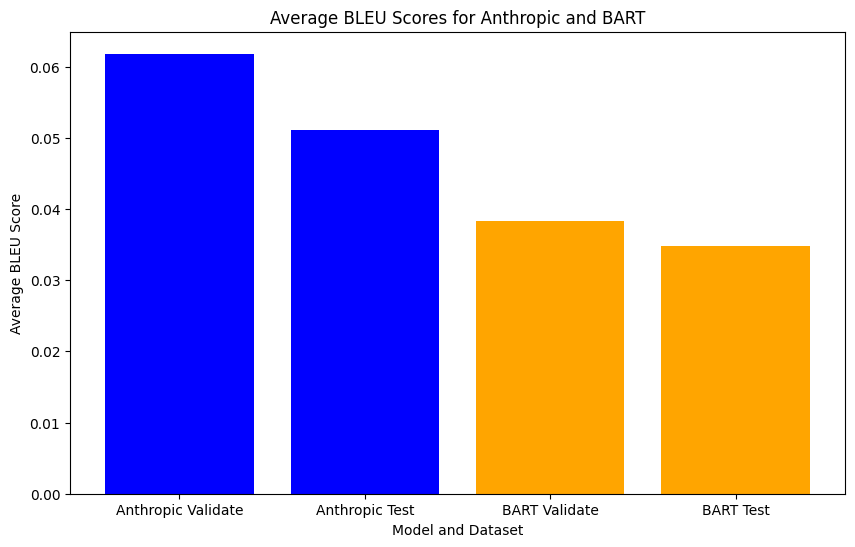

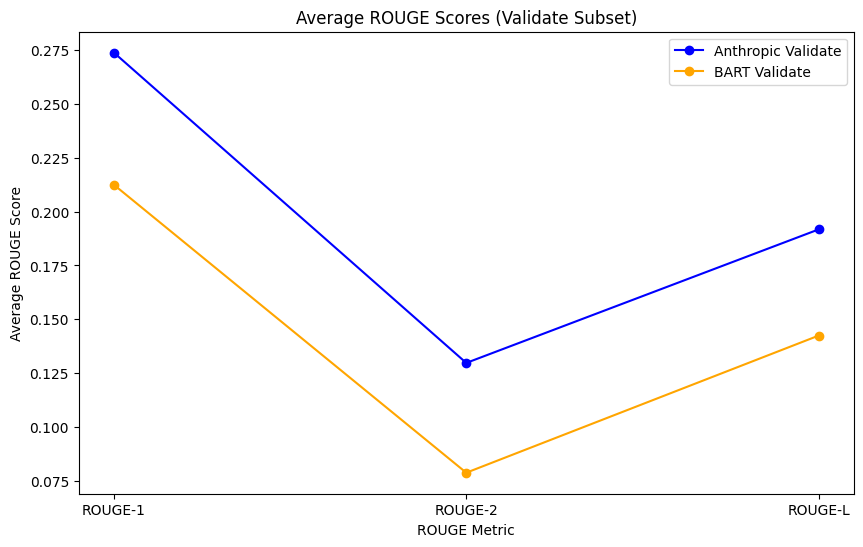

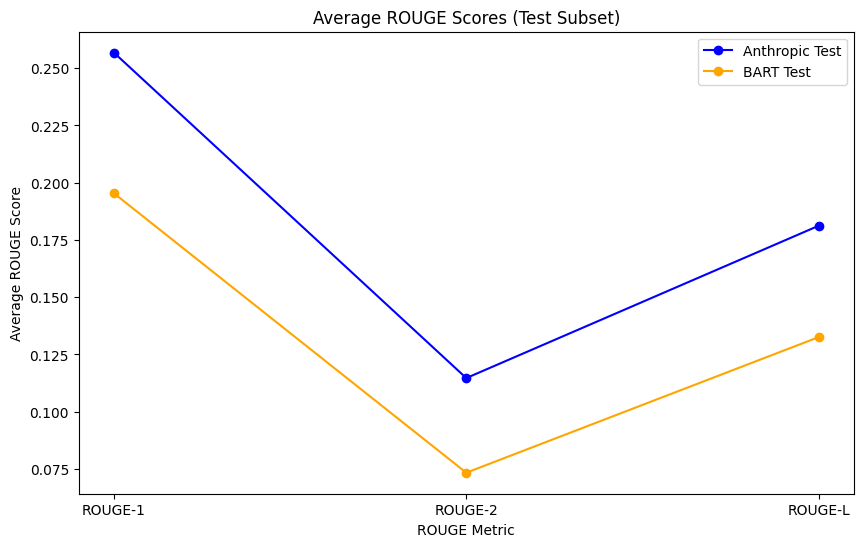

In [ ]:
import matplotlib.pyplot as plt

# Average BLEU Scores
bleu_scores = {
    'Anthropic': [validate_df_sample_500['bleu_score'].mean(), test_df_sample_500['bleu_score'].mean()],
    'BART': [generated_df_validate['bleu_score_validate'].mean(), generated_df_test['bleu_score_test'].mean()]
}

# Average ROUGE Scores
rouge_scores_validate_anthropic = [
    validate_df_sample_500['rouge1'].mean(),
    validate_df_sample_500['rouge2'].mean(),
    validate_df_sample_500['rougeL'].mean()
]
rouge_scores_test_anthropic = [
    test_df_sample_500['rouge1'].mean(),
    test_df_sample_500['rouge2'].mean(),
    test_df_sample_500['rougeL'].mean()
]

rouge_scores_validate_bart = [
    sum(score['rouge1'] for score in generated_df_validate['rouge_score_validate']) / len(generated_df_validate),
    sum(score['rouge2'] for score in generated_df_validate['rouge_score_validate']) / len(generated_df_validate),
    sum(score['rougeL'] for score in generated_df_validate['rouge_score_validate']) / len(generated_df_validate)
]
rouge_scores_test_bart = [
    sum(score['rouge1'] for score in generated_df_test['rouge_score_test']) / len(generated_df_test),
    sum(score['rouge2'] for score in generated_df_test['rouge_score_test']) / len(generated_df_test),
    sum(score['rougeL'] for score in generated_df_test['rouge_score_test']) / len(generated_df_test)
]

# Plot BLEU Scores
plt.figure(figsize=(10, 6))
plt.bar(['Anthropic Validate', 'Anthropic Test', 'BART Validate', 'BART Test'],
        [bleu_scores['Anthropic'][0], bleu_scores['Anthropic'][1], bleu_scores['BART'][0], bleu_scores['BART'][1]],
        color=['blue', 'blue', 'orange', 'orange'])
plt.xlabel('Model and Dataset')
plt.ylabel('Average BLEU Score')
plt.title('Average BLEU Scores for Anthropic and BART')
plt.show()

# Plot ROUGE Scores
rouge_labels = ['ROUGE-1', 'ROUGE-2', 'ROUGE-L']

# Validate Subset ROUGE Scores
plt.figure(figsize=(10, 6))
plt.plot(rouge_labels, rouge_scores_validate_anthropic, marker='o', label='Anthropic Validate', color='blue')
plt.plot(rouge_labels, rouge_scores_validate_bart, marker='o', label='BART Validate', color='orange')
plt.xlabel('ROUGE Metric')
plt.ylabel('Average ROUGE Score')
plt.title('Average ROUGE Scores (Validate Subset)')
plt.legend()
plt.show()

# Test Subset ROUGE Scores
plt.figure(figsize=(10, 6))
plt.plot(rouge_labels, rouge_scores_test_anthropic, marker='o', label='Anthropic Test', color='blue')
plt.plot(rouge_labels, rouge_scores_test_bart, marker='o', label='BART Test', color='orange')
plt.xlabel('ROUGE Metric')
plt.ylabel('Average ROUGE Score')
plt.title('Average ROUGE Scores (Test Subset)')
plt.legend()
plt.show()